
# 1. Imports

Please use environment <b> conda env:analysis3-24.07 </b>. Previous versions do not have xarray.DataTree that is required.

In [1]:
import numpy as np
import xarray as xr
import re
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
from functools import partial
import matplotlib as mpl
import pandas as pd
from importlib import reload

from dask.distributed import wait
import seaborn as sns

mkdir -p failed for path /scratch/v45/dr4292/tmp/.cache/matplotlib: [Errno 13] Permission denied: '/scratch/v45/dr4292/tmp/.cache'
Matplotlib created a temporary cache directory at /jobfs/162918510.gadi-pbs/matplotlib-5p4mq6fj because there was an issue with the default path (/scratch/v45/dr4292/tmp/.cache/matplotlib); it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
import matplotlib.gridspec as gridspec
from matplotlib.colors import BoundaryNorm
from matplotlib.colorbar import ColorbarBase
from scipy.stats import spearmanr

In [3]:
import time as _time

In [4]:
import operator

In [5]:
import os, sys

# My imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'time_of_emergene_drafts'))
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'time_of_emergene_drafts', 'src'))
import notebook_functions_05 as nf5
import constants
import toe_constants as toe_const
import toe_calc as toe
import toe_data_analysis as toe_data_an
import toe_plots
import plotting_utils
toe_calc = toe
import utils

from utils import logger
# logger = utils.get_notebook_logger()

import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
from dataclasses import dataclass
# from toe_plots import test_colors
from plotting_utils import create_discrete_colorbar, style_plot
from toe_plots import percent_emerged_series, METRIC_MAP,NAME_MAPPING

In [6]:
# client.close()

In [7]:
n_cpus = os.cpu_count()//2  # detects available CPUs dynamically
n_cpus

28

In [8]:
from dask.distributed import Client, wait
# client.close()
client = Client(threads_per_worker=1, n_workers=12, memory_limit=None)
# client = Client(threads_per_worker=4, n_workers=n_cpus//4, memory_limit=None)

client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 12
Total threads: 12,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34223,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:36477,Total threads: 1
Dashboard: /proxy/44669/status,Memory: 0 B
Nanny: tcp://127.0.0.1:33227,


###### Hidden Warnings

In [9]:
sys.stderr = open(os.devnull, 'w');

In [10]:
base_period = '1880_1909'
version = '04'#None

In [11]:
datasets = ['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']

In [12]:
SMALL_CHUNK_DICT = {
    'best_tas': {'time':-1, 'lat':180//3, 'lon':-1},
    'access': {'member': -1, 'time':-1, 'lon':144//6, 'lat':72//12},
}

LARGE_CHUNK_DICT = {
    'best_tas': {'time':-1, 'lat':180//2, 'lon':360/6},
    'access': {'member': -1, 'time':-1, 'lon':144//6, 'lat':72//8},
}

# 'era5': {'time':-1, 'lon':1440//12, 'lat':-1},
# 'access': {'time':-1, 'member':1, 'lat': -1, 'lon':-1}#144//3}

In [13]:
TOE_OUTPUT_PATH = f'/g/data/w40/ab2313/time_of_emergence/toe_output/{base_period}_v{version}'
TOE_OUTPUT_PATH

'/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04'

In [14]:
os.makedirs(TOE_OUTPUT_PATH, exist_ok=True)

In [15]:
notebook_ti = _time.time()

<h1 style='color:yellow'> 2. General Functions</h1>

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> Opening Files </h2>

In [147]:
def open_files_datatree(fname_dict,chunks=None, CHUNK_DICT=None, **kwargs):
    """
    Opens multiple NetCDF files and organizes them into a DataTree.
    ##### tree_name: str
    Parameters:
    - fname_dict (dict): Dictionary where keys are names and values are file paths.
    - tree_name (str): Name for the root of the DataTree.
    - **kwargs: Additional keyword arguments passed to `xr.open_dataset`.

    Returns:
    - xr.DataTree: A DataTree object containing the datasets.
    """
    def __get_chunks(name, CHUNK_DICT):
        if 'best' in name: return CHUNK_DICT['best_tas']
        elif 'access' in name: return CHUNK_DICT['access']
        elif 'access' in name: return CHUNK_DICT['access']
        return 'auto' 
        
    # if CHUNK_DICT is None: CHUNK_DICT = SMALL_CHUNK_DICT
    logger.info(fname_dict)
    logger.info(CHUNK_DICT)
    data_tree_dict = {}
    for name, path in fname_dict.items():
        # if chunks == 'dataset': chunks = CHUNK_DICT.get('era5' if 'era5' in name else 'best')
        chunk = __get_chunks(name, CHUNK_DICT) if CHUNK_DICT is not None else chunks
        print(f'{name} - {chunk}')
        ds = xr.open_dataset(path, **kwargs).chunk(chunk).persist()
        wait(ds);
        ds.attrs['name'] = name
        dt = xr.DataTree(ds, name=name)
        data_tree_dict[name] = dt
        
    tree = xr.DataTree.from_dict(data_tree_dict)
    # tree = xr.DataTree(name=tree_name, children=data_tree_dict)
    return tree

In [148]:
class FileNameManager:
    def __init__(self, file_names: list, root_path: str):
        """
        Initialize the FileNameManager with a list of file names and a root path.

        Parameters:
        - file_names (list): List of file name strings.
        - root_path (str): The root directory path.
        """
        self.file_names = file_names
        self.root_path = root_path

    def generate_dict(self, fname: str = None, extension: str = None) -> dict:
        """
        Generate a dictionary mapping a simplified name (from file_names) to full paths.
    
        Parameters:
        - fname (str, optional): File name to be appended to each directory.
        - extension (str, optional): If provided, only directories with this extension will be included.
    
        Returns:
        - dict: Dictionary with cleaned names as keys and full file paths as values.
        """
        file_dict = {}
    
        for f in self.file_names:
            if extension and not f.endswith(extension):
                continue  # Skip files that don't match the extension
    
            # Remove extension if it exists, then clean the name
            name = f.rsplit('.', 1)[0] if '.' in f else f
            name = name.split('(')[0].rstrip('_ ').strip()  # Remove anything after '(' and clean
    
            path = os.path.join(self.root_path, f, fname) if fname else os.path.join(self.root_path, f)
            file_dict[name] = path
    
        return file_dict

    def generate_dict_no_strip(self, fname: str) -> dict:
        """
        Generate a dictionary mapping a simplified name (from file_names) to full paths.

        Parameters:
        - fname (str): File name to be appended to each directory.

        Returns:
        - dict: Dictionary with simplified names as keys and full file paths as values.
        """
        return {
            f: os.path.join(self.root_path, f, fname)
            for f in self.file_names
        }
    def __repr__(self):
        return f'{self.root_path}' + f'\n----\n{self.file_names}'

In [149]:
# Get just the files that have the string 
all_files =  np.sort(os.listdir(constants.TOE_SAVE_DIR))
all_files

array(['.ipynb_checkpoints', 'access_ssp585_pr_(1880_1909)_02',
       'access_ssp585_pr_(1880_1909)_03',
       'access_ssp585_pr_(1880_1909)_04',
       'access_ssp585_pr_multi_base_period.zarr',
       'access_ssp585_pr_region_aggregationv2.zarr',
       'access_ssp585_tas_(1880_1909)_02',
       'access_ssp585_tas_(1880_1909)_04',
       'access_ssp585_tas_(1900_1929)_02',
       'access_ssp585_tas_(1900_1930)_02',
       'access_ssp585_tas_(1900_1930)_03',
       'access_ssp585_tas_multi_base_period_v4.zarr',
       'access_ssp585_tas_multi_base_period_v5_tmp.zarr',
       'access_ssp585_tas_region_aggregation.zarr',
       'best_tas_(1880_1909)_02', 'best_tas_(1880_1909)_04',
       'best_tas_(1920_1950)_16p0x16p0', 'best_tas_(1920_1950)_2p0x2p0',
       'best_tas_(1920_1950)_32p0x32p0', 'best_tas_(1920_1950)_4p0x4p0',
       'best_tas_(1920_1950)_8p0x8p0', 'best_tas_multi_base_period.zarr',
       'best_tas_region_aggregation.zarr', 'best_tas_regrid_conservative',
       'to_del

In [150]:
# def get_test_threshold(test: str, profile: "toe_const.ThresholdProfileBase") -> float | None:
#     """
#     Get the threshold value for a given test based on the specified threshold profile.

#     Parameters
#     ----------
#     test : str
#         The name of the test (e.g., 'ks', 'ks_bbs', 'ttest', 'mwu', 'sn', 'frac', etc.).
#     profile : toe_const.ThresholdProfileBase
#         An instance of the threshold profile containing threshold values.

#     Returns
#     -------
#     float or None
#         The threshold value associated with the test, or None if the test is unknown.
#     """
#     if "ks" in test or "ttest" in test or "mwu" in test: return profile.pvalue_threshold
#     elif "frac" in test: return profile.overlap_threshold
#     elif "hd" in test: return profile.hd_threshold
#     elif "sn" in test: return profile.sn_threshold
#     elif "pr" in test: return profile.pr
#     elif "ratar" in test: return profile.ratar

#     return None

In [151]:
# get_test_threshold('sn', toe_const.UNUSUAL_PROFILE)

In [152]:
print(((_time.time() - notebook_ti)/60))

31.98577662706375


<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> ToE Calculation </h2>

In [153]:
def check_for_null(ds): return not ds.dims and not ds.data_vars
def get_non_emergence(toe_ds): return xr.where(np.isnan(toe_ds), 1, 0)
# tree_subset_vars = lambda ds: None if check_for_null(ds) else ds[vars_with_multi_thresh]

In [154]:
def tree_subset_vars(ds, variables):
    current_vars = list(ds)
    overlapping_vars = list(set(current_vars) & set(variables))
    return ds[overlapping_vars]

In [155]:
def remove_vars(ds, variables_to_remove):
    current_vars = list(ds)
    vars_to_keeps = [var for var in current_vars if var not in variables_to_remove]
    return ds[vars_to_keeps]

In [156]:
def sign_final_time(toe_metrics_ds): 
    if check_for_null(toe_metrics_ds): return
    da = xr.where(toe_metrics_ds.sn_lowess_full.isel(time=-1) > 0, 1, -1)
    da.name = 'sign'
    ds = da.to_dataset()
    return ds

In [157]:
# Base function with shared keyword args
base_get_permanent_exceedance = partial(
    toe_calc.get_permanent_exceedance_multi_metrics, 
    end_slice=16,
    logginglevel='INFO'
)

# Specific variants for each threshold profile
partial_get_permanent_exceedance_unusual = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.UNUSUAL_PROFILE
)

partial_get_permanent_exceedance_unfamiliar = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.UNFAMILIAR_PROFILE
)

partial_get_permanent_exceedance_unknown = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.UNKNOWN_PROFILE
)

In [158]:
# Some partial fuctions for the different thresholds

partial_get_permanent_exceedance_unfamiliar_cross = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.UNFAMILIAR_PROFILE_CROSS)

partial_get_permanent_exceedance_unknown_cross = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.UNKNOWN_PROFILE_CROSS)

In [159]:

# partial_get_permanent_exceedance_ttest = partial(
#     base_get_permanent_exceedance,
#     threshold_profile=ThresholdProfileTTtest)

In [160]:
vars_with_multi_thresh =[
    'frac', 'hd', #'perkins',
    'sn_lowess_base', 'sn_lowess_full',
    'sn_mean', 'sn_mean_roll', 'sn_pi', 'sn_ens_med'
]

In [161]:
# for test in toe_metric_tree[list(toe_metric_tree)[1]]:
#     threshold = toe_const.UNUSUAL_PROFILE.threshold_for(test)
#     print(test, threshold)

In [162]:
toe_const.UNUSUAL_PROFILE

ThresholdProfile(sn_threshold=1, pvalue_threshold=0.01, overlap_threshold=62, hd_threshold=33, pr_threshold=2, ratar_threshold=2)

In [163]:
toe_const.UNUSUAL_PROFILE.threshold_for('sn')

1

<h1 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> 3. Creating Map Tree </h1>

### Maps

In [ ]:
files = [f'{f}_({base_period})_{version}' for f in datasets]
files

In [ ]:
os.listdir(os.path.join(constants.TOE_SAVE_DIR, files[1]))

In [ ]:
# files = [f for f in files if 'access_ssp585_r10i1p1f1_pr_QSJUN_(1959_1989' not in f]
# files

In [ ]:
base_file_manager = FileNameManager(files, constants.TOE_SAVE_DIR) #+ '/error')
base_file_manager

In [ ]:
fname_metric_dict = base_file_manager.generate_dict('toe_metrics.zarr')
fname_signal_dict = base_file_manager.generate_dict('signal.zarr')
fname_data_dict = base_file_manager.generate_dict('data.zarr')
data_availability_mask_dict = base_file_manager.generate_dict('data_availability_mask.zarr')

fname_data_dict

In [ ]:
# OPEN_KWARGS = dict(chunks=None, engine='zarr')
OPEN_KWARGS = dict(
    # chunks= None, # This should open in saved chunks
    #chunks={"time": -1},
    CHUNK_DICT=LARGE_CHUNK_DICT,
    consolidated=True, engine='zarr')         # always do this if the Zarr store has metadata

In [ ]:
%%time
toe_metric_tree = open_files_datatree(fname_metric_dict, **OPEN_KWARGS).persist()
wait(toe_metric_tree);

In [ ]:
# This ensures that all the metrics have the same length (S/N ratioes with LOWESS are longer)
# toe_metric_tree['access_ssp585_pr'] = toe_metric_tree['access_ssp585_pr'].isel(time=slice(None, -15))

In [ ]:
list(toe_metric_tree)

In [ ]:
data_tree = open_files_datatree(
    fname_data_dict, chunks=None, #CHUNK_DICT=LARGE_CHUNK_DICT, 
    engine='zarr', use_cftime=True).persist()
wait(data_tree);

In [ ]:
fname_signal_dict

In [ ]:
signal_tree = open_files_datatree(fname_signal_dict, **OPEN_KWARGS).persist()
wait(signal_tree);

In [ ]:
data_availability_tree = open_files_datatree(data_availability_mask_dict).compute()
wait(data_availability_tree);

In [ ]:
lsm_dict = {
    'best': '/g/data/w40/ab2313/time_of_emergence/best/best_mask.zarr',
    'access': '/g/data/w40/ab2313/time_of_emergence/access_lsm.zarr',
    # 'access_ssp585_pr': '/g/data/w40/ab2313/time_of_emergence/access_lsm.zarr'
}

In [ ]:
lsm_tree = open_files_datatree(lsm_dict).persist()
wait(lsm_tree);

In [ ]:
print(((_time.time() - notebook_ti)/60))

### PiControl

In [ ]:
constants.TOE_SAVE_DIR

In [ ]:
PI_CHUNKS = {'time':-1, 'lat':'auto', 'lon':'auto'}

In [ ]:
PICONTROL_PATH = os.path.join(constants.TOE_SAVE_DIR, f'access_ssp585_tas_(1880_1909)_{version}/piControl_tas.zarr')
PICONTROL_PATH_PR = os.path.join(constants.TOE_SAVE_DIR, f'access_ssp585_pr_(1880_1909)_{version}/piControl_pr.zarr')

In [ ]:
le_pi_ds = xr.open_dataset(PICONTROL_PATH, engine='zarr', use_cftime=True).chunk(PI_CHUNKS)#.persist()

In [ ]:
le_pi_precip_ds = xr.open_dataset(PICONTROL_PATH_PR, engine='zarr', use_cftime=True).chunk(PI_CHUNKS).persist()

In [ ]:
wait(le_pi_ds);
wait(le_pi_precip_ds);

In [ ]:
# Wrap into a DataTree
le_pi_tree = xr.DataTree.from_dict({
    "tas": le_pi_ds,
    "pr":  le_pi_precip_ds,
})

In [ ]:
le_pi_tree.tas.ds['tas'].isel(time=10).plot()

### Plot Demonstration

In [ ]:
fig = plt.figure(figsize=(12, 4))
axes = [fig.add_subplot(1, 3, i, projection=ccrs.PlateCarree()) for i in range(1, 4)]

for num,variable in enumerate(lsm_tree):
    lsm_tree[variable].ds.to_array().plot(ax=axes[num])
    axes[num].set_title(variable)

In [ ]:
toe_metric_tree.access_ssp585_pr.ttest.isel(lat=0, lon=0).plot(hue='member', add_legend=False);

In [ ]:
def view_tree_var_timeseries(toe_metric_tree, sel_kwargs=None, isel_kwargs=None):
    """
    Plot timeseries for all variables across all branches of a tree at a given selection.

    Parameters
    ----------
    toe_metric_tree : dict
        Dictionary where each key is a branch name and each value is a dataset of variables.
    sel_kwargs : dict, optional
        Selections to apply via `.sel()`. Example: {'lat': -39, 'lon': -145, 'method': 'nearest'}.
    isel_kwargs : dict, optional
        Selections to apply via `.isel()`. Example: {'member': 0, 'window': 0}.
    """
    if sel_kwargs is None:
        sel_kwargs = {}
    if isel_kwargs is None:
        isel_kwargs = {}

    # Collect all variables
    all_vars = sorted({var for branch_ds in toe_metric_tree.values() for var in branch_ds})
    var_to_row = {var: i for i, var in enumerate(all_vars)}

    branches = list(toe_metric_tree.keys())
    ncols = len(branches)
    nrows = len(all_vars)

    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols,
        figsize=(4*ncols, 3*nrows),
        sharex=True, sharey=False,
        squeeze=False
    )

    # Plot each variable
    for col, branch in enumerate(branches):
        branch_ds = toe_metric_tree[branch]
        for var, var_da in branch_ds.items():
            row = var_to_row[var]
            ax = axes[row, col]

            da_plot = var_da

            # Apply isel selections if dims exist
            valid_isel = {k: v for k, v in isel_kwargs.items() if k in da_plot.dims}
            if valid_isel:
                da_plot = da_plot.isel(**valid_isel)

            # Apply sel selections if coords exist
            valid_sel = {k: v for k, v in sel_kwargs.items() if k in da_plot.coords or k == "method"}
            if valid_sel:
                da_plot = da_plot.sel(**valid_sel)

            if "window" in da_plot.dims:
                windows = da_plot["window"].values
                lws = np.linspace(0.4, 2.0, len(windows))
                for lw, w in zip(lws, windows):
                    da_plot.sel(window=w).plot(
                        ax=ax, linewidth=lw, add_legend=False
                    )
            elif "member" in da_plot.dims:
                da_plot.plot(hue="member", add_legend=False, ax=ax)
            else:
                da_plot.plot(ax=ax)

            # if col == 0:
            #     ax.set_ylabel(var, fontsize=12)
            if row == 0:
                ax.set_title(branch)
            else:
                ax.set_title(None)

    for row, var in enumerate(all_vars): axes[row, 0].set_ylabel(var)
        
    fig.tight_layout()
    plt.show()


In [ ]:
def view_tree_var_maps(toe_metric_tree, isel_kwargs=None):
    """
    Plot all variables across all branches of a tree with optional selection.

    Parameters
    ----------
    toe_metric_tree : dict
        Dictionary where each key is a branch name and each value is a dataset of variables.
    isel_kwargs : dict, optional
        Dictionary of indices to select via `.isel()`. Example: {'time': 50, 'member': 0}.
    """
    if isel_kwargs is None:
        isel_kwargs = {}

    # Step 1: collect all variables across branches
    all_vars = sorted({var for branch_ds in toe_metric_tree.values() for var in branch_ds})
    var_to_row = {var: i for i, var in enumerate(all_vars)}

    branches = list(toe_metric_tree.keys())
    ncols = len(branches)
    nrows = len(all_vars)

    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols,
        figsize=(4*ncols, 3*nrows),
        subplot_kw={'projection': ccrs.PlateCarree()},
        squeeze=False
    )

    for col, branch in enumerate(branches):
        branch_ds = toe_metric_tree[branch]
        for var, var_da in branch_ds.items():
            row = var_to_row[var]
            ax = axes[row, col]

            da_plot = var_da
            # Apply user-specified isel if dims match
            valid_kwargs = {k: v for k, v in isel_kwargs.items() if k in da_plot.dims}
            if valid_kwargs:
                da_plot = da_plot.isel(**valid_kwargs)

            # Drop extras if still there
            if "member" in da_plot.dims:
                da_plot = da_plot.isel(member=0)
            if "window" in da_plot.dims:
                da_plot = da_plot.isel(window=0)

            da_plot.plot(ax=ax, transform=ccrs.PlateCarree(), robust=True)
            ax.coastlines()

            if col == 0:
                ax.annotate(
                    var, xy=(0, 0.5), xycoords="axes fraction",
                    ha="right", va="center", fontsize=12, rotation=90
                )
            if row == 0:
                ax.set_title(branch)
            else:
                ax.set_title(None)

    for row, var in enumerate(all_vars):
        axes[row, 0].annotate(
                    var, xy=(0, 0.5), xycoords="axes fraction",
                    ha="right", va="center", fontsize=12, rotation=90
                )

    fig.tight_layout()
    plt.show()

In [ ]:
sel_kwargs = {'lat': -39, 'lon': -145, 'method': 'nearest'}

In [ ]:
toe_metric_tree.access_ssp585_tas.ds.frac.sel(**sel_kwargs).isel(member=0).plot(hue='window')

In [ ]:
toe_metric_tree.access_ssp585_tas.ks_bbs_window

In [ ]:
view_tree_var_timeseries(
    toe_metric_tree,
    sel_kwargs=sel_kwargs,
    isel_kwargs={'member': 0}
)

In [ ]:
# with time dimension present
view_tree_var_maps(toe_metric_tree, isel_kwargs={'time': 50})

<h1 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> 4. Map Calculations </h1>

In [ ]:
print(((_time.time() - notebook_ti)/60))

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Local </h2>

### Calculation

In [ ]:
all_vars = np.array([var for branch_ds in toe_metric_tree.values() for var in branch_ds])
hypothesis_tests = np.array([v for v in all_vars if any(k in v for k in ['ks', 'ttest', 'mwu'])])
all_vars, hypothesis_tests

In [ ]:
non_threshold_tests = np.concatenate([hypothesis_tests, ['pr', 'ratar', 'ratar_low']])

In [ ]:
toe_tree = toe_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unusual).persist()

wait(toe_tree);

In [ ]:
toe_subset_metric_tree = toe_metric_tree.map_over_datasets(remove_vars, non_threshold_tests).persist()
wait(toe_subset_metric_tree);

In [ ]:
sign_tf_tree = toe_metric_tree.map_over_datasets(sign_final_time).persist()#.compute()
wait(sign_tf_tree);

In [ ]:
partial_get_permanent_exceedance_unfamiliar

In [ ]:
toe_unfamiliar = toe_subset_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unfamiliar).persist()
wait(toe_unfamiliar);

In [ ]:
toe_unknown = toe_subset_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unknown).persist()
wait(toe_unknown);

In [ ]:
# THe regions that do not everge (this is where there is no emergence at the final time step)
does_not_emerge_tree = toe_tree.map_over_datasets(get_non_emergence).compute()
does_not_emerge_unfamiliar_tree = toe_unfamiliar.map_over_datasets(get_non_emergence).compute()
does_not_emerge_unknown_tree = toe_unknown.map_over_datasets(get_non_emergence).compute()

In [ ]:
toe_frac_zero_tree = xr.DataTree.from_dict({
    b: toe.get_permanent_exceedance(toe_metric_tree[b].frac, 0.1, np.less_equal).compute().to_dataset()
    for b in toe_metric_tree
})

In [ ]:
toe_frac_50_tree = xr.DataTree.from_dict({
    b: toe.get_permanent_exceedance(toe_metric_tree[b].frac, 50, np.less_equal).compute().to_dataset()
    for b in toe_metric_tree
})

In [ ]:
np.array(list(toe_tree.access_ssp585_tas))

In [ ]:
# test_ds = toe_tree.access_ssp585_tas.ds

In [ ]:
reload(toe_calc)

In [ ]:
# Find when 50% have emergend. 
# For the ones without member, this will be the same, with member then 50%
toe_50pct_tree = toe_tree.map_over_datasets(toe_calc.calculate_percent_member_emergence).persist()
toe_50pct_unfamiliar_tree = toe_unfamiliar.map_over_datasets(toe_calc.calculate_percent_member_emergence).persist()
toe_50pct_unknown_tree = toe_unknown.map_over_datasets(toe_calc.calculate_percent_member_emergence).persist()

wait(toe_50pct_tree);

In [ ]:
# Make sure the coords are the same
np.testing.assert_equal(
    np.sort(np.array(list(toe_50pct_tree.access_ssp585_tas))),
    np.sort(np.array(list(toe_tree.access_ssp585_tas)))
)

In [ ]:
does_not_emerge_50pct_tree = toe_50pct_tree.map_over_datasets(get_non_emergence).compute()
does_not_emerge_50pct_unfamiliar_tree = toe_50pct_unfamiliar_tree.map_over_datasets(get_non_emergence).compute()
does_not_emerge_50pct_unknown_tree = toe_50pct_unknown_tree.map_over_datasets(get_non_emergence).compute()

In [ ]:
toe_50pct_tree

### Plot verify

In [ ]:
print(((_time.time() - notebook_ti)/60))

In [ ]:
def plot_var_maps_by_dim(da, loop_dim=None, sel_kwargs=None, isel_kwargs=None):
    """
    Plot maps for a single DataArray, one subplot per value of `loop_dim`.

    Parameters
    ----------
    da : xarray.DataArray
        Variable to plot.
    loop_dim : str, optional
        Dimension to iterate over (e.g., "window"). If None, just one map.
    sel_kwargs : dict, optional
        Selections for .sel().
    isel_kwargs : dict, optional
        Selections for .isel().
    """
    if sel_kwargs is None:
        sel_kwargs = {}
    if isel_kwargs is None:
        isel_kwargs = {}

    # Apply selections
    valid_isel = {k: v for k, v in isel_kwargs.items() if k in da.dims}
    if valid_isel:
        da = da.isel(**valid_isel)
    valid_sel = {k: v for k, v in sel_kwargs.items() if k in da.coords or k == "method"}
    if valid_sel:
        da = da.sel(**valid_sel)

    # Decide looping
    if loop_dim and loop_dim in da.dims:
        loop_vals = da[loop_dim].values
        n = len(loop_vals)
    else:
        loop_dim = None
        loop_vals = [None]
        n = 1

    # Layout: vertical stack
    fig, axes = plt.subplots(
        n, 1, figsize=(5, 4*n),
        subplot_kw={'projection': ccrs.PlateCarree()},
        squeeze=False
    )

    for i, val in enumerate(loop_vals):
        ax = axes[i, 0]  # because squeeze=False gives 2D array
        if loop_dim:
            da_plot = da.sel({loop_dim: val})
            da_plot.plot(ax=ax, transform=ccrs.PlateCarree(), robust=True)
            ax.set_title(f"{da.name} | {loop_dim}={val}")
        else:
            da.plot(ax=ax, transform=ccrs.PlateCarree(), robust=True)
            ax.set_title(str(da.name))
        ax.coastlines()

    fig.tight_layout()
    plt.show()


In [ ]:
toe_metric_tree.best_tas.hd.sel(lat=-39, lon=145, method='nearest').plot()

In [ ]:
toe_calc.get_exceedance_arg

In [ ]:
lat_lon_sp = dict(lat=-39, lon=145, method='nearest')

In [ ]:
arr1 = toe_metric_tree.best_tas.ks_bbs_window.isel(window=0).sel(**lat_lon_sp).values
arr2 = toe_metric_tree.best_tas.ks_bbs_window.isel(window=3).sel(**lat_lon_sp).values

In [ ]:
toe1 = toe_calc.get_exceedance_arg(arr1 ,time=np.arange(len(arr1)), threshold=0.02, comparison_func=np.less)

In [ ]:
toe2 = toe_calc.get_exceedance_arg(arr2,time=np.arange(len(arr2)), threshold=0.02, comparison_func=np.less)

In [ ]:
toe1, toe2

In [ ]:
fig, ax = plt.subplots()
ax.plot(arr1)
ax.plot(arr2)
ax.axhline(0.01, linestyle='--')
ax.axvline(toe1)
ax.axvline(toe2)

In [ ]:
toe_tree.best_tas.ks_bbs_window.isel(window=0).plot()#.plot()

In [ ]:
toe_tree.best_tas.ttest.plot()

In [ ]:
toe_tree.best_tas.ttest_window.isel(window=4).plot()#.plot()

In [ ]:
plot_var_maps_by_dim(
    toe_tree.best_tas.ds['ks_bbs_window'],
    loop_dim="window",
    sel_kwargs={'time': 50},
    # isel_kwargs={'member': 0}
)


In [ ]:
view_tree_var_maps(toe_tree) #, isel_kwargs={'time': 50})

<h2 style='color:green'> Time Series </h2>

In [ ]:
def percent_emerged_regions_over_tree(
    toe_tree: xr.DataTree,
    does_not_emerge_tree: xr.DataTree,
    lsm_tree: xr.DataTree,
    year_dict,
    logginglevel='ERROR'
) -> xr.DataTree:
    """
    Compute the percentage of emerged regions for each branch in the input trees.

    For each branch in `toe_metric_tree`, this function:
      - Converts corresponding branches in all input trees to xarray Datasets.
      - Calls `toe_data_an.percent_emerged_regions` to compute the percentage of emerged regions.
      - Stores the results in a dictionary and converts it into an xarray DataTree.

    Parameters:
        toe_metric_tree (xr.DataTree): Tree of metric data.
        toe_tree (xr.DataTree): Tree of toe data.
        does_not_emerge_tree (xr.DataTree): Tree of regions that do not emerge.
        lsm_tree (xr.DataTree): Tree of land surface mask data.

    Returns:
        xr.DataTree: A computed DataTree with time series of emerged region percentages.
    """
    utils.change_logginglevel(logginglevel)
    percent_time_dict = {}
    for branch in list(toe_metric_tree):
        
        logger.info(branch)
        model = branch.split('_')[0]
        lsm_da = lsm_tree[model].ds.to_array().squeeze('variable')
        
        time_series_branch_ds  = toe_data_an.percent_emerged_regions(
            toe_tree[branch].ds,
            does_not_emerge_tree[branch].ds,
            lsm_da,
            years = year_dict[branch],
            logginglevel='INFO'
        )
        time_series_branch_ds = time_series_branch_ds.compute()

        percent_time_dict[branch] = time_series_branch_ds
    
    emergence_time_series_50pct_tree = xr.DataTree.from_dict(percent_time_dict)
    return emergence_time_series_50pct_tree

In [ ]:
toe_data_an.percent_emerged_regions

In [ ]:
reload(toe_data_an)

In [ ]:
%%time
test_regions_ds = toe_data_an.percent_emerged_regions(
    toe_50pct_tree.best_tas.ds,
    does_not_emerge_tree.best_tas.ds,
    lsm_tree.best.ds.land_mask,
    years = toe_metric_tree.best_tas.time.dt.year.values,
    logginglevel='INFO').compute()

In [ ]:
year_dict = {branch: toe_metric_tree[branch].ds.time.dt.year.values for branch in toe_metric_tree}

In [ ]:
%%time
emergence_time_series_50pct_tree = percent_emerged_regions_over_tree(
    toe_50pct_tree,
    does_not_emerge_50pct_tree,
    lsm_tree,
    year_dict=year_dict
)

In [ ]:
%%time
emergence_time_series_50pct_unknown_tree = percent_emerged_regions_over_tree(
    toe_50pct_unknown_tree,
    does_not_emerge_50pct_unknown_tree,
    lsm_tree,     year_dict=year_dict

).compute()

In [ ]:
emergence_time_series_50pct_unfamiliar_tree = percent_emerged_regions_over_tree(
    toe_50pct_unfamiliar_tree,
    does_not_emerge_50pct_unfamiliar_tree,
    lsm_tree,     year_dict=year_dict

).compute()

In [ ]:
emergence_time_series_50pct_tree

In [ ]:
fig = plt.figure()
ax = fig.add_subplot()
emergence_time_series_50pct_tree['access_ssp585_tas']['sn_lowess_full'].isel(region=0).plot(ax=ax)#,hue='member', add_legend=False);
# ax.axvline(pd.Timestamp('2080-01-01'), color='k', linestyle='--', label='2080')

In [ ]:
emergence_time_series_50pct_tree['best_tas']['sn_lowess_full'].plot(hue='region');

In [ ]:
# toe_metric_median_tree = toe_metric_tree.median(dim='member').persist()
# wait(toe_metric_median_tree);

In [ ]:
# lsm_tree.best.land_mask.plot()

In [ ]:
# %%time
# toe_metric_median_tree = toe_metric_median_tree.chunk({'time':-1, 'lat':'auto', 'lon':'auto'}).persist()
# wait(toe_metric_median_tree)

In [ ]:
# tt = toe_calc.get_permanent_exceedance(
#     toe_metric_tree.access_ssp585_tas.ratar_low, threshold=2, comparison_func=np.greater).compute()

In [ ]:
# np.unique(tt.median(dim='member'))#.astype(int))

In [ ]:
# test_toe_metric_ds = toe_metric_tree.best_tas.ds
# test_toe_ds = toe_tree.best_tas.ds#.astype(int)
# test_does_not_emerge_ds = does_not_emerge_tree.best_tas.ds

In [ ]:
# test_toe_ds.sn_lowess_base.max()

In [ ]:
# ets_ds, be_ds, oo_ds = toe_data_an.percent_emerged(
#     test_toe_metric_ds,#[metric_subset],
#     test_toe_ds,#[metric_subset],
#     test_does_not_emerge_ds,
#     return_all=True)

In [ ]:
# oo_ds.lat.shape[0] * oo_ds.lon.shape[0]

In [ ]:
# be_ds.ks_window.sum(dim=['lat', 'lon']).plot(hue='window');

In [ ]:
# be_ds.sn_lowess_base.sum(dim=['lat', 'lon']).plot()

In [ ]:
# oo_ds.sn_lowess_base.plot()

In [ ]:
# ets_ds = ets_ds.compute()

In [ ]:
# ets_ds.sn_lowess_base.plot()

In [ ]:
# tt = toe_calc.get_permanent_exceedance(
#     toe_metric_tree.access_ssp585_tas.ratar_low, threshold=2, comparison_func=np.greater).compute()

In [ ]:
# np.unique(tt.median(dim='member'))#.astype(int))

In [ ]:
# test_toe_metric_ds = toe_metric_tree.access_ssp585_tas.ds.median(dim='member').chunk('auto')
# test_toe_ds = toe_tree.access_ssp585_tas.ds.median(dim='member').pipe(np.floor).chunk('auto')
# test_does_not_emerge_ds = does_not_emerge_tree.access_ssp585_tas.ds.median(dim='member').chunk('auto')

# reload(toe_data_an)

# test_toe_metric_ds.sn_lowess_base.isel(time=[0, 30, -10, -1]).plot(col='time')

# test_toe_metric_ds.sn_ens_med_pi.isel(time=[0, 30, -10, -1]).plot(col='time')

# test_toe_metric_ds.sn_ens_med_pi.sum(dim=['lat', 'lon']).plot()

# test_toe_metric_ds.sn_ens_med_pi.sel(lat=-39, lon=145, method='nearest').plot()
# test_toe_metric_ds.sn_lowess_base.sel(lat=-39, lon=145, method='nearest').plot()

# reload(toe_data_an)

# # Apply binary emergence calculation

# for var in test_toe_metric_ds:
#     print(var)
#     binary_emergence_ds = xr.apply_ufunc(
#         toe_data_an.calculate_returned_binary_ds,
#         test_toe_metric_ds[var],
#         test_toe_ds[var],
#         test_toe_metric_ds.time.dt.year.values,
#         input_core_dims=[['time'], [], ['time']],
#         output_core_dims=[['time']],
#         vectorize=True,
#         dask='parallelized'
#     ).compute()

# test_toe_ds['ratar_low'].plot()

# ets_ds, be_ds, oo_ds = toe_data_an.percent_emerged(
#     test_toe_metric_ds.compute(),#[metric_subset],
#     test_toe_ds.compute(),#[metric_subset],
#     test_does_not_emerge_ds.compute(),
#     return_all=True, logginglevel='DEBUG')

# ets_ds = ets_ds.compute()

# ets_ds.ks.plot()

In [ ]:
# emergence_time_series_50pct_tree = percent_emerged_regions_over_tree(
#     toe_metric_tree,
#     toe_tree,
#     does_not_emerge_tree,
#     lsm_tree
# )

In [ ]:
# toe_metric_tree.access_ssp585_tas

In [ ]:
# %%time
# emergence_time_series_50pct_unknown_tree = percent_emerged_regions_over_tree(
#     toe_subset_metric_tree,
#     toe_unknown,
#     does_not_emerge_unknown_tree,
#     lsm_tree)

In [ ]:
# emergence_time_series_50pct_unfamiliar_tree = percent_emerged_regions_over_tree(
#     toe_subset_metric_tree,
#     toe_unfamiliar,
#     does_not_emerge_unfamiliar_tree,
#     lsm_tree
# )

In [ ]:
# emergence_time_series_50pct_tree['access_ssp585_tas']['sn_lowess_full'].isel(member=0)#.plot(hue='region');

In [ ]:
# fig, axes = plt.subplots(3, 1)

# emergence_time_series_50pct_tree['access_ssp585_pr']['sn_lowess_base'].isel(member=0).plot(ax=axes[0], hue='region');
# emergence_time_series_50pct_unfamiliar_tree['access_ssp585_pr']['sn_lowess_full'].isel(member=0).plot(ax=axes[1], hue='region');
# emergence_time_series_50pct_unknown_tree['access_ssp585_pr']['sn_lowess_full'].isel(member=0).plot(ax=axes[2], hue='region');

In [ ]:
# fig, axes = plt.subplots(3, 1)

# emergence_time_series_50pct_tree['access_ssp585_tas']['sn_lowess_base'].isel(member=0).plot(ax=axes[0], hue='region');
# emergence_time_series_50pct_unfamiliar_tree['access_ssp585_tas']['sn_lowess_full'].isel(member=0).plot(ax=axes[1], hue='region');
# emergence_time_series_50pct_unknown_tree['access_ssp585_tas']['sn_lowess_full'].isel(member=0).plot(ax=axes[2], hue='region');

In [ ]:
# emergence_time_series_50pct_tree['access_ssp585_tas'].ds.sel(region='global').median(dim='member').to_array().plot(hue='variable');

In [ ]:
# emergence_time_series_50pct_tree['access_ssp585_tas'].ds.frac.median(dim='member').plot(hue='region');

In [ ]:
# emergence_time_series_50pct_tree.access_ssp585_tas.frac.plot(hue='region');

In [ ]:
# ets_ds.to_array().plot(hue='variable');

In [ ]:
# percent_time_dict = {}
# for branch in list(toe_metric_tree):
#     print(branch)
#     percent_time_dict[branch] = toe_data_an.percent_emerged_regions(
#         toe_metric_tree[branch].ds,
#         toe_tree[branch].ds,
#         does_not_emerge_tree[branch].ds,
#         best_lsm_ds if 'best' in branch else era_lsm_ds,
#         logginglevel='INFO'
#     )

# emergence_time_series_50pct_tree = xr.DataTree.from_dict(percent_time_dict)

In [ ]:
# emergence_time_series_50pct_tree = emergence_time_series_50pct_tree.compute()

In [ ]:
# def calculate_returned_binary_ds(year_of_emergence, time_years):
#     """
#     Calculates a binary array representing when emergence has occurred.

#     Parameters
#     ----------
#     year_of_emergence : float or int
#         The year of emergence at a grid cell.
#     time_years : array-like
#         Array of time coordinates (years) to compare against.

#     Returns
#     -------
#     np.ndarray
#         Binary array (same length as time_years), with 0 before emergence,
#         and 1 from the year of emergence onward.
#     """

#     # --- Fix for xarray apply_ufunc wrapping kwargs in tuples ---
#     if isinstance(time_years, tuple):
#         time_years = time_years[0]
#     time_years = np.asarray(time_years)

#     # Handle missing or invalid input
#     if np.isnan(year_of_emergence): return np.full_like(time_years, np.nan)

#     # Ensure integer comparison
#     year_of_emergence = int(year_of_emergence)
#     time_years = time_years.astype(int)

#     # Find where emergence occurs in the time axis
#     if year_of_emergence not in time_years:
#         raise RuntimeError(
#             f"Year of emergence {year_of_emergence} not in available years {time_years}"
#         )

#     idx = np.where(time_years == year_of_emergence)[0][0]

#     # Create binary array: 0 before, 1 after emergence
#     binary = np.zeros_like(time_years, dtype=int)
#     binary[idx:] = 1
#     return binary


In [ ]:
# toe_ds = toe_50pct_tree.best_tas.ds

# years = toe_metric_tree.best_tas.time.dt.year.values,

# binary_emergence_ds = xr.apply_ufunc(
#     calculate_returned_binary_ds,
#     toe_ds,#.sel(lat=slice(-39, -30), lon=slice(145, 150))[['ks', 'frac']],
#     input_core_dims=[[]],
#     output_core_dims=[["time"]],
#     kwargs={"time_years": years},
#     output_sizes={'time': len(years)},
#     vectorize=True,
#     dask="parallelized",
#     output_dtypes=[int]
# ).compute()


<h2 style='color:green'>  Cross values </h2>

In [ ]:
print(((_time.time() - notebook_ti)/60))

In [ ]:
from itertools import permutations
from dataclasses import dataclass
import toe_data_analysis
reload(toe_data_analysis)

In [ ]:
@dataclass(frozen=True)
class MetricPair:
    metric: str
    toe: str

In [ ]:
def cross_emergence(toe_metric_da, toe_da):
    """
    Calculate the value of a metric (X) at the time of emergence (TOE) for a given dataset.

    Parameters
    ----------
    toe_metric_da : xarray.DataArray
        The data array containing the metric (X) time series from which the value at the TOE is calculated.
        It should have a 'time' dimension.
    toe_da : xarray.DataArray
        The data array representing the year of emergence (TOE). This defines the time point for which
        the value of the metric is calculated.
    
    Returns
    -------
    xarray.DataArray
        A DataArray containing the value of the metric at the time of emergence.
    """
    
    toe_x_at_y = xr.apply_ufunc(
        toe_data_analysis.find_value_at_emergence_arg,
        toe_metric_da, # Time series
        toe_da, # Year of emergence
        kwargs = {'time_years': toe_metric_da.time.dt.year.values},
        input_core_dims = [['time'], []],
        output_core_dims=[[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float])
    
    return toe_x_at_y

In [ ]:
def cross_emergence_all_perms(toe_metric_ds, toe_ds, filtered_pairs, apply_median=False):
    """
    Generate a dataset of metric values (X) at the time of emergence (TOE) for all valid metric-TOE pairs.

    Parameters
    ----------
    toe_metric_ds : xarray.Dataset
        A dataset containing various metrics (X) as time series data.
    toe_ds : xarray.Dataset
        A dataset containing the time of emergence (TOE) for corresponding metrics.

    Returns
    -------
    xarray.Dataset
        A dataset where each variable represents a metric value (X) at its corresponding time of emergence (TOE).
        The variable names are in the format '<metric>_at_<toe>_emergence'.
        Returns None if `toe_metric_ds` contains null values.
    """
    # Check if the input dataset contains null values; exit early if so
    if check_for_null(toe_metric_ds):  return

    if apply_median and 'member' in list(toe_ds): 
        toe_metric_ds = toe_metric_ds.median(dim='member')
        toe_ds = toe_ds.median(dim='member')

    
    x_at_y_emergence_dict = {}
    for pair in filtered_pairs:
        name = f'{pair.metric}_at_{pair.toe}_emergence'
        try:
            x_at_y_emergence_da = cross_emergence(
                toe_metric_ds[pair.metric],  # Metric time series
                toe_ds[pair.toe]            # Year of emergence
            ).compute()  # Compute the result to ensure it's not lazy (useful for Dask arrays)
        except KeyError:
            pass # Pair does not exist

        x_at_y_emergence_dict[name] = x_at_y_emergence_da # pari old key
    x_at_y_emergence_ds = xr.Dataset(x_at_y_emergence_dict)
    
    return x_at_y_emergence_ds


In [ ]:
metrics_test_ds = toe_metric_tree['access_ssp585_tas'].ds['frac'].median(dim='member').compute()
toe_test_ds = toe_unfamiliar['access_ssp585_tas'].ds['sn_lowess_base'].median(dim='member').compute().astype(int)

In [ ]:
toe_metric_tree

In [ ]:
# toe_metric_tree['access_ssp585_tas'].ds['quantile'].values#['frac']

In [ ]:
test_cross = xr.apply_ufunc(
        toe_data_analysis.find_value_at_emergence_arg,
        metrics_test_ds, # Time series
        toe_test_ds, # Year of emergence
        kwargs = {'time_years': metrics_test_ds.time.dt.year.values},
        input_core_dims = [['time'], []],
        output_core_dims=[[]],
        vectorize=True,
        # dask='parallelized',
        # output_dtypes=[float]
).compute()
    

In [ ]:
test_cross.median()

In [ ]:
td = cross_emergence(
    metrics_test_ds.squeeze(), toe_test_ds.squeeze()
).compute()

In [ ]:
td = cross_emergence(
    toe_metric_tree['best_tas'].ds['sn_lowess_base'],
    toe_tree['best_tas'].ds['ks_window']
).compute()

In [ ]:
dict(zip(td['window'].values, td.median(dim=["lat","lon"]).values))

In [ ]:
td.plot(col='window', col_wrap=3, robust=True)

In [ ]:
toe_data_an.find_value_at_emergence_arg

In [ ]:
# --- Generate all permutations of metrics ---
from itertools import permutations

In [ ]:
# These are the only metrics I want this applied to 
cross_metrics = np.array(
    [
        'sn_lowess_base', 'frac', 'hd', 'ks',  'ttest',  'mwu', 'ks_bbs', 'ttest_bbs',
        'ttest_window', 'ks_window','ks_bbs_window', 'ttest_bbs_window'
    ])

print(f"\nTotal metrics to consider: {len(cross_metrics)}")
print(f"Metrics: {', '.join(cross_metrics)}")

# Get the permutations of all metrics, but not when a is ttest or ks
print("\nGenerating all metric permutations (excluding self-pairs)...")
filtered_pairs = np.array([
    MetricPair(metric, toe)
    for metric, toe in permutations(cross_metrics, 2)
    if (metric not in hypothesis_tests)
])


filtered_pairs_no_hyp = [fp for fp in filtered_pairs if ((fp.metric not in hypothesis_tests) and (fp.toe not in hypothesis_tests))]

# filtered_pairs_no_hyp = np.array([
#     MetricPair(metric, toe)
#     for metric, toe in permutations(cross_metrics, 2)
#     if ((metric not in hypothesis_tests) and (toe not in hypothesis_tests))
# ])

print(f"Remaining pairs after both filters: {len(filtered_pairs_no_hyp)}")

print(f"\nFirst pair metric: {filtered_pairs_no_hyp[0].metric}")
print(f"First pair object: {filtered_pairs_no_hyp[0]}")
print(f"First three pairs: {filtered_pairs_no_hyp[:3]}")
print(f"Length of filtered_pairs: {len(filtered_pairs_no_hyp)}")

In [ ]:
filtered_pairs_no_hyp

In [ ]:
x_at_y_emergence_tree = xr.map_over_datasets(
    partial(
        cross_emergence_all_perms, filtered_pairs=filtered_pairs, apply_median=False),
    toe_metric_tree,
    toe_tree
)

In [ ]:
x_at_y_emergence_unfamiliar_tree = xr.map_over_datasets(
    partial(
        cross_emergence_all_perms, filtered_pairs=filtered_pairs_no_hyp,apply_median=False),
    toe_metric_tree,
    toe_unfamiliar
)

In [ ]:
x_at_y_emergence_unknown_tree = xr.map_over_datasets(
    partial(
        cross_emergence_all_perms, filtered_pairs=filtered_pairs_no_hyp, apply_median=False),
    toe_metric_tree,
    toe_unknown
)

In [ ]:
x_at_y_emergence_unknown_tree.access_ssp585_tas.frac_at_sn_lowess_base_emergence.median().values.item()

In [ ]:
x_at_y_emergence_unknown_tree.access_ssp585_tas.sn_lowess_base_at_frac_emergence.median().values.item()

In [ ]:
x_at_y_emergence_tree.best_tas.sn_lowess_base_at_ks_window_emergence.median(dim=['lat', 'lon'])

In [ ]:
x_at_y_emergence_tree.best_tas.sn_lowess_base_at_ks_bbs_window_emergence.median(dim=['lat', 'lon'])

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
x_at_y_emergence_tree['best_tas'].ds['sn_lowess_base_at_ks_emergence'].plot(vmin=0.8, vmax=2, ax=ax)
ax.coastlines()

In [ ]:
x_at_y_emergence_tree['best_tas'].ds['sn_lowess_base_at_ks_emergence'].plot(robust=True)

In [ ]:
x_at_y_emergence_tree['best_tas'].ds.mean().to_array()

In [ ]:
toe_tree.best_tas.frac.plot()

In [ ]:
toe_frac_zero_tree

In [ ]:
cross_emergence

In [ ]:
# sn_at_zero_overlap = cross_emergence(
#     toe_metric_tree.access_ssp585_tas.sn_lowess_base,
#     toe_frac_zero_tree.access_ssp585_tas
# ).compute().to_array()

# sn_at_zero_overlap.name = 'sn_lowess_base'

In [ ]:
# sn_at_50_overlap = cross_emergence(
#     toe_metric_tree.access_ssp585_tas.sn_lowess_base,
#     toe_frac_50_tree.access_ssp585_tas
# ).compute().to_array()

# sn_at_50_overlap.name = 'sn_lowess_base'

In [ ]:
# sn_at_zero_overlap.median(), sn_at_50_overlap.median()

In [ ]:
# sn_at_zero_overlap.isel(member=0).plot()#.plot()

In [ ]:
# x_at_y_emergence_with_member_tree = xr.map_over_datasets(
#     partial(
#         cross_emergence_all_perms, filtered_pairs=filtered_pairs, apply_median=False),
#     toe_metric_tree,
#     toe_tree
# )

# x_at_y_emergence_with_member_tree.access_ssp585_tas.sn_lowess_base_at_frac_emergence.median().values.item()

# x_at_y_emergence_with_member_tree.access_ssp585_tas.sn_lowess_base_at_frac_emergence.median(dim='member').plot()


# x_at_y_emergence_with_member_tree.access_ssp585_tas.frac_at_sn_lowess_base_emergence.median(dim='member').plot()


In [ ]:
# hypothesis_tests = {'ks', 'ttest'}
# hypothesis_tests = [test for test in cross_metrics if (('ks' in test) or ('ttest' in test) or ('mwu' in test))]
# hypothesis_tests

<h2 style='color:green'> Saving data </h2>

In [ ]:
# TOE_OUTPUT_PATH = f'/g/data/w40/ab2313/time_of_emergence/toe_output/{base_period}_{version}'

In [ ]:
# toe_all_tree = xr.DataTree.from_dict(
#     {'unusual': toe_tree, 'unfamiliar': toe_unfamiliar, 'unknown' :toe_unknown})


# toe_all_tree = toe_all_tree.compute()
# TOE_NAME = os.path.join(TOE_OUTPUT_PATH, f'toe_{base_period}_v{version}.zarr')
# print(TOE_NAME)

# toe_all_tree.compute().to_zarr(TOE_NAME, mode='w')

In [ ]:
# Core ToE results
toe_all_tree = xr.DataTree.from_dict({
    "unusual": toe_tree,
    "unfamiliar": toe_unfamiliar,
    "unknown": toe_unknown,
})

# Fraction-based thresholds
toe_frac_tree = xr.DataTree.from_dict({
    "zero": toe_frac_zero_tree,
    "fifty": toe_frac_50_tree,
})

# 50% emergence threshold results
toe_50pct_tree_all = xr.DataTree.from_dict({
    "unusual": toe_50pct_tree,
    "unfamiliar": toe_50pct_unfamiliar_tree,
    "unknown": toe_50pct_unknown_tree,
})

# 50% “does not emerge” cases
toe_dne_50pct_tree = xr.DataTree.from_dict({
    "unusual": does_not_emerge_50pct_tree,
    "unfamiliar": does_not_emerge_50pct_unfamiliar_tree,
    "unknown": does_not_emerge_50pct_unknown_tree,
})

# 50% emergence time series
emergence_time_series_50pct_tree = xr.DataTree.from_dict({
    "unusual": emergence_time_series_50pct_tree,
    "unfamiliar": emergence_time_series_50pct_unfamiliar_tree,
    "unknown": emergence_time_series_50pct_unknown_tree,
})

# X@Y emergence datasets
toe_xaty_tree = xr.DataTree.from_dict({
    "unusual": x_at_y_emergence_tree,
    "unfamiliar": x_at_y_emergence_unfamiliar_tree,
    "unknown": x_at_y_emergence_unknown_tree,
})

# General “does not emerge” (non-50%)
toe_dne_tree = xr.DataTree.from_dict({
    "unusual": does_not_emerge_tree,
    "unfamiliar": does_not_emerge_unfamiliar_tree,
    "unknown": does_not_emerge_unknown_tree,
})


In [ ]:
# # Compute everything first
# toe_all_tree = toe_all_tree.compute()
# toe_subset_metric_tree = toe_subset_metric_tree.compute()
# sign_tf_tree = sign_tf_tree.compute()
# toe_frac_tree = toe_frac_tree.compute()
# toe_50pct_tree_all = toe_50pct_tree_all.compute()
# toe_dne_50pct_tree = toe_dne_50pct_tree.compute()
# emergence_time_series_50pct_tree = emergence_time_series_50pct_tree.compute()
# toe_xaty_tree = toe_xaty_tree.compute()
# toe_dne_tree = toe_dne_tree.compute()

# data_availability_tree = data_availability_tree.compute()
# signal_tree = signal_tree.compute()
# lsm_tree = lsm_tree.compute()
# toe_metric_tree = toe_metric_tree.compute()
# le_pi_tree = le_pi_tree.compute()


In [ ]:
SAVE_KWARGS = dict(mode='w', compute=True, consolidated=True)

In [ ]:
toe_all_tree = toe_all_tree.compute()
toe_all_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"toe_all.zarr"), **SAVE_KWARGS)

In [ ]:
toe_subset_metric_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"toe_subset_metric.zarr"), **SAVE_KWARGS)
sign_tf_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"sign_tf.zarr"), **SAVE_KWARGS)
toe_frac_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"toe_frac.zarr"), **SAVE_KWARGS)
toe_50pct_tree_all.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"toe_50pct.zarr"), **SAVE_KWARGS)
toe_dne_50pct_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"does_not_emerge_50pct.zarr"), **SAVE_KWARGS)
emergence_time_series_50pct_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"emergence_time_series_50pct.zarr"), **SAVE_KWARGS)
toe_xaty_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"x_at_y_emergence.zarr"), **SAVE_KWARGS)
toe_dne_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"does_not_emerge.zarr"), **SAVE_KWARGS)

In [ ]:
data_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"data.zarr"), **SAVE_KWARGS)

In [ ]:
toe_metric_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"toe_metric.zarr"), **SAVE_KWARGS)
signal_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"signal.zarr"), **SAVE_KWARGS)
data_availability_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"data_availability.zarr"), **SAVE_KWARGS)
lsm_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"lsm.zarr"), **SAVE_KWARGS)
le_pi_tree.compute().to_zarr(os.path.join(TOE_OUTPUT_PATH, f"le_pi.zarr"), **SAVE_KWARGS)

<h1 style='color:cyan'> 5. Opening Saved Calculations </h1>

In [16]:
# TOE_OUTPUT_PATH = f'/g/data/w40/ab2313/time_of_emergence/toe_output/{base_period}_{version}'

In [17]:
os.listdir(TOE_OUTPUT_PATH)

['toe_50pct.zarr',
 'toe_subset_metric.zarr',
 'data.zarr',
 'toe_metric.zarr',
 'x_at_y_emergence.zarr',
 'emergence_time_series_50pct.zarr',
 'toe_all.zarr',
 'sign_tf.zarr',
 'does_not_emerge_50pct.zarr',
 '__to_delete',
 'le_pi.zarr',
 'toe_frac.zarr',
 'data_availability.zarr',
 'signal.zarr',
 '.ipynb_checkpoints',
 'lsm.zarr',
 'does_not_emerge.zarr']

In [18]:
# Opening the files then adding them to globals

for folder in os.listdir(TOE_OUTPUT_PATH):
    if folder.endswith(".zarr"):
        name = folder.replace(f".zarr", "")
        var_name = f"{name}_tree"
        path = os.path.join(TOE_OUTPUT_PATH, folder)

        print(f"Opening {var_name}:\n{path}\n")
        globals()[var_name] = xr.open_datatree(path, engine="zarr")


Opening toe_50pct_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/toe_50pct.zarr

Opening toe_subset_metric_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/toe_subset_metric.zarr

Opening data_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/data.zarr

Opening toe_metric_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/toe_metric.zarr

Opening x_at_y_emergence_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/x_at_y_emergence.zarr

Opening emergence_time_series_50pct_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/emergence_time_series_50pct.zarr

Opening toe_all_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/toe_all.zarr

Opening sign_tf_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/sign_tf.zarr

Opening does_not_emerge_50pct_tree:
/g/data/w40/ab2313/time_of_emergence/toe_output/1880_1909_v04/does_not_emerge_50pct.zarr

Opening 

In [19]:
toe_50pct_tree_all = toe_50pct_tree.copy()
toe_xaty_tree = x_at_y_emergence_tree.copy()
toe_dne_50pct_tree = does_not_emerge_50pct_tree.copy()
toe_dne_tree = does_not_emerge_tree.copy()
emergence_time_series_50pct_tree_all = emergence_time_series_50pct_tree.copy()

In [20]:
# LEGACY
# THis is the old naming. Everything is now much larger trees. This can be replaced
# However, this is still here so code still works.

# Core ToE
toe_tree = toe_all_tree["unusual"]
toe_unfamiliar = toe_all_tree["unfamiliar"]
toe_unknown = toe_all_tree["unknown"]

# Fraction-based
toe_frac_zero_tree = toe_frac_tree["zero"]
toe_frac_50_tree = toe_frac_tree["fifty"]

# 50% emergence threshold results
toe_50pct_tree_unusual = toe_50pct_tree_all["unusual"]
toe_50pct_unfamiliar_tree = toe_50pct_tree_all["unfamiliar"]
toe_50pct_unknown_tree = toe_50pct_tree_all["unknown"]
toe_50pct_tree = toe_50pct_tree_unusual  # alias for old code

# 50% “does not emerge” cases
does_not_emerge_50pct_tree_unusual = toe_dne_50pct_tree["unusual"]
does_not_emerge_50pct_unfamiliar_tree = toe_dne_50pct_tree["unfamiliar"]
does_not_emerge_50pct_unknown_tree = toe_dne_50pct_tree["unknown"]
does_not_emerge_50pct_tree = does_not_emerge_50pct_tree_unusual

# 50% emergence time series
emergence_time_series_50pct_tree_unusual = emergence_time_series_50pct_tree["unusual"]
emergence_time_series_50pct_unfamiliar_tree = emergence_time_series_50pct_tree["unfamiliar"]
emergence_time_series_50pct_unknown_tree = emergence_time_series_50pct_tree["unknown"]
emergence_time_series_50pct_tree = emergence_time_series_50pct_tree_unusual

# X@Y emergence datasets
x_at_y_emergence_tree_unusual = toe_xaty_tree["unusual"]
x_at_y_emergence_unfamiliar_tree = toe_xaty_tree["unfamiliar"]
x_at_y_emergence_unknown_tree = toe_xaty_tree["unknown"]
x_at_y_emergence_tree = x_at_y_emergence_tree_unusual

# General “does not emerge” (non-50%)
does_not_emerge_tree_unusual = toe_dne_tree["unusual"]
does_not_emerge_unfamiliar_tree = toe_dne_tree["unfamiliar"]
does_not_emerge_unknown_tree = toe_dne_tree["unknown"]
does_not_emerge_tree = does_not_emerge_tree_unusual


In [21]:
def mask_tree(tree, threshold):
    for child_name in tree.children:
        child = tree[child_name]
        for grandchild_name in child.children:
            grandchild = child[grandchild_name]
            if grandchild.ds is not None:
                grandchild.ds = grandchild.ds.where(grandchild.ds <= threshold)
    return tree


In [22]:
toe_50pct_tree_all = mask_tree(toe_50pct_tree_all, 2080)

<h1 style='color:cyan'> 6. Open Region Aggregation  Data</h1>

In [ ]:
region_agg_dict ={
 'access_ssp585_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_tas_region_aggregation.zarr',
 'access_ssp585_pr': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_pr_region_aggregationv2.zarr',
 'best_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/best_tas_region_aggregation.zarr'
}

In [ ]:
region_agg_tree = open_files_datatree(
    region_agg_dict, engine='zarr', chunks='auto').compute()

In [ ]:
region_agg_tree

In [ ]:
metric_region_agg_tree = region_agg_tree.map_over_datasets(tree_subset_vars, ['sn', 'ks', 'frac']).compute()
metric_region_agg_tree_no_hype = region_agg_tree.map_over_datasets(tree_subset_vars, ['sn', 'frac']).compute()

In [ ]:
toe_region_agg_unknown = metric_region_agg_tree_no_hype.map_over_datasets(
    partial_get_permanent_exceedance_unknown).compute()

In [ ]:
toe_region_agg_unfamiliar = metric_region_agg_tree_no_hype.map_over_datasets(
    partial_get_permanent_exceedance_unfamiliar).compute()

In [ ]:
toe_region_agg = metric_region_agg_tree.map_over_datasets(
    partial_get_permanent_exceedance_unusual).compute()

In [ ]:
print(((_time.time() - notebook_ti)/60))

<h1 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> 7. Plots </h1>

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Set-up </h2>

In [115]:
def add_data_clarity_legend(ax, elements=(0, 1),
                            bbox_to_anchor=(0.42, -0.02),
                            fontsize=10, ncol=2, fontscale=1):
    """
    Add legend for clarity markers (choose with `elements`).
    elements: tuple of indices (0='Not Enough Data', 1='Does Not Emerge')
    """
    all_elements = [
        plt.Rectangle([0, 0], 1, 1, fc='white', hatch='//', edgecolor='black', lw=0.5),
        plt.Rectangle([0, 0], 1, 1, fc='grey', alpha=0.5)
    ]
    all_labels = ['Not Enough Data', 'Does Not Emerge']

    chosen_elements = [all_elements[i] for i in elements]
    chosen_labels = [all_labels[i] for i in elements]

    legend = ax.legend(
        chosen_elements, chosen_labels, loc='upper center',
        bbox_to_anchor=bbox_to_anchor, fontsize=fontsize*fontscale, ncol=ncol
    )
    return legend


In [116]:
@dataclass
class PlotLevels:
    start: int
    stop: int
    step: int

    def generate_range(self):
        """Generate a numpy array based on the start, stop, and step."""
        return np.arange(self.start, self.stop, self.step)

In [117]:
std_cmap = 'OrRd'
std_levels = np.arange(0, 2.75, .25)

In [118]:
start = 1880#toe_metric_tree.best_tas.time.dt.year.values[0]-5
step = 10

PLOT_LEVELS = {
    # 'best_tas': PlotLevels(start=start, stop=2020+5, step=10).generate_range(),
    'access_ssp585_tas':PlotLevels(start=start, stop=2090+step, step=step).generate_range()
}

PLOT_LEVELS['best_tas'] = PLOT_LEVELS['access_ssp585_tas']
PLOT_LEVELS['access_ssp585_pr'] = PLOT_LEVELS['access_ssp585_tas']

PLOT_LEVELS

{'access_ssp585_tas': array([1880, 1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980,
        1990, 2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]),
 'best_tas': array([1880, 1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980,
        1990, 2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]),
 'access_ssp585_pr': array([1880, 1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980,
        1990, 2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090])}

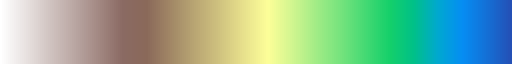

In [119]:
# Just terrain but missing last color. This is jsut so that green lines up with the year 2000
cmap_list = plt.cm.terrain_r(np.linspace(0, 1, len(PLOT_LEVELS['best_tas'])+1))
cmap_list = cmap_list[:-1]
my_cmap = mpl.colors.LinearSegmentedColormap.from_list('terrain_2' ,cmap_list)
my_cmap

In [120]:
reload(toe_plots)

<module 'toe_plots' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_plots.py'>

In [121]:
from toe_plots import main_toe_metrics, main_toe_metrics_no_hype, regions, metrics_dict

In [122]:
metrics_dict['all_no_hype']

array(['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi',
       'sn_lowess_roll', 'sn_mean_base', 'sn_mean_pi', 'sn_mean_roll',
       'sn_poly4_base', 'sn_poly_pi', 'sn_ens_med_base', 'sn_ens_med_pi',
       'frac', 'hd'], dtype='<U15')

In [123]:
def destroy_ax(ax):
    ax.cla()  # Clears the contents of the axis
    ax.set_facecolor('white')  # Sets the background color to white
    ax.set_xticks([])  # Removes x-axis ticks
    ax.set_yticks([])  # Removes y-axis ticks
    ax.set_frame_on(False)  # Hides the border/frame (optional)

In [124]:
metrics_dict['all']

array(['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi',
       'sn_lowess_roll', 'sn_mean_base', 'sn_mean_pi', 'sn_mean_roll',
       'sn_poly4_base', 'sn_poly_pi', 'sn_ens_med_base', 'sn_ens_med_pi',
       'ks', 'ks_bbs', 'ttest', 'frac', 'hd'], dtype='<U15')

In [125]:
# # Specific variants for each threshold profile
# partial_get_permanent_exceedance_unusual = partial(
#     base_get_permanent_exceedance,
#     threshold_profile=toe_const.UNUSUAL_PROFILE,
#     logginglevel='DEBUG'
# )
# toe_metric_tree.access_ssp585_tas.time.dt.year.values

# toe_metric_tree.best_tas.time.dt.year.values

# toe_tree = toe_metric_tree.map_over_datasets(
#     partial_get_permanent_exceedance_unusual).compute()

In [126]:
# def add_data_clarity_legend(ax, bbox_to_anchor=(0.42, -0.02), fontsize=10, ncol=2, fontscale=1):
#     # Add a legend for both the hatching and "Does Not Emerge"
#     legend_elements = [
#         plt.Rectangle([0, 0], 1, 1, fc='white', hatch='//', edgecolor='black', lw=0.5),
#         plt.Rectangle([0, 0], 1, 1, fc='grey', alpha=0.5)  # Gray for "Does Not Emerge"
#     ]
#     legend_labels = ['Not Enough Data', 'Does Not Emerge']
#     legend = ax.legend(
#         legend_elements, legend_labels, loc='upper center',
#         bbox_to_anchor=bbox_to_anchor, fontsize=fontsize*fontscale, ncol=ncol)

In [127]:
# # Create a custom colormap with two colors: gray and transparent
# colors = [(0, 0, 0, 0), (0.5, 0.5, 0.5, 1)]  # (R, G, B, Alpha)
# cmap_binary = mcolors.LinearSegmentedColormap.from_list("binary_no_color", colors)

# nf5.no_emergence_plot_kwargs = dict(
#     cmap=cmap_binary, alpha=0.5, add_colorbar=False
# )a

In [128]:
vars_of_interest = list(toe_tree)#['best_tas', ]'era5_2t', 'best_tas', 'era5_rx1d']
vars_of_interest

['access_ssp585_pr', 'access_ssp585_tas', 'best_tas']

In [129]:
# toe_tree = toe_tree.persist()
# sign_tf_tree = sign_tf_tree.persist()
# wait(toe_tree);
# wait(sign_tf_tree)

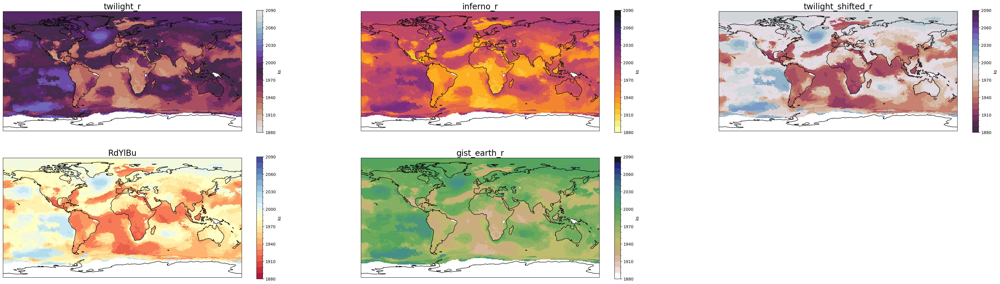

In [130]:
# colormap_list = plt.colormaps()
colormap_list = ['twilight_r', 'inferno_r', 'twilight_shifted_r', 'RdYlBu', 'gist_earth_r']
# Number of columns and rows for subplots
ncols = 3
nrows = int(np.ceil(len(colormap_list) / ncols))

# Adjust the figure size dynamically
fig = plt.figure(figsize=(ncols * 15, nrows *6))

for num, cmap in enumerate(colormap_list):
    # Calculate the subplot index
    row = num // ncols
    col = num % ncols
    ax = fig.add_subplot(nrows, ncols, num + 1, projection=ccrs.PlateCarree())
    
    toe_tree.best_tas.ks.plot(ax=ax, cmap=cmap, levels=PLOT_LEVELS['best_tas'], alpha=0.9)
    
    ax.coastlines()
    ax.set_title(cmap, fontsize=20)  # Add colormap name as title

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Time Series </h2>


In [66]:
reload(nf5)
reload(toe_plots)

<module 'toe_plots' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_plots.py'>

In [67]:
thesis_vars = ['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi', 'sn_mean_base',
       'sn_poly4_base', 'frac', 'ks', 'ttest', ]

# ['global', 'land', 'ocean', 'nh', 'sh', 'tropics', 'mid_lat_sh',
#        'mid_lat_nh', 'arctic', 'antarctic']

# regions = ['global', 'tropics', 'mid_lat_sh', 'mid_lat_nh', 'arctic']
regions = ['land', 'ocean', 'nh', 'sh']

In [68]:

from matplotlib.lines import Line2D
from matplotlib.path import Path
import matplotlib.patches as mpatches

17:04:42 | INFO     | notebook_functions_05:plot_percent_emerged_series:599 - Legend kwargs
{'fontsize': 10, 'loc': 'lower center', 'bbox_to_anchor': (0.25, -2.2), 'ncol': 4}
midde_axes_num=1


Text(0.5, 1.0, 'Unknown')

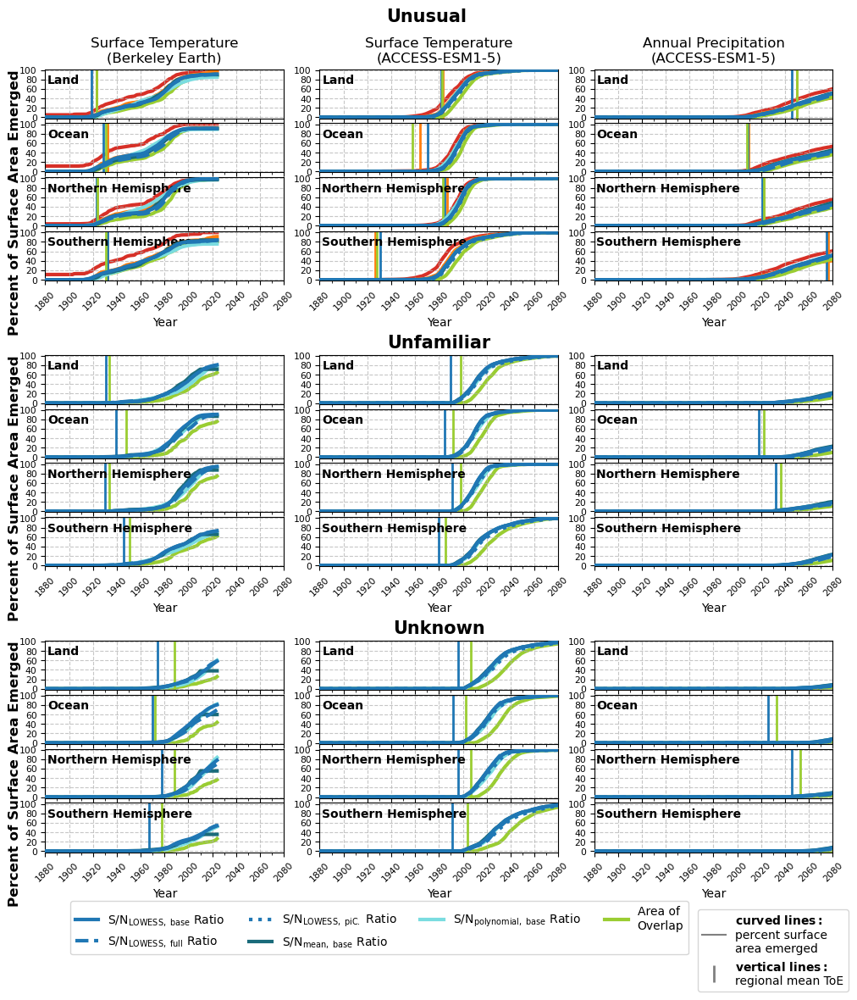

In [69]:
variables = ['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']
dim_vals = regions

DATA_KWARGS = dict(toe_metrics=thesis_vars, dim='region', labels='annotations',
                   dim_vals=regions, variables=variables)
STYLE_KWARGS = dict(ncol=4, bbox_to_anchor=(0.25, -2.2))

fig = plt.figure(figsize=(4*len(variables), len(dim_vals)*3))

# Create outer grid for the three groups with spacing between them
gs_outer = gridspec.GridSpec(3, 1, hspace=0.35, figure=fig) # hspace =0.25, 0.4

# Create inner grids for each group
gs_unusual = gridspec.GridSpecFromSubplotSpec(len(dim_vals), len(variables), 
                                               subplot_spec=gs_outer[0], 
                                               hspace=0.1, wspace=0.15)
gs_unfamiliar = gridspec.GridSpecFromSubplotSpec(len(dim_vals), len(variables), 
                                                  subplot_spec=gs_outer[1], 
                                                  hspace=0.1, wspace=0.15)
gs_unknown = gridspec.GridSpecFromSubplotSpec(len(dim_vals), len(variables), 
                                               subplot_spec=gs_outer[2], 
                                               hspace=0.1, wspace=0.15)

# Create axes for each group
axes_unusual = np.array([[fig.add_subplot(gs_unusual[i, j]) 
                          for j in range(len(variables))] 
                         for i in range(len(dim_vals))])
axes_unfamiliar = np.array([[fig.add_subplot(gs_unfamiliar[i, j]) 
                             for j in range(len(variables))] 
                            for i in range(len(dim_vals))])
axes_unknown = np.array([[fig.add_subplot(gs_unknown[i, j]) 
                          for j in range(len(variables))] 
                         for i in range(len(dim_vals))])

# Plot each group
nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree_all['unusual'].sel(window=30), 
    axes=axes_unusual,
    **DATA_KWARGS, **STYLE_KWARGS, add_legend=False, add_title=True, logginglevel='INFO')

nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree_all['unfamiliar'].sel(window=30), 
    axes=axes_unfamiliar,
    **DATA_KWARGS, **STYLE_KWARGS, add_title=False, add_legend=False, logginglevel='INFO')

nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree_all['unknown'].sel(window=30), 
    axes=axes_unknown,
    **DATA_KWARGS, **STYLE_KWARGS, add_title=False, logginglevel='INFO')


# Add aggregate lines for unusual (top group)
nf5.add_agg_line(axes_unusual[:, 0], toe_region_agg.best_tas.ds, regions)
nf5.add_agg_line(axes_unusual[:, 1], toe_region_agg.access_ssp585_tas.ds.median(dim='member'), regions)
nf5.add_agg_line(axes_unusual[:, 2], toe_region_agg.access_ssp585_pr.ds.median(dim='member'), regions)

# Add aggregate lines for unfamiliar (middle group)
nf5.add_agg_line(axes_unfamiliar[:, 0], toe_region_agg_unfamiliar.best_tas.ds, regions)
nf5.add_agg_line(axes_unfamiliar[:, 1], toe_region_agg_unfamiliar.access_ssp585_tas.ds.median(dim='member'), regions)
nf5.add_agg_line(axes_unfamiliar[:, 2], toe_region_agg_unfamiliar.access_ssp585_pr.ds.median(dim='member'), regions)

# Add aggregate lines for unknown (bottom group)
nf5.add_agg_line(axes_unknown[:, 0], toe_region_agg_unknown.best_tas.ds, regions)
nf5.add_agg_line(axes_unknown[:, 1], toe_region_agg_unknown.access_ssp585_tas.ds.median(dim='member'), regions)
nf5.add_agg_line(axes_unknown[:, 2], toe_region_agg_unknown.access_ssp585_pr.ds.median(dim='member'), regions)

for ax in np.concatenate([axes_unusual.flatten(), axes_unfamiliar.flatten(), axes_unknown.flatten()]):
    ax.set_xlim(1880, 2080)

for ax in np.concatenate([axes_unusual[0, :].flatten(), axes_unfamiliar[0, :].flatten(), axes_unknown[0, :].flatten()]):
    ax.set_xlabel(None)



legend_elements = [
    Line2D([0], [0], color='gray', lw=1.5, linestyle='-',
           label=r'$\bf{curved\ lines:}$'+'\npercent surface\narea emerged'),
    Line2D([0], [0], color='gray', linestyle='none', marker='|', markersize=15, 
           markeredgewidth=2, label=r'$\bf{vertical\ lines:}$'+'\nregional mean ToE')
]

axes_unknown[-1, -1].legend(handles=legend_elements, loc='center', bbox_to_anchor=(0.75, -2))

fig.suptitle('Unusual', fontsize=15, fontweight='bold', y=0.94)
# axes_unusual[0, 1].set_title('Unusual', fontsize=15, fontweight='bold')
axes_unfamiliar[0, 1].set_title('Unfamiliar', fontsize=15, fontweight='bold')
axes_unknown[0, 1].set_title('Unknown', fontsize=15, fontweight='bold')

17:04:48 | INFO     | notebook_functions_05:plot_percent_emerged_series:599 - Legend kwargs
{'fontsize': 10, 'loc': 'lower center', 'bbox_to_anchor': (0.5, -2.2), 'ncol': 4}
midde_axes_num=1


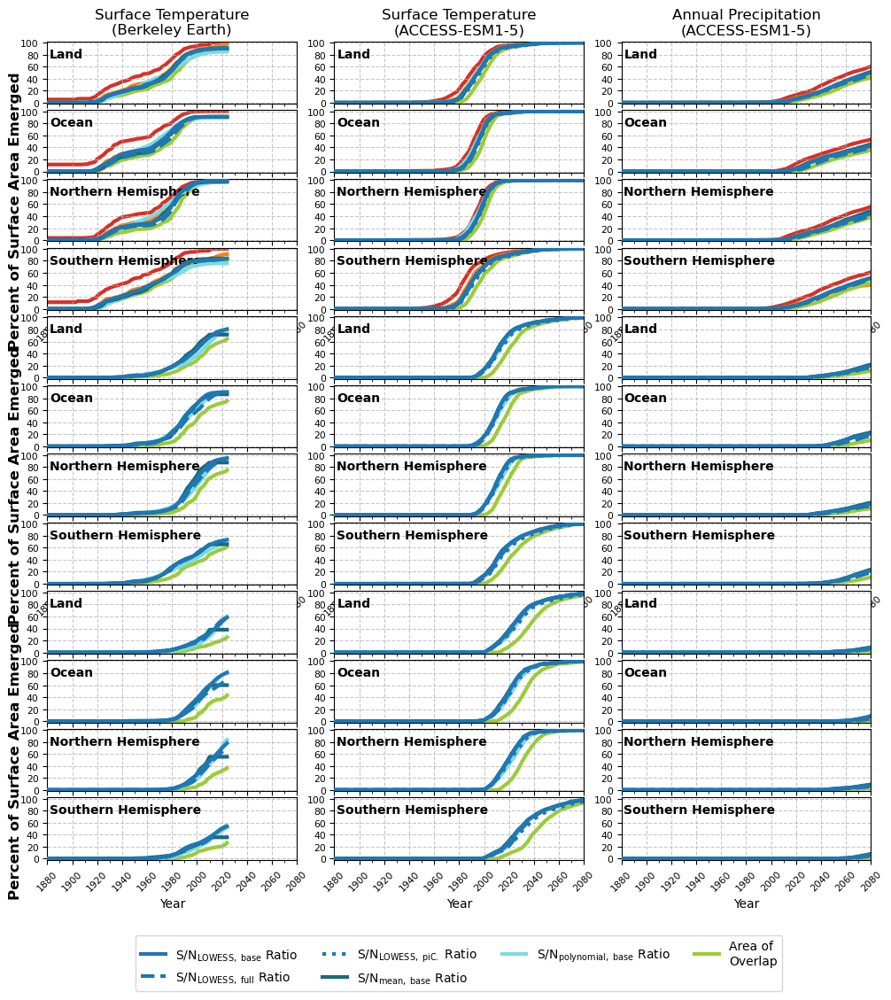

In [70]:
variables = ['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']
dim_vals = regions

DATA_KWARGS = dict(toe_metrics=thesis_vars, dim='region', labels='annotations',
                   dim_vals = regions, variables=variables)
STYLE_KWARGS = dict(ncol=4)

fig = plt.figure(figsize=(4*len(variables), len(dim_vals)*3))
gs = gridspec.GridSpec(len(dim_vals)*3, len(variables), hspace=.1, wspace=.15)
axes = [[fig.add_subplot(gs[i, j]) for j in range(len(variables))] for i in range(len(dim_vals)*3)]
axes = np.array(axes)


nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree_all['unusual'].sel(window=30), axes=axes[:len(regions), :],
    **DATA_KWARGS, **STYLE_KWARGS, add_legend=False, logginglevel='INFO')

nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree_all['unfamiliar'].sel(window=30), axes=axes[len(regions):(len(regions)*2+1), :],
    **DATA_KWARGS, **STYLE_KWARGS, add_title=False, add_legend=False, logginglevel='INFO')

nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree_all['unknown'].sel(window=30), axes=axes[len(regions)*2:(len(regions)*3+1), :],
    **DATA_KWARGS, **STYLE_KWARGS, add_title=False, logginglevel='INFO')

# fig.suptitle('Unusual', fontsize=14, y=1.15, fontweight='bold');

# nf5.add_agg_line(axes[0],  toe_region_agg.best_tas.ds, regions)
# nf5.add_agg_line(axes[1],  toe_region_agg.access_ssp585_tas.ds.median(dim='member'), regions)
# # destroy_ax(axes[0][3])
# nf5.add_agg_line(axes[2],  toe_region_agg.access_ssp585_pr.ds.median(dim='member'), regions)

for ax in np.array(axes).ravel(): ax.set_xlim(1880, 2080)

17:04:52 | INFO     | notebook_functions_05:plot_percent_emerged_series:599 - Legend kwargs
{'fontsize': 10, 'loc': 'lower center', 'bbox_to_anchor': (0.5, -2.2), 'ncol': 4}
midde_axes_num=1


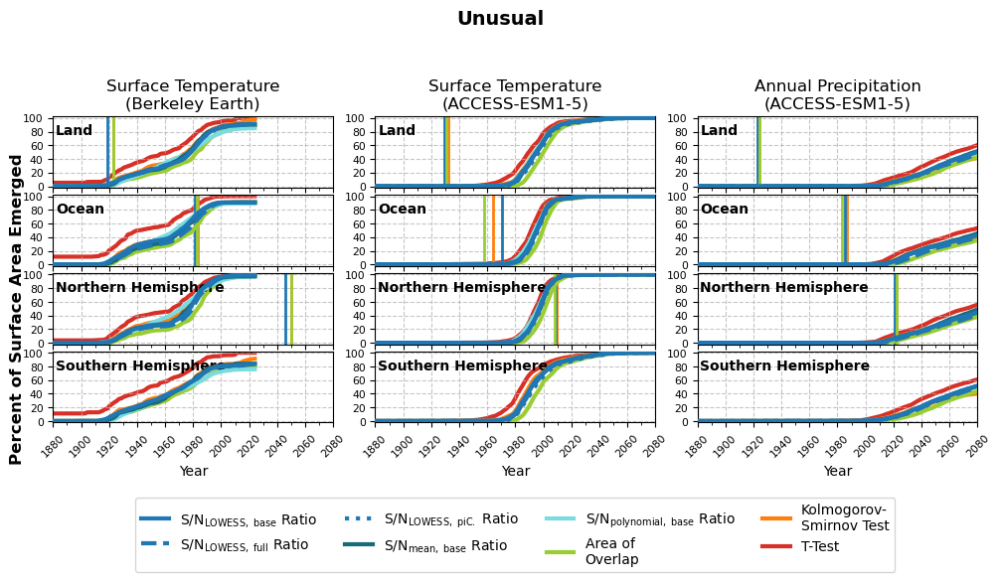

In [71]:
DATA_KWARGS = dict(toe_metrics=thesis_vars, dim='region', labels='annotations',
                   dim_vals = regions, variables = ['best_tas', 'access_ssp585_tas', 'access_ssp585_pr'])
STYLE_KWARGS = dict(ncol=4)


fig, axes = nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree.sel(window=30), **DATA_KWARGS, **STYLE_KWARGS, logginglevel='INFO')

fig.suptitle('Unusual', fontsize=14, y=1.15, fontweight='bold');

nf5.add_agg_line(axes[0],  toe_region_agg.best_tas.ds, regions)
nf5.add_agg_line(axes[1],  toe_region_agg.access_ssp585_tas.ds.median(dim='member'), regions)
# destroy_ax(axes[0][3])
nf5.add_agg_line(axes[2],  toe_region_agg.access_ssp585_pr.ds.median(dim='member'), regions)

for ax in np.array(axes).ravel(): ax.set_xlim(1880, 2080)

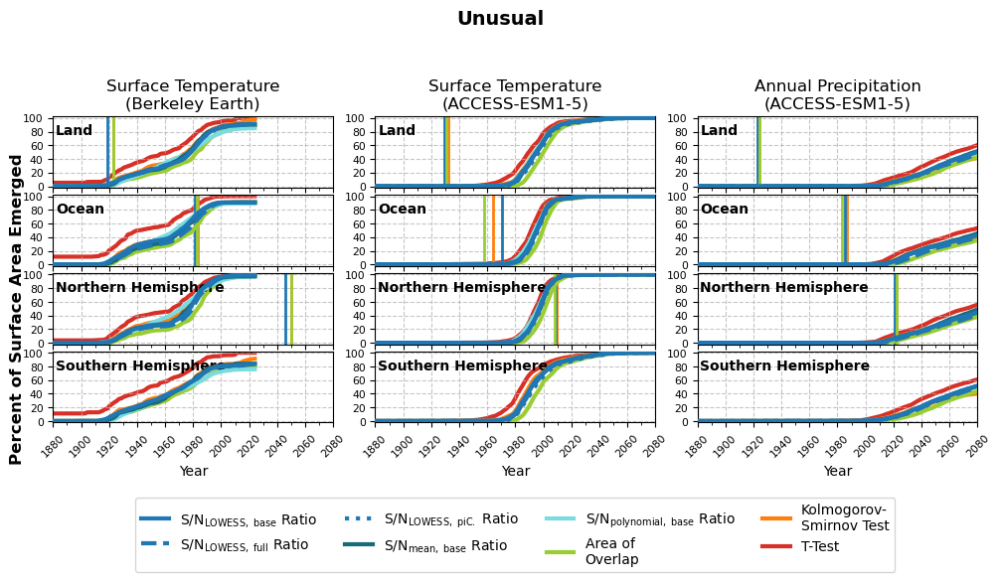

In [72]:
fig, axes = nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree.sel(window=30),
    toe_metrics=thesis_vars, dim='region', labels='annotations',
    dim_vals = regions, variables = ['best_tas', 'access_ssp585_tas', 'access_ssp585_pr'],
ncol=4)

fig.suptitle('Unusual', fontsize=14, y=1.15, fontweight='bold');

nf5.add_agg_line(axes[0],  toe_region_agg.best_tas.ds, regions)
nf5.add_agg_line(axes[1],  toe_region_agg.access_ssp585_tas.ds.median(dim='member'), regions)
# destroy_ax(axes[0][3])
nf5.add_agg_line(axes[2],  toe_region_agg.access_ssp585_pr.ds.median(dim='member'), regions)

for ax in np.array(axes).ravel(): ax.set_xlim(1880, 2080)

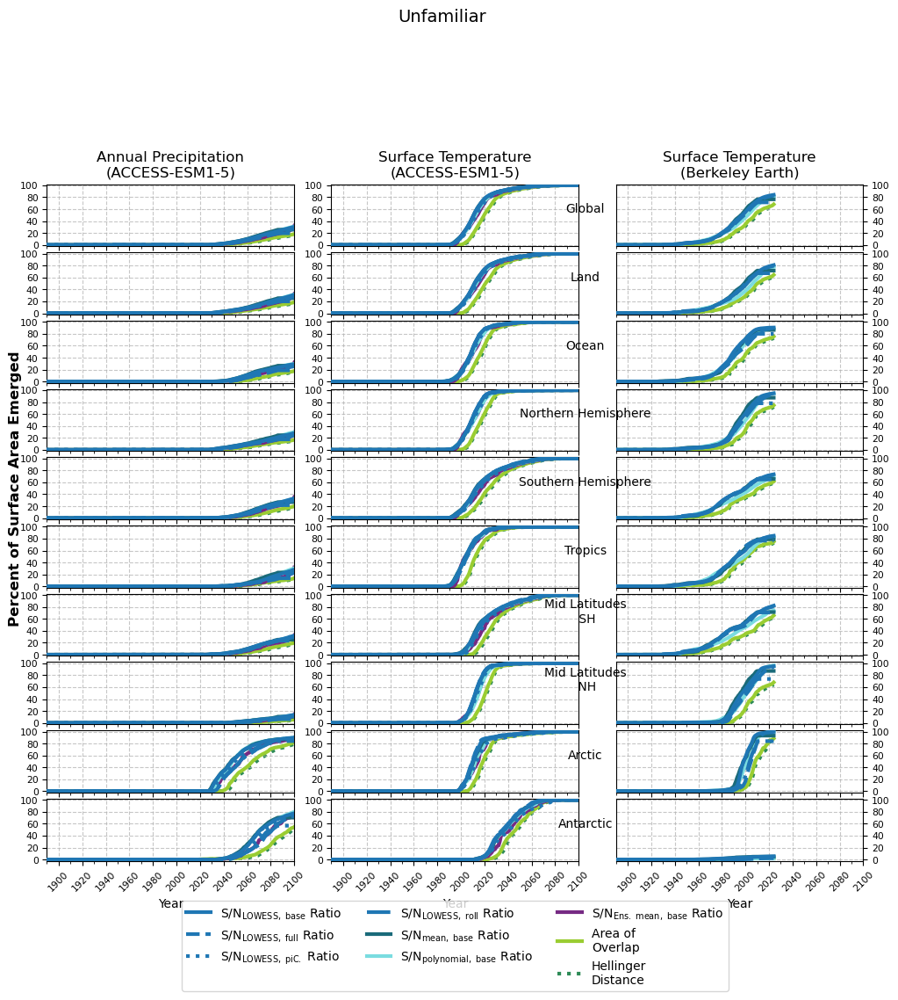

In [73]:
fig, axes = nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_unfamiliar_tree.sel(window=30),
    # variables=['best_tas', 'access_ssp585_tas'],
    toe_metrics=metrics_dict['supplementary_no_hype'],#metrics_dict['main']_no_hype,
    dim='region')
fig.suptitle('Unfamiliar', fontsize=14, y=1.08);

# # nf5.add_agg_line(axes[0],  toe_region_agg_unfamiliar.best_tas.ds, regions)
# # nf5.add_agg_line(axes[1],  toe_region_agg_unfamiliar.access_ssp585_tas.ds.median(dim='member'), regions)
# destroy_ax(axes[0][3])
# # nf5.add_agg_line(axes[2],  toe_region_agg_unfamiliar.access_ssp585_pr.ds.median(dim='member'), regions)

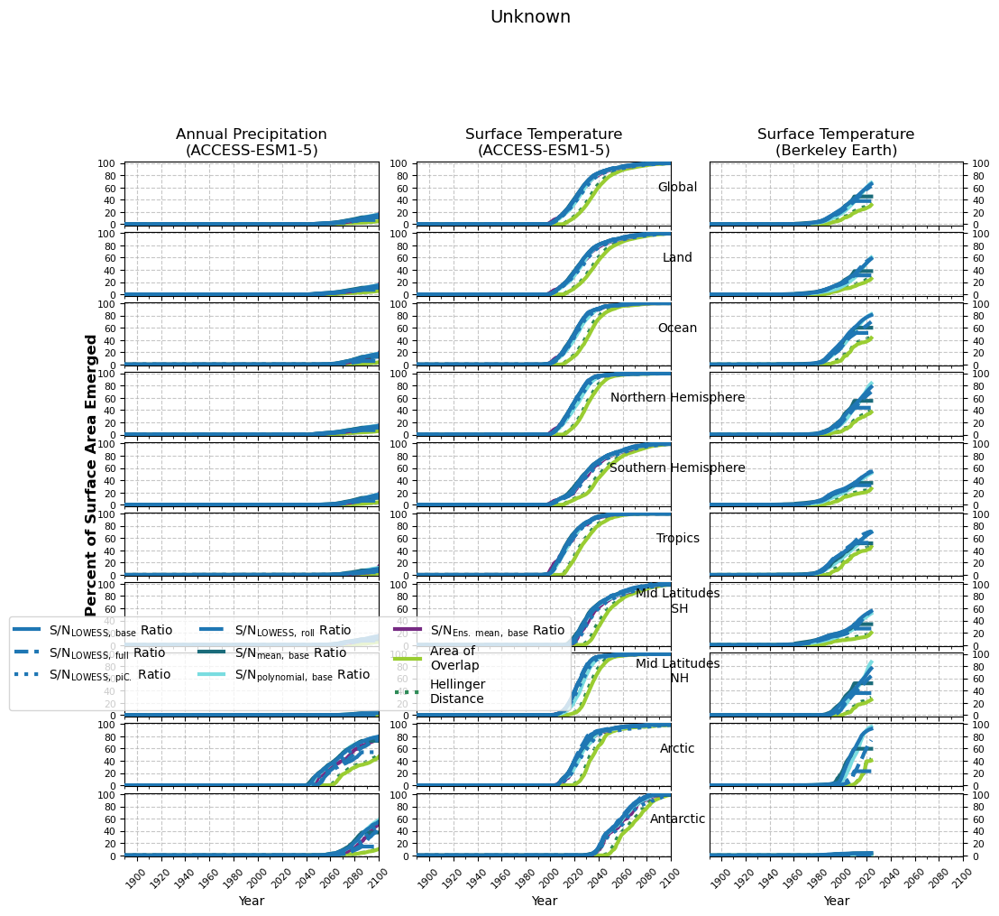

In [74]:
fig, axes = nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_unknown_tree.sel(window=30),
    # variables=['best_tas', 'access_ssp585_tas'],
    toe_metrics=metrics_dict['supplementary_no_hype'], dim='region',
    bbox_to_anchor=(-0.5, 2.2))
fig.suptitle('Unknown', fontsize=14, y=1.05);

# nf5.add_agg_line(axes[0],  toe_region_agg_unknown.best_tas.ds, regions)
# nf5.add_agg_line(axes[1],  toe_region_agg_unknown.access_ssp585_tas.ds.median(dim='member'), regions)
# destroy_ax(axes[0][3])
# nf5.add_agg_line(axes[2],  toe_region_agg_unfamiliar.access_ssp585_pr.ds.median(dim='member'), regions)

(<Figure size 400x300 with 3 Axes>,
 array([[<Axes: title={'center': 'Surface Temperature\n(Berkeley Earth)'}, ylabel='Global'>],
        [<Axes: ylabel='Tropics'>],
        [<Axes: xlabel='Year', ylabel='Arctic'>]], dtype=object))

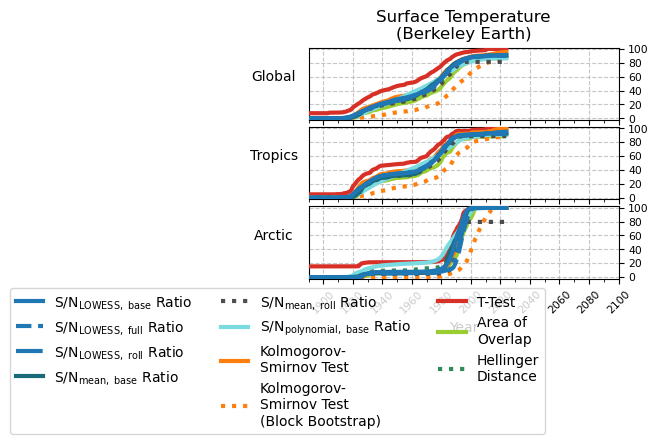

In [75]:
nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree.sel(window=30), variables=['best_tas'],
    toe_metrics=metrics_dict['all'],#metrics_dict['main']_no_hype,
    dim_vals=['global', 'tropics', 'arctic'], bbox_to_anchor=(-.1, -2.25))

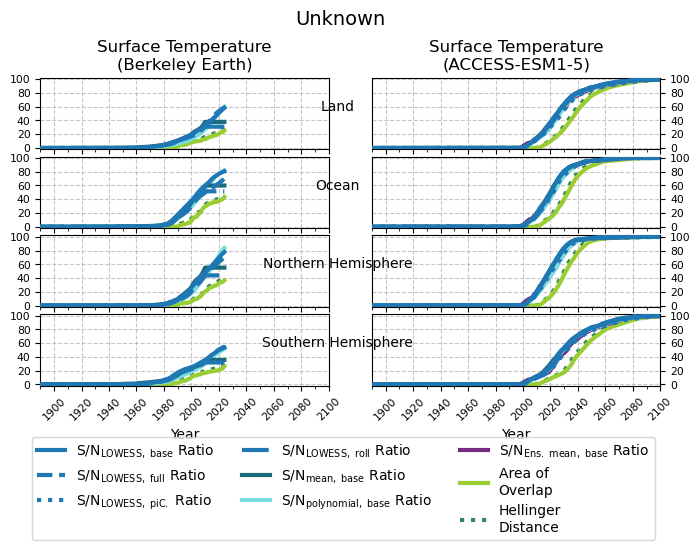

In [76]:
fig, axes = nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_unknown_tree.sel(window=30), variables=['best_tas', 'access_ssp585_tas'],
    toe_metrics=metrics_dict['supplementary'],#metrics_dict['main']_no_hype,
    dim_vals=regions, bbox_to_anchor=(-.1, -2.25))

fig.suptitle('Unknown', fontsize=14, y=1.05);

# # nf5.add_agg_line(axes[0],  toe_region_agg_unknown.best_tas.ds, regions)
# # nf5.add_agg_line(axes[1],  toe_region_agg_unknown.access_ssp585_tas.ds.median(dim='member'), regions)
# destroy_ax(axes[0][3])
# # nf5.add_agg_line(axes[2],  toe_region_agg_unfamiliar.access_ssp585_pr.ds.median(dim='member'), regions)

In [77]:
# fig, axes = nf5.plot_percent_emerged_series(emergence_time_series_50pct_unknown_tree, toe_metrics=main_toe_metrics_no_hype, dim='region')
# fig.suptitle('Unknown', fontsize=14, y=1.05);
# # nf5.add_agg_line(axes[0],  toe_region_agg_unknown.best_tas.ds, regions)
# # nf5.add_agg_line(axes[1],  toe_region_agg_unknown.access_ssp585_tas.ds.median(dim='member'), regions)
# # nf5.add_agg_line(axes[2],  toe_region_agg_unknown.access_ssp585_pr.ds.median(dim='member'), regions)

In [78]:
variable = 'access_ssp585_pr'

In [79]:
# toe_best_agg_ds = toe_region_agg[variable].ds
# toe_best_agg_df = toe_best_agg_ds.to_pandas()
# toe_best_agg_ds_stats = toe_best_agg_ds.quantile([0.25, 0.5, 0.75], dim='member').compute()
# toe_best_agg_df_med = .median().to_pandas()

In [80]:
# toe_best_agg_df = (toe_best_agg_ds_stats.sel(quantile=0.5)
#                    .drop_vars('quantile')
#                    .to_pandas()
#                    .astype(int).astype(str))

In [81]:
# toe_best_agg_iqr_df = (
#     (toe_best_agg_ds_stats.sel(quantile=0.75) - toe_best_agg_ds_stats.sel(quantile=0.25))
#     .drop_vars('quantile', errors='ignore')
#     .to_pandas()
#     .astype(int).astype(str))

In [82]:
# print(toe_best_agg_df + ' ('+ toe_best_agg_iqr_df +')')

In [83]:
# toe_access_agg_df = (toe_region_agg.best_tas.ds
#                      .drop_vars('height', errors='ignore').to_pandas())

In [84]:
# regions = np.array(['global', 'land', 'ocean', 'antarctic', 'mid_lat_sh', 'tropics',
#        'mid_lat_nh', 'arctic'])

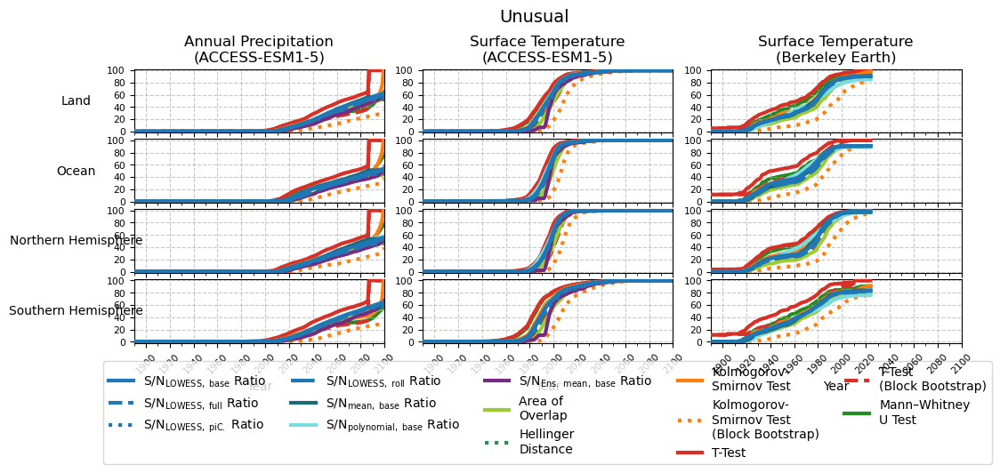

In [85]:
fig, axes = nf5.plot_percent_emerged_series(
    emergence_time_series_50pct_tree.sel(window=30),
    toe_metrics=metrics_dict['supplementary'],
    dim_vals=regions,
    labels='ylabels_lhs', bbox_to_anchor=(0.5, -2), ncol=5, logginglevel='ERROR')

fig.suptitle('Unusual', fontsize=14, y=1.05);
# nf5.add_agg_line(axes[0],  toe_region_agg.best_tas.ds, regions)
# nf5.add_agg_line(axes[1],  toe_region_agg.access_ssp585_tas.ds.median(dim='member'), regions)
# nf5.add_agg_line(axes[2],  toe_region_agg.access_ssp585_pr.ds.median(dim='member'), regions)


In [86]:
import matplotlib.cm as cm

In [87]:
def plot_windowed_timeseries(
    ds, metrics, region="global", fontscale=1.0,legend_fontsize = 10,
    windows=None, axes=None, logginglevel='ERROR', legend=True):
    """
    Plot metrics that vary by window length.
    """
    utils.change_logginglevel(logginglevel)
    logger.info(f'{metrics=}')

    if windows is None: windows = np.array(ds.window.values)
    else: windows = np.intersect1d(windows, np.array(ds.window.values))

    if axes is None:
        fig = plt.figure(figsize=(8, 10), constrained_layout=True)
        gs = gridspec.GridSpec(len(metrics), 1, hspace=0.1)
        axes = [fig.add_subplot(gs[i]) for i in range(len(metrics))]
    else: fig = axes[0].get_figure()

    if hasattr(ds.time, "dt"): time = ds.time.dt.year.values
    else: time = ds.time.values

    linewidths = np.linspace(2, 5, len(windows))
    colors = cm.get_cmap("YlOrRd")(np.linspace(1, 0.3, len(windows)))
    style_pairs = list(zip(linewidths, colors))

    def __style_axes(ax):
        ax.grid(True, linestyle="--", alpha=0.7)
        ax.tick_params(axis="y", labelsize=12 * fontscale)
        ax.tick_params(axis="x", labelsize=12 * fontscale)
        ax.set_yticks(np.arange(0, 120, 20))
        ax.set_ylim(-4, 104)
        ax.set_xlim(1960, 2050)

    def __plot_line(ax, time, vals, window, **kwargs):
        ax.plot(time, vals, **kwargs)

    for ax, metric in zip(axes, metrics):
        for (lw, color), window in zip(style_pairs, windows):
            vals = ds[metric].sel(window=window).values
            __plot_line(ax, time, vals, window,
                        linewidth=lw, color=color, alpha=0.8,
                        label=window if ax is axes[0] else None)
        ax.annotate(
            toe_plots.METRIC_NAME_MAP.get(metric, metric.replace("_", " ")),
            xy=(0.02, 0.9), xycoords="axes fraction",
            fontweight='bold', ha="left", va="top",
            fontsize=12 * fontscale
        )
        __style_axes(ax)

    # axes[0].tick_params(axis="x", top=True, labeltop=True, bottom=False, labelbottom=False)
    # for ax in axes:
    #     ax.set_ylabel('Percent of\nSurface Area Emerged', fontsize=14 * fontscale)
    # axes[-1].set_xlabel("Time (years)", fontsize=14 * fontscale)

    # for i, ax in enumerate(axes):
    #     if i not in [0, len(axes) - 1]:
    #         ax.set_xticklabels([])

    # --- First legend: window lengths ---
    if legend:
        handles, labels = axes[0].get_legend_handles_labels()
        leg1 = axes[0].legend(
            handles, labels, title="Window Length (Years)",
            loc="lower center", bbox_to_anchor=(0.15, 1.2),
            ncol=len(labels) // 2,
            fontsize=legend_fontsize * fontscale, frameon=True,
        )
        leg1.get_title().set_fontsize(legend_fontsize * fontscale)
        axes[0].add_artist(leg1)

    fig.tight_layout()
    return axes


def plot_timeseries(ax, ds, metrics, linestyle='--', prefix=None):
    """
    Plot given metrics from a dataset on a single axis.
    """
    time = ds.time.dt.year.values if hasattr(ds.time, "dt") else ds.time.values

    for nm in metrics:
        label_name = toe_plots.METRIC_NAME_MAP.get(nm, nm.replace("_", " "))#.replace('\n', ' ')
        label = f"{prefix} – {label_name}" if prefix else label_name
        ax.plot(
            time, ds[nm].values,
            color=toe_plots.TEST_STYLES[nm]['color'],
            linewidth=3.5, linestyle=linestyle, alpha=0.6,
            label=label
        )


17:05:12 | INFO     | __main__:plot_windowed_timeseries:8 - metrics=['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window']


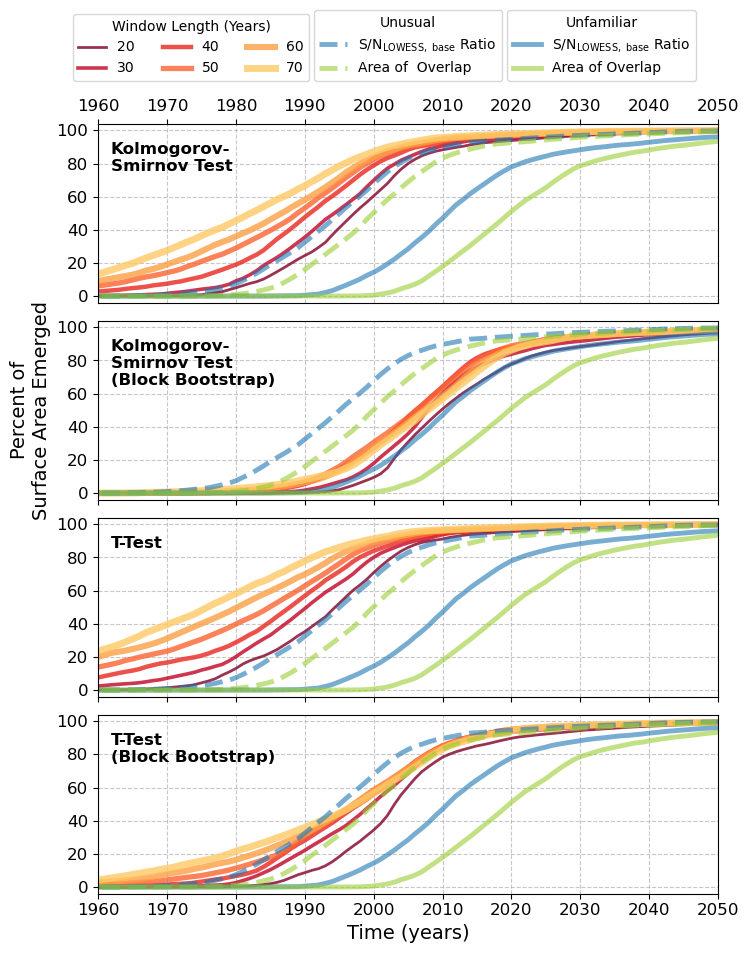

In [88]:
data_set = 'access_ssp585_tas'
fig = plt.figure(figsize=(8, 10), constrained_layout=True)
fontscale=1
gs = gridspec.GridSpec(4, 1, hspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(4)]

# gs = gridspec.GridSpec(2, 2, hspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(4)]


# Plot windowed metrics
plot_windowed_timeseries(
    emergence_time_series_50pct_tree[data_set].ds.sel(region='global'),
    metrics=["ks_window", "ks_bbs_window", "ttest_window", "ttest_bbs_window"],
    axes=axes, 
    logginglevel='INFO'
)

# --- Plot S/N and overlap on each axis ---
for ax in axes:
    plot_timeseries(
        ax,
        emergence_time_series_50pct_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='--',
        prefix='unusual'
    )

    plot_timeseries(
        ax,
        emergence_time_series_50pct_unfamiliar_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='-',
        prefix='unfamiliar'
    )

axes[0].tick_params(axis="x", top=True, labeltop=True, bottom=False, labelbottom=False)
for ax in axes:
    ax.set_ylabel('Percent of\nSurface Area Emerged', fontsize=14 * fontscale)
axes[-1].set_xlabel("Time (years)", fontsize=14 * fontscale)

for i, ax in enumerate(axes):
    if i not in [0, len(axes) - 1]:
        ax.set_xticklabels([])


# --- Two clean legends with column titles ---
handles, labels = axes[0].get_legend_handles_labels()

# Split handles by prefix
unusual_handles = [h for h, l in zip(handles, labels) if l.startswith("unusual")]
unusual_labels = [l.replace("unusual – ", "").replace('\n', '  ') for l in labels if l.startswith("unusual")]
unfamiliar_handles = [h for h, l in zip(handles, labels) if l.startswith("unfamiliar")]
unfamiliar_labels = [l.replace("unfamiliar – ", "").replace('\nOverlap', ' Overlap') for l in labels if l.startswith("unfamiliar")]

# Left column: unusual
leg_unusual = axes[0].legend(
    unusual_handles, unusual_labels,
    title="Unusual",
    loc="lower center", bbox_to_anchor=(0.5, 1.2),
    ncol=1, frameon=True, fontsize=10
)
leg_unusual.get_title().set_fontsize(10)
axes[0].add_artist(leg_unusual)

# Right column: unfamiliar
leg_unfamiliar = axes[0].legend(
    unfamiliar_handles, unfamiliar_labels,
    title="Unfamiliar",
    loc="lower center", bbox_to_anchor=(0.812, 1.2),
    ncol=1, frameon=True, fontsize=10
)
leg_unfamiliar.get_title().set_fontsize(10)


# remove redundant y-labels
for i, ax in enumerate(axes):
    if i in [0, 2, 3]:
        ax.set_ylabel(None)

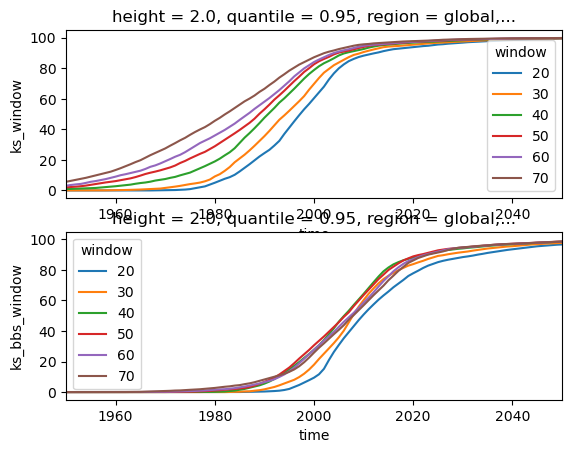

In [89]:
fig, (ax1, ax2) = plt.subplots(2, 1)

data_set = 'access_ssp585_tas'

emergence_time_series_50pct_tree[data_set].ks_window.sel(region='global', window=slice(20, 80)).plot(hue='window', ax=ax1)
emergence_time_series_50pct_tree[data_set].ks_bbs_window.sel(region='global', window=slice(20, 80)).plot(hue='window', ax=ax2)

for ax in [ax1, ax2]: ax.set_xlim(1950, 2050)

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Maps</h2>

In [131]:
def plot_vars_over_dim(
    ds, metrics, loop_dim="window",
    levels=np.arange(1900, 2100, 10), 
    data_availability_ds=None, fig=None, axes=None,
    figsize=(4, 3)
):
    """
    Plot metrics vs. loop_dim in a grid:
      rows = loop_dim values, cols = metrics, with one shared colorbar.
    """
    available_metrics = [m for m in metrics if m in ds and loop_dim in ds[m].dims]
    loop_vals = ds[loop_dim].values
    nrows, ncols = len(loop_vals), len(available_metrics)

    # Case 1: fig/axes not provided → create everything
    if fig is None and axes is None:
        fig = plt.figure(figsize=(figsize[0] * ncols, figsize[1] * nrows))
        outer_gs = gridspec.GridSpec(
            nrows + 1, ncols, figure=fig,
            hspace=0.25, wspace=0.05,
            height_ratios=[1]*nrows + [0.05]
        )
        axes = np.empty((nrows, ncols), dtype=object)
        for r, val in enumerate(loop_vals):
            for c, met in enumerate(available_metrics):
                axes[r, c] = fig.add_subplot(outer_gs[r, c], projection=ccrs.PlateCarree())

    # Case 2: user supplies axes → assume correct layout and skip subplot creation
    elif axes is not None:
        fig = axes.flat[0].figure  # infer fig from first axis
        outer_gs = None  # not needed

    else:
        raise ValueError("If you pass fig, you must also pass axes (or vice versa).")

    # Now plotting into existing axes
    for r, val in enumerate(loop_vals):
        for c, met in enumerate(available_metrics):
            ax = axes[r, c]
            da = ds[met].sel({loop_dim: val})

            xr.where(np.isfinite(da), 0, 1).plot(ax=ax, **nf5.no_emergence_plot_kwargs)
            da.plot(ax=ax, add_colorbar=False, cmap=my_cmap, levels=levels)

            if data_availability_ds is not None:
                plotting_utils.hatch(
                    ax, data_availability_ds.to_array().squeeze(),
                    **plotting_utils.no_data_plot_kwargs
                )

            if r == 0:
                ax.set_title(met, fontsize=12)
            if c == 0:
                ax.annotate(
                    f"{loop_dim}={val}", xy=(0, 0.5), xycoords='axes fraction',
                    xytext=(-0.05, 0), textcoords='axes fraction',
                    ha='right', va='center', fontsize=10, rotation=90
                )

            ax.coastlines()

    # Shared colorbar row (only if we created the layout)
    if outer_gs is not None:
        cax = fig.add_subplot(outer_gs[-1, :])
        cbar = plotting_utils.create_discrete_colorbar(
            my_cmap, levels, cax, 'Time of Emergence',
            fontscale=1.2, orientation='horizontal', pad=7,
            tick_slice=slice(None, None, 2)
        )
    else:
        cbar = None  # leave colorbar creation to caller

    return fig, axes, cbar


In [132]:
# def plot_all_ds_vars(fig, subspec, ds, metrics, levels=np.arange(1900, 2100, 10), data_availability_ds=None,
#                        ncols = 4, axes=None):
#     # preserve order, only keep metrics present in *this* tree
#     all_metrics = list(ds)
    
#     available_metrics = [m for m in metrics if m in all_metrics]

#     nrows = int(np.ceil(len(available_metrics) / ncols))

    
#     inner = gridspec.GridSpecFromSubplotSpec(
#         nrows, ncols, subplot_spec=subspec, hspace=.24, wspace=.05)
    
#     axes = np.empty((nrows, ncols), dtype=object)

#     # plot the ones we have
#     for i, met in enumerate(available_metrics):
#         r, c = divmod(i, ncols)
#         ax = fig.add_subplot(inner[r, c], projection=ccrs.PlateCarree())
#         # Grey out where emergence does not occur
#         xr.where(np.isfinite(ds[met]), 0, 1).plot(ax=ax, **nf5.no_emergence_plot_kwargs)
#         ds[met].plot(
#             ax=ax, add_colorbar=False,
#             cmap=my_cmap, levels=levels
#         )
#         if data_availability_ds:
#             plotting_utils.hatch(
#                 ax, data_availability_ds.to_array().squeeze(),
#                 **plotting_utils.no_data_plot_kwargs)

#         title = str(toe_plots.METRIC_MAP.get(met, met))
        
#         if '\n' in title: title = title.replace('\n', ' ')
#         ax.set_title(title, fontsize=12)
#         ax.coastlines()
#         axes[r, c] = ax

#     # blank any trailing cells so the grid stays tidy
#     total = nrows * ncols
#     for k in range(len(available_metrics), total):
#         r, c = divmod(k, ncols)
#         ax = fig.add_subplot(inner[r, c], projection=ccrs.PlateCarree())
#         ax.axis('off')
#         axes[r, c] = ax

#     return axes

In [133]:
def plot_all_ds_vars_og(fig, subspec, ds, metrics, levels=np.arange(1900, 2100, 10),
                     data_availability_ds=None, ncols=4, axes=None):
    all_metrics = list(ds)
    available_metrics = [m for m in metrics if m in all_metrics]
    nrows = int(np.ceil(len(available_metrics) / ncols))

    # only pre-create if not passed in
    if axes is None:
        inner = gridspec.GridSpecFromSubplotSpec(
            nrows, ncols, subplot_spec=subspec, hspace=.24, wspace=.05)
        axes = np.array([
            [fig.add_subplot(inner[r, c], projection=ccrs.PlateCarree())
             for c in range(ncols)] for r in range(nrows)
        ], dtype=object)

    for i, met in enumerate(available_metrics):
        r, c = divmod(i, ncols)
        ax = axes[r, c]

        xr.where(np.isfinite(ds[met]), 0, 1).plot(ax=ax, **nf5.no_emergence_plot_kwargs)
        ds[met].plot(ax=ax, add_colorbar=False, cmap=my_cmap, levels=levels)

        if data_availability_ds is not None:
            plotting_utils.hatch(ax, data_availability_ds.to_array().squeeze(),
                                 **plotting_utils.no_data_plot_kwargs)

        title = str(toe_plots.METRIC_MAP.get(met, met)).replace('\n', ' ')
        ax.set_title(title, fontsize=12)
        ax.coastlines()

    # blank any unused cells
    total = nrows * ncols
    for k in range(len(available_metrics), total):
        r, c = divmod(k, ncols)
        axes[r, c].axis('off')

    return axes


In [134]:
def plot_branch_vars(
    metrics, ds_list, 
    data_availability_ds = None, rows_per_gs=None,
    labels=("Unusual", "Unfamiliar", "Unknown"),
    ROW_H=2.2, CB_H=0.6, cb_ratio=0.3, levels=np.arange(1880, 2110, 10),
    figsize_w=13.5, hspace=.23, ncols=4, outer_gs=None, fig=None):

    """
    Plot multiple ToE map blocks with shared colorbar.

    Parameters
    ----------
    dataset : str
        Dataset key to extract from each tree.
    rows_per_gs : list[int]
        Number of subplot rows per block.
    ds_list : list
        Ds to plot, one per block.
    labels : tuple[str], optional
        Block titles, same length as ds_list.

    Returns
    -------
    fig, axes_blocks, cbar
    """
    # sizes

    if outer_gs is None:
        fig_h = ROW_H * sum(rows_per_gs) + CB_H
        fig = plt.figure(figsize=(figsize_w/4*ncols, fig_h))
    
        # outer grid (+1 for colorbar row)
        outer_gs = gridspec.GridSpec(
            len(ds_list) + 1, 1, hspace=hspace,
            height_ratios=list(rows_per_gs) + [cb_ratio]
        )

    # titles + blocks
    axes_blocks = []
    for i, ds in enumerate(ds_list):
        bb = outer_gs[i].get_position(fig)

        if labels is not None:
            label = labels[i]
            fig.text(
                0.5, bb.y1 + 0.024, label,
                ha='center', va='bottom',
                fontsize=20, weight='bold'
            )

        # IF breaks, swap to plot_all_ds_vars_og
        axes =  plot_all_ds_vars(fig, outer_gs[i], ds, metrics, levels=levels,
                               data_availability_ds=data_availability_ds, ncols=ncols)

        axes_blocks.append(axes)

    # colorbar row (last)
    cax = fig.add_subplot(outer_gs[-1])
    cbar = plotting_utils.create_discrete_colorbar(
        my_cmap, levels, cax, 'Time of Emergence',
        fontscale=1.2, orientation='horizontal', pad=7,
        tick_slice=slice(None, None, 2)
    )
    return fig, axes_blocks, cbar


In [135]:
def plot_all_ds_vars_core(ds, metrics, axes, levels=np.arange(1900, 2100, 10),
                          data_availability_ds=None, title=True, fontsize=12):
    """Core version that assumes axes are pre-created."""
    all_metrics = list(ds)
    available_metrics = [m for m in metrics if m in all_metrics]

    for ax, met in zip(axes, available_metrics):
        xr.where(np.isfinite(ds[met]), 0, 1).plot(ax=ax, **nf5.no_emergence_plot_kwargs)
        ds[met].plot(ax=ax, add_colorbar=False, cmap=my_cmap, levels=levels)

        if data_availability_ds is not None:
            plotting_utils.hatch(
                ax, data_availability_ds.to_array().squeeze(),
                **plotting_utils.no_data_plot_kwargs
            )

        if title: ax.set_title(str(toe_plots.METRIC_MAP.get(met, met)).replace('\n', ' '), fontsize=fontsize)
        ax.coastlines()

    for ax in axes[len(available_metrics):]:
        ax.axis('off')


In [136]:
# def plot_all_ds_vars(fig, subspec, ds, metrics, levels=np.arange(1900, 2100, 10),
#                      data_availability_ds=None, ncols=4, axes=None, title=True, fontsize=12):
#     """Wrapper for backward compatibility with automatic GridSpec creation."""
#     all_metrics = list(ds)
#     available_metrics = [m for m in metrics if m in all_metrics]
#     nrows = int(np.ceil(len(available_metrics) / ncols))

#     # --- modern mode (axes provided) ---
#     if axes is not None:
#         plot_all_ds_vars_core(ds, metrics, axes, levels, data_availability_ds, title=title, fontsize=fontsize)
#         return axes

#     # --- legacy mode (create axes here) ---
#     inner = gridspec.GridSpecFromSubplotSpec(
#         nrows, ncols, subplot_spec=subspec, hspace=.24, wspace=.05
#     )
#     axes = [fig.add_subplot(inner[i], projection=ccrs.PlateCarree())
#             for i in range(nrows * ncols)]

#     plot_all_ds_vars_core(ds, metrics, axes, levels, data_availability_ds, title=title, fontsize=fontsize)
#     return axes


In [137]:
def plot_all_ds_vars(fig, subspec, ds, metrics, levels=np.arange(1900, 2100, 10),
                     data_availability_ds=None, ncols=4, axes=None, fontsize=12):

    all_metrics = list(ds)
    available_metrics = [m for m in metrics if m in all_metrics]
    nrows = int(np.ceil(len(available_metrics) / ncols))

    if axes is None:
        inner = gridspec.GridSpecFromSubplotSpec(
            nrows, ncols, subplot_spec=subspec, hspace=.24, wspace=.05
        )
        axes = [fig.add_subplot(inner[i], projection=ccrs.PlateCarree())
                for i in range(nrows * ncols)]

    for ax, met in zip(axes, available_metrics):
        xr.where(np.isfinite(ds[met]), 0, 1).plot(ax=ax, **nf5.no_emergence_plot_kwargs)
        ds[met].plot(ax=ax, add_colorbar=False, cmap=my_cmap, levels=levels)

        if data_availability_ds is not None:
            plotting_utils.hatch(
                ax, data_availability_ds.to_array().squeeze(),
                **plotting_utils.no_data_plot_kwargs
            )

        title = str(toe_plots.METRIC_MAP.get(met, met)).replace('\n', ' ')
        ax.set_title(title, fontsize=fontsize)
        ax.coastlines()

    for ax in axes[len(available_metrics):]:
        ax.axis('off')

    return axes


In [138]:
# import matplotlib as mpl
# mpl.rcParams['text.usetex'] = True
# mpl.rcParams['font.family'] = 'sans-serif'
# mpl.rcParams['font.sans-serif'] = ['Helvetica']  # or 'Arial', 'DejaVu Sans', etc.
# mpl.rcParams['text.latex.preamble'] = r'\usepackage{helvet}\renewcommand{\familydefault}{\sfdefault}'


In [139]:
# mpl.rcParams.update(mpl.rcParamsDefault)

In [140]:
    # labels = (
    #     r"\textbf{Unusual}\\[0.2em]{\large S/N$>1$, AO $\!<\!63\%$}",
    #     r"\textbf{Unfamiliar}\\[0.2em]{\normalsize S/N$>2$, AO $\!<\!90\%$}",
    #     r"\textbf{Unknown}\\[0.2em]{\normalsize S/N$>3$, AO $\!<\!97\%$}"
    # ),

CPU times: user 1.15 s, sys: 131 ms, total: 1.28 s
Wall time: 1.13 s


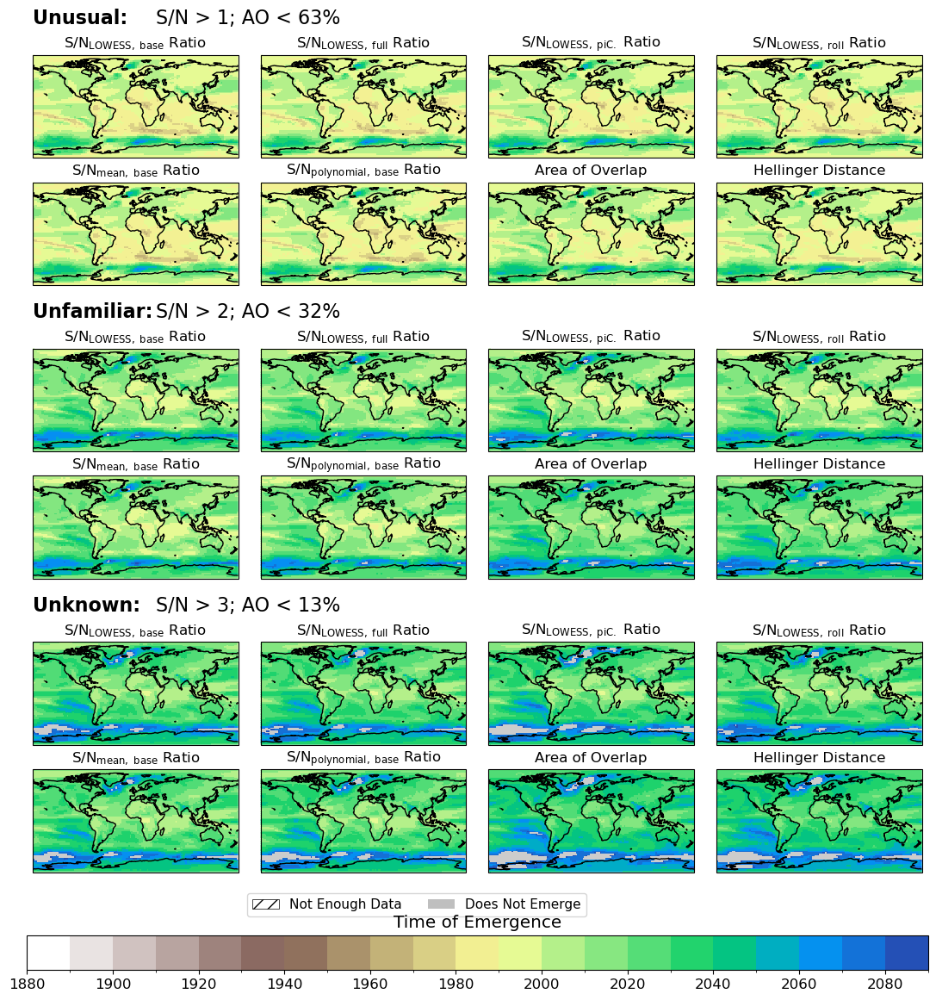

In [141]:
%%time
dataset = 'access_ssp585_tas'
fig, axes_blocks, cbar = plot_branch_vars(
    metrics=['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi','sn_lowess_roll',
             'sn_mean_base', 'sn_poly4_base', 'frac', 'hd'],
    levels = PLOT_LEVELS['access_ssp585_tas'],
    rows_per_gs = [2]*3, ncols=4, hspace= .35,

    labels=None,
    ds_list=[
        toe_50pct_tree[dataset].ds.sel(window=30),
        toe_50pct_unfamiliar_tree[dataset].ds.sel(window=30),
        toe_50pct_unknown_tree[dataset].ds.sel(window=30)
    ])

# axes_blocks is an array of blocks, which are 2d, so 3d array.
add_data_clarity_legend(axes_blocks[-1][-3], bbox_to_anchor=(0.76, -0.14), fontscale=1.1)

labels_main = ['Unusual:', 'Unfamiliar:', 'Unknown:']
labels_sub = ['S/N > 1; AO < 63%', 'S/N > 2; AO < 32%', 'S/N > 3; AO < 13%']
for i, row_axes in enumerate(axes_blocks):
    ax = row_axes[0]
    ax.annotate( labels_main[i], xy=(0, 1.3), xycoords='axes fraction',fontsize=16, fontweight='bold', ha='left')
    ax.annotate( labels_sub[i], xy=(0.6, 1.3), xycoords='axes fraction', fontsize=16, ha='left' )

# fig.suptitle(toe_plots.NAME_MAPPING[dataset], fontsize=25, y=0.96)
# fig.savefig(f'/g/data/w40/ab2313/images/completion_seminar/supp_toe_maps_{dataset}_01.png', bbox_inches='tight', dpi=500)

In [1]:
fig, axes_blocks, cbar = plot_branch_vars(
    metrics=[
        'sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi', 'frac', 'ks', 'ttest'],
    levels = PLOT_LEVELS['access_ssp585_tas'],
        rows_per_gs = [2, 2, 2], ncols=3, 

    labels = (
        'Berkley Earth Surface Temperature',
        'ACCESS-ESM1-5: Surface Temperature',
        'ACCESS-ESM1- : Annual Total Precipitation'),
    ds_list=[
        toe_50pct_tree['best_tas'].ds.sel(window=30),
        toe_50pct_tree['access_ssp585_tas'].ds.sel(window=30),
        toe_50pct_tree['access_ssp585_pr'].ds.sel(window=30)
    ]
)

# axes_blocks is an array of blocks, which are 2d, so 3d array.
add_data_clarity_legend(axes_blocks[-1][-3], bbox_to_anchor=(0.76, -0.14), fontscale=1.1);

# fig.savefig(f'/g/data/w40/ab2313/images/completion_seminar/supp_toe_maps_{dataset}_01.png', bbox_inches='tight', dpi=500)

NameError: name 'plot_branch_vars' is not defined

Text(0.5, 0.97, 'Surface Temperature (Berkeley Earth)')

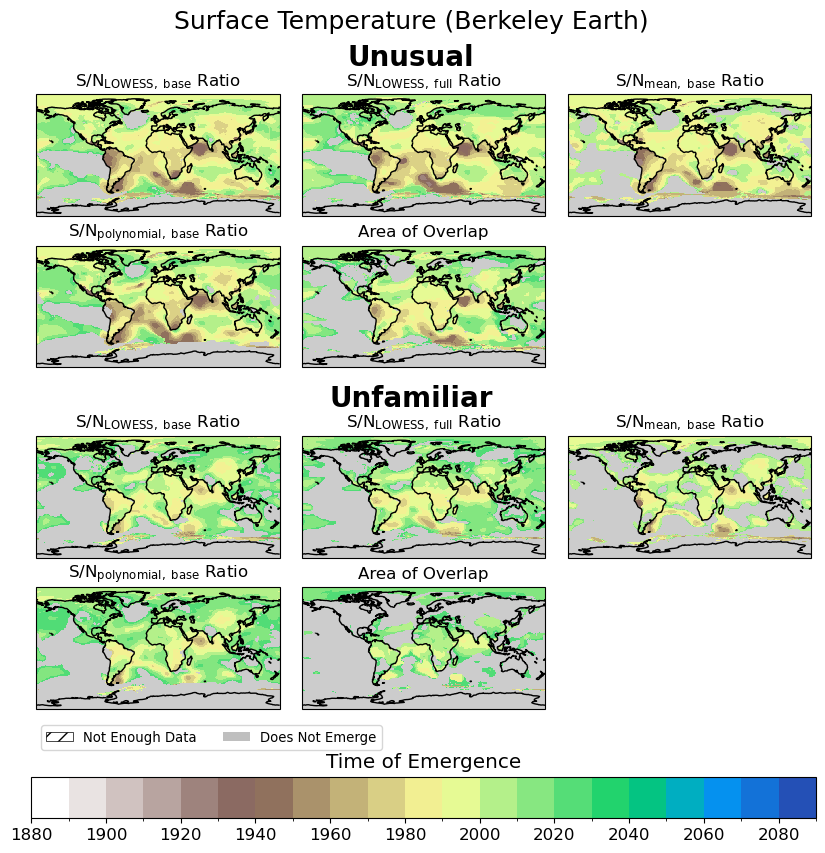

In [143]:
dataset = 'best_tas'#'access_ssp585_tas', best_tas
fig, axes_blocks, cbar = plot_branch_vars(
    metrics=metrics_dict['main_no_hype'],
    levels = PLOT_LEVELS[dataset], ncols=3, hspace=0.35,#ROW_H=2.4,
    rows_per_gs = [2, 2],
    ds_list=[
        toe_50pct_unfamiliar_tree[dataset].ds.sel(window=30),
        toe_50pct_unknown_tree[dataset].ds.sel(window=30)
    ]
)

# axes_blocks is an array of blocks, which are 2d, so 3d array.
add_data_clarity_legend(axes_blocks[-1][-3], bbox_to_anchor=(0.72, -0.08), fontscale=0.95)

fig.suptitle(toe_plots.NAME_MAPPING[dataset].replace('\n', ' '), fontsize=18, y=0.97)

# fig.savefig(
#     f'/g/data/w40/ab2313/images/completion_seminar/toe_maps_{dataset}_higher_thresh_02.png',
    # bbox_inches='tight', dpi=500)

CPU times: user 1.58 s, sys: 186 ms, total: 1.76 s
Wall time: 1.54 s


Text(0.5, 0.96, 'Surface Temperature\n(ACCESS-ESM1-5)')

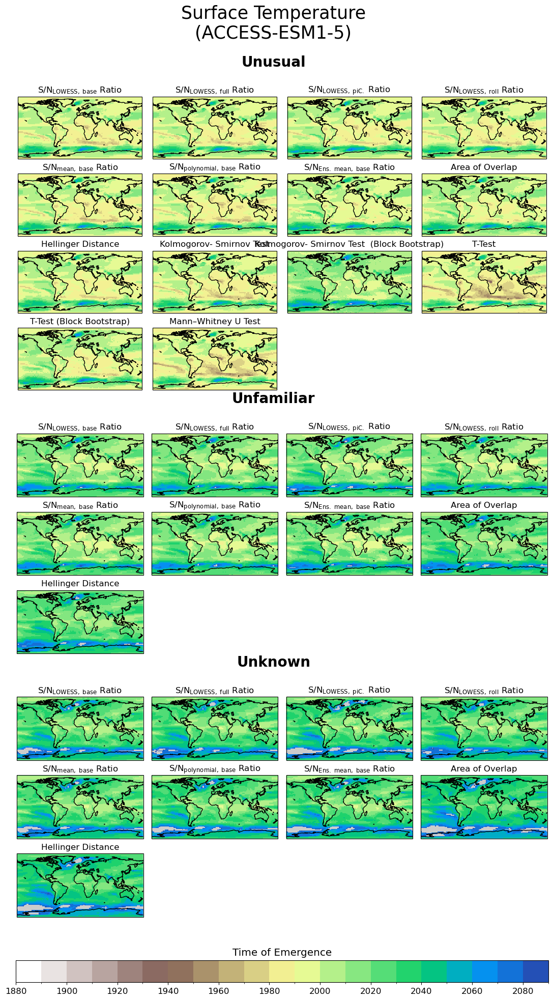

In [144]:
%%time
dataset = 'access_ssp585_tas'
fig, axes_blocks, cbar = plot_branch_vars(
     metrics=metrics_dict['supplementary'],
    levels = PLOT_LEVELS['access_ssp585_tas'],
    rows_per_gs = [4, 3, 3],
    ds_list=[
        toe_50pct_tree[dataset].ds.sel(window=30),
        toe_50pct_unfamiliar_tree[dataset].ds.sel(window=30),
        toe_50pct_unknown_tree[dataset].ds.sel(window=30)
    ]
)

# axes_blocks is an array of blocks, which are 2d, so 3d array.
# add_data_clarity_legend(axes_blocks[-1][-1][-4], bbox_to_anchor=(0.76, -0.14), fontscale=1.1)

fig.suptitle(toe_plots.NAME_MAPPING[dataset], fontsize=25, y=0.96)

# fig.savefig(f'/g/data/w40/ab2313/images/completion_seminar/supp_toe_maps_{dataset}_01.png', bbox_inches='tight', dpi=500)

In [145]:
ks_variations = [var for var in list(toe_metric_tree.access_ssp585_tas) if 'ks' in var]
# ks_variations

In [164]:
window_hyp_tree = toe_50pct_tree.map_over_datasets(
    tree_subset_vars , ['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window'])

In [165]:
def correct_toe_final_year(ds, final_year):
    """
    Mask dataset values beyond (final_year - ceil(window/2)) and concat over windows.
    """

    window_correct_list = []
    for window in ds.window.values:
        max_year = final_year - int(np.ceil(window/2))
        ds_window = ds.sel(window=window)
        ds_window = ds_window.where(ds_window <= max_year)
        window_correct_list.append(ds_window)

    return xr.concat(window_correct_list, dim='window').persist()


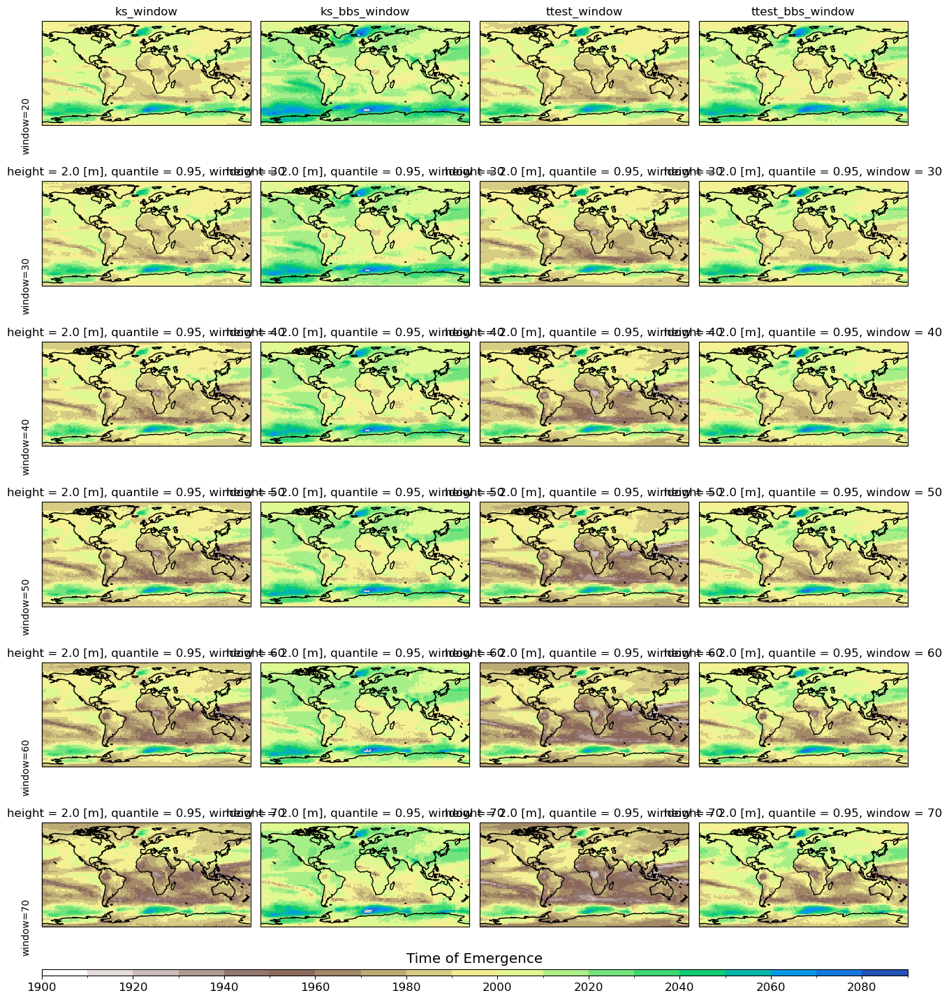

In [166]:
fig, ax, cbar = plot_vars_over_dim(toe_50pct_tree_all.unusual.access_ssp585_tas.ds, 
                                   ['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window'])

Text(0.5, 0.97, 'Surface Temperature (ACCESS-ESM1-5)')

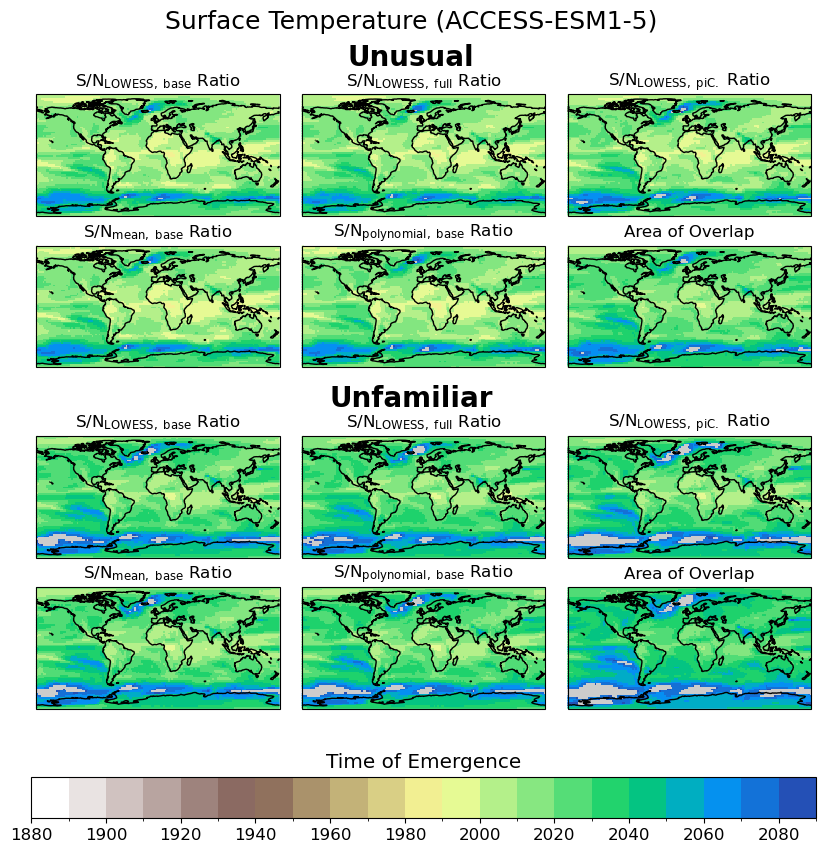

In [167]:
dataset = 'access_ssp585_tas'#'access_ssp585_tas', best_tas
fig, axes_blocks, cbar = plot_branch_vars(
    metrics=metrics_dict['main_no_hype'],
    levels = PLOT_LEVELS[dataset], ncols=3, hspace=0.35,#ROW_H=2.4,
    rows_per_gs = [2, 2], 
    ds_list=[
        toe_50pct_unfamiliar_tree[dataset].ds.sel(window=30),
        toe_50pct_unknown_tree[dataset].ds.sel(window=30)
    ]
)

# axes_blocks is an array of blocks, which are 2d, so 3d array.
# add_data_clarity_legend(axes_blocks[-1][-1][-3], bbox_to_anchor=(0.72, -0.08), fontscale=0.95)

fig.suptitle(toe_plots.NAME_MAPPING[dataset].replace('\n', ' '), fontsize=18, y=0.97)

# fig.savefig(
#     f'/g/data/w40/ab2313/images/completion_seminar/toe_maps_{dataset}_higher_thresh_02.png',
#     bbox_inches='tight', dpi=500)

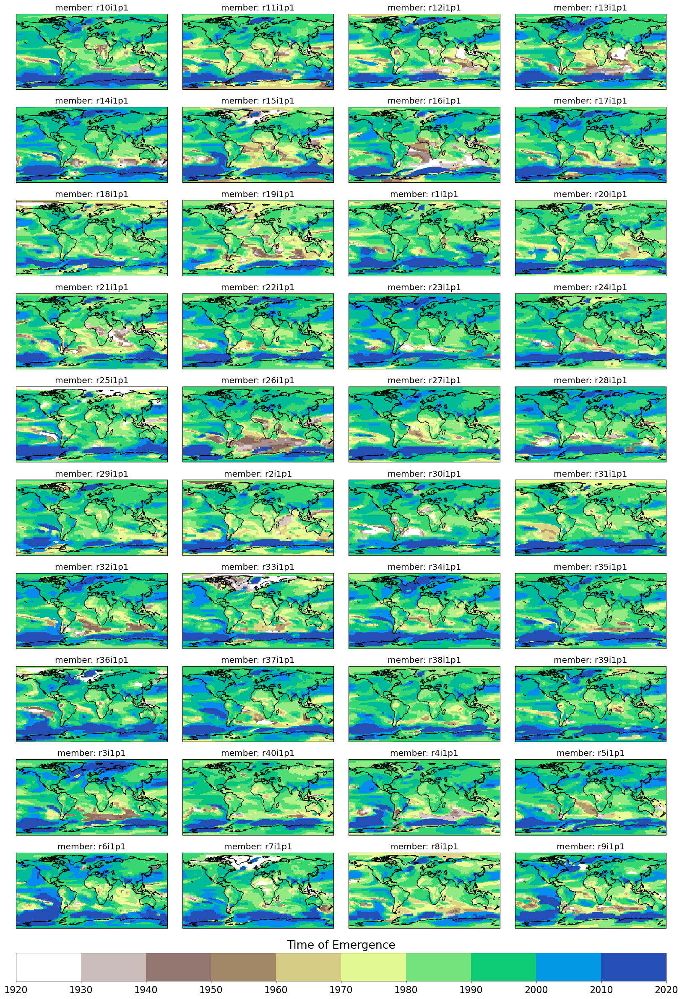

In [168]:
nf5.plot_time_of_emergence_maps_by_coord(
    toe_tree.access_ssp585_tas.ds.sn_lowess_base.squeeze(),
    does_not_emerge_tree.access_ssp585_tas.ds.sn_lowess_base.squeeze(),
    ncol=4, logginglevel='ERROR', cmap=my_cmap, fontscale=1.2
);

In [169]:
reload(nf5)

<module 'notebook_functions_05' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/notebook_functions_05.py'>


Plotting access_ssp585_pr: sn_lowess_base sn_lowess_full sn_lowess_pi frac ks ttest hd 
Plotting access_ssp585_tas: sn_lowess_base sn_lowess_full sn_lowess_pi frac ks ttest hd 
Plotting best_tas: sn_lowess_base sn_lowess_full sn_lowess_pi frac ks ttest hd 

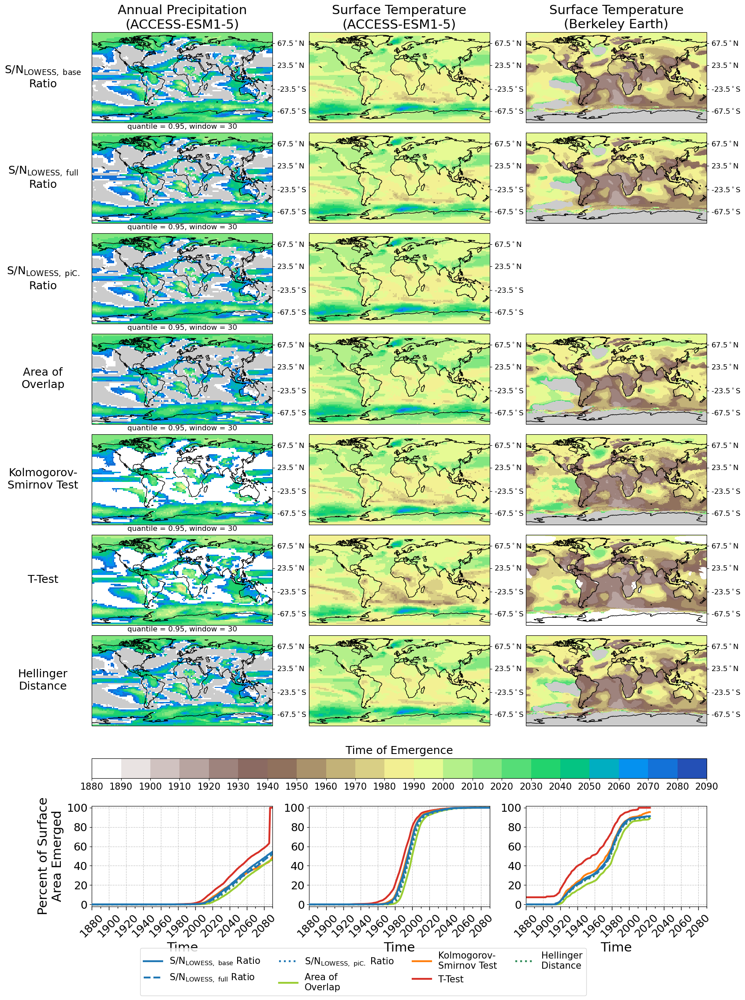

In [170]:
fig, axes, bottom_axes, leg = nf5.plot_time_of_emergence_maps_main(
    toe_tree=toe_50pct_tree.sel(window=30),
    emergence_time_series_50pct_tree=emergence_time_series_50pct_tree.sel(window=30),
    does_not_emerge_tree=does_not_emerge_50pct_tree.sel(window=30),
    data_availability_tree=data_availability_tree,
    tests_subset_used = [
        'sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi', 'frac', 'ks', 'ttest', 'hd'],
    PLOT_LEVELS=PLOT_LEVELS,
    cmap=my_cmap, #plt.cm.terrain_r
    fontscale=1.5 
)

# add_data_clarity_legend(axes[-1][-3], bbox_to_anchor=(0.6, -0.02), fontscale=1.5)

regions_main = ['global']
# fig.suptitle('Unusual', fontsize=25, y=0.92);
# nf5.add_agg_line([bottom_axes[0]],  toe_region_agg.best_tas.ds, regions_main)
# nf5.add_agg_line([bottom_axes[1]],  toe_region_agg.access_ssp585_tas.ds.median(dim='member'), regions_main)
# nf5.add_agg_line([bottom_axes[2]],  toe_region_agg.access_ssp585_pr.ds.median(dim='member'), regions_main)

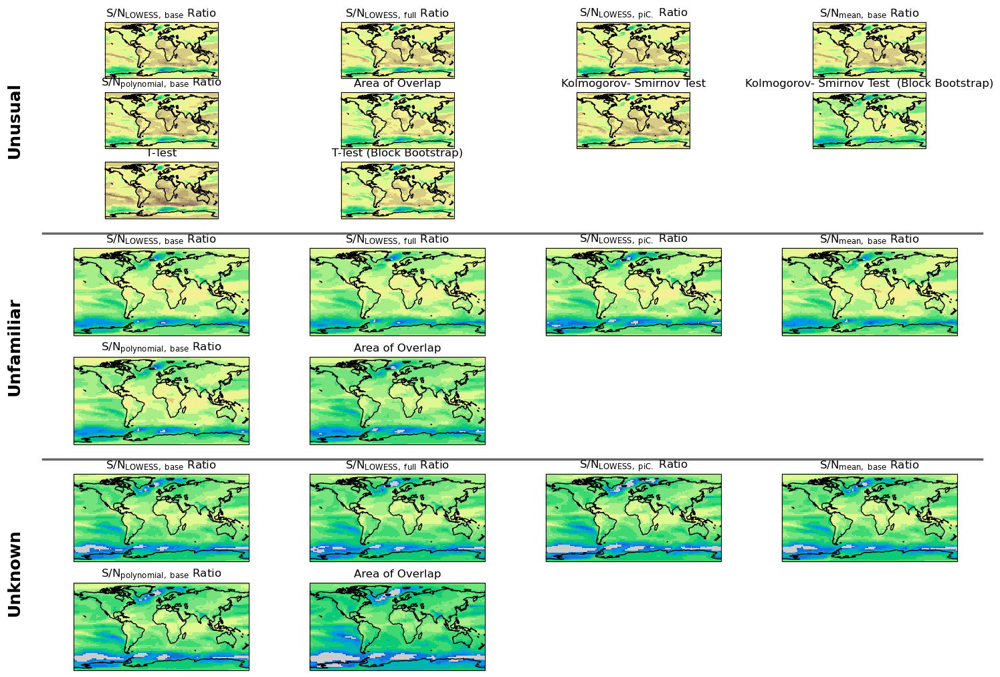

In [171]:
dataset = 'access_ssp585_tas'

fig = plt.figure(figsize=(18, 12.6))
gs = gridspec.GridSpec(3, 1, hspace=0.15)

# --- Plot each group and store their axes arrays ---
axes_unusual = plot_all_ds_vars(
    fig, gs[0, 0],
    toe_50pct_tree_all.unusual[dataset].ds.sel(window=30),
    metrics_dict['main'], ncols=4
)
axes_unfamiliar = plot_all_ds_vars(
    fig, gs[1, 0],
    toe_50pct_tree_all.unfamiliar[dataset].ds.sel(window=30),
    metrics_dict['main'], ncols=4
)
axes_unknown = plot_all_ds_vars(
    fig, gs[2, 0],
    toe_50pct_tree_all.unknown[dataset].ds.sel(window=30),
    metrics_dict['main'], ncols=4
)

# --- Collect axes by row ---
axes_rows = [axes_unusual, axes_unfamiliar, axes_unknown]
row_labels = ["Unusual", "Unfamiliar", "Unknown"]

# --- Add dataset title on the first subplot in the first group ---
# axes_rows[0][0][0].set_title(dataset, fontsize=16)

# --- Compute row boundaries, midpoints, and separators ---
row_bounds = []
for row_axes in axes_rows:
    flat_axes = [ax for sublist in row_axes for ax in (sublist if isinstance(sublist, list) else [sublist])]
    bottoms = [ax.get_position().y0 for ax in flat_axes]
    tops = [ax.get_position().y1 for ax in flat_axes]
    row_bounds.append((min(bottoms), max(tops)))

row_mids = [(b + t) / 2 for b, t in row_bounds]
separators = [(row_bounds[i][0] + row_bounds[i + 1][1]) / 2
              for i in range(len(row_bounds) - 1)]

# --- Draw horizontal separators between groups ---
for y in separators:
    fig.add_artist(plt.Line2D([0.12, 0.9], [y, y],
                              transform=fig.transFigure,
                              color='k', lw=2.5, alpha=0.6))

# --- Add text labels on the left of each row group ---
for label, y in zip(row_labels, row_mids):
    fig.text(0.09, y, label, fontsize=18, fontweight='bold',
             va='center', ha='left', rotation=90)

plt.show()


In [172]:
iqr_levels = np.arange(0, 2*len(PLOT_LEVELS['access_ssp585_tas'])+2, 2)

Empty slots: 1, Total plots: 14
Final positions to fill: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15]
sn_lowess_base sn_lowess_full sn_lowess_pi sn_lowess_roll sn_mean_base sn_poly4_base sn_ens_med_base frac hd ks ks_bbs ttest ttest_bbs mwu 

Text(0.5, 1, 'Surface Temperature\n(Berkeley Earth) - Unusual')

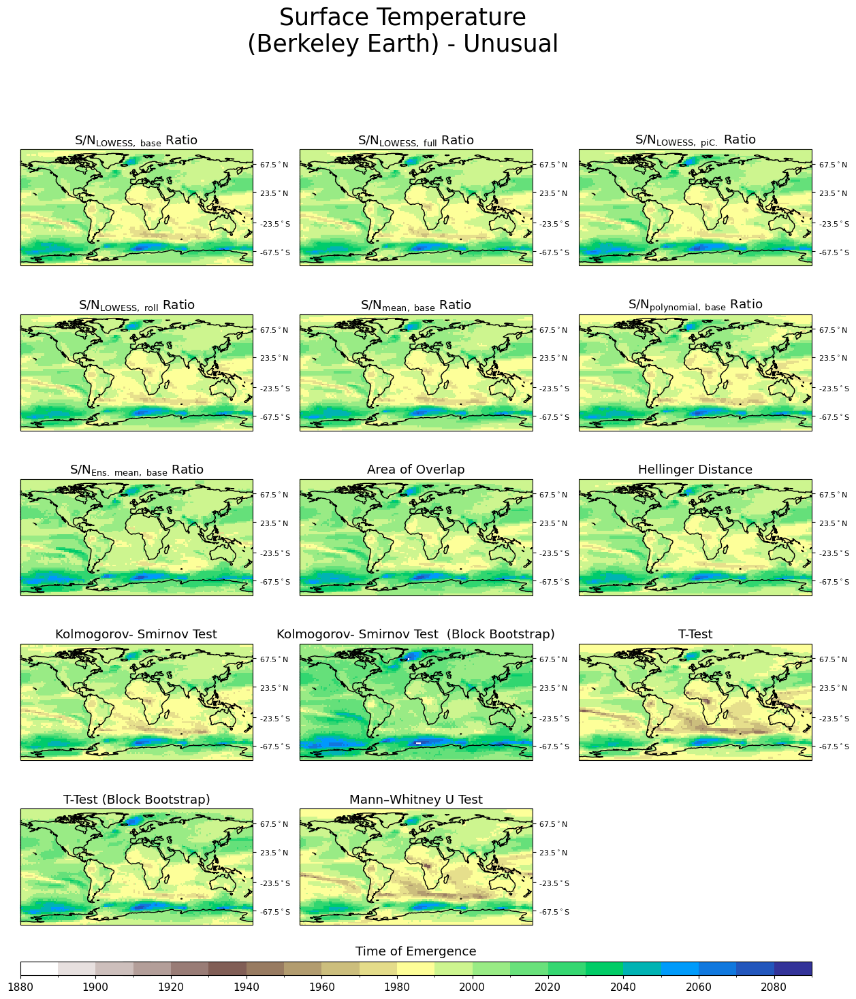

In [173]:
fig, axes, bottom_axes = nf5.plot_time_of_emergence_maps_single_var(
    toe_ds=toe_50pct_tree['access_ssp585_tas'].ds.sel(window=30),
    does_not_emerge_ds=does_not_emerge_50pct_tree['access_ssp585_tas'].ds.sel(window=30),
    # data_availability_ds=data_availability_tree['access_ssp585_tas'].ds,
    tests_subset_used = metrics_dict['supplementary'],
    levels = PLOT_LEVELS['access_ssp585_tas'],
    cmap=plt.cm.terrain_r, ncol=3
)

fig.suptitle(toe_plots.NAME_MAPPING['best_tas']  + ' - Unusual', fontsize=25, y=1)

In [174]:
'''
Descrtiption:
- Outer-grouped by different meodels with an outer-column that is LHS maps and RHS timeseries
'''

# ROW_H=2.2
# CB_H=0.6
# cb_ratio=0.3
# figsize_w=10.5
# hspace=.29
# rows_per_gs = [2, 2, 2]
# metrics=[
#         'sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi', 'frac', 'ks', 'ttest']

# levels = PLOT_LEVELS['access_ssp585_tas']

# labels = (
#         'Berkley Earth Surface Temperature',
#         'ACCESS-ESM1-5: Surface Temperature',
#         'ACCESS-ESM1- : Annual Total Precipitation')
# ds_list=[
#         toe_50pct_tree['best_tas'].ds.sel(window=30),
#         toe_50pct_tree['access_ssp585_tas'].ds.sel(window=30),
#         toe_50pct_tree['access_ssp585_pr'].ds.sel(window=30)
#     ]
# width_ratios = [1, 0.3]


# # sizes
# fig_h = ROW_H * sum(rows_per_gs) + CB_H

# fig = plt.figure(figsize=(figsize_w*sum(width_ratios), fig_h/4*ncols,))
# # outer grid (+1 for colorbar row)
# outer_gs = gridspec.GridSpec(
#     len(ds_list) + 1, 2, hspace=hspace,
#     height_ratios=list(rows_per_gs) + [cb_ratio], width_ratios = width_ratios, wspace=0.1
# )

# axes_blocks = []
# for i, (label, ds) in enumerate(zip(labels, ds_list)):
#     # label just above each block
#     bb = outer_gs[i, 0].get_position(fig)
#     fig.text(0.5, bb.y1 + 0.015, label, ha='center', va='bottom',
#              fontsize=16, weight='bold')

#     axes =  plot_all_ds_vars(fig, outer_gs[i, 0], ds, metrics, levels=levels,
#                            # data_availability_ds=data_availability_ds, 
#                             ncols=ncols)

#     axes_blocks.append(axes)


# axes_time_series = [fig.add_subplot(outer_gs[i, 1]) for i in range(3)]

# for i, branch in enumerate(emergence_time_series_50pct_tree):
#     ax = axes_time_series[i]
#     toe_plots.percent_emerged_series(
#         emergence_time_series_50pct_tree[branch].ds.sel(region='global').sel(window=30), metrics,
#         ax=ax, legend=False, fontscale=1.2)

'\nDescrtiption:\n- Outer-grouped by different meodels with an outer-column that is LHS maps and RHS timeseries\n'

In [175]:
# Description:
# - This was used when the base period was different for the ToE methods (central year was not the same)
# - As such, it was time until ToE. 

# # As the end window shrinks, the final year will change depending on the window length
# final_year = data_tree.best_tas.time.dt.year.values[-1]
# window_hyp_bbs_ds = correct_toe_final_year(window_hyp_tree.best_tas.ds, final_year)

# # Even thought base periods all start at the same year. The central year shifts. Correcting for this
# middle_base_year = (window_hyp_bbs_ds.window.values/2 + data_tree.best_tas.time.dt.year.values[0]).astype(int)
# window_hyp_bbs_until_toe_ds = window_hyp_bbs_ds - xr.DataArray(middle_base_year, dims="window", coords={"window": window_hyp_bbs_ds.window})

# # This jsut seems to happen with some t-test value being 0 where emergence does not occur
# window_hyp_bbs_until_toe_ds = xr.where(window_hyp_bbs_until_toe_ds >= 0, window_hyp_bbs_until_toe_ds, np.nan).persist()
# window_hyp_bbs_until_toe_ds = xr.where(does_not_emerge_hype_ds, np.nan, window_hyp_bbs_until_toe_ds)
# # wait(window_hyp_bbs_until_toe_ds);


# window_tests = ['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window']
# does_not_emerge_hype_ds = does_not_emerge_tree.best_tas.ds[window_tests].copy()

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Difference Maps</h2>

In [ ]:
def create_custom_coolwarm():
    """Creates a modified coolwarm colormap with white inserted in the middle."""
    # Get the original coolwarm colormap
    coolwarm = plt.get_cmap("coolwarm", 10)

    # Extract colors
    colors = coolwarm(np.linspace(0, 1, 10))

    # Insert white in the middle
    mid = len(colors) // 2
    white = np.array([[1, 1, 1, 1]])  # Pure white (RGBA)
    
    # Insert white at the center
    new_colors = np.vstack([colors[:mid], white, colors[mid:]])

    # Clip to the original length
    indices = np.linspace(0, len(new_colors) - 1, 10).astype(int)
    new_colors = new_colors[indices]

    # Create a new colormap
    custom_coolwarm = mcolors.LinearSegmentedColormap.from_list("custom_coolwarm", new_colors)
    
    return custom_coolwarm

In [ ]:
num_steps = 20
num_whites = 2

In [ ]:
import cmocean
import matplotlib.colors as mcolors

In [ ]:
list_cmap = plt.get_cmap('coolwarm', num_steps)(np.linspace(0, 1, num_steps))
new_list = np.concatenate([
    list_cmap[num_whites:num_steps//2-num_whites],
    [[1,1,1,1]]*2*num_whites,
    list_cmap[num_steps//2+num_whites:-num_whites]])
new_cmap = mcolors.LinearSegmentedColormap.from_list('cool', new_list)

In [ ]:
new_cmap

In [ ]:

fig, axes, bottom_axes = nf5.plot_time_of_emergence_maps_single_var(
    toe_ds=(
        toe_tree['access_ssp585_pr'].ds.sn_lowess_base.median(dim='member') -
        toe_tree['access_ssp585_pr'].ds[metrics_dict['supplementary']].median(dim='member')
    ),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_pr'].ds.sel(window=30).median(dim='member'),
    data_availability_ds=data_availability_tree['access_ssp585_pr'].ds.median(dim='member'),
    tests_subset_used =metrics_dict['supplementary'], #metrics_dict['main'] ,#main_toe_metrics_no_hype,
    levels = np.arange(-50, 55,  5),
    cmap=cmocean.cm.balance,
    ncol=3,
    cbar_title='Time of Emergence Difference'
)

bottom_axes.annotate(toe_plots.METRIC_MAP['sn']+' Later', xy=(0.8, 1.3), xycoords='axes fraction', size=13)
bottom_axes.annotate(toe_plots.METRIC_MAP['sn']+' Earlier', xy=(0., 1.3), xycoords='axes fraction', size=13)

fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_pr'] + ' - Unusual', fontsize=25, y=0.98)

In [ ]:


fig, axes, bottom_axes = nf5.plot_time_of_emergence_maps_single_var(
    toe_ds=(
    toe_tree['access_ssp585_tas'].ds.sn_lowess_base.median(dim='member') -
    toe_tree['access_ssp585_tas'].ds[metrics_dict['supplementary']].sel(window=30).median(dim='member')),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_tas'].ds.sel(window=30).median(dim='member'),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].ds.median(dim='member'),
    tests_subset_used = metrics_dict['supplementary'],#main_toe_metrics_no_hype,
    levels = np.arange(-50, 55,  5),
    cmap=cmocean.cm.balance,
    ncol=3,
    cbar_title='Time of Emergence Difference'
)


bottom_axes.annotate(toe_plots.METRIC_MAP['sn']+' Later', xy=(0.8, 1.3), xycoords='axes fraction', size=13)
bottom_axes.annotate(toe_plots.METRIC_MAP['sn']+' Earlier', xy=(0., 1.3), xycoords='axes fraction', size=13)

fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_tas'] + ' - Unusual', fontsize=25, y=0.98)

In [ ]:
toe_best_diff = toe_tree['best_tas'].ds.sn_lowess_base - toe_tree['best_tas'].ds#[metrics_dict['supplementary']]

In [ ]:
plt.scatter(
    toe_tree['best_tas'].ds.sn_lowess_base.values,
    toe_tree['best_tas'].ds.ks.values, s=0.4)

In [ ]:
ncol = 1
num_rows = 1
fig = plt.figure(figsize=(5 * ncol, 4))

# Create GridSpec
gs = gridspec.GridSpec(
    num_rows + 1, ncol,  # +1 for the colorbar row
    height_ratios=[1] * num_rows + [0.1],  # Last row reserved for colorbar
    wspace=0.2, hspace=0.25
)


fig, axes, bottom_axes = nf5.plot_time_of_emergence_maps_single_var(
    toe_ds=toe_tree['best_tas'].ds.sn_lowess_base - toe_tree['best_tas'].ds.sel(window=30),
    does_not_emerge_ds=does_not_emerge_tree['best_tas'].ds.sel(window=30),
    data_availability_ds=data_availability_tree['best_tas'].ds,
    tests_subset_used = ['frac'],#main_toe_metrics_no_hype,
    levels = np.arange(-50, 55,  5), fig = fig, gs=gs,
    cmap=cmocean.cm.balance,
    ncol=1,cbar_title='Time of Emergence Difference'
)


bottom_axes.annotate('S/N Ratio\nLater', xy=(0.95, 1.3), xycoords='axes fraction', size=10)
bottom_axes.annotate('S/N Ratio\nEariler', xy=(-0.1, 1.3), xycoords='axes fraction', size=10)

# fig.suptitle(toe_plots.NAME_MAPPING['best_tas'] + ' - Unusual', fontsize=25, y=0.98)

In [ ]:
np.array(metrics_dict['main'])

In [ ]:
fig, axes, bottom_axes = nf5.plot_time_of_emergence_maps_single_var(
    toe_ds=toe_tree['best_tas'].ds.sn_lowess_base - toe_tree['best_tas'].ds.sel(window=30),
    does_not_emerge_ds=does_not_emerge_tree['best_tas'].ds.sel(window=30),
    data_availability_ds=data_availability_tree['best_tas'].ds,
    tests_subset_used = ['sn_lowess_base', 'sn_lowess_full', 'sn_mean_base',
       'sn_poly4_base', 'frac', 'ks', 'ttest'],
    levels = np.arange(-50, 55,  5),
    cmap=cmocean.cm.balance,
    ncol=3,cbar_title='Time of Emergence Difference'
)


bottom_axes.annotate(toe_plots.METRIC_MAP['sn']+' Later', xy=(0.8, 1.3), xycoords='axes fraction', size=13)
bottom_axes.annotate(toe_plots.METRIC_MAP['sn']+' Earlier', xy=(0., 1.3), xycoords='axes fraction', size=13)

fig.suptitle(toe_plots.NAME_MAPPING['best_tas'] + ' - Unusual', fontsize=25, y=0.98)

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>  Difference Plots  </h2>


### Calculation

In [ ]:
from toe_calc import create_kde
import seaborn as sns

In [ ]:
kde_kwargs= dict(bw_method=0.2) # silverman, scott#bw_method=0.2)

In [ ]:
def make_diff(ds: xr.Dataset) -> xr.Dataset:
    """Return difference between sn_lowess_base and the dataset, stacked over lat/lon."""
    if check_for_null(ds): return None
    diff_ds = (ds.sn_lowess_base - ds).stack(latlon=['lat', 'lon']).persist()
    all_vars = [f for f in list(diff_ds) if f != 'sn_lowess_base']
    diff_ds = diff_ds[all_vars]
    return diff_ds

In [ ]:
diff_tree = toe_50pct_tree.map_over_datasets(make_diff)#.persist()
# wait(diff_tree);÷

In [ ]:
diff_unfamiliar_tree = toe_50pct_unfamiliar_tree.map_over_datasets(make_diff)#.persist()
# wait(diff_unfamiliar_tree);

In [ ]:
diff_unknown_tree = toe_50pct_unknown_tree.map_over_datasets(make_diff)#.persist()
# wait(diff_unfamiliar_tree);

### Violin Plots

In [ ]:
def add_summary_table(ax, stats, variables, col_labels):
    medians = [f"{stats[v][0]:.1f}" for v in variables]
    iqrs = [f"{stats[v][1]:.1f}" for v in variables]

    cell_text = [medians, iqrs]
    row_labels = ["Med", "IQR"]

    table = ax.table(cellText=cell_text,
                     rowLabels=row_labels,
                     colLabels=col_labels,
                     loc="bottom",
                     cellLoc="center")

    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.0)

    # Clean style
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_height(cell.get_height() * 2.0)
        if col == -1:  # row labels
            cell.visible_edges = "LRTB"
        else:
            cell.visible_edges = "TB"

    return table


In [ ]:



def add_summary_text(ax, stats, variables, extra_y = 25):
    xticks = np.arange(len(variables))

    yticks = ax.get_yticks()
    ymin, ymax = ax.get_ylim()
    yticks = [t for t in yticks if ymin <= t <= ymax]

    ax.set_yticks(yticks)
    ax.set_ylim(ymin, ymax + extra_y)

    # Place numbers above each violin (your version)
    for i, var in enumerate(variables):
        median, iqr = stats[var]
        ax.text(i, ymax + extra_y*2/3, f"{median:.1f}",
                ha="center", va="center", fontsize=12)
        
        ax.text(i, ymax + extra_y*1/3, f"{iqr:.1f}",
                ha="center", va="center", fontsize=12)
        
    # Add row labels on the left, in axes-fraction coords
    ax.annotate(
        "Med.", xy=(-0.01, ymax + extra_y*2/3),
        xycoords=('axes fraction', 'data'), ha="right", va="center", fontsize=12)

    ax.annotate(
        "IQR", xy=(-0.01, ymax + extra_y*1/3),
        xycoords=('axes fraction', 'data'), ha="right", va="center", fontsize=12)

    
    # Add horizontal line under the block
    xmin, xmax = ax.get_xlim()
    hline_y = ymax #+ extra_y) - 3
    ax.axhline(y=hline_y, color="black",
               linestyle="-", linewidth=1, xmin=0, xmax=1)

    xticks = ax.get_xticks()
    tick_diff = np.unique(np.diff(xticks))[0]
    for i in range(len(xticks) - 1):
        xmiddle_loc = np.mean([xticks[i], xticks[i+1]])
        ax.vlines(xmiddle_loc, ymin=hline_y, ymax=ymax + extra_y,
                  colors="k", linewidth=1)

    xmin_true, xmax_true = np.take(ax.get_xticks(), [0, -1])
    ax.set_xlim(xmin_true-tick_diff/2, xmax_true+tick_diff/2)

In [ ]:
def metric_violin_with_text(ds, kind="violin", figsize=(12, 6),
                            variables=None, ax=None, ylim=None, color=None,
                           logginglevel='ERROR'):
    """
    Plot a separate distribution (violin or box) for each variable in an xarray.Dataset.
    Adds a summary table of median and IQR below the x-axis.
    """
    utils.change_logginglevel(logginglevel)
    if variables is None:
        variables = list(ds.data_vars)
    else:
        variables = [v for v in variables if v in ds.data_vars]

    if not variables:
        raise ValueError("No matching variables found in ds.data_vars.")

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    stats = {}

    logger.info(f'variables\{variables}')
    for var in variables:
        logger.debug(var)
        values = ds[var].values.ravel()
        values = values[~np.isnan(values)]
        data = {"x": [var] * len(values), "y": values}
        logger.debug(f'\n{values}\n')

        this_color = color or toe_plots.TEST_STYLES.get(var, {}).get('color', 'lightgrey')
        logger.debug(f'{color=}')

        if kind == "violin":
            logger.debug('violing plot')
            sns.violinplot(
                x="x", y="y", data=data,
                cut=0, ax=ax, bw_adjust=2,
                color=this_color, alpha=0.7,
                inner="box", linewidth=1.8, linecolor="black"
            )
        elif kind == "box":
            sns.boxplot(x="x", y="y", data=data, color=this_color, ax=ax)
        else:
            raise ValueError("kind must be 'violin' or 'box'")

        median = np.nanmedian(values)
        q25, q75 = np.nanpercentile(values, [25, 75])
        stats[var] = (median, q75 - q25)

    ax.axhline(0, color="k", linestyle="--", linewidth=1)
    if ylim: ax.set_ylim(ylim)
    ax.set_title("Distribution by variable")

    col_labels = [
        toe_plots.METRIC_MAP.get(label.get_text(), label.get_text())
            .replace('Ratio', '')
            .replace('N', 'N\nRatio\n')
        for label in ax.get_xticklabels()
    ]
    ax.set_xticklabels(col_labels, rotation=0)

    add_summary_text(ax, stats, variables)
    return stats


In [ ]:
dataset = 'access_ssp585_pr'#'access_ssp585_tas', best_tas

fig = plt.figure(figsize=(12, 10)) # (12, 12)
gs = gridspec.GridSpec(3, 1, hspace=0.15)
axes = [fig.add_subplot(gs[i, 0]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes[0], ylim=(-50, 20))
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes[1], ylim=(-50, 20))
metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes[2], ylim=(-50, 20))

# titles
# for ax, label in zip(axes, row_labels):
#     ax.set_ylabel('ToE Difference\n(years)', fontsize=14)
#     ax.tick_params(axis='y', labelsize=10)
#     ax.tick_params(axis='x', labelsize=10)
#     ax.set_title(None)


ax = axes[0]
xticklabels = [
    'LOWESS\nFull series', 'LOWESS\npiControl', 'LOWESS\nRolling',
    'Rolling Mean\nBase Period', 'Polynomial\nBase Period',
    'Area of\nOverlap', 'Hellinger\nDistance'
]

xticks = ax.get_xticks()
tick_diff = np.diff(xticks)[0]

ax.set_xticklabels([])
ax.set_xlabel(None)

for loc, lbl in zip(xticks, xticklabels):
    ax.annotate(lbl, (loc-tick_diff/4, 1.25), xycoords=('data', 'axes fraction'),
                xytext=(0, -10), textcoords='offset points',
                ha='left', va='top', fontsize=12)

ax.xaxis.tick_top()



for ax in axes[1:]:
    ax.set_xticklabels([])
    ax.set_xlabel(None)


In [ ]:
# metrics_dict['main'] = ['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi','sn_lowess_roll',
#              'sn_mean_base', 'sn_poly4_base', 'frac', 'hd']

In [ ]:
levels = PLOT_LEVELS['access_ssp585_tas']

In [ ]:
dataset = 'access_ssp585_tas'
windows = [30, 70]
rename_map = {w: f"{w}_bbs" for w in windows}

# --- KS and t-test datasets ---
bbs_ks_ds_reformat = (
    toe_50pct_tree_all.unusual[dataset].ds.ks_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)
ks_to_plot = xr.merge([
    toe_50pct_tree_all.unusual[dataset].ds.ks_window.to_dataset(dim='window'),
    bbs_ks_ds_reformat
])

bbs_ttest_ds_reformat = (
    toe_50pct_tree_all.unusual[dataset].ds.ttest_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)
ttest_to_plot = xr.merge([
    toe_50pct_tree_all.unusual[dataset].ds.ttest_window.to_dataset(dim='window'),
    bbs_ttest_ds_reformat
])

# --- Diff tree reformat for KS and t-test ---
diff_bbs_ks = (
    diff_tree[dataset].ks_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)
diff_ks_to_plot = xr.merge([
    diff_tree[dataset].ks_window.to_dataset(dim='window'),
    diff_bbs_ks
])

diff_bbs_ttest = (
    diff_tree[dataset].ttest_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)
diff_ttest_to_plot = xr.merge([
    diff_tree[dataset].ttest_window.to_dataset(dim='window'),
    diff_bbs_ttest
])

# --- Figure layout ---
fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.1],
                       width_ratios=[1, 0.7],
                       wspace=0.15, hspace=0.25)

# --- Left column: maps ---
axes_top = plot_all_ds_vars(fig, gs[0, 0], ks_to_plot, fontsize=14,
                            metrics=list(ks_to_plot), ncols=3)
axes_mid = plot_all_ds_vars(fig, gs[1, 0], ttest_to_plot, fontsize=14,
                            metrics=list(ttest_to_plot), ncols=3)




for ax in [*axes_top, *axes_mid]:
    title = ax.get_title()
    if 'bbs' in title: title = f"BBS {title.replace('_bbs', '')}"
    ax.set_title(title)


# --- Right column: violins ---
axes_violin = [fig.add_subplot(gs[i, 1]) for i in range(3)]

metric_violin_with_text(
    diff_ks_to_plot,
    variables=list(diff_ks_to_plot),
    ax=axes_violin[0],
    ylim=(-50, 50), color=toe_plots.TEST_STYLES['ks']['color']
)

metric_violin_with_text(
    diff_ttest_to_plot,
    variables=list(diff_ttest_to_plot),
    ax=axes_violin[1],
    ylim=(-50, 50), color=toe_plots.TEST_STYLES['ttest']['color']
)


for ax in axes_violin:
    ax.set_ylabel('ToE Difference (years)', fontsize=14)

axes_violin[2].axis('off')

# --- Titles above rows ---
axes_blocks = [axes_top, axes_mid]
labels_main = ['KS Test', 'T-test']
for label, row_axes in zip(labels_main, axes_blocks):
    ax = row_axes[0]
    ax.annotate(label, xy=(0, 1.3), xycoords='axes fraction',
                ha='left', va='center', fontsize=18, fontweight='bold')




# --- Move x-tick labels to top for violins ---
for ax in axes_violin:
    xticklabels = [x.get_text() for x in ax.get_xticklabels()]
    xticklabels = [
        f"BBS\n{x.replace('_bbs', '')}" if '_bbs' in x else x
        for x in xticklabels
    ]
    ax.set_xticklabels(xticklabels)
    ax.xaxis.tick_top()
    ax.tick_params(axis='x', labelrotation=0, labelsize=14)
    ax.set_xlabel(None)
    ax.set_title(None)

# --- Colorbar ---
cax = fig.add_subplot(gs[-1, 0])
plotting_utils.create_discrete_colorbar(
    my_cmap, levels, cax, 'Time of Emergence',
    fontscale=1.2, orientation='horizontal', pad=7,
    tick_slice=slice(None, None, 2)
)

In [ ]:
map_metrcs = ['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_roll', 'sn_lowess_pi', 'sn_mean_base',
       'sn_poly4_base', 'frac', 'hd', 'ks', 'ttest']
map_metrcs

In [ ]:
toe_50pct_tree_all.unusual[dataset].ds.ttest.max()

In [ ]:
dataset = 'access_ssp585_pr'

fig = plt.figure(figsize=(16, 20))
gs = gridspec.GridSpec(4, 2, height_ratios=[4, 3, 3]+[0.2], width_ratios=[1, 0.7], wspace=0.25, hspace=0.2)

# --- Left column: maps ---

var_kwargs = dict(metrics=map_metrcs, ncols=3)#, title=False)

axes_top = plot_all_ds_vars(fig, gs[0, 0], toe_50pct_tree_all.unusual[dataset].ds,#.sel(window=30),
                            **var_kwargs)
axes_mid =plot_all_ds_vars(fig, gs[1, 0], toe_50pct_tree_all.unfamiliar[dataset].ds,#.sel(window=30),
                           **var_kwargs)
axes_bottom =plot_all_ds_vars(fig, gs[2, 0], toe_50pct_tree_all.unknown[dataset].ds,#.sel(window=30),
                              **var_kwargs)

# --- Right column: violins ---
axes = [fig.add_subplot(gs[i, 1]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
# ylim = (-50, 20)
ylim = (-50, 50)

metric_violin_with_text(diff_tree[dataset], variables=map_metrcs, ax=axes[0], ylim=ylim
                       , logginglevel='ERROR')
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=map_metrcs, ax=axes[1], ylim=ylim)
metric_violin_with_text(diff_unknown_tree[dataset], variables=map_metrcs, ax=axes[2], ylim=ylim)

# titles
for ax, label in zip(axes, row_labels):
    ax.set_ylabel('ToE Difference (years)', fontsize=14)
    ax.tick_params(axis='y', labelsize=10)
    ax.tick_params(axis='x', labelsize=10)
    ax.set_title(None)

xticklabels = [
    'LOWESS\nFull series', 'LOWESS\npiControl', 'LOWESS\nRolling',
    'Rolling Mean\nBase Period', 'Polynomial\nBase Period',
    'Area of\nOverlap', 'Hellinger\nDistance', 'Kolmogorov-\nSmirnov', 
    'T-Test'
]


for num,ax in enumerate(np.take(axes, [0, -1])):
    xticks = ax.get_xticks()
    tick_diff = np.diff(xticks)[0]
    
    ax.set_xticklabels([])
    ax.set_xlabel(None)
    
    for loc, lbl in zip(xticks, xticklabels):
        ax.annotate(lbl, (loc-tick_diff/4, 1.07 if num==0 else -0.05), xycoords=('data', 'axes fraction'),
                    xytext=(0, -10), textcoords='offset points',
                    ha='left', va='bottom' if num == 0 else 'top', fontsize=12, rotation=90)
    
    ax.xaxis.tick_top()

for ax in axes[1:2]:
    ax.set_xticklabels([])
    ax.set_xlabel(None)

for ax in axes[1:]:
    ax.set_xlim(-0.5, 8.5)

    
# --- Titles and formatting ---
labels_main = ['Unusual:', 'Unfamiliar:', 'Unknown:']
labels_sub = ['S/N > 1; AO < 63%', 'S/N > 2; AO < 32%', 'S/N > 3; AO < 13%']

axes_blocks = [axes_top, axes_mid, axes_bottom]
for i, row_axes in enumerate(axes_blocks):
    ax = row_axes[0]
    ax.annotate(labels_main[i], xy=(0, 1.3), xycoords='axes fraction',fontsize=16, fontweight='bold', ha='left')
    ax.annotate(labels_sub[i], xy=(0.6, 1.3), xycoords='axes fraction', fontsize=16, ha='left' )

cax = fig.add_subplot(gs[-1, 0])
cbar = plotting_utils.create_discrete_colorbar(
    my_cmap, levels, cax, 'Time of Emergence',
    fontscale=1.2, orientation='horizontal', pad=7,
    tick_slice=slice(None, None, 2)
)

In [ ]:
dataset = 'best_tas'

fig = plt.figure(figsize=(16, 18))
gs = gridspec.GridSpec(4, 2, height_ratios=[1]*3+[0.2], width_ratios=[1, 0.7], wspace=0.15, hspace=0.2)

# --- Left column: maps ---

var_kwargs = dict(metrics=map_metrcs, ncols=3)#, title=False)

axes_top = plot_all_ds_vars(fig, gs[0, 0], toe_50pct_tree_all.unusual[dataset].ds.sel(window=30), **var_kwargs)
axes_mid =plot_all_ds_vars(fig, gs[1, 0], toe_50pct_tree_all.unfamiliar[dataset].ds.sel(window=30), **var_kwargs)
axes_bottom =plot_all_ds_vars(fig, gs[2, 0], toe_50pct_tree_all.unknown[dataset].ds.sel(window=30), **var_kwargs)

# --- Right column: violins ---
axes = [fig.add_subplot(gs[i, 1]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
ylim = (-100, 100)
# ylim = (-50, 20)
metric_violin_with_text(diff_tree[dataset], variables=map_metrcs, ax=axes[0], ylim=ylim,
                       logginglevel='INFO')
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=map_metrcs, ax=axes[1], ylim=ylim)
metric_violin_with_text(diff_unknown_tree[dataset], variables=map_metrcs, ax=axes[2], ylim=ylim)

# titles
for ax, label in zip(axes, row_labels):
    ax.set_ylabel('ToE Difference (years)', fontsize=14)
    ax.tick_params(axis='y', labelsize=10)
    ax.tick_params(axis='x', labelsize=10)
    ax.set_title(None)

xticklabels = [
    'LOWESS\nFull series', 'LOWESS\nRolling',
    'Rolling Mean\nBase Period', 'Polynomial\nBase Period',
    'Area of\nOverlap', 'Hellinger\nDistance', 'Kolmogorov-\nSmirnov', 
    'T-Test'
]


for num,ax in enumerate(np.take(axes, [0, -1])):
    xticks = ax.get_xticks()
    tick_diff = np.diff(xticks)[0]
    
    ax.set_xticklabels([])
    ax.set_xlabel(None)
    
    for loc, lbl in zip(xticks, xticklabels):
        ax.annotate(lbl, (loc-tick_diff/4, 1.07 if num==0 else -0.05), xycoords=('data', 'axes fraction'),
                    xytext=(0, -10), textcoords='offset points',
                    ha='left', va='bottom' if num == 0 else 'top', fontsize=12, rotation=90)
    
    ax.xaxis.tick_top()

for ax in axes[1:2]:
    ax.set_xticklabels([])
    ax.set_xlabel(None)

for ax in axes[1:]:
    ax.set_xlim(-0.5, 7.5)


# --- Titles and formatting ---
labels_main = ['Unusual:', 'Unfamiliar:', 'Unknown:']
labels_sub = ['S/N > 1; AO < 63%', 'S/N > 2; AO < 32%', 'S/N > 3; AO < 13%']

axes_blocks = [axes_top, axes_mid, axes_bottom]
for i, row_axes in enumerate(axes_blocks):
    ax = row_axes[0]
    ax.annotate(labels_main[i], xy=(0, 1.3), xycoords='axes fraction',fontsize=16, fontweight='bold', ha='left')
    ax.annotate(labels_sub[i], xy=(0.65, 1.3), xycoords='axes fraction', fontsize=16, ha='left' )

cax = fig.add_subplot(gs[-1, 0])
cbar = plotting_utils.create_discrete_colorbar(
    my_cmap, levels, cax, 'Time of Emergence',
    fontscale=1.2, orientation='horizontal', pad=7,
    tick_slice=slice(None, None, 2)
)


In [ ]:
dataset = 'access_ssp585_tas'
windows = [30, 70]
rename_map = {w: f"{w}_bbs" for w in windows}

# --- KS and t-test datasets ---
bbs_ks_ds_reformat = (
    toe_50pct_tree_all.unusual[dataset].ds.ks_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)
ks_to_plot = xr.merge([
    toe_50pct_tree_all.unusual[dataset].ds.ks_window.to_dataset(dim='window'),
    bbs_ks_ds_reformat
])

bbs_ttest_ds_reformat = (
    toe_50pct_tree_all.unusual[dataset].ds.ttest_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)
ttest_to_plot = xr.merge([
    toe_50pct_tree_all.unusual[dataset].ds.ttest_window.to_dataset(dim='window'),
    bbs_ttest_ds_reformat
])

# --- Figure layout ---
fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.2],
                       width_ratios=[1, 0.7],
                       wspace=0.15, hspace=0.2)

# --- Left column: maps ---
axes_top = plot_all_ds_vars(fig, gs[0, 0], ks_to_plot,
                            metrics=list(ks_to_plot), ncols=3)
axes_mid = plot_all_ds_vars(fig, gs[1, 0], ttest_to_plot,
                            metrics=list(ttest_to_plot), ncols=3)

# --- Right column: violins ---
axes_violin = [fig.add_subplot(gs[i, 1]) for i in range(3)]
# metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes_violin[0], ylim=(-50, 20))
# metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes_violin[1], ylim=(-50, 20))
# metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes_violin[2], ylim=(-50, 20))

# --- Colorbar ---
cax = fig.add_subplot(gs[-1, 0])
cbar = plotting_utils.create_discrete_colorbar(
    my_cmap, levels, cax, 'Time of Emergence',
    fontscale=1.2, orientation='horizontal', pad=7,
    tick_slice=slice(None, None, 2)
)


In [ ]:
windows = [30, 70]
rename_map = {w: f"{w}_bbs" for w in windows}

bbs_ks_ds_reformat = (
    toe_50pct_tree_all.unusual[dataset].ds.ks_bbs_window
    .sel(window=windows)
    .to_dataset(dim='window')
    .rename(rename_map)
)


ks_to_plot = xr.merge([toe_50pct_tree_all.unusual[dataset].ds.ks_window.to_dataset(dim='window'),
          bbs_ks_ds_reformat])

dataset = 'access_ssp585_tas'

fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(3, 2, height_ratios=[1]*2+[0.2], width_ratios=[1, 0.7], wspace=0.15, hspace=0.2)

# --- Left column: maps ---


windows = list(ks_to_plot)

var_kwargs = dict(metrics=windows, ncols=3)

axes_top = plot_all_ds_vars(fig, gs[0, 0], ks_to_plot, 
                            **var_kwargs)

# axes_top = plot_all_ds_vars(fig, gs[0, 0], toe_50pct_tree_all.unusual[dataset].ds.ks_window.to_dataset(dim='window'), 
#                             **var_kwargs)
# axes_mid =plot_all_ds_vars(fig, gs[1, 0], toe_50pct_tree_all.unfamiliar[dataset].ds.sel(window=30), **var_kwargs)
# axes_bottom =plot_all_ds_vars(fig, gs[2, 0], toe_50pct_tree_all.unknown[dataset].ds.sel(window=30), **var_kwargs)

# --- Right column: violins ---
axes = [fig.add_subplot(gs[i, 1]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
# metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes[0], ylim=(-50, 20))
# metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes[1], ylim=(-50, 20))
# metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes[2], ylim=(-50, 20))

# # titles
# for ax, label in zip(axes, row_labels):
#     ax.set_ylabel('ToE Difference (years)', fontsize=14)
#     ax.tick_params(axis='y', labelsize=10)
#     ax.tick_params(axis='x', labelsize=10)
#     ax.set_title(None)
# cax = fig.add_subplot(outer_gs[-1, 0])
# cbar = plotting_utils.create_discrete_colorbar(
#     my_cmap, levels, cax, 'Time of Emergence',
#     fontscale=1.2, orientation='horizontal', pad=7,
#     tick_slice=slice(None, None, 2)
# )

In [ ]:
%%time


fig, axes_blocks, cbar = plot_branch_vars(
    rows_per_gs = [2]*3, ncols=4, hspace= .35,
    metrics=['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi','sn_lowess_roll',
             'sn_mean_base', 'sn_poly4_base', 'frac', 'hd'],
    levels = PLOT_LEVELS['access_ssp585_tas'],
    labels=None,
    ds_list=[
        toe_50pct_tree[dataset].ds.sel(window=30),
        toe_50pct_unfamiliar_tree[dataset].ds.sel(window=30),
        toe_50pct_unknown_tree[dataset].ds.sel(window=30)
    ])

# axes_blocks is an array of blocks, which are 2d, so 3d array.
add_data_clarity_legend(axes_blocks[-1][-3], bbox_to_anchor=(0.76, -0.14), fontscale=1.1)

labels_main = ['Unusual:', 'Unfamiliar:', 'Unknown:']
labels_sub = ['S/N > 1; AO < 63%', 'S/N > 2; AO < 32%', 'S/N > 3; AO < 13%']
for i, row_axes in enumerate(axes_blocks):
    ax = row_axes[0]
    ax.annotate( labels_main[i], xy=(0, 1.3), xycoords='axes fraction',fontsize=16, fontweight='bold', ha='left')
    ax.annotate( labels_sub[i], xy=(0.6, 1.3), xycoords='axes fraction', fontsize=16, ha='left' )

# fig.suptitle(toe_plots.NAME_MAPPING[dataset], fontsize=25, y=0.96)
# fig.savefig(f'/g/data/w40/ab2313/images/completion_seminar/supp_toe_maps_{dataset}_01.png', bbox_inches='tight', dpi=500)

In [ ]:
dataset = 'access_ssp585_tas'#'access_ssp585_tas', best_tas

fig = plt.figure(figsize=(12, 12)) # (12, 12)
gs = gridspec.GridSpec(3, 1, hspace=0.5)
axes = [fig.add_subplot(gs[i, 0]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes[0], ylim=(-50, 20))
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes[1], ylim=(-50, 20))
metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes[2], ylim=(-50, 20))

# titles
axes[0].set_title(dataset)
row_labels = ["Unusual", "Unfamiliar", "Unknown"]
for ax, label in zip(axes, row_labels):
    ax.set_title(label, fontsize=18)
    ax.set_ylabel('ToE Difference\n(years)', fontsize=14)
    ax.set_xlabel('Method', fontsize=14)
    ax.set_xlabel(None)
    ax.tick_params(axis='y', labelsize=10)
    ax.tick_params(axis='x', labelsize=10)


ax = axes[0]
xticklabels = [
    'LOWESS\nFull series', 'LOWESS\npiControl', 'LOWESS\nRolling',
    'Rolling Mean\nBase Period', 'Polynomial\nBase Period',
    'Area of\nOverlap', 'Hellinger\nDistance'
]

xticks = ax.get_xticks()
tick_diff = np.diff(xticks)[0]

ax.set_xticklabels([])

for loc, lbl in zip(xticks, xticklabels):
    ax.annotate(lbl, (loc-tick_diff/4, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -10), textcoords='offset points',
                ha='left', va='top', fontsize=12)


In [ ]:
dataset = 'access_ssp585_tas'#'access_ssp585_tas', best_tas

fig = plt.figure(figsize=(12, 12)) # (12, 12)
gs = gridspec.GridSpec(3, 1, hspace=.5)
axes = [fig.add_subplot(gs[i, 0]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes[0], ylim=(-50, 20))
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes[1], ylim=(-50, 20))
metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes[2], ylim=(-50, 20))

# titles
axes[0].set_title(dataset)
row_labels = ["Unusual", "Unfamiliar", "Unknown"]
for ax, label in zip(axes, row_labels):
    ax.set_title(label, fontsize=18)
    ax.set_ylabel('ToE Difference\n(years)', fontsize=14)
    ax.set_xlabel('Method', fontsize=14)
    ax.set_xlabel(None)
    ax.tick_params(axis='y', labelsize=10)
    ax.tick_params(axis='x', labelsize=10)

# fig.suptitle(toe_plots.NAME_MAPPING[dataset].replace('\n', ' '), fontsize=20, y=0.93, fontweight='bold')

In [ ]:
metrics_dict['main'] = [
    'sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi', 'sn_lowess_roll', 'sn_mean_base', 'sn_poly4_base',
    'frac', 'hd']

In [ ]:
fig = plt.figure(figsize=(16, 20))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.2], wspace=0.05, hspace=0.15)

# --- Left column: maps ---
plot_all_ds_vars(fig, gs[0, 0], toe_50pct_tree_all.unusual[dataset].ds.sel(window=30), metrics_dict['main'], ncols=3)
plot_all_ds_vars(fig, gs[1, 0], toe_50pct_tree_all.unfamiliar[dataset].ds.sel(window=30), metrics_dict['main'], ncols=3)
plot_all_ds_vars(fig, gs[2, 0], toe_50pct_tree_all.unknown[dataset].ds.sel(window=30), metrics_dict['main'], ncols=3)

# --- Right column: violins ---
axes = [fig.add_subplot(gs[i, 1]) for i in range(3)]

metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes[0])
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes[1])
metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes[2])

# --- Titles and formatting ---
axes[0].set_title(dataset, fontsize=16)
row_labels = ["Unusual", "Unfamiliar", "Unknown"]

for i, ax in enumerate(axes):
    label = row_labels[i]

    # --- y-axis on the right ---
    ax.yaxis.tick_right()
    ax.yaxis.set_label_position('right')
    ax.set_ylabel('ToE Difference\n(years)', fontsize=14)
    ax.tick_params(axis='y', labelsize=10, right=True, left=False)

    # --- x-axis on top ---
    ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top')
    ax.set_xlabel(None)
    ax.set_title(None)

    if i == 0:
        # show only for top row, large tick labels
        ax.tick_params(axis='x', labelsize=16, top=True, bottom=False)
    else:
        # hide for all other rows
        ax.tick_params(axis='x', labelbottom=False, labeltop=False, top=False, bottom=False)


# --- Add horizontal separators between rows ---
for y in [0.63, 0.36]:
    fig.add_artist(plt.Line2D([0.12, 0.9], [y, y], color='k', linewidth=2.5, transform=fig.transFigure, alpha=0.6))

# --- Add row text labels on LHS (aligned with rows) ---
label_positions = [0.83, 0.48, 0.15]
for label, y in zip(row_labels, label_positions):
    fig.text(0.1, y, label, fontsize=18, fontweight='bold', va='center', ha='left', rotation=90)

In [ ]:
fig = plt.figure(figsize=(25, 15))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.5], wspace=0.2)

plot_all_ds_vars(fig, gs[0, 0], toe_50pct_tree_all.unusual[dataset].ds.sel(window=30), metrics_dict['main']);
plot_all_ds_vars(fig, gs[1, 0], toe_50pct_tree_all.unfamiliar[dataset].ds.sel(window=30), metrics_dict['main']);
plot_all_ds_vars(fig, gs[2, 0], toe_50pct_tree_all.unknown[dataset].ds.sel(window=30), metrics_dict['main']);

axes = [fig.add_subplot(gs[i, 1]) for i in range(3)]

# rows: unusual, unfamiliar, unknown
metric_violin_with_text(diff_tree[dataset], variables=metrics_dict['main'], ax=axes[0])
metric_violin_with_text(diff_unfamiliar_tree[dataset], variables=metrics_dict['main'], ax=axes[1])
metric_violin_with_text(diff_unknown_tree[dataset], variables=metrics_dict['main'], ax=axes[2])

# titles
axes[0].set_title(dataset)
row_labels = ["Unusual", "Unfamiliar", "Unknown"]
for ax, label in zip(axes, row_labels):
    ax.set_title(label, fontsize=18)
    ax.set_ylabel('ToE Difference\n(years)', fontsize=14)
    ax.set_xlabel('Method', fontsize=14)
    ax.set_xlabel(None)
    ax.tick_params(axis='y', labelsize=10)
    ax.tick_params(axis='x', labelsize=10)

fig.suptitle(toe_plots.NAME_MAPPING[dataset].replace('\n', ' '), fontsize=20, y=0.93, fontweight='bold')

In [ ]:
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(3, len(diff_tree), figure=fig)

axes = np.array([[fig.add_subplot(gs[i, j]) for j in range(len(diff_tree))] 
                 for i in range(3)])

for col, branch in enumerate(list(diff_tree)):
    print(branch)

    # rows: unusual (0), unfamiliar (1), unknown (2)
    metric_violin_with_text(diff_tree[branch], variables=metrics_dict['all'], ax=axes[0, col])
    metric_violin_with_text(diff_unfamiliar_tree[branch], variables=metrics_dict['all'], ax=axes[1, col])
    metric_violin_with_text(diff_unknown_tree[branch], variables=metrics_dict['all'], ax=axes[2, col])

    # column titles (branches)
    axes[0, col].set_title(branch)

# row titles
row_labels = ["Unusual", "Unfamiliar", "Unknown"]
for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=12)


In [ ]:
# %%time
# dataset = 'access_ssp585_tas'
# fig, axes_blocks, cbar = plot_branch_vars(
#     rows_per_gs = [2]*3, ncols=4,
#     metrics = metrics_dict['main'],
#     levels = PLOT_LEVELS['access_ssp585_tas'],
#     ds_list=[
#         toe_50pct_tree[dataset].ds.sel(window=30),
#         toe_50pct_unfamiliar_tree[dataset].ds.sel(window=30),
#         toe_50pct_unknown_tree[dataset].ds.sel(window=30)
#     ]
# )

# # axes_blocks is an array of blocks, which are 2d, so 3d array.
# add_data_clarity_legend(axes_blocks[-1][-1][-3], bbox_to_anchor=(0.76, -0.14), fontscale=1.1)

# fig.suptitle(toe_plots.NAME_MAPPING[dataset], fontsize=25, y=0.96)

# # fig.savefig(f'/g/data/w40/ab2313/images/completion_seminar/supp_toe_maps_{dataset}_01.png', bbox_inches='tight', dpi=500)

### Summary of Metrics

In [ ]:
def summarize_metrics(ds: xr.Dataset, dim: str = "latlon") -> pd.DataFrame:
    """
    Compute summary statistics (max, min, std, mean, median) for all metrics in an xarray Dataset.

    Parameters
    ----------
    ds : xr.Dataset
        Dataset containing data variables to summarize.
    dim : str, optional
        Dimension along which to compute statistics. Default is "latlon".

    Returns
    -------
    pd.DataFrame
        DataFrame with one row per metric (variable) and columns for
        max, min, std, mean, and median.
    """
    return xr.concat(
        [
            ds.to_array("metric").max(dim).rename("max"),
            ds.to_array("metric").min(dim).rename("min"),
            ds.to_array("metric").std(dim).rename("std"),
            ds.to_array("metric").mean(dim).rename("mean"),
            ds.to_array("metric").median(dim).rename("median"),
        ],
        dim=pd.Index(["max", "min", "std", "mean", "median"], name="stat"),
    ).to_pandas().T


In [ ]:
dataset = 'best_tas'#'access_ssp585_tas'

In [ ]:
summarize_metrics(diff_unknown_tree[dataset].ds.sel(window=30))

### Difference KDEs

In [ ]:
diffs = np.linspace(-100, 100, 1000)

In [ ]:
kde_diff_kwargs = {
    'input_core_dims': [['latlon']],
    'output_core_dims': [['x']],
    'kwargs': {'x': diffs, 'bw_method': 0.2},
    'vectorize': True,
    'dask': 'parallelized',
    'output_sizes': {'x': len(diffs)},
    'output_dtypes': [float],
    'dask_gufunc_kwargs':{'allow_rechunk':True}
}

In [ ]:
x = np.linspace(1850, 2030, 500)

In [ ]:
kde_year_kwargs = dict(
    input_core_dims=[['latlon']],#,['iteration']],
    output_core_dims=[['x']],
    kwargs={'x': x, **kde_kwargs},
    vectorize=True,
    dask='parallelized',
    output_sizes={'x':len(x)},  # Specify the size of the 'bin' dimension
    output_dtypes=[float],
    dask_gufunc_kwargs={'allow_rechunk':True}

)

In [ ]:
toe_stack = toe_50pct_tree[dataset].ds.stack(latlon=['lat', 'lon']).persist()
wait(toe_stack);

In [ ]:
toe_50pct_tree.best_tas.ds, ['ks_window', 'ks_bbs_window']

In [ ]:
reload(toe_calc)

In [ ]:
%%time
toe_kde_ds = xr.apply_ufunc(
    toe_calc.create_kde_x_exists,
    toe_stack,
    **kde_year_kwargs
).compute();

In [ ]:
%%time
toe_diff_kde_ds = xr.apply_ufunc(
    toe_calc.create_kde_x_exists,
    diff_tree[dataset],
    **kde_diff_kwargs
).compute();

In [ ]:
%%time
toe_diff_unfamiliar_kde_ds = xr.apply_ufunc(
    toe_calc.create_kde_x_exists,
    diff_unfamiliar_tree[dataset],
    **kde_diff_kwargs
).compute();

In [ ]:
%%time
toe_diff_unknown_kde_ds = xr.apply_ufunc(
    toe_calc.create_kde_x_exists,
    diff_unknown_tree[dataset],
    **kde_diff_kwargs
).compute();

In [ ]:
toe_diff_kde_ds['x'] = diffs
toe_diff_unfamiliar_kde_ds['x'] = diffs
toe_diff_unknown_kde_ds['x'] = diffs

In [ ]:
toe_kde_ds['x'] = x

In [ ]:
# toe_kde_ds.to_array('metric').plot(hue='metric');

In [ ]:
toe_kde_ds.ks_window.plot(hue='window');
toe_kde_ds.ks_bbs_window.plot(hue='window');

In [ ]:
toe_diff_unknown_kde_ds.to_array('metric').sel(window=30).plot(hue='metric');

In [ ]:
def plot_kde_lines(kde_ds, ax=None, *, toe_ds=None, line_dim="rho", x_coord="x",
                   line_vals=None,
                   style_dict=None, color='k', linewidth_range=(3.0, 0.4), alpha_range=(0.4, 1.0),
                   add_legend=False, linewidth='auto', alpha='auto'):
    """
    Plot KDE curves for each value of `line_dim`, encoding that dimension 
    through line width and/or alpha, with optional style overrides.

    Args:
        kde_ds (xr.Dataset | xr.DataArray): KDE values indexed by `line_dim` and `x_coord`.
        ax (matplotlib.axes.Axes | None): Axis to plot on. If None, creates a new figure.
        toe_ds (xr.Dataset | xr.DataArray | None): Optional raw ToE values for plotting medians.
        line_dim (str): Dimension along which multiple curves are defined (e.g., "rho").
        x_coord (str): Coordinate name for the x-axis.
        style_dict (dict | None): Mapping {line_val: {"color": ..., "linestyle": ...}} 
            to override default style for specific lines.
        color (str): Default line color (used if not overridden in `style_dict`).
        linewidth_range (tuple[float, float]): (max_width, min_width) used when 
            `linewidth='auto'`.
        alpha_range (tuple[float, float]): (min_alpha, max_alpha) used when 
            `linewidth='auto'`.
        add_legend (bool): If True, add legend for `line_dim` values.
        linewidth ('auto' | float | list[float]): 
            - 'auto': scale widths/alphas linearly across `line_dim`.  
            - float: fixed width for all lines (alpha=1).  
            - list/array: explicit per-line widths (alpha=1).

    Returns:
        list[matplotlib.lines.Line2D]: Proxy handles for legend entries, one per `line_dim` value.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.lines as mlines

    if ax is None:
        fig, ax = plt.subplots()

    x = kde_ds.coords[x_coord].values
    available_line_vals = kde_ds.coords[line_dim].values
    line_vals = line_vals if line_vals is None else list(set(line_vals) & set(available_line_vals))
     
    n_line = len(line_vals)

    # --- normalise linewidths and alphas ---
    if linewidth == 'auto':
        lw_max, lw_min = linewidth_range
        a_min, a_max = alpha_range
        linewidths = np.linspace(lw_max, lw_min, n_line)
        alphas     = np.linspace(a_min, a_max, n_line)
    elif np.isscalar(linewidth):
        linewidths = np.full(n_line, linewidth)
        alphas     = np.full(n_line, alpha)
    else:  # assume list/array
        linewidths = np.array(linewidth)
        alphas     = np.ones(n_line)

    handles = []
    for j, lv in enumerate(line_vals):
        # override styles if style_dict is provided
        this_style = style_dict.get(lv, {}) if isinstance(style_dict, dict) else {}
        this_color     = this_style.get("color", color)
        this_linestyle = this_style.get("linestyle", "solid")

        y = kde_ds.sel({line_dim: lv}).values
        ax.plot(x, y, color=this_color, linestyle=this_linestyle,
                linewidth=linewidths[j], alpha=alphas[j], label=lv)

        # median lines from toe_ds if available
        if toe_ds is not None:
            med = np.nanmedian(toe_ds.sel({line_dim: lv}).values)
            if np.isfinite(med):
                idx = int(np.nanargmin(np.abs(x - med)))
                y_med = y[idx] if np.isfinite(y[idx]) else 0.0
                ax.plot([med, med], [0, y_med], linestyle="dashed",
                        linewidth=linewidths[j], color=this_color, alpha=alphas[j])

        # legend proxy
        handles.append(mlines.Line2D([], [], color=this_color,
                                     linewidth=linewidths[j], alpha=alphas[j],
                                     label=str(lv)))

    if add_legend:
        ax.legend()

    return handles



def plot_kde_stack(kde_ds, toe_ds=None, *, row_dim="std", line_dim="rho", x_coord="x",
                   color_list="k", xlim=None, xlabel="Time of Emergence (ToE)",
                   row_vals=None, 
                   ylabel="Density", add_legend=True, legend_title=None,
                   legend_loc="upper center", legend_bbox_to_anchor=None,#(0.5, 1.02),
                   legend_ncols=4, fig=None, axes=None):
    """
    Stack subplots by `row_dim`; per row, call `plot_kde_lines` over `line_dim`.
    Args:
        kde_ds (xr.Dataset|xr.DataArray): KDE values indexed by row_dim, line_dim, x_coord.
        toe_ds (xr.Dataset|xr.DataArray|None): Optional raw ToE values for medians.
        row_dim (str): Dimension mapped to subplot rows (e.g., "std").
        line_dim (str): Dimension varied within each subplot (e.g., "rho").
        x_coord (str): Name of x coordinate.
        color_list (str|list): Single colour or list per `row_dim` value.
        xlim (tuple|None): X-axis limits; None to auto.
        xlabel (str|bool): Bottom x-axis label; False/None to skip.
        ylabel (str|bool): Left y-axis label on each subplot; False/None to skip.
        add_legend (bool): Add shared legend for `line_dim`.
        legend_title (str|None): Title for shared legend (defaults to `line_dim`).
        legend_loc (str): Legend placement.
        legend_bbox_to_anchor (tuple): Anchor for shared legend.
        legend_ncols (int): Columns for shared legend.
        fig, axes: Optional pre-created Matplotlib figure and axes.
    Returns:
        (fig, axes): Figure and 1D array of axes (len == number of `row_dim` values).
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.ticker import MaxNLocator

    row_vals = kde_ds.coords[row_dim].values
    n_rows = len(row_vals)

    # colours per row
    if isinstance(color_list, str):
        row_colors = [color_list] * n_rows
    else:
        row_colors = list(color_list)
        if len(row_colors) < n_rows:
            raise ValueError(f"color_list has {len(row_colors)} colours but {n_rows} {row_dim} values")

    # figure/axes
    if fig is None or axes is None:
        fig, axes = plt.subplots(n_rows, 1, sharex=True, figsize=(6, max(2.2 * n_rows, 3.5)))
    if not isinstance(axes, (list, np.ndarray)):
        axes = [axes]

    # plot each row
    line_handles = None
    for i, rv in enumerate(row_vals):
        ax = axes[i]
        color = row_colors[i]
        kde_slice = kde_ds.sel({row_dim: rv})
        toe_slice = toe_ds.sel({row_dim: rv}) if toe_ds is not None else None

        line_handles = plot_kde_lines(ax, kde_slice, toe_slice, line_dim=line_dim,
                                      x_coord=x_coord, color=color)

        
        ax.set_title(f"{row_dim} = {rv}")
        ax.yaxis.set_major_locator(MaxNLocator(nbins=5, min_n_ticks=4))
        if ylabel: ax.set_ylabel(ylabel if isinstance(ylabel, str) else "Density", fontsize=11)
        ax.grid(True, linestyle="--", alpha=0.25)

    # x formatting
    if xlim is not None:
        axes[-1].set_xlim(*xlim)
    if xlabel:
        axes[-1].set_xlabel(xlabel if isinstance(xlabel, str) else "", fontsize=11)

    # shared legend (line_dim only)
    if add_legend and line_handles:
        legend_title = legend_title or line_dim
        leg = axes[0].legend(handles=line_handles, title=legend_title, loc=legend_loc,
                         # bbox_to_anchor=legend_bbox_to_anchor,
                         ncol=legend_ncols,
                         fontsize=12, title_fontsize=14, frameon=False)
        fig.add_artist(leg)

    fig.tight_layout(rect=(0, 0, 1, 0.96))
    return fig, np.array(axes, dtype=object)


In [ ]:
sn_metrics = np.array([m for m in metrics_dict['all_no_hype'] if 'sn' in m])
non_sn_metrics = np.array([m for m in metrics_dict['all_no_hype'] if 'sn' not in m])

In [ ]:
fig  = plt.figure(figsize=(12, 4))
axes = [fig.add_subplot(1, 2, i+1) for i in range(2)]
plot_kde_lines(toe_diff_kde_ds.sel(window=30).to_array('metric'), line_dim='metric',  line_vals = sn_metrics, 
               ax=axes[0],
              style_dict=toe_plots.TEST_STYLES, add_legend=True, linewidth=2.5, alpha=0.9);

plot_kde_lines(toe_diff_kde_ds.sel(window=30).to_array('metric'), line_dim='metric',  line_vals = non_sn_metrics, 
               ax=axes[1],
              style_dict=toe_plots.TEST_STYLES, add_legend=True, linewidth=2.5, alpha=0.9);

### Unused

In [ ]:
# diff_ds = diff_tree.best_tas.ds

# diff_ds = (
#         toe_tree['best_tas'].ds.sn_lowess_base - toe_tree['best_tas'].ds
#     ).stack(latlon=['lat', 'lon']).persist()
# wait(diff_ds);

# diff_unfamiliar_ds = (
#         toe_unfamiliar['best_tas'].ds.sn_lowess_base - toe_unfamiliar['best_tas'].ds
#     ).stack(latlon=['lat', 'lon']).persist()
# wait(diff_ds);

# diff_unknown_ds = (
#         toe_unknown['best_tas'].ds.sn_lowess_base - toe_unknown['best_tas'].ds
#     ).stack(latlon=['lat', 'lon']).persist()
# wait(diff_ds);

In [ ]:
# def metric_violin_with_text(ds, kind="violin", figsize=(12, 6), variables=None, ax=None, ylim=None):
#     """
#     Plot a separate distribution (violin or box) for each variable in an xarray.Dataset.
#     Adds a summary table of median and IQR below the x-axis.

#     Parameters
#     ----------
#     ds : xarray.Dataset
#         Dataset where each variable is a method, with dimensions (lat, lon).
#     kind : str, optional
#         'violin' or 'box'. Default is 'violin'.
#     figsize : tuple, optional
#         Size of the matplotlib figure (only used if ax is None).
#     variables : list of str, optional
#         Subset of variables to include. Will automatically intersect with ds.data_vars.
#     ax : matplotlib.axes.Axes, optional
#         Axis to plot on. If None, a new figure and axis will be created.

#     Returns
#     -------
#     dict
#         Dictionary of (median, IQR) for each plotted variable.
#     """
#     if variables is None:
#         variables = list(ds.data_vars)
#     else:
#         variables = [v for v in variables if v in ds.data_vars]

#     if not variables:
#         raise ValueError("No matching variables found in ds.data_vars.")

#     if ax is None:
#         fig, ax = plt.subplots(figsize=figsize)

#     stats = {}

#     for var in variables:
#         values = ds[var].values.ravel()
#         values = values[~np.isnan(values)]

#         # generic tidy structure
#         data = {"x": [var] * len(values), "y": values}

#         if kind == "violin":
#             sns.violinplot(
#                 x="x", y="y", data=data,
#                 cut=0, ax=ax, bw_adjust=2,
#                 color=toe_plots.TEST_STYLES[var]['color'],
#                 alpha=0.7, inner="box",
#                 linewidth=1.8, linecolor="black"
#             )
#         elif kind == "box":
#             sns.boxplot(x="x", y="y", data=data, color="lightblue", ax=ax)
#         else:
#             raise ValueError("kind must be 'violin' or 'box'")

#         median = np.nanmedian(values)
#         q25, q75 = np.nanpercentile(values, [25, 75])
#         stats[var] = (median, q75 - q25)

#     ax.axhline(0, color="k", linestyle="--", linewidth=1)
#     if ylim: ax.set_ylim(ylim)
#     ax.set_title("Distribution by variable")

#     col_labels = [
#         toe_plots.METRIC_MAP.get(label.get_text(), label.get_text())
#             .replace('Ratio', '')
#             .replace('N', 'N\nRatio\n')
#         for label in ax.get_xticklabels()
#     ]
#     ax.set_xticklabels(col_labels, rotation=0)

#     add_summary_text(ax, stats, variables)
#     return stats

In [ ]:
# def metric_violin(ds, kind="violin", figsize=(12, 6), variables=None, ax=None):
#     """
#     Plot a separate distribution (violin or box) for each variable
#     in an xarray.Dataset with lat/lon coordinates.
#     Adds a summary table of median and IQR below the x-axis.

#     Parameters
#     ----------
#     ds : xarray.Dataset
#         Dataset where each variable is a method, with dimensions (lat, lon).
#     kind : str, optional
#         'violin' or 'box'. Default is 'violin'.
#     figsize : tuple, optional
#         Size of the matplotlib figure (only used if ax is None).
#     variables : list of str, optional
#         Subset of variables to include. Will automatically intersect with ds.data_vars.
#     ax : matplotlib.axes.Axes, optional
#         Axis to plot on. If None, a new figure and axis will be created.

#     Returns
#     -------
#     dict
#         Dictionary of (median, IQR) for each plotted variable.
#     """
#     if variables is None:
#         variables = list(ds.data_vars)
#     else:
#         variables = [v for v in variables if v in ds.data_vars]

#     if not variables:
#         raise ValueError("No matching variables found in ds.data_vars.")

#     # create axis if not provided
#     created_fig = False
#     if ax is None:
#         fig, ax = plt.subplots(figsize=figsize)
#         created_fig = True

#     stats = {}

#     for var in variables:
#         values = ds[var].values.ravel()
#         values = values[~np.isnan(values)]  # drop NaNs

#         # Prepare tidy data for seaborn
#         data = {"method": [var] * len(values), "difference": values}

#         if kind == "violin":
#             sns.violinplot(x="method", y="difference", data=data,
#                            cut=0, ax=ax,
#                            bw_adjust=2,   # try 1.5–3 to reduce spikes
#                            color=toe_plots.TEST_STYLES[var]['color'],
#                            alpha=0.7, inner="box",
#                            linewidth=1.8, linecolor="black")
#         elif kind == "box":
#             sns.boxplot(x="method", y="difference", data=data,
#                         color="lightblue", ax=ax)
#         else:
#             raise ValueError("kind must be 'violin' or 'box'")

#         # compute stats
#         median = np.nanmedian(values)
#         q25, q75 = np.nanpercentile(values, [25, 75])
#         iqr = q75 - q25
#         stats[var] = (median, iqr)

#     # Add horizontal line at zero
#     ax.axhline(0, color="k", linestyle="--", linewidth=1)
#     ax.set_ylabel("Difference in ToE (years)")
#     ax.set_title("Difference in ToE across methods")

#     # Replace xticklabels with mapping
#     col_labels = [toe_plots.METRIC_MAP[label.get_text()].replace('Ratio', '').replace('N', 'N\nRatio\n')
#                   for label in ax.get_xticklabels()]
#     ax.set_xticklabels(col_labels, rotation=0)

#     add_summary_text(ax, stats, variables)

#     return stats

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Variance Changes, lag-1 and ToE Differences </h2>

#### Functions

In [ ]:
from scipy.stats import spearmanr, kendalltau

In [ ]:


    
# def calcalute_noise_change_at_toe(toe_tree, signal_tree, metric1:str, metric2:str):


#     noise_dict = {}
#     for branch in list(toe_tree):
#         print(f'{branch}, ', end='')
        
#         noise_ds = signal_tree[branch].noise_lowess.compute()
#         toe_ds = toe_tree[branch]
#         toe_da = toe_ds[metric1].compute()

#         toe_diff_ds = toe_da - toe_ds[metric2]
        
#         noise_change_ds = xr.apply_ufunc(
#             get_noise_change,
#             toe_da,
#             noise_ds,
#             kwargs = {'time': noise_ds.time.dt.year.values},
#             input_core_dims=[[], ['time']],
#             output_core_dims=[[]],
#             vectorize=True,
#             output_dtypes=[float],
#         ).compute().to_dataset(name='noise_ratio')
        
#         noise_dict[branch] = noise_change_ds

#     noise_change_tree = xr.DataTree.from_dict(noise_dict)
    
#     return noise_change_tree

In [ ]:
def get_noise_change(toe_val, noise_arr, time):
    if np.isnan(toe_val): return np.nan
    toe_arg = np.argwhere(time == toe_val).item()
    noise_base_val = np.std(noise_arr[:30])
    noise_toe_val = np.std(noise_arr[toe_arg-15:toe_arg+15])
    noise_change = noise_toe_val/noise_base_val
    return noise_change

def calculate_noise_change(toe_ds, signal_ds, metric1: str, metric2: str):
    """Perform noise change calculation for one dataset pair."""
    noise_ds = signal_ds.noise_lowess.compute()
    toe_da   = toe_ds[metric1].compute()

    toe_diff_ds = toe_da - toe_ds[metric2]

    noise_change_ds = xr.apply_ufunc(
        get_noise_change,
        toe_da,
        noise_ds,
        kwargs={'time': noise_ds.time.dt.year.values},
        input_core_dims=[[], ['time']],
        output_core_dims=[[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float],
    ).compute().to_dataset(name='noise_ratio')

    toe_diff_ds.name = 'toe_diff'

    ds = xr.merge([noise_change_ds, toe_diff_ds])

    return ds


def calculate_noise_change_tree(toe_tree, signal_tree, metric1: str, metric2: str):
    """Loop over branches and collect noise change results."""
    noise_dict = {}
    for branch in list(toe_tree):
        print(f'{branch}, ', end='')
        noise_dict[branch] = calculate_noise_change(
            toe_tree[branch], signal_tree[branch], metric1, metric2
        )

    noise_change_tree = xr.DataTree.from_dict(noise_dict)
    return noise_change_tree


In [ ]:
from scipy.stats import spearmanr

In [ ]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from typing import Optional, Sequence, List, Any

In [ ]:
def plot_hexbin_ds(
    noise_change_ds: xr.Dataset,
    metric1: str = None,
    metric2: str = None,
    toe_ds: xr.Dataset = None,
    ax: plt.Axes = None,
    ylabel: Optional[str] = None,
    title: bool = False,
    num: int = 0
) -> mpl.collections.QuadMesh:
    """
    Plot a 2D histogram of noise ratio vs. ToE difference for a branch.

    Parameters
    ----------
    ax : subplot axis
    branch : branch key
    noise_change_tree : data tree with noise ratios
    toe_tree : data tree with ToE values
    metric1, metric2 : metrics to compare
    ylabel : optional y-label (only for first subplot)
    title : show title using NAME_MAPPING
    num : subplot index

    Returns
    -------
    QuadMesh from hist2d
    """

    if ax is None:
        fig = plt.figure()
        ax = fig.add_subplot(111)

    if toe_ds: toe_diff_ds = toe_ds[metric1] - toe_ds[metric2]
    else: toe_diff_ds = noise_change_ds.toe_diff
    
    toe_diff_flat, noise_change_flat = nf5.flatten_and_remove_nans(
        toe_diff_ds, noise_change_ds.noise_ratio
    )

    h = ax.hist2d(
        noise_change_flat, toe_diff_flat,
        bins=[np.logspace(-1, 2, 100), np.linspace(-100, 100, 100)],
        norm=mpl.colors.LogNorm(vmin=1, vmax=10**4),
        cmap="viridis"
    )

    ax.set_xscale("log")
    ax.set_xlim(0.1, 10)
    ax.set_xticks(xticks)
    ax.set_xticklabels(labels, fontsize=14)
    ax.set_xlabel(r'$\sigma_{ToE}/\sigma_{base period}$', fontsize=16)

    if num == 0 and ylabel:
        ax.set_ylabel(ylabel, fontsize=16)
    ax.tick_params(axis='y', labelsize=14)

    if title:
        ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18)

    return h[3]

def plot_hexbin_tree(
    noise_change_tree: xr.Dataset,
    metric1: str,
    metric2: str,
    toe_tree: xr.Dataset=None,
    axes: Sequence[plt.Axes]=None,
    *args, **kwargs
) -> List[mpl.collections.QuadMesh]:
    """
    Plot hexbin panels for all branches in a tree.

    Parameters
    ----------
    axes : subplot axes
    noise_change_tree : data tree with noise ratios
    toe_tree : data tree with ToE values
    metric1, metric2 : metrics to compare
    title : show titles for subplots
    ylabel : y-label for first subplot

    Returns
    -------
    List of QuadMesh objects
    """
    if axes is None:
        fig = plt.figure()
        nbranches = len(noise_change_tree)
        axes = [fig.add_subplot(1, nbranches, i+1) for i in range(nbranches)]
        
    hexbin_objs = []
    for num, (ax, branch) in enumerate(zip(axes, noise_change_tree)):
        toe_ds = toe_tree[branch] if toe_tree else None
        h = plot_hexbin_ds(
            noise_change_ds=noise_change_tree[branch], toe_ds=toe_ds,
            metric1=metric1, metric2=metric2, ax=ax, *args, **kwargs
        )
        hexbin_objs.append(h)
    return hexbin_objs


In [ ]:
def calculate_noise_change_combinations(ds_toe, ds_signal, metrics: list[str]) -> xr.Dataset:
    """
    Calculate noise change for all pairwise combinations of metrics 
    from a single dataset.

    Parameters
    ----------
    ds_toe : xr.Dataset
        Dataset containing Time of Emergence (ToE) results for one experiment/branch.
    ds_signal : xr.Dataset
        Dataset containing signal and noise information for the same branch.
    metrics : list of str
        List of metric names to compute pairwise noise change comparisons between.
        Example: ['sn_lowess_base', 'sn_lowess_full', 'frac', 'ks']

    Returns
    -------
    xr.Dataset
        Dataset containing noise change ratios for each metric combination. 
        The results are concatenated along a new dimension called 'metric',
        with labels in the form 'metric1_vs_metric2'.
    """
    from itertools import combinations

    noise_change_list = []

    for metric1, metric2 in combinations(metrics, 2):
            
        if metric1 not in list(ds_toe) or metric2 not in list(ds_toe): continue
            
        noise_change_da = calculate_noise_change(
            ds_toe, ds_signal, metric1, metric2
        ).compute()

        noise_change_da = noise_change_da.expand_dims(
            metric=[f'{metric1}_vs_{metric2}']
        )
        noise_change_list.append(noise_change_da)

    noise_change_ds = xr.concat(noise_change_list, dim='metric')
    return noise_change_ds


In [ ]:
def calculate_noise_change_combinations_tree(toe_tree, signal_tree, metrics: list[str]) -> xr.DataTree:
    """
    Apply noise change combination calculations to all branches of a DataTree.

    Parameters
    ----------
    toe_tree : xr.DataTree
        DataTree containing ToE results for all branches.
    signal_tree : xr.DataTree
        DataTree containing signal and noise information for all branches.
    metrics : list of str
        List of metric names to compute pairwise noise change comparisons between.

    Returns
    -------
    xr.DataTree
        DataTree where each branch contains a dataset of noise change ratios
        for all metric combinations. Each dataset includes a 'metric' dimension
        labelling the metric pairs.
    """
    results_dict = {}
    for branch in list(toe_tree):
        print(f"{branch}, ", end='')
        results_dict[branch] = calculate_noise_change_combinations(
            toe_tree[branch], signal_tree[branch], metrics
        )
    return xr.DataTree.from_dict(results_dict)


In [ ]:
def noise_change(da, variable=None):
    if check_for_null(da):  return

    if variable: da = da[variable]
    std_da = da.isel(time=slice(-30, -1)).std(dim='time')/da.isel(time=slice(0, 30)).std(dim='time')
    std_da.name = 'noise_ratio'
    # std_da = std_da.ds

    

    return std_da.to_dataset()

#### Calculations

In [ ]:
total_noise_change_tree = signal_tree.map_over_datasets(noise_change, 'noise_lowess')

In [ ]:
total_noise_change_tree.best_tas.noise_ratio.plot()

In [ ]:
noise_change_metrics = ['sn_lowess_base', 'sn_lowess_full', 'sn_lowess_pi', 'frac']

In [ ]:
# noise_change_at_toe_tree = calculate_noise_change_combinations_tree(
#     toe_tree, signal_tree, noise_change_metrics + ['ks'])

In [ ]:
# noise_change_at_toe_tree

In [ ]:
# %%time
# noise_change_at_unfamiliar_toe_tree = calculate_noise_change_combinations_tree(
#     toe_unfamiliar, signal_tree, noise_change_metrics)

In [ ]:
noise_change_at_unknown_toe_tree = calculate_noise_change_combinations_tree(
    toe_unknown, signal_tree, noise_change_metrics)

In [ ]:
# metric1 = 'sn_lowess_base'
# metric2 =  'frac'

# sn_metric1 =  'sn_lowess_base'
# sn_metric2 =  'sn_lowess_full'

In [ ]:
# noise_change_metrics = ['sn_lowess_base', 'sn_lowess_full', 'frac', 'ks']

# dataset = 'best_tas'

# noise_change_combinations = list(combinations(noise_change_metrics, 2))


# noise_change_list = []

# for metric1, metric2 in noise_change_combinations:
#     noise_change_da = calculate_noise_change(
#         toe_tree[dataset], signal_tree[dataset], sn_metric1, sn_metric2).compute()

#     noise_change_da = noise_change_da.expand_dims(metric=[f'{metric1}_vs_{metric2}'])
#     noise_change_list.append(noise_change_da)

# noise_change_ds = xr.concat(noise_change_list, dim='metric')

In [ ]:
# noise_change_tree_sn = calcalute_noise_change_at_toe(
#     toe_tree, signal_tree, sn_metric1, sn_metric2)

In [ ]:
# noise_change_tree = calcalute_noise_change_at_toe(toe_tree, signal_tree, metric1,metric2)

In [ ]:
# noise_change_unfamililar_tree = calcalute_noise_change_at_toe(
#     toe_unfamiliar, signal_tree, metric1, metric2)
# noise_change_unknown_tree = calcalute_noise_change_at_toe(
#     toe_unknown, signal_tree, metric1, metric2)

#### Plots

In [ ]:
upper_ticks = np.array([2, 4, 6, 8])
lower_ticks = 1/upper_ticks[::-1]
xticks = np.concatenate([lower_ticks, [1], upper_ticks])

In [ ]:
# lower_labels = list(map(lambda x: f'1/{x}' if (x-int(x)) else f'1/{int(x)}', upper_ticks[::-1]))
lower_labels = [rf'$\dfrac{{1}}{{{int(x)}}}$' for x in upper_ticks[::-1]]

labels = np.concatenate([lower_labels, ['1'], upper_ticks.astype(str)])
labels

In [ ]:
noise_diff_metrics = list(noise_change_at_unknown_toe_tree['access_ssp585_tas'].metric.values)

ncols = 3
nrows = int(np.ceil(len(noise_diff_metrics)/ncols))

fig = plt.figure(figsize=(15, 5*nrows))
gs = gridspec.GridSpec(nrows+1, ncols, height_ratios=[1]*nrows +  [0.1], hspace=0.5)


axes = [fig.add_subplot(gs[i]) for i in range(len(noise_diff_metrics))] 
cax = fig.add_subplot(gs[-1, :])  # shared colorbar


for num, metric in enumerate(noise_diff_metrics):
    print(num, metric)
    ax = axes[num]
    hexbin_obj = plot_hexbin_ds(
        noise_change_at_unknown_toe_tree['access_ssp585_tas'].sel(metric=metric).sel(window=30),
        title=False, ax=ax)
    ax.set_title(metric)

# 
# fig.suptitle('Unknown', fontsize=25)
# # Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_obj, cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
fig = plt.figure(figsize=(6, 7))
gs = gridspec.GridSpec(2, 1, height_ratios=[0.1, 1], hspace=0.3)

ax = fig.add_subplot(gs[1])
cax = fig.add_subplot(gs[0])  # shared colorbar

hexbin_obj = plot_hexbin_ds(
    noise_change_at_unknown_toe_tree['best_tas'].sel(metric='sn_lowess_base_vs_frac').sel(window=30),
    title=True, ax=ax)

# 
# fig.suptitle('Unknown', fontsize=25)
# # Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_obj, cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
plot_hexbin_ds

In [ ]:
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 0.1], hspace=0.4)

axes = [fig.add_subplot(gs[0, i]) for i in range(2)]
cax = fig.add_subplot(gs[1, :])  # shared colorbar

plot_hexbin_ds(
    total_noise_change_tree['best_tas'], toe_ds=toe_unknown['best_tas'].sel(window=30),
    metric1='sn_lowess_base', metric2 = 'sn_lowess_full', ax=axes[0],
    # ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'S/N$_{\mathrm{LOWESS,\ full}}$)',
    title=True)

hexbin_obj = plot_hexbin_ds(
    total_noise_change_tree['best_tas'], toe_ds=toe_unknown['best_tas'].sel(window=30),
    metric1='sn_lowess_base', metric2 = 'frac', ax=axes[1],
    # ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'S/N$_{\mathrm{LOWESS,\ full}}$)',
    title=True)


nf5.style_hexbin_axes(axes, ylim=(-100, 100), xlim=(1/3, 6))


# fig.suptitle('Unknown', fontsize=25)
# # Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_obj, cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
plot_hexbin_tree

In [ ]:
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1], hspace=0.4)

axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
cax = fig.add_subplot(gs[1, :])  # shared colorbar

hexbin_objs = plot_hexbin_tree(
    total_noise_change_tree, toe_tree=toe_unknown, axes=axes,
    metric1='sn_lowess_base', metric2 = 'sn_lowess_full',
    ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'S/N$_{\mathrm{LOWESS,\ full}}$)',
    title=True)

fig.suptitle('Unknown', fontsize=25)
# Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_objs[0], cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1], hspace=0.4)

axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
cax = fig.add_subplot(gs[1, :])  # shared colorbar

hexbin_objs = plot_hexbin_tree(
    total_noise_change_tree, toe_tree=toe_tree,
    metric1='sn_lowess_base', metric2 = 'ks', axes=axes,
    ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'S/N$_{\mathrm{LOWESS,\ full}}$)',
    title=True)

fig.suptitle('Unknown', fontsize=25)
# Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_objs[0], cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
from scipy.stats import gaussian_kde
import operator

In [ ]:
def _extract_series_at(tree, ds_name, loc, imember=0):
    """Return (years, values) at nearest (lat, lon) from any single-var dataset node."""
    da = (tree[ds_name]
          .sel(lat=loc[0], lon=loc[1], method='nearest'))
    
    if 'member' in tree[ds_name].coords:
        da = da.isel(member=imember)


    if len(da) == 1: da = da.ds.to_array().squeeze()

    return da

In [ ]:
from typing import Optional
import my_stats
import toe_calc_variations

In [ ]:

def create_stacked_order(ds: xr.Dataset, imember: Optional[int] = None) -> xr.DataArray:
    """Stack and sort 'noise_ratio' over lat/lon (desc)."""
    if check_for_null(ds): return
    
    if isinstance(imember, int) and "member" in ds.dims:
        ds = ds.isel(member=imember)
    
    da = ds["noise_ratio"].stack(latlon=["lat", "lon"])
    da = da.sortby(da, ascending=False)
    da = da.dropna(dim="latlon")
    ds = da.to_dataset()
    
    return ds


In [ ]:
total_noise_change_tree.best_tas

In [ ]:
ordered_noise_change_tree = total_noise_change_tree.map_over_datasets(
    create_stacked_order, 0)

In [ ]:
noise_change_at_unknown_toe_tree

In [ ]:
noise_change_at_unknown_toe_tree.best_tas

In [ ]:
ordered_noise_change_unknown_tree = (
    noise_change_at_unknown_toe_tree
    .sel(metric= 'sn_lowess_base_vs_sn_lowess_full')
    .map_over_datasets(
    create_stacked_order, 0,))

In [ ]:
data_set = 'access_ssp585_tas'#'best_tas'
results = []

signal_ds = signal_tree[data_set].signal_lowess

latlon_paris = ordered_noise_change_tree[data_set].latlon.values
member_kwargs = dict(member=0)


for i in range(30):
    for j in range(30):
        inc_loc = latlon_paris[i]
        dec_loc = latlon_paris[-(j+1)]

        signal_inc = signal_ds.sel(lat=inc_loc[0], lon=inc_loc[-1]).isel(time=-1, **member_kwargs).values
        signal_dec = signal_ds.sel(lat=dec_loc[0], lon=dec_loc[-1]).isel(time=-1, **member_kwargs).values

        
        # signal_inc = _extract_series_at(signal_tree, data_set, inc_loc).c.isel(time=-1).values
        # signal_dec = _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess.isel(time=-1).values
        diff = signal_inc - signal_dec

        results.append((diff, inc_loc, dec_loc, signal_inc, signal_dec))


In [ ]:
# sort by diff
results_sorted = sorted(results, key=lambda x: np.abs(x[0]), reverse=False)  # reverse=False for ascending

In [ ]:
min_signal_diff = results_sorted[60]

In [ ]:
#(71.25, 36.25)
min_signal_diff

In [ ]:
inc_loc_min = min_signal_diff[1]
dec_loc_min = min_signal_diff[2]

In [ ]:
var_change_locations = {
    "best_tas": {
        "dec": dec_loc_min,#ordered_noise_change_tree["best_tas"].latlon.values[-30], #-6, -15 (58.5, 101.5),
        "inc": inc_loc_min,#ordered_noise_change_tree["best_tas"].latlon.values[3],
    },
    "access_ssp585_tas": {
        "dec": ordered_noise_change_unknown_tree["access_ssp585_tas"].latlon.values[-1], # dec_loc_min
        "inc": inc_loc_min#ordered_noise_change_unknown_tree["access_ssp585_tas"].latlon.values[1], #inc_loc_min,
    },
    "access_ssp585_pr": {
        "dec": ordered_noise_change_tree["access_ssp585_pr"].latlon.values[-3],
        "inc": ordered_noise_change_tree["access_ssp585_pr"].latlon.values[3],
    },
}

In [ ]:
var_change_locations

In [ ]:
data_tree[data_set]

In [ ]:
fig = plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(3, 2, figure=fig)
axes = [[fig.add_subplot(gs[r, c]) for c in range(2)] for r in range(3)]

for num, data_set in enumerate(list(signal_tree)[:3]):
    ax_left, ax_right = axes[num]
    ax_left.set_title(data_set); ax_right.set_title(data_set)

    inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

    # inc (left)
    inc_da = (data_tree[data_set]
              .sel(lat=inc_loc[0], lon=inc_loc[1], method='nearest')
              .ds.to_array().squeeze())


    dec_da = (data_tree[data_set]
              .sel(lat=dec_loc[0], lon=dec_loc[1], method='nearest')
              .ds.to_array().squeeze())

    if 'member' in data_tree[data_set].coords: inc_da = inc_da.isel(member=0); dec_da = dec_da.isel(member=0) 

    ax_left.plot(inc_da.time.dt.year.values, inc_da.values)
    ax_right.plot(dec_da.time.dt.year.values, dec_da.values)

In [ ]:
data_set = 'access_ssp585_tas'#'best_tas'

In [ ]:
inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

In [ ]:
# Increment location series
inc_data   = _extract_series_at(data_tree, data_set, inc_loc)
inc_metric = _extract_series_at(toe_metric_tree, data_set, inc_loc)
inc_signal = _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess

# Decrement location series
dec_data   = _extract_series_at(data_tree, data_set, dec_loc)
dec_metric = _extract_series_at(toe_metric_tree, data_set, dec_loc)
dec_filters = _extract_series_at(signal_tree, data_set, dec_loc)
dec_signal = dec_filters.signal_lowess

In [ ]:
frac_inc = toe_calc_variations.fga(
    inc_data,
    inc_data.isel(time=slice(0, 30)),
    kde_kwargs=dict(bw_method=0.6)).values

frac_dec = toe_calc_variations.fga(
    dec_data,
    dec_data.isel(time=slice(0, 30)),
    kde_kwargs=dict(bw_method=0.6)).values

In [ ]:
plt.plot(dec_data)
plt.plot(dec_signal)
plt.plot(dec_signal-np.mean(dec_signal[:30]))

In [ ]:
fig, ax = plt.subplots(figsize=(12, 4))
ax2 = ax.twinx()
ax.plot(frac_inc)
ax.set_ylim(ax.get_ylim()[::-1])

sn_from_frac = nf5.overlap_to_sn(frac_inc)   # convert %
sn_from_frac = np.minimum(sn_from_frac, 6)
ax2.plot(sn_from_frac, color='red')
ax2.set_yscale('symlog')
# ax2.set_ylim(ax2.get_ylim()[::-1])

In [ ]:
reload(nf5)

In [ ]:
data_set = 'access_ssp585_tas'

# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 18))

# Outer grid: two groups (inc and dec)
outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.11)

# Inner gridspec for "inc"
gs_kwargs = dict(hspace=0.5, height_ratios=[0.7, 0.5, 2])
gs_inc = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], **gs_kwargs)
ax_inc         = fig.add_subplot(gs_inc[0, :])
axes_inc_noise = [fig.add_subplot(gs_inc[1, i]) for i in range(3)]
ax_metric_inc  = fig.add_subplot(gs_inc[2, :])

# Inner gridspec for "dec"
gs_dec = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[1], **gs_kwargs)
ax_dec         = fig.add_subplot(gs_dec[0, :])
axes_dec_noise = [fig.add_subplot(gs_dec[1, i]) for i in range(3)]
ax_metric_dec  = fig.add_subplot(gs_dec[2, :])

time_axes = [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec, axes_dec_noise[1], axes_inc_noise[1]]
time = signal_tree[data_set].time.dt.year.values

for ax in [ax_metric_inc, ax_metric_dec]:
    ax.axhline(0, color='k', alpha=0.7)
    ax.axhline(6.01, color='k', alpha=0.7)
# --------------------------
# CALL FUNCTION
# --------------------------
nf5.plot_group(
    ax_inc, ax_metric_inc,
    inc_data, inc_metric, inc_signal,
    frac_arr=frac_inc
)
# ax_metric_inc_frac = ax_metric_dec_frac =
nf5.plot_group(
    ax_dec, ax_metric_dec,
    dec_data, dec_metric, dec_signal,
    frac_arr=frac_dec
)

nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.style_ax(axes_dec_noise[0], ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.style_ax(axes_inc_noise[0], ylabel="Temperature\nanomaly (°C)", fontsize=12)

for ax in [*axes_dec_noise[1:], *axes_inc_noise[1:]]: nf5.style_ax(ax)

ax_inc.legend(fontsize=13, framealpha=0.95, facecolor='white', loc='upper left')
ax_metric_inc.legend(fontsize=13, ncol=2, framealpha=0.95, facecolor='white', loc='upper left')
ax_dec.legend(fontsize=13, framealpha=0.95, facecolor='white', loc='lower right')
ax_metric_dec.legend(fontsize=13, ncol=2, framealpha=0.95, facecolor='white', loc='lower right')


nf5.plot_nosie_series(
    axes_inc_noise,
    _extract_series_at(signal_tree, data_set, inc_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', inc_loc).values, time=time)

nf5.plot_nosie_series(
    axes_dec_noise,
    _extract_series_at(signal_tree, data_set, dec_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', dec_loc).values, time=time, ylim=(-6, 6))


sn_ticks_inc = [-0.5, 0, 1, 2, 3, 4, 5, 6, 12, 18, 24, 30]
sn_inc_labels = ['-0.5', '0', '1', '2', '3', '', '', '6', '12', '18', '24', '30']
sn_ticks_dec = [-0.5, 0, 1, 2, 3, 4, 5, 6, 12]
sn_dec_labels = ['-0.5', '0', '1', '2', '3', '', '', '6', '12']
overlap_ticks = [0, 1, 2, 3, 4, 5, 6]
# overlap_labels = ["100%", "62%", "32%", "13%", "5%", "1%", "0%"]
overlap_labels = ["100%", "62%", "32%", "13%", "", "", "0%"]

ax_metric_inc_frac =\
    nf5.format_sn_axis(ax_metric_inc, sn_ticks_inc, sn_inc_labels, overlap_ticks, overlap_labels)
ax_metric_dec_frac =\
    nf5.format_sn_axis(ax_metric_dec, sn_ticks_dec, sn_dec_labels, overlap_ticks, overlap_labels)

nf5.color_plot_group(ax_metric_inc, ax_metric_inc_frac)
nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)

for ax in time_axes: ax.set_xlim(*np.take(time, [0, -1]))

# fig.text(0.025, 0.65,'Increasing Noise' + ' (' + plotting_utils.format_latlon(inc_loc) + ')',
#                 fontsize=16, weight='bold', rotation=90, va='center', ha='center')

ax_inc.set_title('Increasing Noise' + ' (' + plotting_utils.format_latlon(inc_loc) + ')',
                fontsize=16, weight='bold')

ax_dec.set_title('Decreasing Noise' + ' (' + plotting_utils.format_latlon(dec_loc) + ')',
                fontsize=16, weight='bold')

In [ ]:
reload(nf5)

In [ ]:
data_set = 'access_ssp585_tas'

# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 20))

# Outer grid: two groups (inc and dec)
outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.2)

# Inner gridspec for "inc"
gs_kwargs = dict(hspace=0.4, height_ratios=[1, 0.5, 1.5])
gs_inc = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], **gs_kwargs)
ax_inc         = fig.add_subplot(gs_inc[0, :])
axes_inc_noise = [fig.add_subplot(gs_inc[1, i]) for i in range(3)]
ax_metric_inc  = fig.add_subplot(gs_inc[2, :])

# Inner gridspec for "dec"
gs_dec = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[1], **gs_kwargs)
ax_dec         = fig.add_subplot(gs_dec[0, :])
axes_dec_noise = [fig.add_subplot(gs_dec[1, i]) for i in range(3)]
ax_metric_dec  = fig.add_subplot(gs_dec[2, :])
time_axes = [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]


for ax in [ax_metric_inc, ax_metric_dec]:
    ax.axhline(0, color='k', alpha=0.7)
    ax.axhline(6.01, color='k', alpha=0.7)

# --------------------------
# CALL FUNCTION
# --------------------------

ax_metric_inc_frac = nf5.plot_group(
    ax_inc, ax_metric_inc,
    inc_data, inc_metric, inc_signal,
    frac_arr=frac_inc
)

ax_metric_dec_frac = nf5.plot_group(
    ax_dec, ax_metric_dec,
    dec_data, dec_metric, dec_signal,
    frac_arr=frac_dec
)


nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.color_plot_group(ax_metric_inc, ax_metric_inc_frac)
nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)

# ax_inc.set_title("Anomalies and Signal", fontsize=16, fontweight='bold')
ax_inc.set_title('Increasing Noise' + '(' + plotting_utils.format_latlon(inc_loc) + ')',
                fontsize=16, weight='bold')

ax_dec.set_title('Decreasing Noise' + '(' + plotting_utils.format_latlon(dec_loc) + ')',
                fontsize=16, weight='bold')

# ax_metric_inc.set_title("S/N Ratio and AO", fontsize=16, fontweight='bold')

ax_inc.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')
ax_metric_inc.legend(fontsize=12, ncol=2, framealpha=0.95, facecolor='white', loc='center left')

time = signal_tree[data_set].time.dt.year.values

nf5.plot_nosie_series(
    axes_inc_noise,
    _extract_series_at(signal_tree, data_set, inc_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', inc_loc).values, time=time)

nf5.plot_nosie_series(
    axes_dec_noise,
    _extract_series_at(signal_tree, data_set, dec_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', dec_loc).values, time=time)


overlap_ticks = [0, 1, 2, 3, 4, 5, 6]
overlap_labels = ["100%", "62%", "32%", "13%", "5%", "1%", "0%"]

sn_ticks_inc =  [-0.5, 0, 1, 2, 3, 4, 5, 6, 10, 20, 30]
sn_labels_inc = [-0.5, 0, 1, 2, 3, '', 5, 6, 10, 20, 30]

sn_ticks_dec = [-0.5, 0, 1, 2, 3, 4, 5, 6, 10]
sn_labels_dec = [-0.5, 0, 1, 2, 3, '', 5, 6, 10]

nf5.format_sn_axis(ax_metric_inc, sn_ticks_inc, sn_labels_inc, overlap_ticks, overlap_labels)
nf5.format_sn_axis(ax_metric_dec, sn_ticks_dec, sn_labels_dec, overlap_ticks, overlap_labels)


# sn_ticks = [-0.5, 0, 1, 2, 3, 4, 5, 6, 10, 15]
# sn_labels = [-0.5, 0, 1, 2, 3, '', 5, 6, 10, 15]

# # overlap equivalents for 0–6
# overlap_labels = ["100%", "62%", "32%", "13%", "5%", "1%", "0%"]

# for ax in [ax_metric_inc, ax_metric_dec]:
#     ax.set_yscale("symlog")# linthresh=5)
#     ax.set_ylim(0, 15)
#     ax.set_yticks(sn_ticks)
#     ax.set_yticklabels(sn_labels)

#     # add a secondary y-axis that just re-labels S/N as overlap
#     ax_frac = ax.twinx()
#     ax_frac.set_ylim(ax.get_ylim())
#     ax_frac.set_yscale(ax.get_yscale())
#     ax_frac.set_yticks([0,1,2,3,4,5,6])
#     ax_frac.set_yticklabels(overlap_labels)
#     ax_frac.set_ylabel("Overlap (%)")
#     ax.grid(True, alpha=0.6,)

In [ ]:
data_set = 'access_ssp585_tas'

# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 20))

# Outer grid: two groups (inc and dec)
outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.2)

# Inner gridspec for "inc"
gs_kwargs = dict(hspace=0.4, height_ratios=[1, 1, 1.5])
gs_inc = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], **gs_kwargs)
ax_inc         = fig.add_subplot(gs_inc[0, :])
axes_inc_noise = [fig.add_subplot(gs_inc[1, i]) for i in range(3)]
ax_metric_inc  = fig.add_subplot(gs_inc[2, :])

# Inner gridspec for "dec"
gs_dec = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[1], **gs_kwargs)
ax_dec         = fig.add_subplot(gs_dec[0, :])
axes_dec_noise = [fig.add_subplot(gs_dec[1, i]) for i in range(3)]
ax_metric_dec  = fig.add_subplot(gs_dec[2, :])
time_axes = [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]

# --------------------------
# CALL FUNCTION
# --------------------------
inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

ax_metric_inc_frac = nf5.plot_group(
    ax_inc, ax_metric_inc,
    _extract_series_at(data_tree, data_set, inc_loc),
    _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess)

ax_metric_dec_frac = nf5.plot_group(
    ax_dec, ax_metric_dec,
    _extract_series_at(data_tree, data_set, dec_loc),
    _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess)

# --------------------------
# STYLE & TITLES OUTSIDE
# --------------------------
# mid_yticks = np.arange(-2.5, 15, 2.5)
# mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
# for axm, axf in [(ax_metric_inc, ax_metric_inc_frac), (ax_metric_dec, ax_metric_dec_frac)]:
#     nf5.style_ax(axm, ylabel='S/N Ratio')
#     nf5.style_ax(axf, ylabel='Overlap (%)')
#     # axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
    # axm.set_ylim(np.take(mid_yticks, [0, -1]))
    # axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))


# ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

# for ax in [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]: ax.set_xlim(1880, 2024)

nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.color_plot_group(ax_metric_inc, ax_metric_inc_frac)
nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)

# ax_inc.set_title("Anomalies and Signal", fontsize=16, fontweight='bold')
ax_inc.set_title('Increasing Noise' + '(' + plotting_utils.format_latlon(inc_loc) + ')',
                fontsize=16, weight='bold')

ax_dec.set_title('Decreasing Noise' + '(' + plotting_utils.format_latlon(dec_loc) + ')',
                fontsize=16, weight='bold')

# ax_metric_inc.set_title("S/N Ratio and AO", fontsize=16, fontweight='bold')

ax_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper left')
ax_metric_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper left')

time = signal_tree[data_set].time.dt.year.values

nf5.plot_nosie_series(
    axes_inc_noise,
    _extract_series_at(signal_tree, data_set, inc_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', inc_loc).values, time=time)

nf5.plot_nosie_series(
    axes_dec_noise,
    _extract_series_at(signal_tree, data_set, dec_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', dec_loc).values, time=time)




for ax, ax_frac in [(ax_metric_inc, ax_metric_inc_frac),
                    (ax_metric_dec, ax_metric_dec_frac)]:
    # Left: S/N
    # ax.set_yscale("symlog")#, linthresh=5)
    ax.set_yticks(sn_ticks_inc)
    ax.set_yticklabels(sn_labels_inc)
    ax.set_ylim(0, 15)
    
    # ax_frac.set_yscale("symlog")#, linthresh=5)
    ax_frac.set_yticks(overlap_ticks)
    ax_frac.set_yticklabels([f"{int(round(v))}%" for v in overlap_ticks])
    ax_frac.set_ylabel("Overlap (%)")
    ax_frac.set_ylim(np.take(overlap_ticks, [-1, 0]))

    # ax_frac.set_ylim(ax_frac.get_ylim()[::-1])
    ax.grid(True)


In [ ]:
# data_set = 'access_ssp585_tas'

# # --------------------------
# # FIGURE + LAYOUT
# # --------------------------
# fig = plt.figure(figsize=(12, 20))

# # Outer grid: two groups (inc and dec)
# outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.2)

# # Inner gridspec for "inc"
# gs_kwargs = dict(hspace=0.4, height_ratios=[1, 1, 1.5])
# gs_inc = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], **gs_kwargs)
# ax_inc         = fig.add_subplot(gs_inc[0, :])
# axes_inc_noise = [fig.add_subplot(gs_inc[1, i]) for i in range(3)]
# ax_metric_inc  = fig.add_subplot(gs_inc[2, :])

# # Inner gridspec for "dec"
# gs_dec = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[1], **gs_kwargs)
# ax_dec         = fig.add_subplot(gs_dec[0, :])
# axes_dec_noise = [fig.add_subplot(gs_dec[1, i]) for i in range(3)]
# ax_metric_dec  = fig.add_subplot(gs_dec[2, :])
# time_axes = [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]

# # --------------------------
# # CALL FUNCTION
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# ax_metric_inc_frac = nf5.plot_group(
#     ax_inc, ax_metric_inc,
#     _extract_series_at(data_tree, data_set, inc_loc),
#     _extract_series_at(toe_metric_tree, data_set, inc_loc),
#     _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess)

# ax_metric_dec_frac = nf5.plot_group(
#     ax_dec, ax_metric_dec,
#     _extract_series_at(data_tree, data_set, dec_loc),
#     _extract_series_at(toe_metric_tree, data_set, dec_loc),
#     _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess)

# # --------------------------
# # STYLE & TITLES OUTSIDE
# # --------------------------
# # mid_yticks = np.arange(-2.5, 15, 2.5)
# # mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
# # for axm, axf in [(ax_metric_inc, ax_metric_inc_frac), (ax_metric_dec, ax_metric_dec_frac)]:
# #     nf5.style_ax(axm, ylabel='S/N Ratio')
# #     nf5.style_ax(axf, ylabel='Overlap (%)')
# #     # axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
#     # axm.set_ylim(np.take(mid_yticks, [0, -1]))
#     # axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))


# # ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

# # for ax in [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]: ax.set_xlim(1880, 2024)

# nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)", fontsize=12)
# nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)", fontsize=12)
# nf5.color_plot_group(ax_metric_inc, ax_metric_inc_frac)
# nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)

# # ax_inc.set_title("Anomalies and Signal", fontsize=16, fontweight='bold')
# ax_inc.set_title('Increasing Noise' + '(' + plotting_utils.format_latlon(inc_loc) + ')',
#                 fontsize=16, weight='bold')

# ax_dec.set_title('Decreasing Noise' + '(' + plotting_utils.format_latlon(dec_loc) + ')',
#                 fontsize=16, weight='bold')

# # ax_metric_inc.set_title("S/N Ratio and AO", fontsize=16, fontweight='bold')

# ax_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper left')
# ax_metric_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper left')

# time = signal_tree[data_set].time.dt.year.values

# nf5.plot_nosie_series(
#     axes_inc_noise,
#     _extract_series_at(signal_tree, data_set, inc_loc).noise_lowess.values,
#      _extract_series_at(le_pi_tree, 'tas', inc_loc).values, time=time)

# nf5.plot_nosie_series(
#     axes_dec_noise,
#     _extract_series_at(signal_tree, data_set, dec_loc).noise_lowess.values,
#      _extract_series_at(le_pi_tree, 'tas', dec_loc).values, time=time)




# for ax, ax_frac in [(ax_metric_inc, ax_metric_inc_frac),
#                     (ax_metric_dec, ax_metric_dec_frac)]:
#     # Left: S/N
#     # ax.set_yscale("symlog")#, linthresh=5)
#     ax.set_yticks(sn_ticks)
#     ax.set_yticklabels(sn_labels)
#     ax.set_ylim(0, 15)
    
#     # ax_frac.set_yscale("symlog")#, linthresh=5)
#     ax_frac.set_yticks(overlap_ticks)
#     ax_frac.set_yticklabels([f"{int(round(v))}%" for v in overlap_ticks])
#     ax_frac.set_ylabel("Overlap (%)")
#     ax_frac.set_ylim(np.take(overlap_ticks, [-1, 0]))

#     # ax_frac.set_ylim(ax_frac.get_ylim()[::-1])
#     ax.grid(True)


In [ ]:
from matplotlib.scale import ScaleBase, register_scale
from matplotlib.transforms import Transform
from matplotlib.ticker import MaxNLocator
import numpy as np

class PiecewiseY(ScaleBase):
    name = "piecewise"

    def __init__(self, axis, a=1.5, b=0.5):
        super().__init__(axis)
        self.a, self.b = a, b

    def get_transform(self):
        return self.PiecewiseTransform(self.a, self.b)

    def set_default_locators_and_formatters(self, axis):
        # Minimal: just use a default locator, you will override with set_yticks
        axis.set_major_locator(MaxNLocator())
        axis.set_major_formatter('{x:g}')

    class PiecewiseTransform(Transform):
        input_dims = output_dims = 1
        is_separable = True

        def __init__(self, a, b):
            super().__init__()
            self.a, self.b = a, b

        def transform_non_affine(self, y):
            y = np.array(y)
            return np.where(y <= 5, self.a*y, self.a*5 + self.b*(y-5))

        def inverted(self):
            return PiecewiseY.PiecewiseInvTransform(self.a, self.b)

    class PiecewiseInvTransform(Transform):
        input_dims = output_dims = 1
        is_separable = True

        def __init__(self, a, b):
            super().__init__()
            self.a, self.b = a, b

        def transform_non_affine(self, yp):
            yp = np.array(yp)
            return np.where(yp <= self.a*5, yp/self.a, 5+(yp-self.a*5)/self.b)

        def inverted(self):
            return PiecewiseY.PiecewiseTransform(self.a, self.b)

register_scale(PiecewiseY)


In [ ]:
from matplotlib.scale import ScaleBase, register_scale
from matplotlib.transforms import Transform
from matplotlib.ticker import FixedLocator
import numpy as np

class SplitLinearScale(ScaleBase):
    name = "splitlinear"

    def __init__(self, axis, split=5, minval=0, midval=5, maxval=15):
        super().__init__(axis)
        self.minval = minval
        self.midval = midval
        self.maxval = maxval

    def get_transform(self):
        return self.SplitLinearTransform(self.minval, self.midval, self.maxval)

    def set_default_locators_and_formatters(self, axis):
        # You’ll override ticks anyway, but we can supply a FixedLocator
        ticks = [0,1,2,3,4,5,10,15]
        axis.set_major_locator(FixedLocator(ticks))
        axis.set_major_formatter('{x:g}')

    class SplitLinearTransform(Transform):
        input_dims = output_dims = 1
        is_separable = True

        def __init__(self, minval, midval, maxval):
            super().__init__()
            self.minval, self.midval, self.maxval = minval, midval, maxval

        def transform_non_affine(self, y):
            y = np.asarray(y)
            out = np.empty_like(y, dtype=float)
            # lower segment
            mask = y <= self.midval
            out[mask] = 0.5 * (y[mask]-self.minval)/(self.midval-self.minval)
            # upper segment
            mask = y > self.midval
            out[mask] = 0.5 + 0.5*(y[mask]-self.midval)/(self.maxval-self.midval)
            return out

        def inverted(self):
            return SplitLinearScale.SplitLinearInvTransform(self.minval, self.midval, self.maxval)

    class SplitLinearInvTransform(Transform):
        input_dims = output_dims = 1
        is_separable = True

        def __init__(self, minval, midval, maxval):
            super().__init__()
            self.minval, self.midval, self.maxval = minval, midval, maxval

        def transform_non_affine(self, yp):
            yp = np.asarray(yp)
            out = np.empty_like(yp, dtype=float)
            mask = yp <= 0.5
            out[mask] = self.minval + (yp[mask]/0.5)*(self.midval-self.minval)
            mask = yp > 0.5
            out[mask] = self.midval + ((yp[mask]-0.5)/0.5)*(self.maxval-self.midval)
            return out

        def inverted(self):
            return SplitLinearScale.SplitLinearTransform(self.minval, self.midval, self.maxval)

register_scale(SplitLinearScale)


In [ ]:
data_set = 'access_ssp585_tas'

# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 20))

# Outer grid: two groups (inc and dec)
outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.2)

# Inner gridspec for "inc"
gs_kwargs = dict(hspace=0.6, height_ratios=[1, 1, 1.5])
gs_inc = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], **gs_kwargs)
ax_inc         = fig.add_subplot(gs_inc[0, :])
axes_inc_noise = [fig.add_subplot(gs_inc[1, i]) for i in range(3)]
ax_metric_inc  = fig.add_subplot(gs_inc[2, :])

# Inner gridspec for "dec"
gs_dec = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[1], **gs_kwargs)
ax_dec         = fig.add_subplot(gs_dec[0, :])
axes_dec_noise = [fig.add_subplot(gs_dec[1, i]) for i in range(3)]
ax_metric_dec  = fig.add_subplot(gs_dec[2, :])


# --------------------------
# CALL FUNCTION
# --------------------------
inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

ax_metric_inc_frac = nf5.plot_group(
    ax_inc, ax_metric_inc,
    _extract_series_at(data_tree, data_set, inc_loc),
    _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess)

ax_metric_dec_frac = nf5.plot_group(
    ax_dec, ax_metric_dec,
    _extract_series_at(data_tree, data_set, dec_loc),
    _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess)

# --------------------------
# STYLE & TITLES OUTSIDE
# --------------------------
mid_yticks = np.arange(-2.5, 15, 2.5)
mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
for axm, axf in [(ax_metric_inc, ax_metric_inc_frac), (ax_metric_dec, ax_metric_dec_frac)]:
    nf5.style_ax(axm, ylabel='S/N Ratio')
    nf5.style_ax(axf, ylabel='Overlap (%)')
    # axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
    # axm.set_ylim(np.take(mid_yticks, [0, -1]))
    # axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))


# ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

# for ax in [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]: ax.set_xlim(1880, 2024)

nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)", fontsize=12)
nf5.color_plot_group(ax_metric_inc, ax_metric_inc_frac)
nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)

# ax_inc.set_title("Anomalies and Signal", fontsize=16, fontweight='bold')
ax_inc.set_title('Increasing Noise' + '(' + plotting_utils.format_latlon(inc_loc) + ')',
                fontsize=16, weight='bold')

ax_dec.set_title('Decreasing Noise' + '(' + plotting_utils.format_latlon(dec_loc) + ')',
                fontsize=16, weight='bold')

# ax_metric_inc.set_title("S/N Ratio and AO", fontsize=16, fontweight='bold')

ax_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper left')
ax_metric_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper left')

time = signal_tree[data_set].time.dt.year.values

nf5.plot_nosie_series(
    axes_inc_noise,
    _extract_series_at(signal_tree, data_set, inc_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', inc_loc).values, time=time)

nf5.plot_nosie_series(
    axes_dec_noise,
    _extract_series_at(signal_tree, data_set, dec_loc).noise_lowess.values,
     _extract_series_at(le_pi_tree, 'tas', dec_loc).values, time=time)

for ax in axes_inc_noise:
    nf5.style_ax(ax)
    ax.set_ylim(-3, 3)

for ax in axes_dec_noise:
    nf5.style_ax(ax)
    ax.set_ylim(-7, 7)
# noise_dec_lowess.plot()

ax_metric_inc.set_yscale("splitlinear", minval=0, midval=5, maxval=15)
ax_metric_dec.set_yscale("splitlinear", minval=0, midval=5, maxval=15)

yticks = [0,1,2,3,4,5,10,15]
for ax in (ax_metric_inc, ax_metric_dec):
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticks)

    
ax_metric_dec_frac.set_ylim(ax_metric_dec_frac.get_ylim()[::-1])
ax_metric_inc_frac.set_ylim(ax_metric_inc_frac.get_ylim()[::-1])


# ax_metric_inc.set_yscale("piecewise", a=1.5, b=0.5)
# ax_metric_dec.set_yscale("piecewise", a=1.5, b=0.5)

# ax_metric_inc.set_yticks([0,1,2,3,4,5,7.5,10,15])
# ax_metric_dec.set_yticks([0,1,2,3,4,5,7.5,10,15])


    
# ax_metric_inc.set_yscale("piecewise")
# ax_metric_dec.set_yscale("piecewise")
# ax_metric_inc.set_yticks([0,1,2,3,4,5,7.5,10,15])


# ax_metric_inc.set_yscale("symlog")
# ax_metric_dec.set_yscale("symlog")


# yticks = [-2, -1, 1, 2,3,4,5, 10, 15]
# ax_metric_inc.set_yticks(yticks)
# ax_metric_inc.set_yticklabels(yticks);

In [ ]:
# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 14))
outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.25, height_ratios=[1.5, 1.45])

gs_met = gridspec.GridSpecFromSubplotSpec(2,2, subplot_spec=outer[0], hspace=0.27)

ax_inc    = fig.add_subplot(gs_met[0, 0])
ax_metric_inc = fig.add_subplot(gs_met[0, 1])
ax_dec        = fig.add_subplot(gs_met[1, 0])
ax_metric_dec = fig.add_subplot(gs_met[1, 1])


# --------------------------
# CALL FUNCTION
# --------------------------

inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

ax_metric_frac = nf5.plot_group(
    ax_inc, ax_metric_inc,
    _extract_series_at(data_tree, data_set, inc_loc),
    _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess)

ax_metric_dec_frac = nf5.plot_group(
    ax_dec, ax_metric_dec,
    _extract_series_at(data_tree, data_set, dec_loc),
    _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess)

# --------------------------
# STYLE & TITLES OUTSIDE
# --------------------------

mid_yticks = np.arange(-2.5, 15, 2.5)
mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
for axm, axf in [(ax_metric_inc, ax_metric_frac), (ax_metric_dec, ax_metric_dec_frac)]:
    nf5.style_ax(axm, ylabel='S/N Ratio')
    nf5.style_ax(axf, ylabel='Overlap (%)')
    # axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
    # axm.set_ylim(np.take(mid_yticks, [0, -1]))
    # axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))


# ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

# for ax in [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]: ax.set_xlim(1880, 2024)

nf5.style_ax(ax_inc, ylabel="Temperature anomaly (°C)", fontsize=12)
nf5.style_ax(ax_dec, ylabel="Temperature anomaly (°C)", fontsize=12)
nf5.color_plot_group(ax_metric_inc, ax_metric_frac)
nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)

ax_inc.set_title("Anomalies and Signal", fontsize=16, fontweight='bold')
ax_metric_inc.set_title("S/N Ratio and AO", fontsize=16, fontweight='bold')

ax_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper center')
ax_metric_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper center')

# Main row label
ax_inc.annotate('Increasing\nNoise',
                xy=(-0.35, 0.52), xycoords='axes fraction',
                ha='center', va='center',
                fontsize=16, weight='bold')

# Lat/lon below in smaller font
ax_inc.annotate('(' + plotting_utils.format_latlon(inc_loc) + ')',
                xy=(-0.35, 0.35), xycoords='axes fraction',
                ha='center', va='center',
                fontsize=14, weight='normal')


# Main row label
ax_dec.annotate('Decreasing\nNoise',
                xy=(-0.35, 0.52), xycoords='axes fraction',
                ha='center', va='center',
                fontsize=16, weight='bold')

# Lat/lon below in smaller font
ax_dec.annotate('(' + plotting_utils.format_latlon(dec_loc) + ')',
                xy=(-0.35, 0.35), xycoords='axes fraction',
                ha='center', va='center',
                fontsize=14, weight='normal')

# --------------------------
# HEXBIN
# --------------------------
gs_hex = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=outer[-1], height_ratios=[1, 0.1],
                                         hspace=0.37)

axes_hex = [fig.add_subplot(gs_hex[0, i]) for i in range(2)]
cax = fig.add_subplot(gs_hex[1, :])  # shared colorbar

plot_hexbin_ds(total_noise_change_tree[data_set], toe_ds=toe_unknown[data_set].sel(window=30),
    metric1='sn_lowess_base', metric2 = 'sn_lowess_full', ax=axes_hex[0],
    ylabel = 'ToE Difference (years)',
              )

hexbin_obj = plot_hexbin_ds(total_noise_change_tree[data_set], toe_ds=toe_unknown[data_set].sel(window=30),
    metric1='sn_lowess_base', metric2 = 'frac', ax=axes_hex[1],
    title=True)

nf5.style_hexbin_axes(axes_hex, ylim=(-100, 100), xlim=(0, 8), fontsize=14)

axes_hex[0].set_title(r'S/N$_{\mathrm{LOWESS,\ base}}$ - '+r'S/N$_{\mathrm{LOWESS,\ full}}$', fontsize=16)
axes_hex[1].set_title(r'S/N$_{\mathrm{LOWESS,\ base}}$ - AO', fontsize=16)


# fig.suptitle('Unknown', fontsize=25)
# # Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_obj, cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels


import matplotlib.lines as mlines

# y-position between upper block and hexbin block
yline = outer[-1].get_position(fig).y1 + 0.035

fig.add_artist(mlines.Line2D([0.05, 0.95], [yline, yline],
                             transform=fig.transFigure,
                             color="black", linewidth=1))


In [ ]:
# data_set = 'best_tas'

# # --------------------------
# # FIGURE + LAYOUT
# # --------------------------
# fig = plt.figure(figsize=(12, 14))
# outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.25, height_ratios=[1.5, 1.45])

# gs_met = gridspec.GridSpecFromSubplotSpec(2,2, subplot_spec=outer[0], hspace=0.27)

# ax_inc    = fig.add_subplot(gs_met[0, 0])
# ax_metric_inc = fig.add_subplot(gs_met[0, 1])
# ax_dec        = fig.add_subplot(gs_met[1, 0])
# ax_metric_dec = fig.add_subplot(gs_met[1, 1])


# # --------------------------
# # CALL FUNCTION
# # --------------------------

# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# ax_metric_frac = nf5.plot_group(
#     ax_inc, ax_metric_inc,
#     _extract_series_at(data_tree, data_set, inc_loc),
#     _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
#     _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess)

# ax_metric_dec_frac = nf5.plot_group(
#     ax_dec, ax_metric_dec,
#     _extract_series_at(data_tree, data_set, dec_loc),
#     _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
#     _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess)

# # --------------------------
# # STYLE & TITLES OUTSIDE
# # --------------------------

# mid_yticks = np.arange(-2.5, 15, 2.5)
# mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
# for axm, axf in [(ax_metric_inc, ax_metric_frac), (ax_metric_dec, ax_metric_dec_frac)]:
#     nf5.style_ax(axm, ylabel='S/N Ratio')
#     nf5.style_ax(axf, ylabel='Overlap (%)')
#     axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
#     axm.set_ylim(np.take(mid_yticks, [0, -1]))
#     axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))


# nf5.style_ax(ax_inc, ylabel="Temperature anomaly (°C)", fontsize=12)
# nf5.style_ax(ax_dec, ylabel="Temperature anomaly (°C)", fontsize=12)
# ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)
# nf5.color_plot_group(ax_metric_inc, ax_metric_frac)
# nf5.color_plot_group(ax_metric_dec, ax_metric_dec_frac)


# # ax_dec.set_title(plotting_utils.format_latlon(dec_loc), fontsize=16, fontweight='bold')
# ax_inc.set_title("Anomalies and Signal", fontsize=16, fontweight='bold')
# ax_metric_inc.set_title("S/N Ratio and AO", fontsize=16, fontweight='bold')
# # ax_metric_dec.set_title("S/N Ratio and Overlap (dec)", fontsize=16, fontweight='bold')

# for ax in [ax_inc, ax_metric_inc, ax_dec, ax_metric_dec]: ax.set_xlim(1880, 2024)

# ax_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper center')
# ax_metric_inc.legend(fontsize=14, framealpha=0.95, facecolor='white', loc='upper center')

# # Main row label
# ax_inc.annotate('Increasing\nNoise',
#                 xy=(-0.35, 0.52), xycoords='axes fraction',
#                 ha='center', va='center',
#                 fontsize=16, weight='bold')

# # Lat/lon below in smaller font
# ax_inc.annotate('(' + plotting_utils.format_latlon(inc_loc) + ')',
#                 xy=(-0.35, 0.35), xycoords='axes fraction',
#                 ha='center', va='center',
#                 fontsize=14, weight='normal')


# # Main row label
# ax_dec.annotate('Decreasing\nNoise',
#                 xy=(-0.35, 0.52), xycoords='axes fraction',
#                 ha='center', va='center',
#                 fontsize=16, weight='bold')

# # Lat/lon below in smaller font
# ax_dec.annotate('(' + plotting_utils.format_latlon(dec_loc) + ')',
#                 xy=(-0.35, 0.35), xycoords='axes fraction',
#                 ha='center', va='center',
#                 fontsize=14, weight='normal')


# # ax_dec.annotate('Decreasing\nNoise\n(' + plotting_utils.format_latlon(inc_loc) + ')',
# #                 xy=(-0.35, 0.5), xycoords='axes fraction',
# #                 ha='center', va='center', rotation=0., fontsize=16, weight='bold')

# # ax_inc.annotate('Increasing\nNoise\n(' + plotting_utils.format_latlon(inc_loc) + ')',
# #                 xy=(-0.35, 0.5), xycoords='axes fraction',
# #                 ha='center', va='center', rotation=0., fontsize=16, weight='bold')


# # --------------------------
# # HEXBIN
# # --------------------------
# gs_hex = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=outer[-1], height_ratios=[1, 0.1],
#                                          hspace=0.37)

# axes_hex = [fig.add_subplot(gs_hex[0, i]) for i in range(2)]
# cax = fig.add_subplot(gs_hex[1, :])  # shared colorbar

# plot_hexbin_ds(total_noise_change_tree[data_set], toe_ds=toe_unknown[data_set],
#     metric1='sn_lowess_base', metric2 = 'sn_lowess_full', ax=axes_hex[0],
#     ylabel = 'ToE Difference (years)',
#               )

# hexbin_obj = plot_hexbin_ds(total_noise_change_tree[data_set], toe_ds=toe_unknown[data_set],
#     metric1='sn_lowess_base', metric2 = 'frac', ax=axes_hex[1],
#     # ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'fga$)',
#     title=True)

# nf5.style_hexbin_axes(axes_hex, ylim=(-100, 100), xlim=(1/3, 6), fontsize=14)

# axes_hex[0].set_title(r'S/N$_{\mathrm{LOWESS,\ base}}$ - '+r'S/N$_{\mathrm{LOWESS,\ full}}$', fontsize=16)
# axes_hex[1].set_title(r'S/N$_{\mathrm{LOWESS,\ base}}$ - AO', fontsize=16)


# # fig.suptitle('Unknown', fontsize=25)
# # # Shared colorbar with fixed limits
# cbar = fig.colorbar(hexbin_obj, cax=cax, orientation='horizontal', label="Density")
# cbar.set_label('Count', fontsize=16)  # Larger title
# cbar.ax.tick_params(labelsize=14)               # Larger tick labels


# import matplotlib.lines as mlines

# # y-position between upper block and hexbin block
# yline = outer[-1].get_position(fig).y1 + 0.035

# fig.add_artist(mlines.Line2D([0.05, 0.95], [yline, yline],
#                              transform=fig.transFigure,
#                              color="black", linewidth=1))


In [ ]:
# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 16))
outer = gridspec.GridSpec(2, 1, figure=fig, hspace=0.3)

# inc block
axes_kwarwgs = dict(height_ratios=[1, 1], hspace=0.5)


gs_inc = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[0], **axes_kwarwgs)
ax_inc    = fig.add_subplot(gs_inc[0])
ax_metric = fig.add_subplot(gs_inc[1])

# dec block
gs_dec = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[1],  **axes_kwarwgs)
ax_dec        = fig.add_subplot(gs_dec[0])
ax_metric_dec = fig.add_subplot(gs_dec[1])



# --------------------------
# CALL FUNCTION
# --------------------------
inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

ax_metric_frac = nf5.plot_group(
    ax_inc, ax_metric,
    _extract_series_at(data_tree, data_set, inc_loc),
    _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess,
    # toe_plots.color_list[0]
)

ax_metric_dec_frac = nf5.plot_group(
    ax_dec, ax_metric_dec,
    _extract_series_at(data_tree, data_set, dec_loc),
    _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess,
    # toe_plots.color_list[2]
)

# --------------------------
# STYLE & TITLES OUTSIDE
# --------------------------
nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)")
nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)")
ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

mid_yticks = np.arange(-2.5, 15, 2.5)
mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))

for axm, axf in [(ax_metric, ax_metric_frac), (ax_metric_dec, ax_metric_dec_frac)]:
    nf5.style_ax(axm, ylabel='S/N Ratio')
    nf5.style_ax(axf, ylabel='Overlap (%)')
    axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
    axm.set_ylim(np.take(mid_yticks, [0, -1]))
    axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))

ax_inc.set_title(plotting_utils.format_latlon(inc_loc), fontsize=16, fontweight='bold')
ax_dec.set_title(plotting_utils.format_latlon(dec_loc), fontsize=16, fontweight='bold')
# ax_metric.set_title("S/N Ratio and Overlap (inc)", fontsize=16, fontweight='bold')
# ax_metric_dec.set_title("S/N Ratio and Overlap (dec)", fontsize=16, fontweight='bold')

for ax in [ax_inc, ax_metric, ax_dec, ax_metric_dec]:
    ax.set_xlim(1880, 2024)

ax_inc.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')
ax_dec.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')



In [ ]:
# --------------------------
# FIGURE + LAYOUT
# --------------------------
fig = plt.figure(figsize=(12, 16))
outer = gridspec.GridSpec(3, 1, figure=fig, hspace=0.3, height_ratios=[1, 1, 1.45])

# inc block
axes_kwarwgs = dict(height_ratios=[1, 1], hspace=0.5)


gs_inc = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[0], **axes_kwarwgs)
ax_inc    = fig.add_subplot(gs_inc[0])
ax_metric = fig.add_subplot(gs_inc[1])

# dec block
gs_dec = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[1],  **axes_kwarwgs)
ax_dec        = fig.add_subplot(gs_dec[0])
ax_metric_dec = fig.add_subplot(gs_dec[1])



# --------------------------
# CALL FUNCTION
# --------------------------
inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

ax_metric_frac = nf5.plot_group(
    ax_inc, ax_metric,
    _extract_series_at(data_tree, data_set, inc_loc),
    _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess,
    # toe_plots.color_list[0]
)

ax_metric_dec_frac = nf5.plot_group(
    ax_dec, ax_metric_dec,
    _extract_series_at(data_tree, data_set, dec_loc),
    _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
    _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess,
    # toe_plots.color_list[2]
)

# --------------------------
# STYLE & TITLES OUTSIDE
# --------------------------
nf5.style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)")
nf5.style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)")
ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

mid_yticks = np.arange(-2.5, 15, 2.5)
mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))

for axm, axf in [(ax_metric, ax_metric_frac), (ax_metric_dec, ax_metric_dec_frac)]:
    nf5.style_ax(axm, ylabel='S/N Ratio')
    nf5.style_ax(axf, ylabel='Overlap (%)')
    axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
    axm.set_ylim(np.take(mid_yticks, [0, -1]))
    axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))

ax_inc.set_title(plotting_utils.format_latlon(inc_loc), fontsize=16, fontweight='bold')
ax_dec.set_title(plotting_utils.format_latlon(dec_loc), fontsize=16, fontweight='bold')
# ax_metric.set_title("S/N Ratio and Overlap (inc)", fontsize=16, fontweight='bold')
# ax_metric_dec.set_title("S/N Ratio and Overlap (dec)", fontsize=16, fontweight='bold')

for ax in [ax_inc, ax_metric, ax_dec, ax_metric_dec]:
    ax.set_xlim(1880, 2024)

ax_inc.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')
ax_dec.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')


# --------------------------
# HEXBIN
# --------------------------
gs_hex = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=outer[2], height_ratios=[1, 0.1],
                                         hspace=0.6)

axes_hex = [fig.add_subplot(gs_hex[0, i]) for i in range(2)]
cax = fig.add_subplot(gs_hex[1, :])  # shared colorbar

plot_hexbin_ds(total_noise_change_tree[data_set], toe_ds=toe_unknown[data_set].sel(window=30),
    metric1='sn_lowess_base', metric2 = 'sn_lowess_full', ax=axes_hex[0],
    ylabel = 'ToE Difference',
    title=r'S/N$_{\mathrm{LOWESS,\ base}}$ - '+r'S/N$_{\mathrm{LOWESS,\ full}}$)')

hexbin_obj = plot_hexbin_ds(total_noise_change_tree[data_set], toe_ds=toe_unknown[data_set].sel(window=30),
    metric1='sn_lowess_base', metric2 = 'frac', ax=axes_hex[1],
    # ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'fga$)',
    title=True)

nf5.style_hexbin_axes(axes_hex, ylim=(-100, 100), xlim=(1/3, 6))

# fig.suptitle('Unknown', fontsize=25)
# # Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_obj, cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:

# # --------------------------
# # FIGURE + LAYOUT
# # --------------------------
# fig = plt.figure(figsize=(15, 6))
# outer = gridspec.GridSpec(1, 2, figure=fig, hspace=0.35)

# # inc block
# gs_inc = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[0], height_ratios=[1, 1], hspace=0)
# ax_inc    = fig.add_subplot(gs_inc[0, 0])
# ax_metric = fig.add_subplot(gs_inc[1, 0])

# # dec block
# gs_dec = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[1], height_ratios=[1, 1], hspace=0)
# ax_dec        = fig.add_subplot(gs_dec[0, 0])
# ax_metric_dec = fig.add_subplot(gs_dec[1, 0])

# # --------------------------
# # CALL FUNCTION
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# ax_metric_frac = nf5.plot_group(
#     ax_inc, ax_metric,
#     _extract_series_at(data_tree, data_set, inc_loc),
#     _extract_series_at(toe_metric_tree, data_set, inc_loc).sel(window=30),
#     _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess,
#     toe_plots.color_list[0]
# )

# ax_metric_dec_frac = nf5.plot_group(
#     ax_dec, ax_metric_dec,
#     _extract_series_at(data_tree, data_set, dec_loc),
#     _extract_series_at(toe_metric_tree, data_set, dec_loc).sel(window=30),
#     _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess,
#     toe_plots.color_list[2]
# )

# # --------------------------
# # STYLE & TITLES OUTSIDE
# # --------------------------
# style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)")
# ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

# mid_yticks = np.arange(-2.5, 15, 2.5)
# mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
# for axm, axf in [(ax_metric, ax_metric_frac), (ax_metric_dec, ax_metric_dec_frac)]:
#     style_ax(axm, ylabel='S/N Ratio')
#     style_ax(axf, ylabel='Overlap (%)')
#     axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
#     axm.set_ylim(np.take(mid_yticks, [0, -1]))
#     axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))

# ax_inc.set_title(plotting_utils.format_latlon(inc_loc), fontsize=16, fontweight='bold')
# ax_dec.set_title(plotting_utils.format_latlon(dec_loc), fontsize=16, fontweight='bold')
# ax_metric.set_title("S/N Ratio and Overlap (inc)", fontsize=16, fontweight='bold')
# ax_metric_dec.set_title("S/N Ratio and Overlap (dec)", fontsize=16, fontweight='bold')

# for ax in [ax_inc, ax_metric, ax_dec, ax_metric_dec]:
#     ax.set_xlim(1880, 2024)

# ax_inc.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')
# ax_dec.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')

# fig.subplots_adjust(top=0.86)


In [ ]:



# # --------------------------
# # FIGURE + LAYOUT
# # --------------------------
# fig = plt.figure(figsize=(10, 9))
# outer = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[1, 1], hspace=0.35)

# # inc block
# gs_inc = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[0], height_ratios=[1, 1], hspace=0)
# ax_inc    = fig.add_subplot(gs_inc[0, 0])
# ax_metric = fig.add_subplot(gs_inc[1, 0])

# # dec block
# gs_dec = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[1], height_ratios=[1, 1], hspace=0)
# ax_dec        = fig.add_subplot(gs_dec[0, 0])
# ax_metric_dec = fig.add_subplot(gs_dec[1, 0])

# # --------------------------
# # CALL FUNCTION
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# ax_metric_frac = nf5.plot_group(
#     ax_inc, ax_metric,
#     _extract_series_at(data_tree, data_set, inc_loc),
#     _extract_series_at(toe_metric_tree, data_set, inc_loc),
#     _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess,
#     toe_plots.color_list[0]
# )

# ax_metric_dec_frac = nf5.plot_group(
#     ax_dec, ax_metric_dec,
#     _extract_series_at(data_tree, data_set, dec_loc),
#     _extract_series_at(toe_metric_tree, data_set, dec_loc),
#     _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess,
#     toe_plots.color_list[2]
# )

# # --------------------------
# # STYLE & TITLES OUTSIDE
# # --------------------------
# style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)")
# ax_inc.set_ylim(-2, 5); ax_dec.set_ylim(-2, 5)

# mid_yticks = np.arange(-2.5, 15, 2.5)
# mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
# for axm, axf in [(ax_metric, ax_metric_frac), (ax_metric_dec, ax_metric_dec_frac)]:
#     style_ax(axm, ylabel='S/N Ratio')
#     style_ax(axf, ylabel='Overlap (%)')
#     axm.set_yticks(mid_yticks); axf.set_yticks(mid_frac_yticks)
#     axm.set_ylim(np.take(mid_yticks, [0, -1]))
#     axf.set_ylim(np.take(mid_frac_yticks, [0, -1]))

# ax_inc.set_title(plotting_utils.format_latlon(inc_loc), fontsize=16, fontweight='bold')
# ax_dec.set_title(plotting_utils.format_latlon(dec_loc), fontsize=16, fontweight='bold')
# ax_metric.set_title("S/N Ratio and Overlap (inc)", fontsize=16, fontweight='bold')
# ax_metric_dec.set_title("S/N Ratio and Overlap (dec)", fontsize=16, fontweight='bold')

# for ax in [ax_inc, ax_metric, ax_dec, ax_metric_dec]:
#     ax.set_xlim(1880, 2024)

# ax_inc.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')
# ax_dec.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')

# fig.subplots_adjust(top=0.86)


In [ ]:
# # --------------------------
# # CONFIG
# # --------------------------
# year_slices = [
#     (0, 30),
#     # (1935, 1965),
#     (-30, -1)
# ]
# bw = 0.2

# # --------------------------
# # LAYOUT: 2 rows × 2 cols
# # row 0: inc (left main, right KDE)
# # row 1: MIDDLE metrics axis (between inc & dec) — left only
# # --------------------------
# fig = plt.figure(figsize=(12, 9))
# gs = gridspec.GridSpec(
#     3, 2, figure=fig,
#     height_ratios=[1, 1, 2],
#     width_ratios=[5, 1.5],
#     hspace=0.45, wspace=0.00
# )

# ax_inc      = fig.add_subplot(gs[0, 0])
# ax_inc_kde  = fig.add_subplot(gs[0, 1])
# ax_dec      = fig.add_subplot(gs[1, 0])                       
# ax_dec_kde  = fig.add_subplot(gs[1, 1])
# ax_metric      = fig.add_subplot(gs[2, 0])   # shared metrics axis (middle)
# ax_ph  = fig.add_subplot(gs[2, 1])   # placeholder to keep grid tidy; hidden

# axes = [ax_inc, ax_dec, ax_metric]

# # Hide the middle-right placeholder
# ax_ph.axis('off')

# # --------------------------
# # DATA
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# inc_da     = _extract_series_at(data_tree,       data_set, inc_loc)
# inc_met_da = _extract_series_at(toe_metric_tree, data_set, inc_loc)
# inc_signal_da = _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess

# dec_da     = _extract_series_at(data_tree,       data_set, dec_loc)
# dec_met_da = _extract_series_at(toe_metric_tree, data_set, dec_loc)
# dec_signal_da = _extract_series_at(signal_tree, data_set, dec_loc).signal_lowess


# time = inc_da.time.dt.year.values

# # --------------------------
# # HELPERS
# # --------------------------
# def _plot_kde_strip(ax_main, ax_kde, da, tslice, color, bw_method):
#     # Match main-panel y-lims
#     y0, y1 = ax_main.get_ylim()
#     ax_kde.set_ylim(y0, y1)

#     yy = np.linspace(y0, y1, 400)
#     s, e = tslice
#     vals = da.isel(time=slice(s, e)).values
#     vals = vals[~np.isnan(vals)]
            
#     kde = gaussian_kde(vals, bw_method=bw_method)
#     dens = kde(yy)
#     ax_kde.plot(dens, yy, lw=1.6, color=color, zorder=3)
#     ax_kde.fill_betweenx(yy, 0, dens, alpha=0.18, color=color, zorder=2)

# # --------------------------
# # PLOTS
# # --------------------------
# # Top anomalies
# data_style = {'linewidth': 2, 'alpha': 0.85}
# # ax_inc.plot(time[:30],  inc_da.values[:30],  label='Base Period',       color=toe_plots.color_list[1], **data_style)
# ax_inc.plot(time,  inc_da.values,  label='Anomalies',  color=toe_plots.color_list[0], **data_style)
# ax_inc.plot(time,  inc_signal_da.values,  label='Signal', color='grey', **data_style)


# # ax_dec.plot(time[:30],  dec_da.values[:30],  label='Base Period',       color=toe_plots.color_list[1], **data_style)
# ax_dec.plot(time,  dec_da.values,  label='Decreasing noise',  color=toe_plots.color_list[2], **data_style)
# ax_dec.plot(time,  dec_signal_da.values,  label='Signal', color='grey', **data_style)


# # Middle metrics axis: S/N (left y), FRAC (right y)
# ax_metric_frac = ax_metric.twinx()
# sn_metrics = ['sn_lowess_base', 'sn_lowess_full']

# for metric in sn_metrics:
#     linestyle = 'solid' if 'base' in metric else 'dashed'
#     # inc
#     ax_metric.plot(
#         time, inc_met_da[metric].values, color=toe_plots.color_list[0],
#         linewidth=2, linestyle=linestyle, label=f"{toe_plots.METRIC_MAP[metric]} (inc)")
#     # dec
#     ax_metric.plot(
#         time, dec_met_da[metric].values, color=toe_plots.color_list[2], 
#         linewidth=2, linestyle=linestyle, label=f"{toe_plots.METRIC_MAP[metric]} (dec)")

# # FRAC (right y): inc & dec
# ax_metric_frac.plot(time, inc_met_da['frac'].values, linewidth=2.0,
#                  color=toe_plots.color_list[0], linestyle='dotted', label='AO (inc)')
# ax_metric_frac.plot(time, dec_met_da['frac'].values, linewidth=2.0,
#                  color=toe_plots.color_list[2], linestyle='dotted', label='AO (dec)')

# # --------------------------
# # STYLE & LIMITS
# # --------------------------
# # Left panel: anomalies
# style_ax(ax_inc, ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec, ylabel="Temperature\nanomaly (°C)")

# # ax_inc.set_xlim(0, 150)
# ax_inc.set_ylim(-2, 5)
# ax_dec.set_ylim(-2, 5)


# # Middle metrics axis
# style_ax(ax_metric, ylabel='S/N Ratio')
# style_ax(ax_metric_frac, ylabel='Overlap (%)')

# # ax_metric.set_xlim(0, 150)
# # ax_metric_frac.set_xlim(0, 150)

# mid_yticks = np.arange(-2.5, 15, 2.5)
# mid_frac_yticks = np.linspace(0, 100, len(mid_yticks))
# ax_metric.set_yticks(mid_yticks)
# ax_metric_frac.set_yticks(mid_frac_yticks)

# ax_metric.set_ylim(np.take(mid_yticks, [0, -1]))
# ax_metric_frac.set_ylim(np.take(mid_frac_yticks, [0, -1]))

# # KDE strips: sync to anomalies y-lims (use year_slices directly)
# _plot_kde_strip(ax_inc, ax_inc_kde, inc_da, year_slices[0], toe_plots.color_list[1], bw)
# _plot_kde_strip(ax_inc, ax_inc_kde, inc_da, year_slices[1], toe_plots.color_list[0], bw)

# _plot_kde_strip(ax_inc, ax_dec_kde, inc_da, year_slices[0], toe_plots.color_list[1], bw)
# _plot_kde_strip(ax_dec, ax_dec_kde, dec_da, year_slices[1], toe_plots.color_list[2], bw)

# ax_inc_kde.set_xticks([]); ax_inc_kde.set_yticks([])
# ax_dec_kde.set_xticks([]); ax_dec_kde.set_yticks([])


# for side in ("top", "right", "left", "bottom"):
#     ax_inc_kde.spines[side].set_visible(False)
#     ax_dec_kde.spines[side].set_visible(False)


# # --------------------------
# # LEGENDS
# # --------------------------
# ax_inc.legend(fontsize=12, framealpha=0.95, facecolor='white', loc='upper left')

# from matplotlib.lines import Line2D
# metric_proxies = [
#     Line2D([0],[0], lw=2, ls='solid',  color='0.35',
#            label=toe_plots.METRIC_MAP['sn_lowess_base'].replace('Ratio', '\nRatio')),
#     Line2D([0],[0], lw=2, ls='dashed', color='0.35',
#            label=toe_plots.METRIC_MAP['sn_lowess_full'].replace('Ratio', '\nRatio')),
#     Line2D([0],[0], lw=2, ls='dotted', color='0.35', label='Area of Overlap'),
# ]
# case_proxies = [
#     Line2D([0],[0], lw=2, ls='solid', color=toe_plots.color_list[0], label='Increasing'),
#     Line2D([0],[0], lw=2, ls='solid', color=toe_plots.color_list[2], label='Decreasing'),
# ]

# METRIC_X, METRIC_Y = 1.25, 0.6 
# CASE_X, CASE_Y = 1.25, 0.15

# leg_metrics = ax_metric.legend(
#     metric_proxies, [h.get_label() for h in metric_proxies],
#     title='Line style',
#     loc='lower center', bbox_to_anchor=(METRIC_X, METRIC_Y), ncol=1,
#     framealpha=0.95, facecolor='white', borderaxespad=0.0,
#     fontsize=12, title_fontsize=12, handlelength=2.6, handletextpad=0.6, columnspacing=1.4
# )
# ax_metric.add_artist(leg_metrics)

# ax_metric.legend(
#     case_proxies, [h.get_label() for h in case_proxies],
#     title='Colour',
#     loc='lower center', bbox_to_anchor=(CASE_X, CASE_Y), ncol=1,
#     framealpha=0.95, facecolor='white',
#     fontsize=12, title_fontsize=12, handlelength=2.6, handletextpad=0.6, columnspacing=1.2
# )

# # --------------------------
# # TITLES
# # --------------------------
# ax_inc.set_title(plotting_utils.format_latlon(inc_loc), fontsize=16, fontweight='bold')
# ax_dec.set_title(plotting_utils.format_latlon(dec_loc), fontsize=16, fontweight='bold')

# ax_metric.set_title("S/N Ratio and Overlap", fontsize=16, fontweight='bold')


# for ax in axes:
#     ax.set_xlim(1880, 2024)

# fig.subplots_adjust(top=0.86)




In [ ]:

# # --------------------------
# # CONFIG
# # --------------------------
# data_set   = 'best_tas'
# year_slices = [
#     (1880, 1910),
#     # (1935, 1965),
#     (1990, 2025)
# ]
# bw = 0.2

# # --------------------------
# # LAYOUT: 2 rows × 2 cols (left: main; right: KDE strip)
# # --------------------------
# fig = plt.figure(figsize=(12, 8))
# gs = gridspec.GridSpec(
#     2, 2, figure=fig,
#     height_ratios=[1, 1],
#     width_ratios=[5, 1],      # slim KDE panel
#     hspace=0.30, wspace=0.00  # no gap between main and KDE
# )

# ax_inc     = fig.add_subplot(gs[0, 0])
# ax_inc_kde = fig.add_subplot(gs[0, 1])   # <-- no sharey
# ax_dec     = fig.add_subplot(gs[1, 0])
# ax_dec_kde = fig.add_subplot(gs[1, 1])   # <-- no sharey


# axes = [ax_inc, ax_dec]

# # --------------------------
# # DATA
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# inc_da     = _extract_series_at(data_tree,       data_set, inc_loc)
# inc_met_da = _extract_series_at(toe_metric_tree, data_set, inc_loc)
# inc_signal_da = _extract_series_at(signal_tree, data_set, inc_loc).signal_lowess

# dec_da     = _extract_series_at(data_tree,       data_set, dec_loc)
# dec_met_da = _extract_series_at(toe_metric_tree, data_set, dec_loc)


# time = inc_da.time.dt.year.values

# # --------------------------
# # Y-AXES (all on LHS): main, S/N, and FRAC
# # --------------------------
# # S/N axis (secondary on LHS, outward 30)
# ax_inc_sn  = ax_inc.twinx()
# ax_dec_sn  = ax_dec.twinx()
# for a_main, a_sn in ((ax_inc, ax_inc_sn), (ax_dec, ax_dec_sn)):
#     a_sn.yaxis.set_label_position("left")
#     a_sn.yaxis.tick_left()
#     a_sn.spines["left"].set_position(("outward", 30))
#     a_sn.spines["right"].set_visible(False)

# # FRAC axis (third on LHS, outward 60)
# ax_inc_frac = ax_inc.twinx()
# ax_dec_frac = ax_dec.twinx()
# for a_main, a_frac in ((ax_inc, ax_inc_frac), (ax_dec, ax_dec_frac)):
#     a_frac.yaxis.set_label_position("left")
#     a_frac.yaxis.tick_left()
#     a_frac.spines["left"].set_position(("outward", 60))
#     a_frac.spines["right"].set_visible(False)

# # --------------------------
# # PLOTS
# # --------------------------
# data_style = {'color': '#222222', 'linewidth': 2, 'alpha': 0.65}
# ax_inc.plot(time, inc_da.values, label='Anomalies', **data_style)
# ax_dec.plot(time, dec_da.values, **data_style)

# for metric in ['sn_lowess_base', 'sn_lowess_full']:
#     ax_inc_sn.plot(time, inc_met_da[metric].values, linewidth=2.0,
#                    **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])
#     ax_dec_sn.plot(time, dec_met_da[metric].values, linewidth=2.0,
#                    **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])

# # FRAC (0–100)
# ax_inc_frac.plot(time, inc_met_da['frac'].values, linewidth=2.0,
#                  color='tab:green', label='Frac')
# ax_dec_frac.plot(time, dec_met_da['frac'].values, linewidth=2.0,
#                  color='tab:green', label='Frac')

# # --------------------------
# # STYLE & LIMITS
# # --------------------------
# style_ax(ax_inc,      title=plotting_utils.format_latlon(inc_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec,      title=plotting_utils.format_latlon(dec_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_inc_sn,   ylabel='S/N Ratio')
# style_ax(ax_dec_sn,   ylabel='S/N Ratio')
# style_ax(ax_inc_frac, ylabel='Frac (%)')
# style_ax(ax_dec_frac, ylabel='Frac (%)')

# # Ensure ticks/labels visible for all LHS axes
# for a in (ax_inc, ax_dec, ax_inc_sn, ax_dec_sn, ax_inc_frac, ax_dec_frac):
#     a.tick_params(axis="y", which="both", left=True, labelleft=True)

# # Main temp limits, then scale S/N ticks to match your earlier approach
# ax_inc.set_ylim(-2, 6)
# ax_dec.set_ylim(-1, 3)

# # Example tick-scaling (adjust multipliers as you need)
# ax_inc_sn.set_yticks(ax_inc.get_yticks() * 3)
# ax_dec_sn.set_yticks(ax_dec.get_yticks() * 2)

# # FRAC fixed range
# ax_inc_frac.set_ylim(0, 100)
# ax_dec_frac.set_ylim(0, 100)

# # X limits
# for a in (ax_inc, ax_dec, ax_inc_sn, ax_dec_sn, ax_inc_frac, ax_dec_frac):
#     a.set_xlim(1880, 2024)

# # Nudge axis labels outward so they don’t crash into each other
# ax_inc.yaxis.set_label_coords(-0.10, 0.5)
# ax_inc_sn.yaxis.set_label_coords(-0.20, 0.5)
# ax_inc_frac.yaxis.set_label_coords(-0.30, 0.5)
# ax_dec.yaxis.set_label_coords(-0.10, 0.5)
# ax_dec_sn.yaxis.set_label_coords(-0.20, 0.5)
# ax_dec_frac.yaxis.set_label_coords(-0.30, 0.5)

# # --------------------------
# # KDE strip helper (no sharey; use main axis y-lims)
# # --------------------------
# def _plot_kde_strip(ax_main, ax_kde, da, slices, colors, bw_method):
#     y0, y1 = ax_main.get_ylim()
#     ax_kde.set_ylim(y0, y1)

#     yy = np.linspace(y0, y1, 400)
#     for (s, e), c in zip(slices, colors):
#         vals = da.sel(time=slice(f'{s}', f'{e}')).values
#         vals = vals[~np.isnan(vals)]
#         if vals.size < 2:
#             continue
#         kde = gaussian_kde(vals, bw_method=bw_method)
#         dens = kde(yy)
#         ax_kde.plot(dens, yy, lw=1.6, color=c, zorder=3)
#         ax_kde.fill_betweenx(yy, 0, dens, alpha=0.18, color=c, zorder=2)

#     ax_kde.set_xticks([]); ax_kde.set_yticks([])
#     for side in ("top", "right", "left", "bottom"):
#         ax_kde.spines[side].set_visible(False)

# # Draw KDEs (sync to main y-lims)
# _plot_kde_strip(ax_inc, ax_inc_kde, inc_da, year_slices, toe_plots.color_list, bw)
# _plot_kde_strip(ax_dec, ax_dec_kde, dec_da, year_slices, toe_plots.color_list, bw)
# ax_inc_kde.set_ylim(*ax_inc.get_ylim())
# ax_dec_kde.set_ylim(*ax_dec.get_ylim())

# # --------------------------
# # Legend (merge main + S/N + FRAC)
# # --------------------------
# lines_main, labels_main = ax_inc.get_legend_handles_labels()
# lines_sn,   labels_sn   = ax_inc_sn.get_legend_handles_labels()
# lines_fr,   labels_fr   = ax_inc_frac.get_legend_handles_labels()

# ax_inc.legend(
#     lines_main + lines_sn + lines_fr,
#     labels_main + labels_sn + labels_fr,
#     loc='upper left', fontsize=14, ncol=1, framealpha=0.95, facecolor='white'
# )


In [ ]:
# # --------------------------
# # CONFIG
# # --------------------------
# data_set   = 'best_tas'
# # year_slices = [(0, 30), (60, 90), (120, 150)]   # 0–29, 30–59, 60–90
# year_slices = [(1880, 1910),
#               # (1935, 1965),
#               (1990, 2025)]   # 0–29, 30–59, 60–90

# bw         = 0.2

# # --------------------------
# # LAYOUT: 2 rows × 2 cols (left: main; right: KDE strip)
# # --------------------------
# fig = plt.figure(figsize=(12, 8))
# gs = gridspec.GridSpec(
#     2, 2, figure=fig,
#     height_ratios=[1, 1],
#     width_ratios=[5, 1],     # slim KDE panel
#     hspace=0.30, wspace=0.00 # no gap between main and KDE
# )

# ax_inc     = fig.add_subplot(gs[0, 0])
# ax_inc_kde = fig.add_subplot(gs[0, 1])   # <-- no sharey
# ax_dec     = fig.add_subplot(gs[1, 0])
# ax_dec_kde = fig.add_subplot(gs[1, 1])   # <-- no sharey

# # --------------------------
# # DATA
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# inc_da = _extract_series_at(data_tree, data_set, inc_loc)
# dec_da = _extract_series_at(data_tree, data_set, dec_loc)

# inc_met_da = _extract_series_at(toe_metric_tree, data_set, inc_loc)
# dec_met_da = _extract_series_at(toe_metric_tree, data_set, dec_loc)

# time = inc_da.time.dt.year.values

# # --------------------------
# # S/N twinx on LEFT (offset outward)
# # --------------------------
# ax_inc_twinx = ax_inc.twinx()
# ax_dec_twinx = ax_dec.twinx()
# for a_main, a_twin in ((ax_inc, ax_inc_twinx), (ax_dec, ax_dec_twinx)):
#     a_twin.yaxis.set_label_position("left")
#     a_twin.yaxis.tick_left()
#     a_twin.spines["left"].set_position(("outward", 30))  # push outside the main left axis
#     a_twin.spines["right"].set_visible(False)

# # --------------------------
# # PLOTS
# # --------------------------
# data_style = {'color': '#222222', 'linewidth': 2, 'alpha': 0.65}
# ax_inc.plot(time, inc_da.values, label='Anomalies', **data_style)
# ax_dec.plot(time, dec_da.values, **data_style)

# for metric in ['sn_lowess_base', 'sn_lowess_full']:
#     ax_inc_twinx.plot(time, inc_met_da[metric].values, linewidth=2.0,
#                       **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])
#     ax_dec_twinx.plot(time, dec_met_da[metric].values, linewidth=2.0,
#                       **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])

# # --------------------------
# # STYLE & LIMITS (your helper)
# # --------------------------
# style_ax(ax_inc,  title=plotting_utils.format_latlon(inc_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec,  title=plotting_utils.format_latlon(dec_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_inc_twinx, ylabel='S/N Ratio')
# style_ax(ax_dec_twinx, ylabel='S/N Ratio')

# # Re-enable y ticks/labels in case style_ax hid them
# ax_inc.tick_params(axis="y", which="both", left=True, labelleft=True)
# ax_dec.tick_params(axis="y", which="both", left=True, labelleft=True)
# ax_inc_twinx.tick_params(axis="y", which="both", left=True, labelleft=True)
# ax_dec_twinx.tick_params(axis="y", which="both", left=True, labelleft=True)

# # Set limits AFTER styling so KDE can match them
# ax_inc.set_ylim(-2, 6);  ax_dec.set_ylim(-1, 3)

# ax_inc_twinx.set_yticks(ax_inc.get_yticks() * 3)
# ax_dec_twinx.set_yticks(ax_dec.get_yticks()*2)

# for a in (ax_inc, ax_dec): a.set_xlim(1880, 2024)

# # --------------------------
# # KDE strip helper (no sharey; use main axis y-lims)
# # --------------------------
# def _plot_kde_strip(ax_main, ax_kde, da, slices, colors, bw_method):
#     # sync KDE panel y-lims to the main axis (no sharey)
#     y0, y1 = ax_main.get_ylim()
#     ax_kde.set_ylim(y0, y1)

#     # evaluate KDE on the main axis y-grid so it aligns with grid/zero
#     yy = np.linspace(y0, y1, 400)

#     max_d = 0.0
#     for (s, e), c in zip(slices, colors):
#         vals = da.sel(time=slice(f'{s}', f'{e}')).values
#         vals = vals[~np.isnan(vals)]
#         if vals.size < 2:
#             continue
#         kde = gaussian_kde(vals, bw_method=bw_method)
#         dens = kde(yy)
#         max_d = max(max_d, np.max(dens))
#         ax_kde.plot(dens, yy, lw=1.6, color=c, zorder=3)
#         ax_kde.fill_betweenx(yy, 0, dens, alpha=0.18, color=c, zorder=2)

#     #tidy: no ticks, no spines; optional tuck-in
#     ax_kde.set_xticks([]); ax_kde.set_yticks([])
#     for side in ("top", "right", "left", "bottom"):
#         ax_kde.spines[side].set_visible(False)



# # Draw KDEs
# _plot_kde_strip(ax_inc, ax_inc_kde, inc_da, year_slices, toe_plots.color_list, bw)
# _plot_kde_strip(ax_dec, ax_dec_kde, dec_da, year_slices, toe_plots.color_list, bw)

# ax_inc_kde.set_ylim(*ax_inc.get_ylim())
# ax_dec_kde.set_ylim(*ax_dec.get_ylim())

# # --------------------------
# # Legend (merge main + twin)
# # --------------------------
# lines_left, labels_left   = ax_inc.get_legend_handles_labels()
# lines_right, labels_right = ax_inc_twinx.get_legend_handles_labels()
# ax_inc.legend(lines_left + lines_right, labels_left + labels_right,
#               loc='upper left', fontsize=14, ncol=1, framealpha=0.95, facecolor='white')


In [ ]:
# import matplotlib.pyplot as plt
# import matplotlib.gridspec as gridspec
# from scipy.stats import gaussian_kde
# import numpy as np
# import operator

# # --------------------------
# # CONFIG
# # --------------------------
# data_set = 'best_tas'
# year_slices = [(0, 30), (30, 60), (60, 91)]
# kde_colors = ('tab:green', 'tab:orange', 'tab:blue')
# bw = 0.2

# # --------------------------
# # LAYOUT: 2 rows × 2 cols (left: main; right: KDE strip)
# # --------------------------
# fig = plt.figure(figsize=(12, 8))
# gs = gridspec.GridSpec(
#     2, 2, figure=fig,
#     height_ratios=[1, 1],
#     width_ratios=[5, 1],   # make the KDE strip slim
#     hspace=0.30, wspace=0.00
# )

# ax_inc     = fig.add_subplot(gs[0, 0])
# ax_inc_kde = fig.add_subplot(gs[0, 1], sharey=ax_inc)
# ax_dec     = fig.add_subplot(gs[1, 0])
# ax_dec_kde = fig.add_subplot(gs[1, 1], sharey=ax_dec)

# # --- IMPORTANT: make KDE strips inert on y so they cannot steal ticks/labels
# ax_inc_kde.yaxis.set_visible(False)
# ax_dec_kde.yaxis.set_visible(False)
# ax_inc_kde.set_yticks([])
# ax_dec_kde.set_yticks([])

# # --------------------------
# # DATA
# # --------------------------
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])
# inc_da = _extract_series_at(data_tree, data_set, inc_loc)
# dec_da = _extract_series_at(data_tree, data_set, dec_loc)
# inc_met_da = _extract_series_at(toe_metric_tree, data_set, inc_loc)
# dec_met_da = _extract_series_at(toe_metric_tree, data_set, dec_loc)

# time = inc_da.time.dt.year.values

# # --------------------------
# # TWINS for S/N on LEFT (offset outward)
# # --------------------------
# ax_inc_twinx = ax_inc.twinx()
# ax_dec_twinx = ax_dec.twinx()

# for a_main, a_twin in [(ax_inc, ax_inc_twinx), (ax_dec, ax_dec_twinx)]:
#     # main anomalies axis stays inner-left with ticks/label
#     a_main.tick_params(left=True, labelleft=True)
#     a_main.yaxis.set_label_position("left")

#     # S/N twin sits on left, pushed outward so both are visible
#     a_twin.yaxis.set_label_position("left")
#     a_twin.yaxis.tick_left()
#     a_twin.spines["left"].set_position(("outward", 50))  # tweak spacing if needed
#     a_twin.spines["right"].set_visible(False)            # avoid extra spine on right

# # --------------------------
# # PLOTS
# # --------------------------
# data_style = {'color': '#222222', 'linewidth': 2, 'alpha': 0.65}
# ax_inc.plot(time, inc_da.values, label='Anomalies', **data_style)
# ax_dec.plot(time, dec_da.values, **data_style)

# for metric in ['sn_lowess_base', 'sn_lowess_full']:
#     ax_inc_twinx.plot(
#         time, inc_met_da[metric].values, linewidth=2.0,
#         **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric]
#     )
#     ax_dec_twinx.plot(
#         time, dec_met_da[metric].values, linewidth=2.0,
#         **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric]
#     )

# # Style + aligned limits before computing KDE grid
# style_ax(ax_inc, title=plotting_utils.format_latlon(inc_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec, title=plotting_utils.format_latlon(dec_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_inc_twinx, ylabel='S/N Ratio')
# style_ax(ax_dec_twinx, ylabel='S/N Ratio')

# ax_inc.set_ylim(-2, 6)
# ax_dec.set_ylim(-1, 3)

# # align S/N ticks to left scale (example: ×3 for top, copy for bottom)
# ax_inc_twinx.set_yticks(ax_inc.get_yticks() * 3)
# ax_dec_twinx.set_yticks(ax_dec.get_yticks())

# for a in (ax_inc, ax_dec):
#     a.set_xlim(1880, 2024)

# # --------------------------
# # KDE strip helper
# # --------------------------
# def _plot_kde_strip(ax_main, ax_kde, da, slices, colors, bw_method):
#     # Build y-grid AFTER limits are set so KDE aligns with main y
#     yy = np.linspace(*ax_main.get_ylim(), 400)

#     for (s, e), c in zip(slices, colors):
#         vals = da.isel(time=slice(s, e)).values
#         vals = vals


In [ ]:
# import matplotlib.gridspec as gridspec
# from scipy.stats import gaussian_kde
# import numpy as np

# # --- layout: 2 rows × 2 cols (left: main; right: KDE) ---
# fig = plt.figure(figsize=(12, 8))
# gs = gridspec.GridSpec(2, 2, figure=fig, height_ratios=[1, 1], width_ratios=[5, 1],
#                        hspace=0.30, wspace=0.00)

# ax_inc       = fig.add_subplot(gs[0, 0])
# ax_inc_kde   = fig.add_subplot(gs[0, 1], sharey=ax_inc)
# ax_dec       = fig.add_subplot(gs[1, 0])
# ax_dec_kde   = fig.add_subplot(gs[1, 1], sharey=ax_dec)

# # --- your existing data extraction as-is ---
# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])
# inc_da = _extract_series_at(data_tree, data_set, inc_loc)
# dec_da = _extract_series_at(data_tree, data_set, dec_loc)
# inc_met_da = _extract_series_at(toe_metric_tree, data_set, inc_loc)
# dec_met_da = _extract_series_at(toe_metric_tree, data_set, dec_loc)

# time = inc_da.time.dt.year.values

# # --- twin axes for S/N, moved to LEFT ---
# ax_inc_twinx = ax_inc.twinx()
# ax_dec_twinx = ax_dec.twinx()
# for a in (ax_inc_twinx, ax_dec_twinx):
#     a.yaxis.set_label_position("left")
#     a.yaxis.tick_left()
#     a.spines["left"].set_position(("outward", 48))  # adjust spacing if needed

# # --- plot main + S/N (your styles unchanged) ---
# data_style = {'color': '#222222', 'linewidth': 2, 'alpha': 0.65}
# ax_inc.plot(time, inc_da.values, label='Anomalies', **data_style)
# ax_dec.plot(time, dec_da.values, **data_style)

# for metric in ['sn_lowess_base', 'sn_lowess_full']:
#     ax_inc_twinx.plot(time, inc_met_da[metric].values, linewidth=2.0,
#                       **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])
#     ax_dec_twinx.plot(time, dec_met_da[metric].values, linewidth=2.0,
#                       **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])

# # --- style + aligned y (as you had) ---
# style_ax(ax_inc,  title=plotting_utils.format_latlon(inc_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec,  title=plotting_utils.format_latlon(dec_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_inc_twinx, ylabel='S/N Ratio')
# style_ax(ax_dec_twinx, ylabel='S/N Ratio')

# ax_inc.set_ylim(-2, 6);  ax_dec.set_ylim(-2, 6)
# ax_inc_twinx.set_yticks(ax_inc.get_yticks()*3)

# ax_dec_twinx.set_yticks(ax_dec.get_yticks())

# for a in (ax_inc, ax_dec): a.set_xlim(1880, 2024)

# # --- KDEs in the right strip (3 windows: 0–29, 30–59, 60–90) ---
# def _plot_kde_strip(ax_main, ax_kde, da, slices, colors=('tab:green','tab:orange','tab:blue'), bw=0.2):
#     # build y-grid AFTER y-lims are set so it aligns with main plot
#     yy = np.linspace(*ax_main.get_ylim(), 400)

#     for (s, e), c in zip(slices, colors):
#         vals = da.isel(time=slice(s, e)).values
#         vals = vals[~np.isnan(vals)]
#         if vals.size < 2: 
#             continue
#         kde = gaussian_kde(vals, bw_method=bw)
#         dens = kde(yy)
#         ax_kde.plot(dens, yy, lw=1.6, color=c)
#         ax_kde.fill_betweenx(yy, 0, dens, alpha=0.18, color=c)

#     # keep it as a clean strip
#     ax_kde.set_xticks([]); ax_kde.set_yticks([])
#     for side in ("top","right","left","bottom"):
#         ax_kde.spines[side].set_visible(False)

# year_slices = [(0, 30), (30, 60), (60, 91)]
# _plot_kde_strip(ax_inc, ax_inc_kde, inc_da, year_slices)
# _plot_kde_strip(ax_dec, ax_dec_kde, dec_da, year_slices)

# # --- legend merge (same as you had) ---
# lines_left, labels_left = ax_inc.get_legend_handles_labels()
# lines_right, label_right = ax_inc_twinx.get_legend_handles_labels()
# ax_inc.legend(lines_left + lines_right, labels_left + label_right,
#               loc='upper left', fontsize=14, ncol=1, framealpha=0.95, facecolor='white')


# # after creating your left-twin axis
# ax_inc_twinx = ax_inc.twinx()
# ax_inc_twinx.yaxis.set_label_position("left")
# ax_inc_twinx.yaxis.tick_left()
# ax_inc_twinx.spines["left"].set_position(("outward", 48))

# # re-enable the original left ticks + label
# ax_inc.yaxis.set_ticks_position("left")
# ax_inc.yaxis.set_label_position("left")


In [ ]:
# # add near your imports
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# from scipy.stats import gaussian_kde
# import numpy as np

# def _add_right_kde_panels(ax, da, slices, colors=('black', '#666666', '#B3B3B3'),
#                           bw_method=0.2, width=0.22, pad=0.02):
#     """
#     Append a slim axis on the right of `ax` (sharing y) and draw KDEs for each slice of `da`.
#     `da` can be a 1D xarray.DataArray indexed by time.
#     `slices` is a list of (start, stop) index pairs (Python-style slicing, stop exclusive).
#     """
#     # slim right axis sharing y with main axis
#     div = make_axes_locatable(ax)
#     axr = div.append_axes("right", size=f"{width*100}%", pad=pad, sharey=ax)

#     # y-grid aligned to the main axis
#     yy = np.linspace(*ax.get_ylim(), 400)

#     for (start, stop), col in zip(slices, toe_plots.color_list):
#         vals = da.isel(time=slice(start, stop)).values
#         vals = vals[~np.isnan(vals)]
#         if vals.size < 2:
#             continue  # not enough points for KDE
#         kde = gaussian_kde(vals, bw_method=bw_method)
#         dens = kde(yy)
#         axr.plot(dens, yy, lw=1.6, color=col)
#         axr.fill_betweenx(yy, 0, dens, alpha=0.18, color=col)

#     # cosmetic: keep it as a marginal strip
#     axr.set_xticks([])
#     axr.tick_params(axis="y", left=False, labelleft=False)
#     for spine in ("top","right","left","bottom"):
#         axr.spines[spine].set_visible(False)

#     return axr


In [ ]:
# data_set = 'best_tas'

# fig = plt.figure(figsize=(12, 8))
# gs = gridspec.GridSpec(2, 1, figure=fig, hspace=0.3)
# ax_inc = fig.add_subplot(gs[0, 0])
# ax_dec = fig.add_subplot(gs[1, 0])

# inc_loc, dec_loc = operator.itemgetter('inc', 'dec')(var_change_locations[data_set])

# inc_da = _extract_series_at(data_tree, data_set, inc_loc)
# dec_da = _extract_series_at(data_tree, data_set, dec_loc)

# inc_met_da = _extract_series_at(toe_metric_tree, data_set, inc_loc)
# dec_met_da = _extract_series_at(toe_metric_tree, data_set, dec_loc)


# time = inc_da.time.dt.year.values

# ax_inc_twinx = ax_inc.twinx()
# ax_dec_twinx = ax_dec.twinx()


# data_style = {'color': '#222222', #'grey',
#               'linewidth':2,
#               'alpha':0.65}

# ax_inc.plot(time, inc_da.values, label='Anomalies',  **data_style)
# ax_dec.plot(time, dec_da.values, **data_style)


# # TEST_PLOT_DICT
# for metric in ['sn_lowess_base', 'sn_lowess_full']:
#     ax_inc_twinx.plot(time, inc_met_da[metric].values, linewidth=2.0, **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])
#     ax_dec_twinx.plot(time, dec_met_da[metric].values, linewidth=2.0, **toe_plots.TEST_STYLES[metric], label=toe_plots.METRIC_MAP[metric])

# style_ax(ax_inc, title=plotting_utils.format_latlon(inc_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_dec, title=plotting_utils.format_latlon(dec_loc), ylabel="Temperature\nanomaly (°C)")
# style_ax(ax_inc_twinx, ylabel='S/N Ratio')
# style_ax(ax_dec_twinx, ylabel='S/N Ratio')

# # Scale right y to be a multiple or left, so 0 aligns and so does grid
# ax_inc.set_ylim(-2, 6)
# ax_inc_twinx.set_yticks(ax_inc.get_yticks()*3)
# ax_dec.set_ylim(-2, 6)
# ax_dec_twinx.set_yticks(ax_inc.get_yticks())

# for ax in [ax_inc, ax_dec]: ax.set_xlim(1880, 2024)


# lines_left, labels_left = ax_inc.get_legend_handles_labels()
# lines_right, label_right = ax_inc_twinx.get_legend_handles_labels()
# ax_inc.legend(lines_left+lines_right, labels_left+label_right,
#               loc='upper left', fontsize=14, ncol=1, framealpha=0.95, facecolor='white')



# # three 30-year windows: [0,30), [30,60), [60,91)
# year_slices = [(0, 30), (60, 90), (120, 150)]

# _add_right_kde_panels(ax_inc, inc_da, year_slices,
#                       colors=('black', '#666666', '#B3B3B3'),
#                       bw_method=0.2, width=0.22, pad=0.02)

# _add_right_kde_panels(ax_dec, dec_da, year_slices,
#                       colors=('black', '#666666', '#B3B3B3'),
#                       bw_method=0.2, width=0.22, pad=0.02)


# ax_inc_twinx.yaxis.set_label_position("left")
# ax_inc_twinx.yaxis.tick_left()
# ax_inc_twinx.spines["left"].set_position(("outward", 50))  # push it out a bit so it doesn’t overlap

# ax_inc.yaxis.set_ticks_position("none")
# ax_inc.set_ylabel("")  # or leave if you want both labels


In [ ]:
var_levels = np.arange(0, 3, 0.25)
var_div_levels = np.arange(0, 3, 0.25)

In [ ]:
upper_levels = np.array([1.25, 1.5, 1.75, 2, 2.5, 3, 4])
lower_levels = 1/upper_levels[::-1]

In [ ]:
div_levels = np.unique(np.concatenate([lower_levels, [1], upper_levels]))

In [ ]:
lower_labels = list(map(lambda x: f'1/{x}' if (x-int(x)) else f'1/{int(x)}', upper_levels[::-1]))
upper_labels = upper_levels.astype(str)
div_labels = np.concatenate([lower_labels, ['1'], upper_labels])

In [ ]:
div_labels

In [ ]:
div_levels

In [ ]:
total_noise_change_tree['best_tas'].sel(lon=slice(99, 105), lat=slice(55, 60))

In [ ]:
# fig = plt.figure()
# ax = fig.add_subplot(111)#, projection=ccrs.PlateCarree())
# total_noise_change_tree['best_tas'].sel(lon=slice(99, 105), lat=slice(55, 60)).noise_ratio.plot(ax=ax)
# # ax.coastlines()

In [ ]:
fig = plt.figure(figsize=(10, 12))
gs = gridspec.GridSpec(4, 1, height_ratios=[1, 1, 1, 0.1], hspace=0.3)

# Get the first three branch from the tree
axes = [fig.add_subplot(gs[i, 0], projection=ccrs.PlateCarree()) for i in range(3)]

# Plot only the ratio maps
for i, branch in enumerate(list(total_noise_change_tree)):

    if 'best' in branch: member_kwargs = dict()
    else: member_kwargs = dict(member=0)
    div_plot = total_noise_change_tree[branch].isel(**member_kwargs).noise_ratio.plot(
        ax=axes[i],
        levels=div_levels,
        cmap='BrBG_r',
        add_colorbar=False,
        extend='both'
    )
    axes[i].set_title(NAME_MAPPING.get(branch, branch))
    axes[i].coastlines()
    # plotting_utils.add_lat_lon_markers(axes[i])

# Add one shared horizontal colorbar at the bottom
cax = plt.subplot(gs[3, 0])
cbar = plt.colorbar(div_plot, cax=cax, orientation='horizontal')
cbar.set_ticks(div_levels)
cbar.set_ticklabels(div_labels)
cbar.ax.set_title('Ratio of Variances' + r' $(\sigma_{future}/\sigma_{base period})$')

In [ ]:
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(3, 1, hspace=.1)

In [ ]:
total_noise_change_tree

In [ ]:
fig = plt.figure(figsize=(18, 4))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1], hspace=0.1)

# Get the first three branch from the tree
axes = [fig.add_subplot(gs[0, i], projection=ccrs.PlateCarree()) for i in range(3)]

# Plot only the ratio maps
for i, branch in enumerate(list(total_noise_change_tree)):

    if 'best' in branch: member_kwargs = dict()
    else: member_kwargs = dict(member=0)
    div_plot = total_noise_change_tree[branch].isel(**member_kwargs).noise_ratio.plot(
        ax=axes[i],
        levels=div_levels,
        cmap='BrBG_r',
        add_colorbar=False,
        extend='both'
    )
    axes[i].set_title(NAME_MAPPING.get(branch, branch), fontsize=16)
    axes[i].coastlines()
    # plotting_utils.add_lat_lon_markers(axes[i])

axes[0].annotate('Noise\nChange', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                           xycoords = 'axes fraction')

# Add one shared horizontal colorbar at the bottom
cax = plt.subplot(gs[-1, :])
cbar = plt.colorbar(div_plot, cax=cax, orientation='horizontal')
cbar.set_ticks(div_levels)
cbar.set_ticklabels(div_labels)
cbar.ax.set_title('Ratio of Noise' + r' $(\sigma_{future}/\sigma_{base period})$', 
                 fontsize=14)

In [ ]:
fig = plt.figure(figsize=(12, 12))

gs = gridspec.GridSpec(4,2, height_ratios=[0.5, 0.05, 1, 0.05])
axes_small = [fig.add_subplot(gs[0, i], projection=ccrs.PlateCarree()) for i in range(2)]
ax_big = fig.add_subplot(gs[2, :], projection=ccrs.PlateCarree())

axes = np.concatenate([axes_small, [ax_big]])

total_noise_change_tree['best_tas'].noise_ratio.plot(ax=axes[0], levels=var_levels, add_colorbar=False)
var_plot = total_noise_change_tree['best_tas'].noise_ratio.plot(ax=axes[1], levels=var_levels, add_colorbar=False)
div_plot = total_noise_change_tree['best_tas'].noise_ratio.plot(ax=axes[2], levels=div_levels, cmap='BrBG_r',
                        add_colorbar=False, extend='both')
[ax.coastlines() for ax in axes]
[plotting_utils.add_lat_lon_markers(ax) for ax in axes]
# [plotting_utils.add_lon_markers(ax) for ax in axes]


axes[0].set_title('Variance for Years 1940 to 1970')
axes[1].set_title('Variance for Years 1994 to 2024')
axes[2].set_title('Variance Ratios')


cax1 = plt.subplot(gs[1, :])
cax2 = plt.subplot(gs[3, :])

plt.colorbar(var_plot, cax=cax1, orientation='horizontal')
cbar = plt.colorbar(div_plot, cax=cax2, orientation='horizontal')
cbar.set_ticks(div_levels)
cbar.set_ticklabels(div_labels)

In [ ]:
def calculate_lag_one_autocorr(da):
    """
    Computes the lag-1 autocorrelation along the time dimension for an xarray DataArray.

    Parameters:
        da (xarray.DataArray): Input data with time as a dimension.

    Returns:
        xarray.DataArray: Lag-1 autocorrelation at each spatial point.
    """
    mean_x = da.mean(dim="time")
    num = ((da.shift(time=-1) - mean_x) * (da - mean_x)).sum(dim="time")
    den = ((da - mean_x) ** 2).sum(dim="time")
    
    return (num / den)#.isel(time=0)  # Drop the shifted time dimension

In [ ]:
cmocean.cm.balance

In [ ]:
var = 'access_ssp585_pr'
toe_method = 'ks'

In [ ]:
noise_series_da = signal_tree[var].ds.noise_lowess

In [ ]:
lag1_tas_da = calculate_lag_one_autocorr(
    signal_tree['access_ssp585_tas'].ds.noise_lowess).compute()
lag1_pr_da = calculate_lag_one_autocorr(
    signal_tree['access_ssp585_pr'].ds.noise_lowess).compute()

In [ ]:
lag1_best_da = calculate_lag_one_autocorr(
    signal_tree['best_tas'].ds.noise_lowess).compute()

In [ ]:
lag1_levels = np.arange(-1, 1.1, .1)

In [ ]:
fig = plt.figure(figsize=(10, 3.5))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 0.1])
axes = [fig.add_subplot(gs[0, i], projection=ccrs.PlateCarree()) for i in range(2)]

cax = plt.subplot(gs[1, :])

lag1_plot_kwargs = dict(cmap=cmocean.cm.balance, levels=lag1_levels, add_colorbar=False, extend='both')
lag_plot = lag1_tas_da.median(dim='member').plot(ax=axes[0], **lag1_plot_kwargs)
lag1_pr_da.median(dim='member').plot(ax=axes[1], **lag1_plot_kwargs)

for ax in axes: ax.coastlines(); plotting_utils.add_lat_markers(ax)
    
cbar = plt.colorbar(lag_plot, cax=cax, orientation='horizontal')
cbar.ax.set_title('Lag-1 Auto-Correlation')

axes[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_tas'])
axes[1].set_title(toe_plots.NAME_MAPPING['access_ssp585_pr'])

In [ ]:
fig = plt.figure(figsize=(18, 8))
gs = gridspec.GridSpec(4, 3, height_ratios=[1, 0.1]*2, hspace=0.1)

# Get the first three branch from the tree
axes_top = [fig.add_subplot(gs[0, i], projection=ccrs.PlateCarree()) for i in range(3)]

# Plot only the ratio maps
for i, branch in enumerate(list(total_noise_change_tree)):

    if 'best' in branch: member_kwargs = dict()
    else: member_kwargs = dict(member=0)
    div_plot = total_noise_change_tree[branch].isel(**member_kwargs).noise_ratio.plot(
        ax=axes_top[i],
        levels=div_levels,
        cmap='BrBG_r',
        add_colorbar=False,
        extend='both'
    )
    axes_top[i].set_title(NAME_MAPPING.get(branch, branch), fontsize=16)
    axes_top[i].coastlines()

    plotting_utils.add_lat_markers(axes_top[i], side='right')
    # plotting_utils.add_lat_lon_markers(axes[i])

axes_top[0].annotate('Noise\nChange', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                           xycoords = 'axes fraction')

# Add one shared horizontal colorbar at the bottom
cax = plt.subplot(gs[1, :])
cbar = plt.colorbar(div_plot, cax=cax, orientation='horizontal')
cbar.set_ticks(div_levels)
cbar.set_ticklabels(div_labels)
cbar.ax.set_title('Ratio of Noise' + r' $(\sigma_{future}/\sigma_{base period})$', 
                 fontsize=14)



##### Variances Changes

cax_lag1 = plt.subplot(gs[-1, :])

axes_bottom = [fig.add_subplot(gs[2, i], projection=ccrs.PlateCarree()) for i in range(3)]


lag1_plot_kwargs = dict(cmap=cmocean.cm.balance, levels=lag1_levels, add_colorbar=False, extend='neither')
lag1_best_da.plot(ax=axes_bottom[0], **lag1_plot_kwargs)
lag_plot = lag1_tas_da.median(dim='member').plot(ax=axes_bottom[1], **lag1_plot_kwargs)
lag1_pr_da.median(dim='member').plot(ax=axes_bottom[2], **lag1_plot_kwargs)

for ax in axes_bottom: ax.coastlines(); plotting_utils.add_lat_markers(ax, side='right'); ax.set_title('')
    
cbar_lag1 = plt.colorbar(lag_plot, cax=cax_lag1, orientation='horizontal')
cbar_lag1.ax.set_title('Lag-1 Auto-Correlation')

axes_bottom[0].annotate('Lag-1\nAuto-\ncorrelation', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                           xycoords = 'axes fraction')

# axes[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_tas'])
# axes[1].set_title(toe_plots.NAME_MAPPING['access_ssp585_pr'])

In [ ]:
lag1_tas_da.median(dim='member').plot()

In [ ]:
noise_series_da = signal_tree['access_ssp585_tas'].ds.noise_lowess

In [ ]:
# Lag-1 autocorrelation
lag1_tas_da = calculate_lag_one_autocorr(noise_series_da)
lag1_tas_ens_med_da = lag1_tas_da.isel(member=0).compute()#.median(dim='member').compute()

In [ ]:
# Noise calculation
variance_da = noise_series_da.std(dim='time') #.isel(time=slice(0, 30))
variance_ens_med_da = variance_da.isel(member=0).compute()
#.median(dim='member').compute()

In [ ]:
# Uncertainty in ToE
toe_da = toe_tree.access_ssp585_tas.ds[toe_method]
toe_qunatiles_da = toe_da.quantile([0.25, 0.75], dim='member').compute()
toe_uncertainty_da = toe_qunatiles_da.sel(quantile=0.75) - toe_qunatiles_da.sel(quantile=0.25)

In [ ]:
import seaborn as sns

In [ ]:
spearmanr(lag1_tas_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten())

In [ ]:
spearmanr(variance_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten())

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

scatter_kwargs = dict(s=15, alpha=0.25, edgecolors='none', color='tab:blue')  # Increase marker size

# Plot 1
axes[0].scatter(lag1_tas_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten(),
                **scatter_kwargs)
axes[0].set_xlabel("Lag-1 Autocorrelation", fontsize=12)
axes[0].set_ylabel("ToE Uncertainty (years)", fontsize=12)
axes[0].set_title("Uncertainty vs Autocorrelation", fontsize=14)

# Plot 2
axes[1].scatter(variance_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten(),
                **scatter_kwargs)
axes[1].set_xlabel("Noise (Variance)", fontsize=12)
axes[1].set_title("Uncertainty vs Noise", fontsize=14)

# Shared cleanup
for ax in axes:
    ax.tick_params(labelsize=11)
    ax.set_xlim(left=0)
    ax.set_ylim(0, 70)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)

# fig.tight_layout()


In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.grid(True, linestyle='--', alpha=0.5)

sc = ax.scatter(
    lag1_tas_ens_med_da.values.flatten(),
    toe_uncertainty_da.values.flatten(),
    c=variance_ens_med_da.values.flatten(),
    cmap='viridis',
    s=15,
    alpha=0.7
)

ax.set_xlabel("Lag-1 Autocorrelation")
ax.set_ylabel("ToE Uncertainty (years)")

cbar = fig.colorbar(sc, ax=ax)
cbar.set_label("Noise (Variance)")

fig.tight_layout()

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))

hb = ax.hexbin(
    lag1_tas_ens_med_da.values.flatten(),
    toe_uncertainty_da.values.flatten(),
    C=variance_ens_med_da.values.flatten(),
    gridsize=50,
    cmap='viridis',
    reduce_C_function=np.mean
)

ax.set_xlabel("Lag-1 Autocorrelation")
ax.set_ylabel("ToE Uncertainty (years)")

cbar = fig.colorbar(hb, ax=ax)
cbar.set_label("Mean Noise (Variance)")


In [ ]:
# data_set = 'best_tas'
# data_set = 'access_ssp585_tas'

In [ ]:
# var_change_stacked_ds = create_stacked_order(total_noise_change_tree[data_set], imember=0)

In [ ]:
# var_change_stacked_ds = total_noise_change_tree[data_set].noise_ratio.stack(latlon=['lat', 'lon'])
# var_change_stack_sort = var_change_stacked_ds.sortby(var_change_stacked_ds, ascending=False)
# # var_change_stack_sort = var_change_stack_sort.dropna(dim='latlon')

In [ ]:
# var_change_locations = {}
# for branch in total_noise_change_tree:
#     dec_loc,inc_loc = np.take(ordered_noise_change_tree[branch].latlon.values, [-3, 3])
#     var_change_locations[branch] = {
#         'inc': inc_loc, 'dec': dec_loc
#     }

In [ ]:
# num_locs = 15

# fig = plt.figure(figsize=(6, 20))
# axes = [fig.add_subplot(num_locs, 1, i+1) for i in range(15)]

# for num in range(-1, -15, -1):
#     latlon = ordered_noise_change_tree["best_tas"].latlon.values[num]
#     ax = axes[num]
#     tda = (data_tree['best_tas'].sel(lat=latlon[0], lon=latlon[1], method='nearest')
#      .ds.to_array().squeeze())
#     tda.plot(ax=ax)
#     ax.set_title(num)

In [ ]:
# def plot_hexbin_tree(axes, noise_change_tree, toe_tree, metric1, metric2, 
#                   title=False, ylabel=None):
#     hexbin_objs = []

#     for num, (ax, branch) in enumerate(zip(axes, noise_change_tree)):
#         toe_diff_ds = toe_tree[branch][metric1] - toe_tree[branch][metric2]
#         toe_diff_flat, noise_change_flat = nf5.flatten_and_remove_nans(
#             toe_diff_ds, noise_change_tree[branch].ds.noise_ratio
#         )

#         h = ax.hist2d(
#             noise_change_flat, toe_diff_flat,
#             bins=[np.logspace(-1, 2, 100), np.linspace(-100, 100, 100)],
#             norm=mpl.colors.LogNorm(vmin=1, vmax=10**4), cmap="viridis"
#         )
#         hexbin_objs.append(h[3])

#         ax.set_xscale("log")
#         ax.set_xlim(0.1, 10)
#         ax.set_xticks(xticks)
#         ax.set_xticklabels(labels, fontsize=14)
#         ax.set_xlabel(r'$\sigma_{ToE}/\sigma_{base period}$', fontsize=16)
#         if num == 0 and ylabel:
#             ax.set_ylabel(ylabel, fontsize=16)
#         ax.tick_params(axis='y', labelsize=14)
        

#         rho = spearmanr(noise_change_flat, toe_diff_flat,
#                          nan_policy='omit').statistic
#         ax.annotate(r'$\rho=$'+f'{rho:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',
#                    fontsize=14)

#         if title:
#             ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18)

#     return hexbin_objs

In [ ]:
# var_change_dict = {}
# for variable in list(signal_tree):
#     start_var_da = signal_tree[variable].noise_lowess.isel(time=slice(0, 30)).std(dim='time')
#     end_var_da = signal_tree[variable].noise_lowess.isel(time=slice(-30, None)).std(dim='time')
    
#     var_frac_da = start_var_da/end_var_da
    
#     start_var_da.name = 'start'
#     end_var_da.name = 'end'
#     var_frac_da.name = 'ratio'
    
#     var_ds = xr.merge([start_var_da, end_var_da, var_frac_da])

#     var_change_dict[variable] = var_ds

# var_change_tree = xr.DataTree.from_dict(var_change_dict)

In [ ]:
# start_var_da = signal_tree.best_tas.noise_lowess.isel(time=slice(0, 30)).std(dim='time')
# end_var_da = signal_tree.best_tas.noise_lowess.isel(time=slice(-30, None)).std(dim='time')

# var_frac_da = start_var_da/end_var_da

# start_var_da.name = 'start'
# end_var_da.name = 'end'
# var_frac_da.name = 'ratio'

# var_ds = xr.merge([start_var_da, end_var_da, var_frac_da])

In [ ]:
# def plot_hexbin(noise_change_ds, toe_ds, metric1, metric2,
#                 ylabel=None, title=False, num=0, ax=None):

#     if ax is None:
#         fig = plt.figure()
#         ax = fig.add_subplot(111)
    
#     toe_diff_ds = toe_tree[branch][metric1] - toe_tree[branch][metric2]
#     toe_diff_flat, noise_change_flat = nf5.flatten_and_remove_nans(
#         toe_diff_ds, noise_change_tree[branch].ds.noise_ratio
#     )

#     h = ax.hist2d(
#         noise_change_flat, toe_diff_flat,
#         bins=[np.logspace(-1, 2, 100), np.linspace(-100, 100, 100)],
#         norm=mpl.colors.LogNorm(vmin=1, vmax=10**4), cmap="viridis"
#     )

#     ax.set_xscale("log")
#     ax.set_xlim(0.1, 10)
#     ax.set_xticks(xticks)
#     ax.set_xticklabels(labels, fontsize=14)
#     ax.set_xlabel(r'$\sigma_{ToE}/\sigma_{base period}$', fontsize=16)
#     if num == 0 and ylabel:
#         ax.set_ylabel(ylabel, fontsize=16)
#     ax.tick_params(axis='y', labelsize=14)

#     # rho = spearmanr(noise_change_flat, toe_diff_flat, nan_policy='omit').statistic
#     # ax.annotate(r'$\rho=$'+f'{rho:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=14)

#     if title:
#         ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18)

#     return h[3]

In [ ]:
# def plot_hexbin_ds(ax, branch, noise_change_tree, toe_tree, metric1, metric2,
#                        ylabel=None, title=False, num=0):

    
    
#     toe_diff_ds = toe_tree[branch][metric1] - toe_tree[branch][metric2]
#     toe_diff_flat, noise_change_flat = nf5.flatten_and_remove_nans(
#         toe_diff_ds, noise_change_tree[branch].ds.noise_ratio
#     )

#     h = ax.hist2d(
#         noise_change_flat, toe_diff_flat,
#         bins=[np.logspace(-1, 2, 100), np.linspace(-100, 100, 100)],
#         norm=mpl.colors.LogNorm(vmin=1,vmax=10**4), cmap="viridis"
#     )

#     ax.set_xscale("log")
#     ax.set_xlim(0.1, 10)
#     ax.set_xticks(xticks)
#     ax.set_xticklabels(labels, fontsize=14)
#     ax.set_xlabel(r'$\sigma_{ToE}/\sigma_{base period}$', fontsize=16)
#     if num == 0 and ylabel:
#         ax.set_ylabel(ylabel, fontsize=16)
#     ax.tick_params(axis='y', labelsize=14)

#     # rho = spearmanr(noise_change_flat, toe_diff_flat, nan_policy='omit').statistic
#     # ax.annotate(r'$\rho=$'+f'{rho:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=14)

#     if title:
#         ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18)

#     return h[3]


# def plot_hexbin_tree(axes, noise_change_tree, toe_tree, metric1, metric2, 
#                    title=False, ylabel=None):
#     hexbin_objs = []

#     for num, (ax, branch) in enumerate(zip(axes, noise_change_tree)):
#         h = plot_hexbin_ds(ax, branch, noise_change_tree, toe_tree,
#                                metric1, metric2, ylabel, title, num)
#         hexbin_objs.append(h)

#     return hexbin_objs


In [ ]:
# fig = plt.figure(figsize=(16, 9))
# gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1], hspace=0.4)

# axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
# cax = fig.add_subplot(gs[1, :])  # shared colorbar

# hexbin_objs = plot_hexbin_tree(
#     axes, noise_change_tree_sn, toe_unknown[['best_tas']],
#     metric1=sn_metric1, metric2 = sn_metric2,
#     ylabel = 'ToE Difference ('+r'S/N$_{\mathrm{LOWESS,\ base}}$ - 'r'S/N$_{\mathrm{LOWESS,\ full}}$)',
#     title=True)

# fig.suptitle('Unknown', fontsize=25)
# # Shared colorbar with fixed limits
# cbar = fig.colorbar(hexbin_objs[0], cax=cax, orientation='horizontal', label="Density")
# cbar.set_label('Count', fontsize=16)  # Larger title
# cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
# def plot_hexbin_ds(
#     ax: plt.Axes,
#     branch: str,
#     noise_change_tree: Any,
#     toe_tree: Any,
#     metric1: str,
#     metric2: str,
#     ylabel: Optional[str] = None,
#     title: bool = False,
#     num: int = 0
# ) -> mpl.collections.QuadMesh:
#     """
#     Plot a 2D histogram of noise ratio vs. ToE difference for a branch.

#     Parameters
#     ----------
#     ax : subplot axis
#     branch : branch key
#     noise_change_tree : data tree with noise ratios
#     toe_tree : data tree with ToE values
#     metric1, metric2 : metrics to compare
#     ylabel : optional y-label (only for first subplot)
#     title : show title using NAME_MAPPING
#     num : subplot index

#     Returns
#     -------
#     QuadMesh from hist2d
#     """
#     toe_diff_ds = toe_tree[branch][metric1] - toe_tree[branch][metric2]
#     toe_diff_flat, noise_change_flat = nf5.flatten_and_remove_nans(
#         toe_diff_ds, noise_change_tree[branch].ds.noise_ratio
#     )

#     h = ax.hist2d(
#         noise_change_flat, toe_diff_flat,
#         bins=[np.logspace(-1, 2, 100), np.linspace(-100, 100, 100)],
#         norm=mpl.colors.LogNorm(vmin=1, vmax=10**4),
#         cmap="viridis"
#     )

#     ax.set_xscale("log")
#     ax.set_xlim(0.1, 10)
#     ax.set_xticks(xticks)
#     ax.set_xticklabels(labels, fontsize=14)
#     ax.set_xlabel(r'$\sigma_{ToE}/\sigma_{base period}$', fontsize=16)

#     if num == 0 and ylabel:
#         ax.set_ylabel(ylabel, fontsize=16)
#     ax.tick_params(axis='y', labelsize=14)

#     if title:
#         ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18)

#     return h[3]

In [ ]:

# def plot_hexbin_branch(
#     ax, branch, noise_change_tree, toe_tree, *args, **kwargs):

#     return plot_hexbin_ds(
#         noise_change_tree[branch].ds,
#         toe_tree[branch].ds,
#         *args, **kwargs)
    

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Signal, noise and S/N at t=-1 </h2>

In [ ]:
def generate_diverging_blue_red_colorbar():
    import matplotlib.colors as mcolors

    # Get the two colormaps with reversed order for deeper colors on either side
    cmap1 = plt.get_cmap("PuBu_r")  # Darker colors start on the left (deep blue)
    cmap2 = plt.get_cmap("OrRd")  # Darker colors on the right (deep red)
    
    # Number of colors from each colormap
    n_colors = 256
    
    # Get color arrays
    colors1 = cmap1(np.linspace(0, 1, n_colors))  # Deep blue to lighter purple
    colors2 = cmap2(np.linspace(0, 1, n_colors))  # Yellow to deep red
    
    # Add a bit of white in the middle
    white_section = np.ones((50, 4))  # 50 pixels of white (RGBA format)
    
    # Concatenate the color arrays with transition from dark blue -> purple -> white -> yellow -> red
    combined_colors = np.vstack((colors1, white_section, colors2))
    
    # Create the combined colormap
    combined_cmap = mcolors.LinearSegmentedColormap.from_list("Custom_YlOrRd_PuBu_r", 
                                                              combined_colors)
    return combined_cmap

In [ ]:
red2blue_cmap = generate_diverging_blue_red_colorbar()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def generate_multi_level_cutom_cmap(
    lower_min, mid_end, step,
    upper_end, upper_step,
    white_lower=None, white_upper=None
):
    """
    Generates a refined colormap and corresponding levels for visualization.

    This version ensures that colors perfectly match the number of transitions
    and supports extend='both' while using distinct colors for extensions.

    Parameters:
    - lower_min (float): Minimum value for the lower range (negative values).
    - mid_end (float): End of the mid-range (orange).
    - step (float): Step size for lower and mid-range levels.
    - upper_end (float): End of the upper range (RdPu colors).
    - upper_step (float): Step size for upper range levels.
    - white_lower (float, optional): Manual lower bound of the white band.
    - white_upper (float, optional): Manual upper bound of the white band.

    Returns:
    - levels (numpy array): Array of unique contour levels.
    - my_cmap (LinearSegmentedColormap): Custom colormap for plotting.
    """

    
    # **Use manual white band placement if provided, otherwise default to step-based**
    if white_lower is None: white_lower = -step
    if white_upper is None: white_upper = step
    
    # white_levels = np.array([white_lower/2, 0, white_upper/2])  # White band placement
    white_levels = np.array([white_lower, 0, white_upper])  # White band placement

    lower_levels = np.arange(lower_min, 0, step)  # Negative values up to -step
    orange_levels = np.arange(0, mid_end + step, step)  # Oranges start AFTER white
    rdpu_levels = np.arange(mid_end, upper_end + upper_step, upper_step)  # RdPu colors

    # **Step 2: Add explicit extension levels for `extend='both'`**
    lower_extend = lower_min - step  # Extend below the lowest level
    upper_extend = upper_end + upper_step  # Extend above the highest level

    # **Step 3: Combine all levels, including extensions**
    levels = np.unique(np.concatenate([
        [lower_extend], 
        lower_levels, white_levels, orange_levels, rdpu_levels,
        [upper_extend]
    ]))

    # DEBUGGING PRINTS
    print("Lower Levels:", lower_levels)
    print("White Levels:", white_levels)
    print("Orange Levels:", orange_levels)
    print("RdPu Levels:", rdpu_levels)
    print("Total Levels:", levels)

    # **Step 4: Calculate the number of transitions (colors needed)**
    num_transitions = len(levels) - 1  # Must match number of colors

    # **Step 5: Generate color gradients with exact sizes**
    blues = plt.get_cmap('Blues_r')(np.linspace(0.1, 1, len(lower_levels)+1))  # Reverse blues
    whites = np.full((len(white_levels) - 1, 4), [1, 1, 1, 1])  # Exact white transition
    oranges = plt.get_cmap('YlOrRd')(np.linspace(0.3, 0.9, len(orange_levels)-1))  # Avoid very light yellow
    rdpu = plt.get_cmap('RdPu')(np.linspace(0.5, 0.9, len(rdpu_levels)))  # Magenta to purple

    # **Step 6: Generate distinct extension colors**
    lower_extend_color = plt.get_cmap('Blues_r')([0]) # New distinct color for lower extension
    upper_extend_color = plt.get_cmap('RdPu_r')([0])  # New distinct color for upper extension

    # **Step 7: Concatenate colors, including distinct extension colors**
    full_colorlist = np.vstack([lower_extend_color, blues, whites, oranges, rdpu, upper_extend_color])


    # **Step 9: Create colormap**
    my_cmap = mcolors.LinearSegmentedColormap.from_list("refined_cmap", full_colorlist)

    return levels, my_cmap


In [ ]:

sn_levels_best, refined_cmap_best = generate_multi_level_cutom_cmap(
    -2, 3, 0.5, 6, 1, #-0.25, #1.5
)

In [ ]:
sn_levels_access_pr, refined_cmap_access_pr = generate_multi_level_cutom_cmap(
   lower_min = -3, mid_end=4, step=1, upper_end=9, upper_step=1
)

In [ ]:
sn_levels_access, refined_cmap_access = generate_multi_level_cutom_cmap(
    -4, 11, 1, 26, 3,# -1.5, 1
)

In [ ]:
signal_levels_access_pr, signal_refined_cmap_access_pr = generate_multi_level_cutom_cmap(
   lower_min = -1000, mid_end=1000, step=100, upper_end=2000, upper_step=200
)

In [ ]:
level_dict = {
        'best_tas': {
        "signal_levels": sn_levels_best,
        "sn_levels": sn_levels_best,
        "std_levels": np.arange(0, 2.75, .25),
        "cmap": refined_cmap_best,
        "cmap_signal": refined_cmap_best,
        'unit':  r'$^\circ C$'


    },
    'access_ssp585_tas': {
        "signal_levels": sn_levels_access,
        "sn_levels": sn_levels_access,
        "std_levels": np.arange(0, 2.75, .25),
        "cmap": refined_cmap_access,
        "cmap_signal": refined_cmap_access,
        'unit':  r'$^\circ C$'

    },
    'access_ssp585_pr': {
        "signal_levels": signal_levels_access_pr,
        "sn_levels": sn_levels_access_pr,
        "std_levels": np.arange(0, 2.75, .25)*100*4,
        "cmap": refined_cmap_access_pr,
        'cmap_signal':signal_refined_cmap_access_pr, 
        'unit':  'mm'
        
    },

}

In [ ]:
fontscale = 1.7

fig = plt.figure(figsize=(8, 5))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.1], hspace=0.15)

# Axes for the map
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Extract data
variable = 'best_tas'
ds_std = signal_tree[variable].noise_lowess.std(dim='time')
std_levels = np.arange(0, 2.25, 0.25)#level_dict[variable]['std_levels']
unit = level_dict[variable]['unit']

# You may already have this defined globally
cmap_std = 'YlOrRd'#std_cmap

# Plot variability (std) without default colorbar
plot = ds_std.plot(
    ax=ax, levels=std_levels, cmap=cmap_std, add_colorbar=False
)

# Custom colorbar
cax = fig.add_subplot(gs[1])
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
plotting_utils.format_colobrar(cbar, title=f'Standard Deviation ({unit})', fontscale=fontscale, pad=10)

# Map formatting
ax.set_title('Noise', fontsize=14)
plotting_utils.add_lat_markers(ax, side='right')
plotting_utils.hatch(
    ax, data_availability_tree[variable].ds.to_array().squeeze(),
    **plotting_utils.no_data_plot_kwargs
)
ax.coastlines()


In [ ]:
fontscale = 1.7

fig = plt.figure(figsize=(8, 5))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 0.1], hspace=0.15)

# Axes for the map
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Extract data
variable = 'best_tas'
signal_tf_da = signal_tree[variable].signal_lowess.isel(time=-1)
signal_levels = np.arange(0, 6.5, 0.5)#level_dict[variable]['signal_levels']
cmap_signal = 'YlOrRd'#level_dict[variable]['cmap_signal']
unit = level_dict[variable]['unit']

# Plot signal without default colorbar
plot = signal_tf_da.plot(
    ax=ax, levels=signal_levels, cmap=cmap_signal, extend='max', add_colorbar=False
)

# Custom colorbar
cax = fig.add_subplot(gs[1])
cbar = fig.colorbar(plot, cax=cax, orientation='horizontal')
plotting_utils.format_colobrar(cbar, title=f'{unit}', fontscale=fontscale, pad=10)

# Map formatting
ax.set_title('Surface Temperature Change', fontsize=14)
plotting_utils.add_lat_markers(ax, side='right')
plotting_utils.hatch(
    ax, data_availability_tree[variable].ds.to_array().squeeze(),
    **plotting_utils.no_data_plot_kwargs
)
ax.coastlines()


In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
toe_metric_tree['best_tas'].sn_lowess_base.isel(time=-1).plot.contourf(
    ax=ax, levels=sn_levels_best, cmap=refined_cmap_best, extend='both')
ax.coastlines()

In [ ]:
# Create figure and gridspec
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[20, 1], hspace=0.3)  # Adjust height ratio and spacing

# Create main plot
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Plot data
contour = signal_tree['access_ssp585_pr'].signal_lowess.isel(time=-1, member=-1).plot.contourf(
    ax=ax, levels=signal_levels_access_pr, cmap=signal_refined_cmap_access_pr, extend='both', add_colorbar=False)

ax.coastlines()

# Create a dedicated axis for the colorbar
cax = fig.add_subplot(gs[1])

# Add colorbar
cbar = fig.colorbar(contour, cax=cax, orientation='horizontal')
cbar.set_label("Your Label Here")  # Optional label

plt.show()


In [ ]:
# Create figure and gridspec
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[20, 1], hspace=0.3)  # Adjust height ratio and spacing

# Create main plot
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Plot data
contour = toe_metric_tree['access_ssp585_pr'].sn_lowess_base.isel(time=-1, member=-1).plot.contourf(
    ax=ax, levels=sn_levels_access_pr, cmap=refined_cmap_access_pr, extend='both', add_colorbar=False)

ax.coastlines()

# Create a dedicated axis for the colorbar
cax = fig.add_subplot(gs[1])

# Add colorbar
cbar = fig.colorbar(contour, cax=cax, orientation='horizontal')
cbar.set_label("Your Label Here")  # Optional label

plt.show()


In [ ]:
# Create figure and gridspec
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[20, 1], hspace=0.3)  # Adjust height ratio and spacing

# Create main plot
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Plot data
contour = toe_metric_tree['access_ssp585_tas'].sn_lowess_base.isel(time=-1, member=-1).plot.contourf(
    ax=ax, levels=sn_levels_access, cmap=refined_cmap_access, extend='both', add_colorbar=False)

ax.coastlines()

# Create a dedicated axis for the colorbar
cax = fig.add_subplot(gs[1])

# Add colorbar
cbar = fig.colorbar(contour, cax=cax, orientation='horizontal')
cbar.set_label("Your Label Here")  # Optional label

plt.show()


In [ ]:
data_tree.access_ssp585_pr.pr.isel(member=0).sel(lat=0, lon=200, method='nearest').plot()

In [ ]:
data_tree.access_ssp585_pr.pr.isel(time=-1, member=0).plot(robust=True)

In [ ]:
signal_tree.access_ssp585_pr.signal_lowess.isel(time=-1, member=0).plot(robust=True)

In [ ]:
level_dict = {
        'best_tas': {
        "signal_levels": sn_levels_best,
        "sn_levels": sn_levels_best,
        "std_levels": np.arange(0, 2.75, .25),
        "cmap": refined_cmap_best,
        "cmap_signal": refined_cmap_best,
        'unit':  r'$^\circ C$'


    },
    'access_ssp585_tas': {
        "signal_levels": sn_levels_access,
        "sn_levels": sn_levels_access,
        "std_levels": np.arange(0, 2.75, .25),
        "cmap": refined_cmap_access,
        "cmap_signal": refined_cmap_access,
        'unit':  r'$^\circ C$'

    },
    'access_ssp585_pr': {
        "signal_levels": signal_levels_access_pr,
        "sn_levels": sn_levels_access_pr,
        "std_levels": np.arange(0, 2.75, .25)*100*4,
        "cmap": refined_cmap_access_pr,
        'cmap_signal':signal_refined_cmap_access_pr, 
        'unit':  'mm'
        
    },

}

In [ ]:
access_pr_cbar_ticks = np.unique(np.concatenate([
    np.arange(-1000, 1200, 200),
    np.arange(1000, 2000+400, 400)
]))

In [ ]:
access_pr_cbar_ticks_labels = (access_pr_cbar_ticks/100).astype(int).astype(str)

In [ ]:
access_pr_cbar_ticks_labels

In [ ]:
signal_tree.best_tas.noise_lowess.isel(time=slice(0, 30)).std(dim='time')/signal_tree.best_tas.noise_lowess.isel(time=slice(-30, 0)).std(dim='time')

In [ ]:
le_pi_tree.tas.ds['tas'].std(dim='time').plot()

In [ ]:
std_tree = xr.DataTree(name="std_tree")

for variable in list(signal_tree):
    noise = signal_tree[variable].noise_lowess

    std_full = noise.std(dim="time")
    std_base = noise.isel(time=slice(0, 30)).std(dim="time")

    if "member" in std_full.coords:
        std_full = std_full.median(dim="member")
        std_base = std_base.median(dim="member")

    ds_out = xr.Dataset(
        data_vars=dict(
            std_base=std_base,
            std_full=std_full,
        )
    )

    if "member" in noise.coords:
        pi_var = "tas" if "tas" in variable else "pr"
        ds_out["std_pi"] = le_pi_tree[pi_var].ds[pi_var].std(dim="time")


    ds_out = ds_out.persist()
    wait(ds_out);

    # key fix: pass the Dataset directly
    std_tree[variable] = xr.DataTree(ds_out)


In [ ]:
std_tree

In [ ]:
fontscale = 1.5
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(2, 1, hspace=.1, height_ratios=[0.95, .035])
gs_grid = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=gs[0])
axes_grid = [
    [fig.add_subplot(gs_grid[i, j], projection=ccrs.PlateCarree()) for j in range(3)]
    for i in range(3)
]
gs_cax = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs[-1])

cbar_kwargs = dict(fontscale=fontscale, pad=10)

for col, variable in enumerate(list(signal_tree)):
    # pull precomputed fields
    std_ds = std_tree[variable].ds

    col_axes = [axes_grid[i][col] for i in range(3)]

    # levels/units come from your existing dicts (not stored in std_tree)
    std_levels = level_dict[variable]['std_levels']
    unit = level_dict[variable]['unit']

    # plots
    m0 = std_ds['std_base'].plot(ax=col_axes[0], add_colorbar=False, cmap=std_cmap, levels=std_levels)
    m1 = std_ds['std_full'].plot(ax=col_axes[1], add_colorbar=False, cmap=std_cmap, levels=std_levels)

    if 'std_pi' in std_ds:
        std_ds['std_pi'].plot(ax=col_axes[2], add_colorbar=False, cmap=std_cmap, levels=std_levels)

    # row labels once, on first column only
    if col == 0:
        col_axes[0].annotate('Base Period', fontsize=16, xy=(-0.17, 0.5), ha='center', va='center', xycoords='axes fraction')
        col_axes[1].annotate('Full Series', fontsize=16, xy=(-0.17, 0.5), ha='center', va='center', xycoords='axes fraction')
    if col == 1:
        col_axes[2].annotate('piControl', fontsize=16, xy=(-0.17, 0.5), ha='center', va='center', xycoords='axes fraction')

    # titles: only left-most gets a title
    col_axes[0].set_title(NAME_MAPPING.get(variable, variable), fontsize=14)
    col_axes[1].set_title(None)
    col_axes[2].set_title(None)

    # colorbars on middle row only for col 0 and col 2 (reuse m1's mappable)
    if col == 0:
        cbar_left = fig.colorbar(m1, cax=fig.add_subplot(gs_cax[-2]), orientation='horizontal')
        plotting_utils.format_colobrar(cbar_left, title=f'Standard Deviation ({unit})', **cbar_kwargs)
    if col == 2:
        cbar_right = fig.colorbar(m1, cax=fig.add_subplot(gs_cax[-1]), orientation='horizontal')
        plotting_utils.format_colobrar(cbar_right, title=f'Standard Deviation ({unit})', **cbar_kwargs)

# map cosmetics
for ax in np.concatenate(axes_grid):
    ax.coastlines()
    plotting_utils.add_lat_markers(ax, side='right')

destroy_ax(axes_grid[2][0])


In [ ]:
fontscale = 1.5
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(3, 1, hspace=.1)

gs_kwargs = dict(height_ratios = [1, 0.1], hspace=.1)
gs_top =  gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[0], **gs_kwargs) 
gs_mid =  gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[1], **gs_kwargs)
gs_bottom =  gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[2], **gs_kwargs)

map_locations = range(0,3)
axes_top = [fig.add_subplot(gs_top[i], projection=ccrs.PlateCarree()) for i in map_locations]
axes_middle = [fig.add_subplot(gs_mid[i], projection=ccrs.PlateCarree()) for i in map_locations]
axes_bottom = [fig.add_subplot(gs_bottom[i], projection=ccrs.PlateCarree()) for i in map_locations]



cbars = []
for col, variable in enumerate(list(signal_tree)):
    print(col)
    signal_tf_da = signal_tree[variable].signal_lowess.isel(time=-1)
    ds_std = signal_tree[variable].noise_lowess.std(dim='time')
    sn_tf_da = toe_metric_tree[variable].sn_lowess_base.isel(time=-1)

    if 'member' in list(sn_tf_da.coords):
        signal_tf_da = signal_tf_da.median(dim='member')
        ds_std = ds_std.median(dim='member')
        sn_tf_da = sn_tf_da.median(dim='member')

    signal_levels = level_dict[variable]['signal_levels']
    sn_levels = level_dict[variable]['sn_levels']
    std_levels = level_dict[variable]['std_levels']
    cmap = level_dict[variable]['cmap']
    cmap_signal = level_dict[variable]['cmap_signal']
    unit = level_dict[variable]['unit']
    
    plot_sig = signal_tf_da.plot(
        ax=axes_top[col], levels=signal_levels, add_colorbar=False, cmap=cmap_signal, extend='both')
    
    plot_std = ds_std.plot(ax=axes_middle[col], add_colorbar=False, cmap=std_cmap, levels=std_levels)

    plot_sn = sn_tf_da.plot(
        ax=axes_bottom[col], add_colorbar=False, cmap=cmap, levels=sn_levels, extend='both')

    cbar1 = fig.colorbar(plot_sig, cax=fig.add_subplot(gs_top[-1, col]), orientation='horizontal')
    cbar2 = fig.colorbar(plot_sn, cax=fig.add_subplot(gs_bottom[-1, col]), orientation='horizontal')


    cbar_kwargs = dict(fontscale=fontscale, pad=10)
    if col == 0:
        cbar3 = fig.colorbar(plot_std, cax=fig.add_subplot(gs_mid[-1, :2]), orientation='horizontal')
        plotting_utils.format_colobrar(cbar3, title=f'Standard Deviation ({unit})',  **cbar_kwargs)

    if col == 2:
        cbar3 = fig.colorbar(plot_std, cax=fig.add_subplot(gs_mid[-1, -1]), orientation='horizontal')
        plotting_utils.format_colobrar(cbar3, title=f'Standard Deviation ({unit})', **cbar_kwargs)
        
    plotting_utils.format_colobrar(cbar1, title=f'Signal ({unit})', **cbar_kwargs)
    plotting_utils.format_colobrar(cbar2, title=f'S/N Ratio  ({unit}/{unit})',  **cbar_kwargs)


    for ax in [axes_top[col], axes_middle[col], axes_bottom[col]]:
        plotting_utils.add_lat_markers(ax, side='right')

        if variable == 'best_tas':
            plotting_utils.hatch(
            ax, data_availability_tree[variable].ds.to_array().squeeze(),
            **plotting_utils.no_data_plot_kwargs)
        ax.coastlines()

    if col == 0:
        axes_top[col].annotate('Signal', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                           xycoords = 'axes fraction')
        axes_middle[col].annotate('Noise', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                   xycoords = 'axes fraction')
        
        axes_bottom[col].annotate('S/N Ratio', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                   xycoords = 'axes fraction')
    
    axes_bottom[col].set_title('')
    axes_top[col].set_title(NAME_MAPPING.get(variable, variable), fontsize=14)

cbar1.set_ticks(access_pr_cbar_ticks)
cbar1.set_ticklabels(access_pr_cbar_ticks_labels)
cbar1.ax.set_title('Signal (mm)[x10^3]')

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>Pattern Correlations </h2>

In [ ]:
from collections import defaultdict

In [ ]:
list(toe_tree)

In [ ]:
reload(toe_data_an)

In [ ]:
def create_pattern_corr_tree(toe_tree, input_tests, apply_member_median=True, sub_sel=None):
    corr_restuls = {}
    for branch in toe_tree:
        print(branch)
        ds = toe_tree[branch].ds

        # This is mainly as I need to sel(window=30), but not all bracnhes have window dim
        try: ds = ds.sel(sub_sel)
        except KeyError: pass
        
        tests = list(set(list(ds)) & set(input_tests))
        ds =  ds[tests]

        if 'member' in list(ds.coords) and apply_member_median==True: ds = ds.median(dim='member')
  
        print(tests)
        corr_restuls[branch] = toe_data_an.xarray_data_var_pattern_correlation_all_combs(ds, 'ERROR')

    pattern_corr_tree = xr.DataTree.from_dict(corr_restuls)
    return pattern_corr_tree

In [ ]:
def calcualte_member_correlations(toe_ds):
    from itertools import combinations
    tests = list(toe_ds)
    
    test_combinations = list(combinations(tests, 2))  # Generate unique combinations
        
    test_member_corr_list = []
    tests_run = []
    for test_left, test_right in test_combinations:
        name = f'{test_left}_and_{test_right}'
        # alternative_name = f'{test_right}_and_{test_left}'
        # if (alternative_name in tests_run) or (test_left == test_right):
        #     continue
            
        # print(f'{name=}, ', end='')
        ds_left = toe_ds[test_left]
        ds_right = toe_ds[test_right]
    
        # If one has member and the other does not e.g. sn_ens_med vs other
        # if 'member' in list(ds_left) and 'member' not in list(ds_left):
        if ('member' in ds_left) != ('member' in ds_right):
            if 'member' in ds_left:
                ds_left = ds_left.median(dim='member')
            else:
                ds_right = ds_right.median(dim='member')
        test_member_corr = xr.corr(ds_left, ds_right, dim=['lat', 'lon'])
        test_member_corr.name = name

        tests_run.append(name)
        test_member_corr_list.append(test_member_corr)
    
    test_member_corr_ds = xr.merge(test_member_corr_list)

    return test_member_corr_ds

In [ ]:
def build_corr_df(pattern_member_corr_ds, ordered_vars, logginglevel='ERROR'):
    """Extract correlation data into a DataFrame, handling reversed variable name keys."""

    utils.change_logginglevel(logginglevel)
    
    dict_stor = {}
    for v in ordered_vars:
        try:
            dict_stor[v] = pattern_member_corr_ds[v].values
        except KeyError:
            left, right = v.split('_and_')
            v_reversed = f'{right}_and_{left}'
            dict_stor[v] = pattern_member_corr_ds[v_reversed].values
    logger.debug(f'dict_stor\n{dict_stor}')
    return pd.DataFrame(dict_stor)


def build_group_label_info(grouped_vars):
    """
    From grouped_vars dict, build flat label lists and an index lookup.
    
    Returns:
        group_labels: list of group name per column
        sub_labels: list of sub-metric name per column
        group_to_indices: dict mapping group -> list of column indices
    """
    grouped_vars = {k: v for k, v in grouped_vars.items() if v}  # drop empty groups

    group_labels = []
    sub_labels = []

    for group, vars_list in grouped_vars.items():
        for v in vars_list:
            group_labels.append(group)
            sub = v.replace(group, '').replace('_and_', '')
            sub_labels.append(sub)

    group_to_indices = defaultdict(list)
    for idx, group in enumerate(group_labels):
        group_to_indices[group].append(idx)

    return group_labels, sub_labels, dict(group_to_indices)


def plot_pattern_corr_boxplot(df, group_labels, sub_labels, group_to_indices,
                              fig=None, ax=None, title=None):
    """Render the correlation boxplot given pre-built df and label structures."""
    if fig is None:
        fig, ax = plt.subplots(figsize=(len(sub_labels) * 0.5, 6))

    box = ax.boxplot(df.values, patch_artist=True)
    for line in box['medians']:
        line.set_color('black')

    # Color boxes by group
    for i, patch in enumerate(box['boxes']):
        group = group_labels[i]
        if group in ('sn_lowess_base', 'frac', 'ks'):
            patch.set_facecolor(toe_plots.TEST_STYLES[group]['color'])
        else:
            patch.set_facecolor('lightgray')

    # Sub-labels on x-axis
    ax.set_xticks(np.arange(1, len(sub_labels) + 1))
    ax.set_xticklabels(
        [toe_plots.METRIC_MAP_SHORT[m] for m in sub_labels], rotation=90, fontsize=12
    )
    ax.set_ylabel("Correlation", fontsize=12)
    ax.set_title(title, fontsize=12)
    ax.set_ylim(0, 1)
    ax.grid(True, linestyle='--', alpha=0.5)

    # Vertical dividers and group labels
    for group, indices in group_to_indices.items():
        ax.axvline(max(indices) + 1.5, color='gray', linestyle='--')
        middle = np.mean(indices) + 1
        ax.text(middle, 0.1, toe_plots.METRIC_MAP[group],
                ha='center', va='top', transform=ax.get_xaxis_transform(), size=12)

In [ ]:
def unpack_window_dimension(ds):
    """
    Expand any data variables with a 'window' dimension into separate variables,
    one per window value, named e.g. frac_and_ks_30.
    Variables without a 'window' dimension are passed through unchanged.
    """
    new_vars = {}
    for var in ds.data_vars:
        if 'window' in ds[var].dims:
            for w in ds.window.values:
                new_vars[f'{var}_{w}'] = ds[var].sel(window=w).drop_vars('window')
        else:
            new_vars[var] = ds[var]
    
    # Carry over coords that aren't 'window'
    return xr.Dataset(new_vars, coords={k: v for k, v in ds.coords.items() if k != 'window'})

In [ ]:
# toe_tree_window_unpacked = toe_tree.map_over_datasets(unpack_window_dimension)

In [ ]:
pattern_memeber_corr_tree = toe_tree.map_over_datasets(calcualte_member_correlations)

In [ ]:
pattern_memeber_corr_tree.access_ssp585_tas

In [ ]:
pattern_memeber_corr_unfamiliar_tree = toe_unfamiliar.map_over_datasets(calcualte_member_correlations)

In [ ]:
pattern_memeber_corr_unknown_tree = toe_unknown.map_over_datasets(calcualte_member_correlations)

In [ ]:
variable = 'access_ssp585_tas'
threshold = 'Unusual'

In [ ]:
# Extract dataset from DataTree
pattern_memeber_corr_ds = pattern_memeber_corr_tree[variable].sel(window=30)

In [ ]:
pattern_memeber_corr_ds

In [ ]:
# Unpack the window dimension e.g. if ks change to ks_30
# pattern_memeber_corr_ds = unpack_window_dimension(pattern_memeber_corr_ds)

In [ ]:
pattern_memeber_corr_unfamiliar_ds = pattern_memeber_corr_unfamiliar_tree[variable]
pattern_memeber_corr_unknown_ds = pattern_memeber_corr_unknown_tree[variable] 

In [ ]:
def group_secondary_by_main(main_vars, secondary_vars, combinations):
    """
    For each main var, find which combinations it shares with each secondary var,
    assigning each combination to only the first main var that claims it.
    
    E.g. main_vars=['frac'], secondary_vars=['ks', 'hd'], combinations=['frac_and_ks', 'frac_and_hd']
    -> {'frac': ['frac_and_ks', 'frac_and_hd']}
    """
    grouped = {main: [] for main in main_vars}
    assigned = set()

    for main in main_vars:
        for secondary in secondary_vars:
            if main == secondary:
                continue

            matches = [c for c in combinations if main in c and secondary in c]

            if len(matches) == 0:
                logger.warning(f'No combination found for main={main!r}, secondary={secondary!r}. '
                               f'Available combinations: {combinations}')
                continue
            if len(matches) > 1:
                logger.warning(f'Multiple combinations found for main={main!r}, secondary={secondary!r}: '
                               f'{matches}. Using first: {matches[0]!r}')

            var_name = matches[0]
            if var_name in assigned:
                continue

            grouped[main].append(var_name)
            assigned.add(var_name)

    return grouped

In [ ]:
all_combinations = np.array(list(pattern_memeber_corr_ds))
all_combinations[:10]

In [ ]:
main_vars = ['sn_lowess_base', 'frac', 'ks']
secondary_vars = ['sn_lowess_full', 'sn_lowess_pi', 'ttest', 'hd']

In [ ]:
main_vars_no_hype = ['sn_lowess_base', 'frac_30']
secondary_vars_no_hype  = ['sn_lowess_full', 'sn_lowess_pi', 'sn_ens_med', 'hd_30']

In [ ]:
grouped_vars_no_hype = group_secondary_by_main(main_vars_no_hype, secondary_vars_no_hype, all_combinations)

In [ ]:
grouped_vars = group_secondary_by_main(main_vars, secondary_vars, all_combinations)
grouped_vars

In [ ]:
ordered_vars = np.concatenate(list(grouped_vars.values())).tolist()
ordered_vars_no_hype = np.concatenate(list(grouped_vars_no_hype.values())).tolist()

ordered_vars

In [ ]:
toe_plots.NAME_MAPPING[variable]

In [ ]:
ordered_vars

In [ ]:
corr_df = build_corr_df(pattern_memeber_corr_ds, ordered_vars)
corr_df.head()

In [ ]:
group_labels, sub_labels, group_to_indices = build_group_label_info(grouped_vars)

In [ ]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(111)
plot_pattern_corr_boxplot(corr_df, group_labels, sub_labels, group_to_indices,
                          fig=fig, ax=ax, title='Unusual')
fig.suptitle(toe_plots.NAME_MAPPING[variable].replace('\n', ' '))

In [ ]:
# fig = plt.figure(figsize=(10, 5))
# axes = [fig.add_subplot(1, 2, i+1) for i in range(2)]

# plot_pattern_corr_boxplot(pattern_memeber_corr_unfamiliar_ds, ordered_vars_no_hype,grouped_vars_no_hype,
#                           title='Unfamiliar', fig=fig, ax=axes[0])


# plot_pattern_corr_boxplot(pattern_memeber_corr_unknown_ds, ordered_vars_no_hype, grouped_vars_no_hype,
#                           title='Unknown', fig=fig, ax=axes[1])

# fig.suptitle(toe_plots.NAME_MAPPING[variable])

In [ ]:
spearmanr(
    toe_50pct_tree.access_ssp585_tas.sn_lowess_base.values.flatten(),
    toe_50pct_tree.access_ssp585_tas.ks.values.flatten(),
)

In [ ]:
pattern_corr_tree = create_pattern_corr_tree(toe_tree, metrics_dict['supplementary'], sub_sel={'window':30})

In [ ]:
# pattern_corr_sn_tree = create_pattern_corr_tree(toe_tree_ttest, list(toe_tree_ttest.access_ssp585_tas))

In [ ]:
pattern_corr_unfamiliar_tree = create_pattern_corr_tree(toe_unfamiliar, metrics_dict['supplementary'], sub_sel={'window':30})

In [ ]:
pattern_corr_unknown_tree = create_pattern_corr_tree(toe_unknown, metrics_dict['supplementary'], sub_sel={'window':30})

In [ ]:
def plot_corr_heatmap(ax, pattern_corr_ds, relevant_metrics, title=False, heatmap_kwargs=None):
    """
    Plot correlation heatmaps for each branch in a provided data tree.

    Parameters:
    -----------
    axes : list of matplotlib.axes.Axes
        Axes objects for plotting each heatmap subplot.
    pattern_corr_tree : xr.DataTree
        DataTree containing correlation data for each branch.
    relevant_metrics : list of str
        Metrics to be selected and displayed in the heatmaps.
        Colormap for the heatmap.
    title : bool, optional, default=False
        Whether to display titles for each subplot based on branch names.

    Returns:
    --------
    None
    """
    if heatmap_kwargs is None: heatmap_kwargs = {}

    
    metrics = list(set(list(pattern_corr_ds)) & set(relevant_metrics))

    heatmap_data = pattern_corr_ds[metrics].sel(index=metrics).to_pandas().iloc[1:, :-1]

    heatmap = sns.heatmap(heatmap_data, annot=True, annot_kws={"size": 14},
                          fmt=".2f", vmin=0, vmax=1, ax=ax, cbar=False, **heatmap_kwargs)

    heatmap.set_xticklabels([toe_plots.METRIC_MAP_SHORT.get(label.get_text(), label.get_text())
                             for label in heatmap.get_xticklabels()], rotation=90, fontsize=14)

    heatmap.set_yticklabels([toe_plots.METRIC_MAP_SHORT.get(label.get_text(), label.get_text().replace('\n', ' '))
                             for label in heatmap.get_yticklabels()], rotation=0, fontsize=14)


    ax.set_xlabel("")
    ax.set_ylabel("")

In [ ]:
def plot_corr_heatmap_tree(axes, pattern_corr_tree, relevant_metrics, title=False, heatmap_kwargs=None):
    """
    Plot correlation heatmaps for each branch in a provided data tree.

    Parameters:
    -----------
    axes : list of matplotlib.axes.Axes
        Axes objects for plotting each heatmap subplot.
    pattern_corr_tree : xr.DataTree
        DataTree containing correlation data for each branch.
    relevant_metrics : list of str
        Metrics to be selected and displayed in the heatmaps.
        Colormap for the heatmap.
    title : bool, optional, default=False
        Whether to display titles for each subplot based on branch names.

    Returns:
    --------
    None
    """
    if heatmap_kwargs is None: heatmap_kwargs = {}


    for i, branch in enumerate(pattern_corr_tree):
        ax = axes[i]
        metrics = list(set(list(pattern_corr_tree[branch].ds)) & set(relevant_metrics))

        plot_corr_heatmap(ax, pattern_corr_tree[branch].ds, metrics,
                          heatmap_kwargs=heatmap_kwargs)

    # if title:ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18, pad=35)


In [ ]:
# Define the discrete color levels
levels = np.arange(0, 1.05, .05)
cmap = 'RdYlBu'#'coolwarm_r'  # Use the 'Blues' colormap
norm = BoundaryNorm(levels, ncolors=256)  # Create a normalization for the colorbar

In [ ]:
# Set up the figure with gridspec for a shared colorbar
fig = plt.figure(figsize=(16, 7))
gs = gridspec.GridSpec(2, 2, height_ratios=[0.1] + [1], hspace=0.5, wspace=0.3)
cbar_ax = fig.add_subplot(gs[0, :])  # Top row for the colorbar

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.ax.set_title('Correlation Coefficient', fontsize=19)
cbar_ax.tick_params(labelsize=15)
cb.set_ticks(levels)
cb.ax.set_xticklabels([f'{level:.2f}'.lstrip('0') for level in levels])  # Set tick labels

# Create the 2x2 grid of heatmaps
axes = [fig.add_subplot(gs[1, i]) for i in range(2)]  # Bottom 2 rows

heatmap_kwargs = dict(norm=norm, cmap=cmap)

plot_corr_heatmap(axes[0], pattern_corr_tree.best_tas.ds,
                       list(pattern_corr_tree.best_tas),
                       title=False, heatmap_kwargs=heatmap_kwargs)

plot_corr_heatmap(axes[1], pattern_corr_unfamiliar_tree.best_tas.ds,
                       list(pattern_corr_unfamiliar_tree.best_tas),
                       title=False, heatmap_kwargs=heatmap_kwargs)

# plot_corr_heatmap_tree(axes, pattern_corr_sn_tree,
# list(pattern_corr_sn_tree.access_ssp585_tas), title=True, heatmap_kwargs=heatmap_kwargs)



In [ ]:
# # Set up the figure with gridspec for a shared colorbar
# fig = plt.figure(figsize=(24, 7))
# gs = gridspec.GridSpec(2, 3, height_ratios=[0.1] + [1], hspace=0.5, wspace=0.3)
# cbar_ax = fig.add_subplot(gs[0, :])  # Top row for the colorbar

# # Add the colorbar
# cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
# cb.ax.set_title('Correlation Coefficient', fontsize=19)
# cbar_ax.tick_params(labelsize=15)
# cb.set_ticks(levels)
# cb.ax.set_xticklabels([f'{level:.2f}'.lstrip('0') for level in levels])  # Set tick labels

# # Create the 2x2 grid of heatmaps
# axes = [fig.add_subplot(gs[1, i]) for i in range(3)]  # Bottom 2 rows

# heatmap_kwargs = dict(norm=norm, cmap=cmap)
# plot_corr_heatmap_tree(axes, pattern_corr_sn_tree, list(pattern_corr_sn_tree.access_ssp585_tas), title=True, heatmap_kwargs=heatmap_kwargs)

In [ ]:
# Define the discrete color levels
levels = np.arange(0, 1.05, .05)
cmap = 'RdYlBu'#'coolwarm_r'  # Use the 'Blues' colormap
norm = BoundaryNorm(levels, ncolors=256)  # Create a normalization for the colorbar

# Set up the figure with gridspec for a shared colorbar
nrows = len(pattern_corr_tree)
fig = plt.figure(figsize=(8*nrows, 22))
gs = gridspec.GridSpec(4, nrows, height_ratios=[0.1] + [1]*3, hspace=0.5, wspace=0.3)
cbar_ax = fig.add_subplot(gs[0, :])  # Top row for the colorbar

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.ax.set_title('Correlation Coefficient', fontsize=19)
cbar_ax.tick_params(labelsize=15)
cb.set_ticks(levels)
cb.ax.set_xticklabels([f'{level:.2f}'.lstrip('0') for level in levels])  # Set tick labels

# Create the 2x2 grid of heatmaps
axes = [fig.add_subplot(gs[i+nrows]) for i in range(nrows*3)]  # Bottom 2 rows

heatmap_kwargs = dict(norm=norm, cmap=cmap)
plot_corr_heatmap_tree(axes[:nrows], pattern_corr_tree, metrics_dict['main'], title=True, heatmap_kwargs=heatmap_kwargs)
plot_corr_heatmap_tree(axes[nrows:nrows*2], pattern_corr_unfamiliar_tree, metrics_dict['main_no_hype'], title=True,  heatmap_kwargs=heatmap_kwargs)
plot_corr_heatmap_tree(axes[nrows*2:], pattern_corr_unknown_tree, metrics_dict['main_no_hype'], title=False, heatmap_kwargs=heatmap_kwargs)

destroy_ax(axes[-1])
destroy_ax(axes[-4])

axes[0].set_title(NAME_MAPPING['best_tas'], fontsize=22, pad=35)
axes[1].set_title(NAME_MAPPING['access_ssp585_tas'], fontsize=22, pad=35)
axes[2].set_title(NAME_MAPPING['access_ssp585_pr'], fontsize=22, pad=35)

axes[0].set_ylabel('Unusual', fontsize=25);
axes[3].set_ylabel('Unfamiliar', fontsize=25);
axes[6].set_ylabel('Unknown', fontsize=25);

In [ ]:
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(
    pattern_corr_tree['access_ssp585_tas'].ds.to_pandas().iloc[1:, :-1], annot=True, cmap='Blues', fmt='.2f', vmin=0, vmax=1)

# Change the ticks to long names
heatmap.set_xticklabels(
    [NAME_MAPPING.get(text.get_text(), text.get_text()) for text in heatmap.get_xticklabels()]
)
heatmap.set_yticklabels([METRIC_MAP.get(text.get_text(), text.get_text()) for text in heatmap.get_yticklabels()])

plt.title('Pattern Correlations');
plt.xticks(rotation=45, fontsize=14);  # Rotate x-axis labels for better readability
plt.yticks(rotation=0, fontsize=14) ;  # Keep y-axis labels horizontal

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>  Demonstration Plots </h2>


#### BEST

In [54]:
data_tree

<xarray.DataTree>
Group: /
├── Group: /access_ssp585_pr
│       Dimensions:  (member: 40, lat: 72, lon: 144, time: 221)
│       Coordinates:
│         * member   (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * lat      (lat) float64 576B -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
│         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│         * time     (time) datetime64[ns] 2kB 1880-12-31 1881-12-31 ... 2100-12-31
│       Data variables:
│           pr       (member, lat, lon, time) float64 733MB ...
│       Attributes:
│           name:     access_ssp585_pr
├── Group: /access_ssp585_tas
│       Dimensions:  (member: 40, lat: 72, lon: 144, time: 221)
│       Coordinates:
│         * member   (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * lat      (lat) float64 576B -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
│         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│         * time     (time) datetime64[ns] 2kB 1880-12-31 1881-12-31 ... 2100-12-31
│           height   float64 8B ...
│       Data variables:
│           tas      (member, lat, lon, time) float64 733MB ...
│       Attributes:
│           name:     access_ssp585_tas
└── Group: /best_tas
        Dimensions:      (lat: 180, lon: 360, time: 145)
        Coordinates:
          * lat          (lat) float32 720B -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
          * lon          (lon) float32 1kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
          * time         (time) datetime64[ns] 1kB 1880-12-31 1881-12-31 ... 2024-12-31
        Data variables:
            temperature  (lat, lon, time) float32 38MB ...
        Attributes:
            name:     best_tas

In [55]:
best_tas = data_tree.best_tas.temperature

In [56]:
class IndexableDict(dict):
    def __getitem__(self, key):
        if isinstance(key, int):
            return list(self.values())[key]
        return super().__getitem__(key)

locations = IndexableDict({
    "nairobi": {
        "name": "Nairobi, Kenya",
        "lat": -1.3,
        "lon": 36.8
    },
    "calgary": {
        "name": "Calgary, Canada",
        "lat": 51.0,
        "lon": -114.1
    }
})

In [57]:
# points = []
# for name, loc in locations.items():
#     point = best_tas.sel(lat=loc["lat"], lon=loc["lon"], method="nearest")
#     points.append(point.expand_dims(location=[name]))

# best_tas_locs = xr.concat(points, dim="location")

In [58]:
color_list = toe_plots.color_list #['#1f77b4', '#ff7f0e', '#8bc34a']
color_list

['#1f77b4', '#ff7f0e', '#8bc34a']

In [59]:
def plot_temp_at_loc(loc_data):
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    
    loc_ds = best_tas.sel(lat=loc_data['lat'], lon=loc_data['lon'], method='nearest')
    
    ax.plot(best_tas.time.dt.year.values, loc_ds, color=color_list[0], linewidth=2.5)
    
    ax.axhline(1, color=color_list[1], linestyle='--', alpha=0.6, linewidth=1.5)
    ax.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
    
    ax.set_xlabel('Year', fontsize=14)
    ax.set_ylabel('Temperature\nanomaly (°C)', fontsize=14, rotation=0, labelpad=50)
    
    ax.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    
    ax.set_title(loc_data['name'], fontsize=16, weight='bold', loc='center')  # left-align for less Excel look
    
    ax.annotate('1°C threshold', xy=(0.15, 1.01), xycoords=('axes fraction', 'data'),
                fontsize=12, color=color_list[1], ha='center', va='bottom')
    
    ax.set_xlim(np.take(loc_ds.time.dt.year.values, [0, -1]))
    ax.set_ylim(-1.5, 3)
    ax.axhline(0, color='k')


    std = np.std(loc_ds.values)
    print(std)

    ax.fill_between(np.take(loc_ds.time.dt.year.values, [0, -1]), -std, std, color='grey', alpha=0.3)

    ax.plot(
    best_tas.time.dt.year.values,
    signal_tree.best_tas.signal_lowess.sel(lat=loc_data['lat'], lon=loc_data['lon'], method='nearest'),
    color=color_list[2], linewidth=3
    )

    return fig, ax

In [60]:
def style_temp_plot(ax, da):
    ax.plot(da.time.dt.year.values, da, color=color_list[0], linewidth=2.5)
    
    ax.axhline(1, color=color_list[1], linestyle='--', alpha=0.6, linewidth=1.5)
    ax.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
    
    ax.set_xlabel('Year', fontsize=14)
    ax.set_ylabel('Temperature\nanomaly (°C)', fontsize=14, rotation=0, labelpad=50)
    
    ax.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    
    
    ax.annotate('1°C threshold', xy=(0.15, 1.01), xycoords=('axes fraction', 'data'),
                fontsize=12, color=color_list[1], ha='center', va='bottom')
    
    ax.set_xlim(np.take(da.time.dt.year.values, [0, -1]))
    # ax.set_ylim(-1.5, 3)


In [61]:
def sn_at_loc(loc_data, fig=None, ax=None):

    if fig is None and ax is None:
        fig = plt.figure(figsize=(10, 5))
        ax = fig.add_subplot(111)
    
    loc_ds = toe_metric_tree.best_tas.sn_lowess_base.sel(lat=loc_data['lat'], lon=loc_data['lon'], method='nearest')
    ax.plot(loc_ds.time.dt.year.values, loc_ds, color=color_list[0], linewidth=2.5)

    
    ax.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
    
    ax.set_xlabel('Year', fontsize=14)
    ax.set_ylabel('Signal-to-noise\nRatio', fontsize=14, rotation=0, labelpad=55)
    
    ax.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.2)
    ax.spines['bottom'].set_linewidth(1.2)
    
    # ax.set_title(loc_data['name'], fontsize=16, weight='bold', loc='center')  # left-align for less Excel look
    
    ax.set_xlim(np.take(best_tas.time.dt.year.values, [0, -1]))
    # ax.set_ylim(-1.5, 3)
    ax.axhline(0, color='k')


    return fig, ax

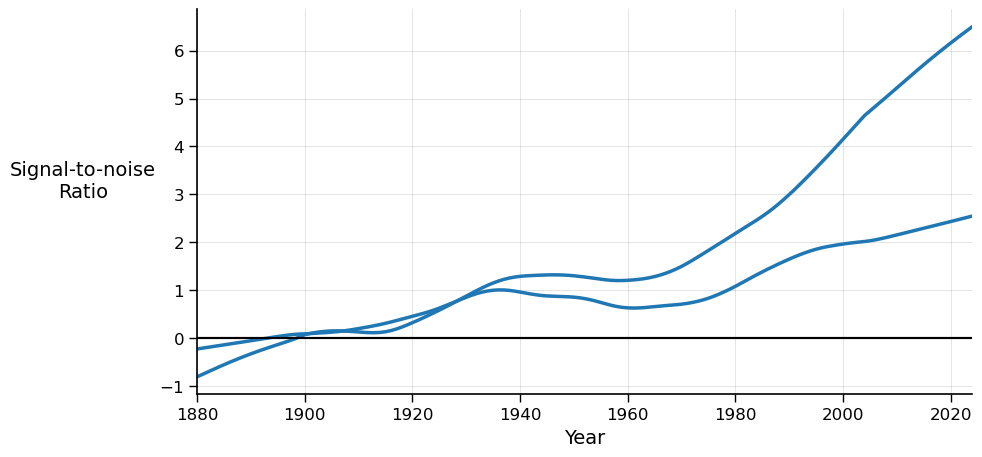

In [62]:
loc = 'nairobi'
loc_data = locations[loc]
fig, ax = sn_at_loc(loc_data)

loc = 'calgary'
loc_data = locations[loc]
sn_at_loc(loc_data, ax=ax)

fig.savefig('/g/data/w40/ab2313/images/completion_seminar/locs_sn.svg', bbox_inches='tight')

0.50613326


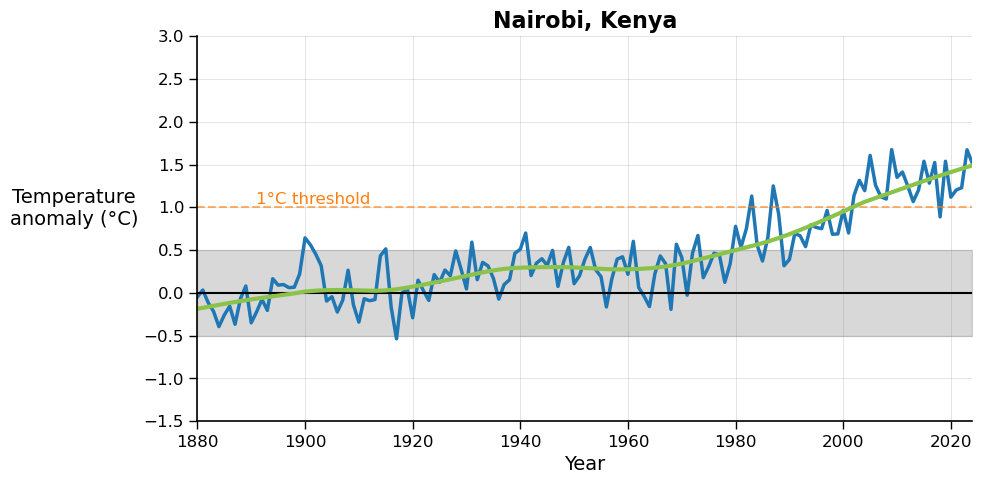

In [63]:
loc = 'nairobi'
loc_data = locations[loc]
fig, ax = plot_temp_at_loc(loc_data)

fig.savefig('/g/data/w40/ab2313/images/completion_seminar/loc_01_image_03.svg', bbox_inches='tight')

0.99407995


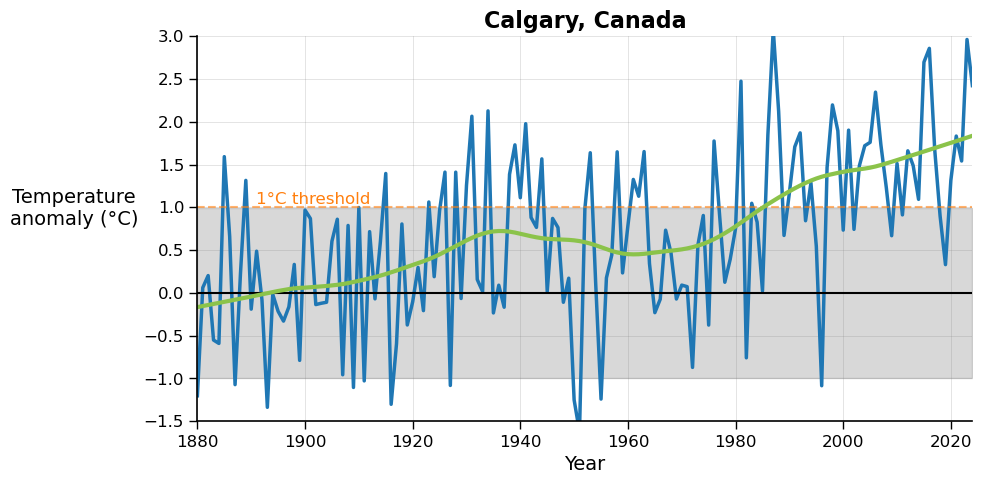

In [64]:
loc = 'calgary'
loc_data = locations[loc]
fig, ax = plot_temp_at_loc(loc_data)
fig.savefig('/g/data/w40/ab2313/images/completion_seminar/loc_02_image_03.svg', bbox_inches='tight')

In [65]:
from toe_calc import fractional_geometric_area, create_kde

In [66]:
loc_data = locations[1]

In [67]:
x = np.linspace(-3.5, 5, 1000)

In [68]:
arr1 = best_tas.sel(lat=loc_data['lat'], lon=loc_data['lon'], method='nearest').values

In [69]:
x, kde_1 = create_kde(arr1[:30], x)
x, kde_2 = create_kde(arr1[90:120], x)

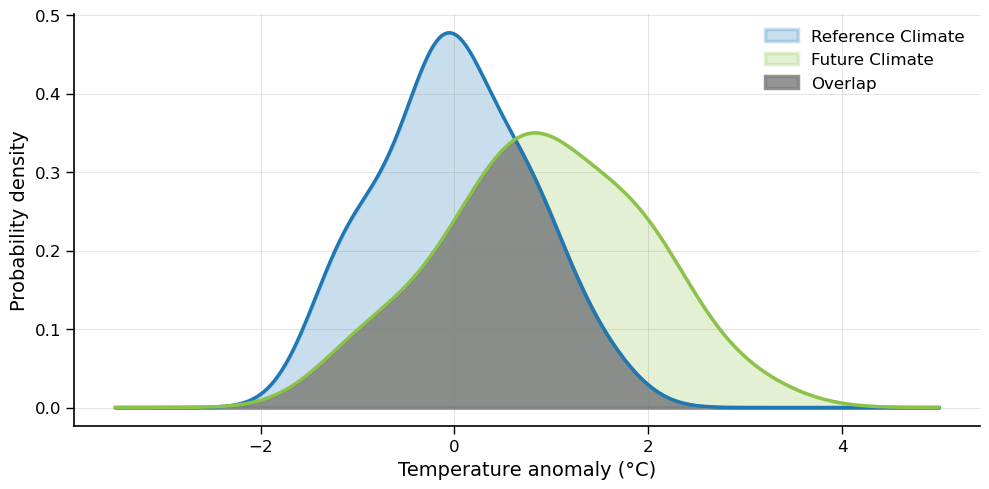

In [70]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(111)

# Plot both KDE curves
ax.plot(x, kde_1, color=color_list[0], linewidth=2.5)
ax.plot(x, kde_2, color=color_list[2], linewidth=2.5)


ax.fill_between(x, 0, kde_1, label='Reference Climate', color=color_list[0], linewidth=2.5, alpha=0.24)
ax.fill_between(x, 0, kde_2, label='Future Climate', color=color_list[2], linewidth=2.5, alpha=0.24)
ax.fill_between(x, 0, np.min([kde_2, kde_1], axis=0), label='Overlap', color='grey', linewidth=2.5, alpha=0.84)


# Axis labels
ax.set_xlabel('Temperature anomaly (°C)', fontsize=14)
ax.set_ylabel('Probability density', fontsize=14)

# Faint grey gridlines
ax.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)

# Ticks and spine styling
ax.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.2)
ax.spines['bottom'].set_linewidth(1.2)

# Optional: add a legend
ax.legend(fontsize=12, frameon=False)


# Final layout polish
fig.tight_layout()
fig.savefig('/g/data/w40/ab2313/images/completion_seminar/dist_02.svg', bbox_inches='tight')

In [71]:
import climate_utils
import toe_calc_variations

In [72]:
best_tas_smean = climate_utils.weighted_lat_lon_mean(best_tas).compute()

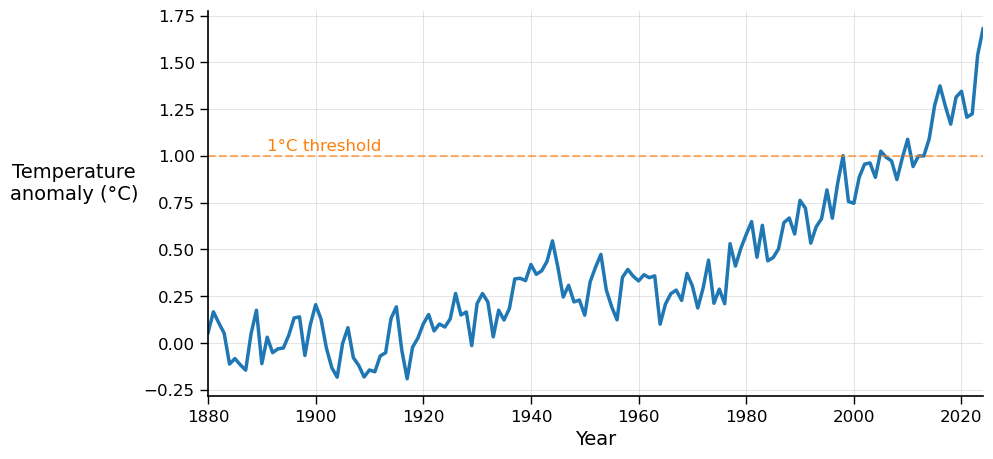

In [73]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(111)
style_temp_plot(ax, best_tas_smean)
fig.savefig('/g/data/w40/ab2313/images/completion_seminar/gmst.svg', bbox_inches='tight')

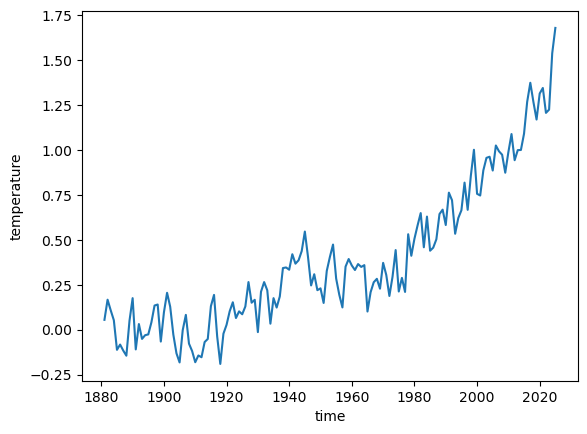

In [74]:
best_tas_smean.plot()

#### Both model SMEAN

In [75]:
import climate_utils
import toe_calc_variations

In [76]:
access_tas_smean = climate_utils.weighted_lat_lon_mean(data_tree.access_ssp585_tas.tas).compute()
access_tas_smean['time'] = access_tas_smean.time.dt.year.values.astype(int)

In [77]:
access_pr_smean = climate_utils.weighted_lat_lon_mean(data_tree.access_ssp585_pr.pr).compute()

In [78]:
access_pr_smean['time'] = access_pr_smean.time.dt.year.values.astype(int)

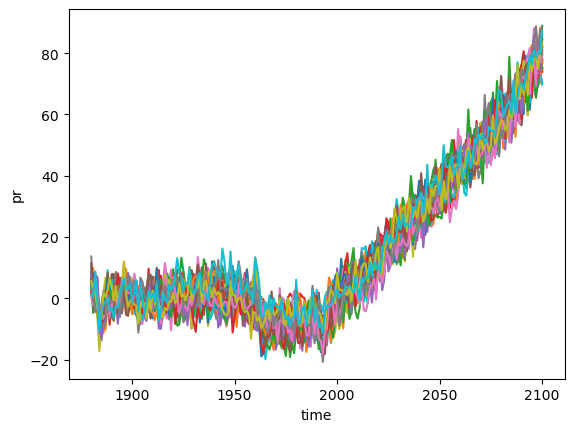

In [79]:
access_pr_smean.plot(hue='member', add_legend=False);

In [80]:
best_tas = data_tree.best_tas.temperature

In [81]:
best_tas_smean = climate_utils.weighted_lat_lon_mean(best_tas).compute()

In [82]:
best_tas_smean['time'] = best_tas_smean.time.dt.year.values.astype(int)

In [83]:
le_pi_ds_smean = climate_utils.weighted_lat_lon_mean(le_pi_tree['tas'].ds).compute()

In [84]:
le_pi_ds_smean['time'] = le_pi_ds_smean.time.dt.year.values.astype(int)

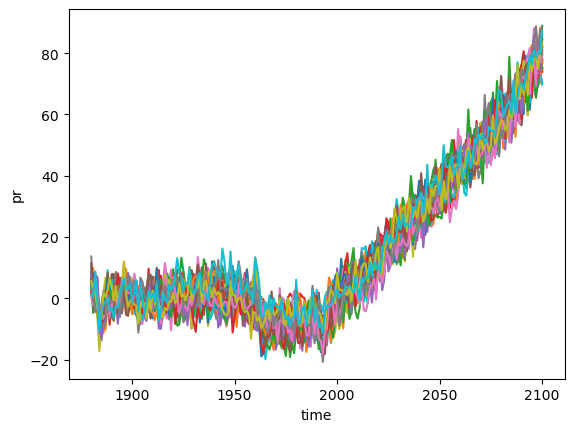

In [85]:
access_pr_smean.plot(hue='member', add_legend=False);

In [86]:
import matplotlib.lines as mlines

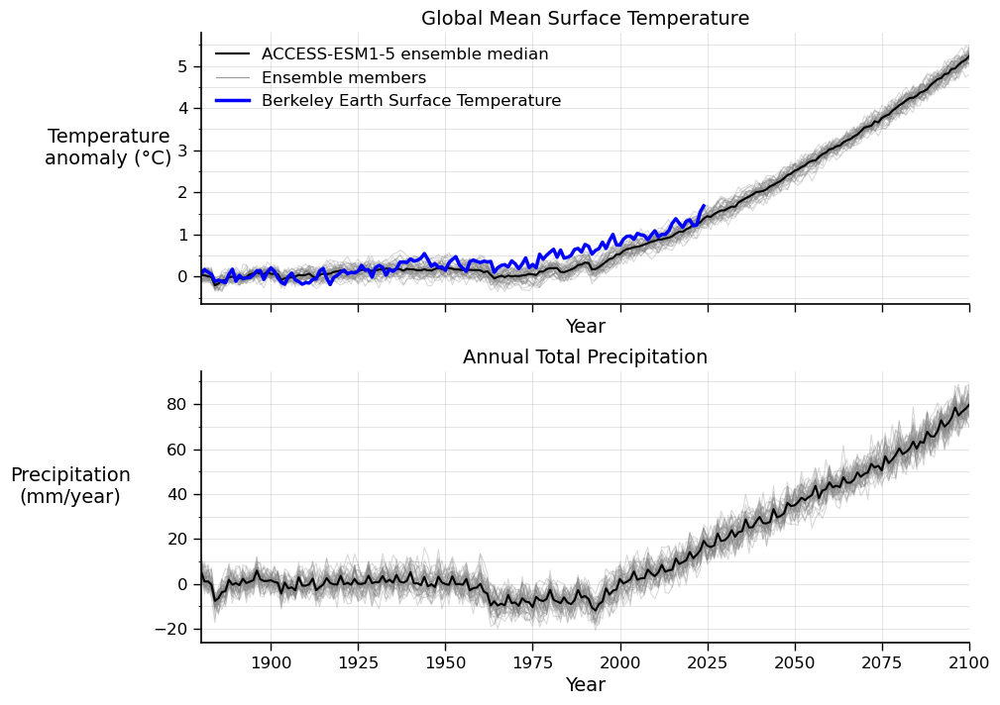

In [87]:

fig = plt.figure(figsize=(10, 8))
gs = gridspec.GridSpec(nrows=2, ncols=1, height_ratios=[1, 1], hspace=0.25)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

# --- Top axis: GMST ---
access_tas_smean.plot.line(
    ax=ax1, x='time', color='grey', alpha=0.3, linewidth=0.8, add_legend=False
)
mean_line, = access_tas_smean.median(dim='member').plot(ax=ax1, color='k', label='ACCESS-ESM1-5 ensemble median')
best_line, = best_tas_smean.plot(ax=ax1, color='blue', label='Berkeley Earth Surface Temperature',
                                linewidth=2.5)
member_line = mlines.Line2D([], [], color='grey', alpha=0.8, linewidth=0.8, label='Ensemble members')
ax1.legend(handles=[mean_line, member_line, best_line], loc='upper left', fontsize=12, frameon=False)

ax1.set_title('Global Mean Surface Temperature', fontsize=14)
ax1.set_ylabel('Temperature\nanomaly (°C)', fontsize=14, rotation=0, labelpad=50)
ax1.set_xlabel('Year', fontsize=14)

ax1.yaxis.set_major_locator(mticker.MultipleLocator(1))
ax1.yaxis.set_minor_locator(mticker.MultipleLocator(0.5))
ax1.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
ax1.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black', labelbottom=False)
ax1.set_xlim(1880, 2100)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_linewidth(1.2)
ax1.spines['bottom'].set_linewidth(1.2)

# --- Bottom axis: Precipitation ---
access_pr_smean.plot.line(
    ax=ax2, x='time', color='grey', alpha=0.3, linewidth=0.8, add_legend=False
)
access_pr_smean.median(dim='member').plot(ax=ax2, color='k')

ax2.set_title('Annual Total Precipitation', fontsize=14)
ax2.set_xlabel('Year', fontsize=14)
ax2.set_ylabel('Precipitation\n(mm/year)', fontsize=14, rotation=0, labelpad=60)
# ax2.yaxis.set_major_locator(mticker.MultipleLocator(0.2))
# ax2.yaxis.set_minor_locator(mticker.MultipleLocator(0.1))
ax2.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
ax2.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_linewidth(1.2)
ax2.spines['bottom'].set_linewidth(1.2)
ax2.set_xlim(1880, 2100)

ax2.yaxis.set_major_locator(mticker.MaxNLocator(len(ax1.get_yticks())))
# Then set twice as many minor ticks between them
ax2.yaxis.set_minor_locator(mticker.AutoMinorLocator(2))

# Optional save
fig.savefig('/g/data/w40/ab2313/images/completion_seminar/gmst_pr_and_tas.png', dpi=500, bbox_inches='tight')


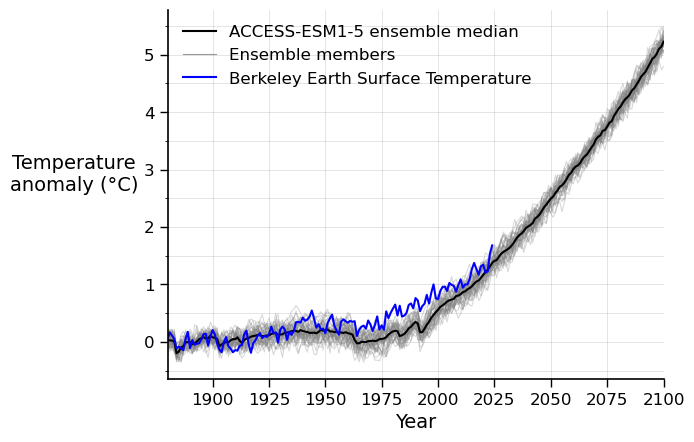

In [88]:
import matplotlib.lines as mlines

fig, ax = plt.subplots()

# Plot ensemble members (no legend entries)
access_tas_smean.plot.line(
    ax=ax, x='time', color='grey', alpha=0.3, linewidth=0.8, add_legend=False
)

# Plot mean and best model, and save the line objects
mean_line, = access_tas_smean.mean(dim='member').plot(ax=ax, color='k', label='ACCESS-ESM1-5 ensemble median')
best_line, = best_tas_smean.plot(ax=ax, color='blue', label='Berkeley Earth Surface Temperature')

# Manually define line for ensemble members
member_line = mlines.Line2D([], [], color='grey', alpha=0.8, linewidth=0.8, label='Ensemble members')

# Build and add legend
ax.legend(handles=[mean_line, member_line, best_line], loc='upper left', fontsize=12, frameon=False)

# Styling
ax.yaxis.set_major_locator(mticker.MultipleLocator(1))
ax.yaxis.set_minor_locator(mticker.MultipleLocator(0.5))
ax.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Temperature\nanomaly (°C)', fontsize=14, rotation=0, labelpad=50)
ax.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')
ax.set_xlim(1880, 2100)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.2)
ax.spines['bottom'].set_linewidth(1.2)
fig.savefig('/g/data/w40/ab2313/images/completion_seminar/gmst.png', dpi=300, bbox_inches='tight')

In [89]:

# fig, ax = plt.subplots(figsize=(6, 3))
# le_pi_ds_smean.plot(ax=ax)

# ax.yaxis.set_major_locator(mticker.MultipleLocator(0.25))
# ax.yaxis.set_minor_locator(mticker.MultipleLocator(0.125))
# ax.grid(True, which='both', color='grey', linestyle='-', linewidth=0.5, alpha=0.3)
# ax.set_xlabel('Year', fontsize=14)
# ax.set_ylabel('GMST (°C)', fontsize=14, rotation=90, labelpad=20)
# ax.tick_params(labelsize=12, direction='out', length=6, width=1, colors='black')

# ax.set_xlim(np.take(le_pi_ds_smean.time.values, [0, -1]))

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_linewidth(1.2)
# ax.spines['bottom'].set_linewidth(1.2)
# ax.set_title(None)

# fig.savefig('/g/data/w40/ab2313/images/completion_seminar/picontrol.png', dpi=100, bbox_inches='tight')

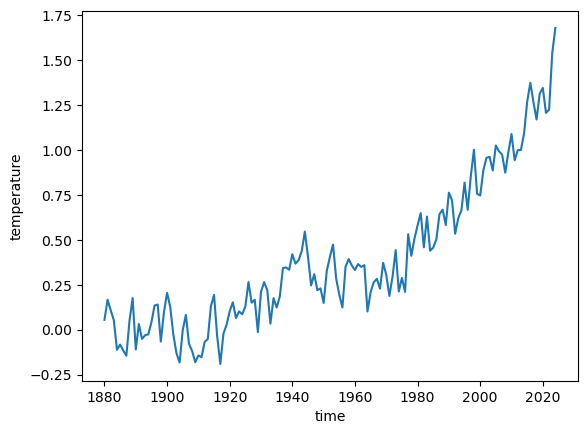

In [90]:
best_tas_smean.plot()

#### LE

In [91]:
%%time
sn_access_tas_smean = toe_calc_variations.sn_ratio(
    access_tas_smean,#.isel(iteration=slice(0,100)),
    start=0, end=30)

CPU times: user 506 ms, sys: 10.7 ms, total: 517 ms
Wall time: 506 ms


In [92]:
sn_access_tas_toe = toe_calc.get_permanent_exceedance(
    sn_access_tas_smean[['sn_lowess_base', 'sn_lowess_full', 'sn_roll']],
    threshold=1, comparison_func=np.greater,
    time=sn_access_tas_smean.time.values, #     dt.year.values.astype(int)
    trim_nan=True).compute()

In [93]:
sn_access_tas_unfamiliar_toe = toe_calc.get_permanent_exceedance(
    sn_access_tas_smean[['sn_lowess_base', 'sn_lowess_full', 'sn_roll']],
    threshold=2, comparison_func=np.greater,
    time=sn_access_tas_smean.time.values, #     dt.year.values.astype(int)
    trim_nan=True).compute()

In [94]:
sn_access_tas_unknown_toe = toe_calc.get_permanent_exceedance(
    sn_access_tas_smean[['sn_lowess_base', 'sn_lowess_full', 'sn_roll']],
    threshold=3, comparison_func=np.greater,
    time=sn_access_tas_smean.time.values, #     dt.year.values.astype(int)
    trim_nan=True).compute()

In [95]:
sn_access_tas_all_toe = xr.concat(
    [sn_access_tas_toe, sn_access_tas_unfamiliar_toe, sn_access_tas_unknown_toe],
    dim=pd.Index(['unusual', 'unfamiliar', 'unknown'], name='threshold')
)

In [96]:
sn_access_tas_all_toe

<xarray.Dataset> Size: 4kB
Dimensions:         (threshold: 3, member: 40)
Coordinates:
  * threshold       (threshold) object 24B 'unusual' 'unfamiliar' 'unknown'
  * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
    height          float64 8B 2.0
Data variables:
    sn_lowess_base  (threshold, member) float64 960B 1.975e+03 ... 1.992e+03
    sn_lowess_full  (threshold, member) float64 960B 1.931e+03 ... 1.99e+03
    sn_roll         (threshold, member) float64 960B 1.973e+03 ... 1.99e+03

In [97]:
x = np.linspace(1850, 2030, 500)

In [98]:
kde_kwargs= dict(bw_method=0.2) # silverman, scott#bw_method=0.2)

In [99]:
kde_create_kwargs = dict(
    input_core_dims=[['member']],#,['iteration']],
    output_core_dims=[['x']],
    kwargs={'x': x, **kde_kwargs},
    vectorize=True,
    dask='parallelized',
    output_sizes={'x':len(x)},  # Specify the size of the 'bin' dimension
    output_dtypes=[float]
)

In [100]:
%%time
sn_access_tas_all_toe_kde = xr.apply_ufunc(
    toe_calc.create_kde_x_exists,
    sn_access_tas_all_toe,
    **kde_create_kwargs
).compute();

CPU times: user 18.9 ms, sys: 0 ns, total: 18.9 ms
Wall time: 15.7 ms


In [101]:
sn_access_tas_all_toe_kde['x'] = x

In [102]:
sn_access_tas_all_toe.median(dim='member').sn_lowess_base

<xarray.DataArray 'sn_lowess_base' (threshold: 3)> Size: 24B
array([1975., 1986., 1992.])
Coordinates:
  * threshold  (threshold) object 24B 'unusual' 'unfamiliar' 'unknown'
    height     float64 8B 2.0

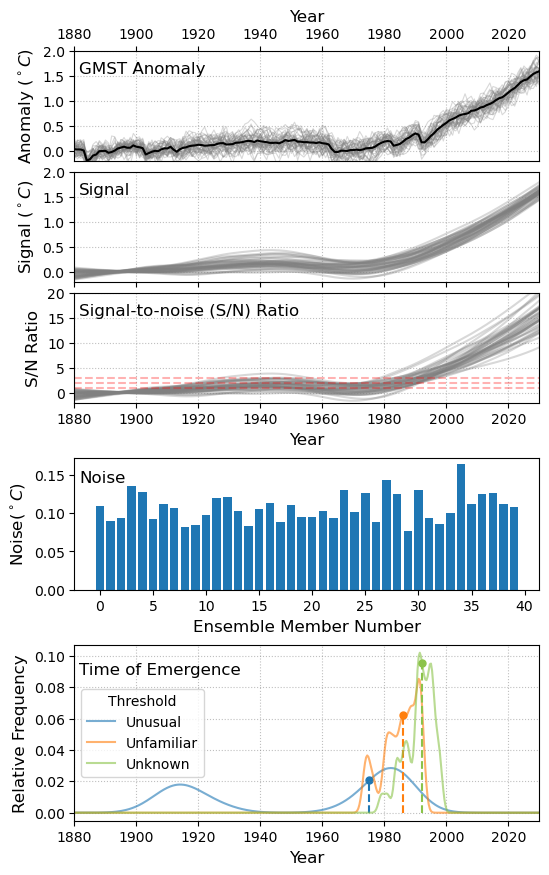

In [103]:
fig = plt.figure(figsize=(6, 10))
gs = gridspec.GridSpec(3, 1, hspace=0.25, height_ratios = [0.4, 0.15, 0.2])

gs_top = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=gs[0], hspace=0.1)
axes_top = [fig.add_subplot(gs_top[i]) for i in range(3)]

axes_bottom = [fig.add_subplot(gs[i+1]) for i in range(2)]
axes = [*axes_top, *axes_bottom]

# 1st row - GMST
ax=axes[0]
access_tas_smean.plot.line(ax=ax, x='time', color='grey', alpha=0.3, linewidth=0.8, add_legend=False);
access_tas_smean.mean(dim='member').plot(ax=axes[0], color='k')
ax.set_ylim(-.2, 2)
ax.yaxis.set_major_locator(mticker.MultipleLocator(.5))

# 2nd row - signal
ax1 = axes[1]
sn_access_tas_smean.signal.plot.line(ax=ax1, x='time', color='grey', alpha=0.3, add_legend=False);
ax1.set_ylim(-.2, 2)
ax1.yaxis.set_major_locator(mticker.MultipleLocator(.5))


# 3rd - S/N
ax2 = axes[2]
sn_access_tas_smean.sn_lowess_base.plot.line(ax=ax2, x='time', color='grey', alpha=0.3, add_legend=False);
ax2.axhline(1, linestyle='--', color='red', alpha=0.3)
ax2.axhline(2, linestyle='--', color='red', alpha=0.3)
ax2.axhline(3, linestyle='--', color='red', alpha=0.3)
ax2.set_ylim(-2, 20)
ax2.yaxis.set_major_locator(mticker.MultipleLocator(5))


# 4th row column 1, noise bar plot
ax_bl = axes[-2]
ax_bl.bar(np.arange(len(sn_access_tas_smean.member.values)), sn_access_tas_smean.noise.isel(time=slice(0, 30)).std(dim='time').values)

# 4th row, column 2, ToE KDE
color_list = toe_plots.color_list#['#0072B2', '#E69F00', '#009E73']  # Blue, Orange, Green
ax_br = axes[-1]

for thresh, color in zip(sn_access_tas_all_toe_kde.threshold.values, color_list):
    subset = sn_access_tas_all_toe_kde.sel(threshold=thresh);
    label = str(thresh).capitalize()
    subset.sn_lowess_base.plot(ax=ax_br, label=label, color=color, alpha=0.6);

    median_val = sn_access_tas_all_toe.sel(threshold=thresh).median(dim='member').sn_lowess_base.item()

    # Get KDE x and y
    kde_x = subset.x.values  # general way to get x-axis
    kde_y = subset.sn_lowess_base.values                  # y-axis (KDE height)

    # Find closest x to median
    closest_idx = np.abs(kde_x - median_val).argmin()
    kde_y_at_median = kde_y[closest_idx]
    x_closest = kde_x[closest_idx]

    # Plot vertical line to KDE
    ax_br.vlines(x_closest, 0, kde_y_at_median, color=color, linestyle='--')
    ax_br.scatter(x_closest, kde_y_at_median, color=color, s=25)

ax_br.legend(title='Threshold')

# Formatting axes
for ax in np.take(axes, [0, 1,2, -1]):
    ax.set_xlim(1880, 2030)
    ax.grid(True, linestyle=':', alpha=0.5, color='grey')
    ax.set_title('')
    ax.set_xlabel('Year', fontsize=12)

axes[0].set_ylabel('Anomaly ' + r'($^\circ C$)', fontsize=12)
axes[1].set_ylabel('Signal ' + r'($^\circ C$)', fontsize=12)
axes[2].set_ylabel('S/N Ratio', fontsize=12)
axes[3].set_ylabel('Noise' + r'($^\circ C$)', fontsize=12)
axes[4].set_ylabel('Relative Frequency', fontsize=12)

axes[3].set_xlabel('Ensemble Member Number', fontsize=12)

xy = (0.01, 0.9)
axes[0].annotate('GMST Anomaly ', xy=xy, xycoords='axes fraction', fontsize='large', ha='left', va='top')
axes[1].annotate('Signal' , xy=xy, xycoords='axes fraction', fontsize='large', ha='left', va='top')
axes[2].annotate('Signal-to-noise (S/N) Ratio', xy=xy, xycoords='axes fraction', fontsize='large', ha='left', va='top')
axes[3].annotate('Noise', xy=xy, xycoords='axes fraction', fontsize='large', ha='left', va='top')
axes[4].annotate('Time of Emergence', xy=xy, xycoords='axes fraction', fontsize='large', ha='left', va='top')

axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()

axes[1].set_xticklabels([]);

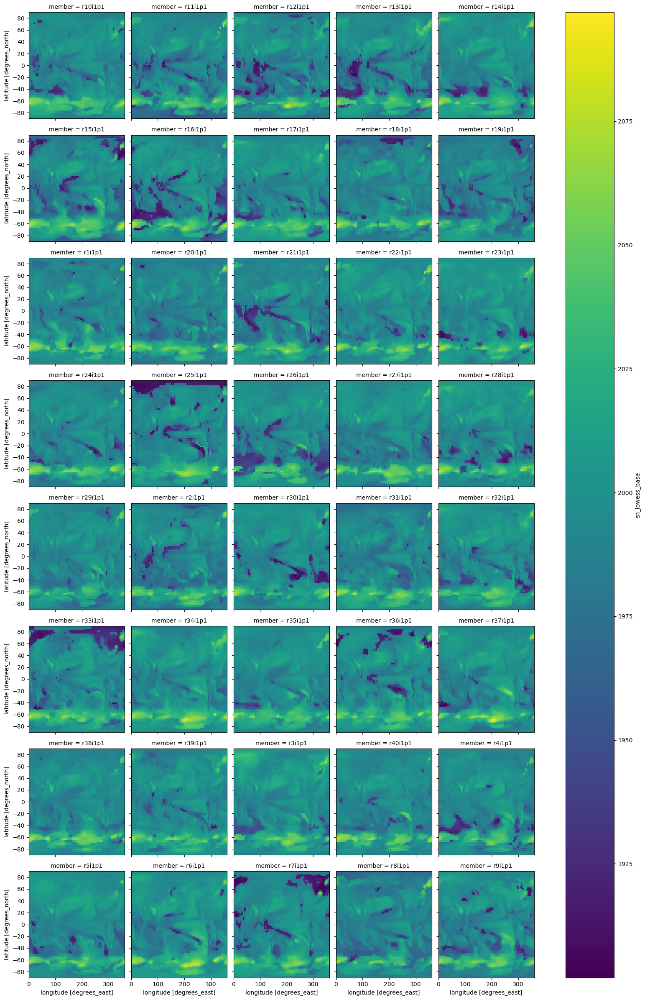

In [104]:
toe_tree.access_ssp585_tas.sn_lowess_base.plot(col='member', col_wrap=5)

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Cross Emergence </h2>

### Functions

In [ ]:
from scipy.stats import gaussian_kde

In [ ]:
import seaborn as sns

from matplotlib.colors import BoundaryNorm
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import TwoSlopeNorm


In [ ]:
def generate_histogram(arr: np.ndarray, bins: np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Generate a histogram from the input array.

    Parameters:
    arr (np.ndarray): The input array to generate the histogram from.
    bins (np.ndarray): The bin edges for the histogram.

    Returns:
    tuple[np.ndarray, np.ndarray, np.ndarray]: A tuple containing the bin centers, the histogram values, and the histogram normalization factor.
    """
    # Remove NaN values from the input array
    vals = arr[np.isfinite(arr)]
    
    # Generate the histogram
    hist, bin_edges = np.histogram(vals, bins=bins, density=True)
    
    # Calculate the histogram normalization factor
    hist_norm = np.sum(hist)
    
    # Normalize the histogram
    hist = hist/hist_norm
    
    # Calculate the bin centers
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    return bin_centers, hist, hist_norm


def generate_kde(arr: np.ndarray, hist_norm: float, bin_edges: np.ndarray) -> tuple[gaussian_kde, np.ndarray]:
    """
    Generate a kernel density estimate (KDE) from the input array.

    Parameters:
    arr (np.ndarray): The input array to generate the KDE from.
    hist_norm (float): The histogram normalization factor.
    bin_edges (np.ndarray): The bin edges for the histogram.

    Returns:
    tuple[gaussian_kde, np.ndarray]: A tuple containing the KDE generator and the normalized KDE values.
    """
    # Generate the KDE
    arr = arr[np.isfinite(arr)]
    kde_generator = gaussian_kde(arr)
    
    # Generate a grid of x values for the KDE
    x_grid = np.linspace(bin_edges[0], bin_edges[-1], 1000)
    
    # Evaluate the KDE at the x grid points
    kde_values = kde_generator(x_grid)
    
    # Normalize the KDE values
    kde_values_normalized = kde_values/hist_norm
    
    return kde_generator, kde_values_normalized

In [ ]:

def create_x_at_y_median_iqr(x_at_y_emergence_tree, good_xandy_dict):

    
    order = np.concatenate(
        [[f'{key}_at_{value}_emergence' for value in good_xandy_dict[key]]for key in good_xandy_dict.keys()])
    
    x_and_y_av_dict = {}
    x_and_y_iqr_dict = {}
    
    for variable in x_at_y_emergence_tree:
        xand_ds = np.abs(x_at_y_emergence_tree[variable].ds[good_xandy])
        x_and_y_av_dict[variable] = xand_ds.median().to_pandas()
        x_and_y_iqr_dict[variable] = (xand_ds.quantile(0.75) - xand_ds.quantile(0.25)).to_pandas()
    
    x_and_y_av_df = pd.concat(x_and_y_av_dict, axis=1).loc[order]
    x_and_y_iqr_df = pd.concat(x_and_y_iqr_dict, axis=1).loc[order]
    
    return x_and_y_av_df, x_and_y_iqr_df

In [ ]:
def create_percent_error_df(x_and_y_av_df, threshold_profile):
    percent_error_df = x_and_y_av_df.copy()
    # Create a boolean mask: True where row label (index) starts with "sn", False otherwise.
    sn_mask = percent_error_df.index.str.startswith('sn')
    overlap_mask = percent_error_df.index.str.startswith('frac') | percent_error_df.index.str.startswith('perkins')
    hd_mask = percent_error_df.index.str.startswith('hd')
    
    
    # Subtract 1 from rows starting with "sn"
    percent_error_df.loc[sn_mask] = 100*(percent_error_df.loc[sn_mask] - threshold_profile.sn_threshold)
    percent_error_df.loc[overlap_mask] = 100*(percent_error_df.loc[overlap_mask] - threshold_profile.overlap_threshold)/threshold_profile.overlap_threshold
    percent_error_df.loc[hd_mask] = 100*(percent_error_df.loc[hd_mask] - threshold_profile.hd_threshold)/threshold_profile.hd_threshold
    percent_error_df = percent_error_df.map(abs)

    return percent_error_df

In [ ]:
def create_x_and_y_control_dict(good_xandy, logginglevel='ERROR'):
    utils.change_logginglevel(logginglevel)

    ordered_vars = [
        'sn_lowess_base', 'frac', 'hd', 'ks', 'ks_bbs', 'ttest', 'ttest_bbs',
        'mwu', 'ttest_window', 'ks_window', 'ttest_bbs_window', 'ks_bbs_window'
    ]
    
    # Custom sorting function
    def custom_sort(value): return ordered_vars.index(value)
    
    good_xandy_dict = {}
    for item in good_xandy:
        logger.debug(item)
        key, value = item.split('_at_')
        value = value.split('_emergence')[0]
        good_xandy_dict.setdefault(key, []).append(value)
    
    # Sort each list based on the custom order
    for key in good_xandy_dict: good_xandy_dict[key] = sorted(good_xandy_dict[key], key=custom_sort)
    logger.info(good_xandy_dict)
    
    good_xandy_dict = {key: good_xandy_dict[key] for key in ordered_vars if key in good_xandy_dict}
    logger.info(good_xandy_dict)

    return good_xandy_dict

In [ ]:
def fix_cross_emergence_ds(ds: xr.Dataset) -> xr.Dataset:
    """
    Build a DataTree with structure:
        root/<target_metric>
    Each target_metric node contains a Dataset of all its *_at_*_emergence variables.
    Dimensions are preserved as-is (no forced 'window' dimension).
    """
    from xarray import DataTree
    import re

    if check_for_null(ds): return

    pattern = re.compile(r"^(?P<target>.+?)_at_(?P<reference>.+?)_emergence$")
    grouped = {}

    # Group by target metric
    for name, da in ds.data_vars.items():
        m = pattern.match(name)
        if not m:
            continue
        target = m.group("target")
        reference = m.group("reference")
        grouped.setdefault(target, {})[reference] = da


    to_concat = []
    for metric, ref_dict in grouped.items():
        new_ds = xr.Dataset(ref_dict).assign_coords(metric=[metric])
        to_concat.append(new_ds)

    to_return = xr.concat(to_concat, dim='metric')
    return to_return


In [ ]:
# def ovl_at_sn(sn):
#     """Overlap coefficient given an S/N ratio."""
#     return 2 * norm.cdf(-0.5 * sn)

In [ ]:
from scipy.stats import norm, t, kstwo
import numpy as np

def ovl_at_sn(sn):
    """Overlap coefficient given an S/N ratio."""
    return 2 * norm.cdf(-0.5 * sn) * 100


def sn_at_ovl(ovl_percent):
    """S/N ratio corresponding to a given overlap percentage (0–100)."""
    return -2 * norm.ppf(ovl_percent / 200.0)

import numpy as np
from scipy.stats import norm, t, kstwo

def sn_from_p_ks(p, n1, n2=None):
    """S/N ratio from a KS test p-value and sample sizes n1, n2.
    Works with int, float, list, or np.ndarray inputs.
    """
    p = np.asarray(p, dtype=float)
    n1 = np.asarray(n1, dtype=float)
    n2 = np.asarray(n2 if n2 is not None else n1, dtype=float)

    # effective sample size
    n_eff = (n1 * n2) / (n1 + n2)
    n_eff = np.round(n_eff, 2)#.astype(int)

    ks_stat = kstwo.isf(p, n_eff)
    sn = 2 * norm.ppf((ks_stat + 1) / 2)
    return sn


def sn_from_p_t(p, n1, n2=None):
    """S/N ratio from a t-test p-value and sample sizes n1, n2.
    Works with int, float, list, or np.ndarray inputs.
    """
    p = np.asarray(p, dtype=float)
    n1 = np.asarray(n1, dtype=float)
    n2 = np.asarray(n2 if n2 is not None else n1, dtype=float)

    df = n1 + n2 - 2
    t_stat = t.isf(p / 2, df)  # two-sided
    sn = t_stat * np.sqrt(1 / n1 + 1 / n2)
    return sn


### Calculations

In [ ]:
cross_emergence_tree = x_at_y_emergence_tree.map_over_datasets(fix_cross_emergence_ds)

In [ ]:
p = 0.01
n1 = 30
n2 = np.arange(20, 71)

In [ ]:
expected_sn_from_ks = sn_from_p_ks(p, n1, n2)

In [ ]:
expected_sn_from_ttest = sn_from_p_t(p, n1, n2)

In [ ]:
idx = np.isfinite(expected_sn_from_ks)
n2_ks = n2[idx]
expected_sn_from_ks = expected_sn_from_ks[idx]

In [ ]:
idt = np.isfinite(expected_sn_from_ttest)
n2_test = n2[idt]
expected_sn_from_ttest = expected_sn_from_ttest[idt]

In [ ]:
expected_ovl_from_ttest = ovl_at_sn(expected_sn_from_ttest)
expected_ovl_from_ks = ovl_at_sn(expected_sn_from_ks)

In [ ]:
sn_at_ovl(ovl_at_sn(1)), ovl_at_sn(1), sn_at_ovl(61.7)

In [ ]:
sn_from_p_ks(0.01, 30, 30), ovl_at_sn(sn_from_p_ks(0.01, 30, 30))

In [ ]:
plt.plot(n2_ks, expected_ovl_from_ks, label='ks')
plt.plot(n2_test, expected_ovl_from_ttest)
plt.legend()

In [ ]:
plt.plot(n2_ks, expected_sn_from_ks, label='ks')
plt.plot(n2_test, expected_sn_from_ttest, label='ttest')

### Violins

In [ ]:


def add_summary_text(ax, stats, variables, extra_y = 3):
    xticks = np.arange(len(variables))

    yticks = ax.get_yticks()
    ymin, ymax = ax.get_ylim()
    yticks = [t for t in yticks if ymin <= t <= ymax]

    ax.set_yticks(yticks)
    ax.set_ylim(ymin, ymax + extra_y)

    # Place numbers above each violin (your version)
    for i, var in enumerate(variables):
        median, iqr = stats[var]
        ax.text(i, (ymax + extra_y) * 0.95, f"{median:.2f}\n{iqr:.2f}",
                ha="center", va="top", fontsize=12)

    # Add row labels on the left, in axes-fraction coords
    ax.annotate("Med\nIQR",
                xy=(-0.01, (ymax + extra_y) * 0.95),
                xycoords=('axes fraction', 'data'),
                ha="right", va="top", fontsize=12, 
                # fontweight="bold"
               )

    # Add horizontal line under the block
    xmin, xmax = ax.get_xlim()
    hline_y = (ymax + extra_y) * 0.72
    ax.axhline(y=hline_y, color="black",
               linestyle="-", linewidth=1, xmin=0, xmax=1)

    xticks = ax.get_xticks()
    tick_diff = np.unique(np.diff(xticks))[0]
    for i in range(len(xticks) - 1):
        xmiddle_loc = np.mean([xticks[i], xticks[i+1]])
        ax.vlines(xmiddle_loc, ymin=hline_y, ymax=ymax + extra_y,
                  colors="k", linewidth=1)

    xmin_true, xmax_true = np.take(ax.get_xticks(), [0, -1])
    ax.set_xlim(xmin_true-tick_diff/2, xmax_true+tick_diff/2)

In [ ]:
def single_violin(var, values, ax, **kwargs):
    values = values[~np.isnan(values)]
        
    low, high = np.percentile(values, [2.5, 97.5])
    values = values[(values >= low) & (values <= high)]

    # generic tidy structure
    data = {"x": [var] * len(values), "y": values}

    handle = sns.violinplot(x="x", y="y", data=data, ax=ax, **kwargs)

    return handle



def metric_violin(
    ds, kind="violin",
    color='lightblue', edgecolor='black', figsize=(12, 6), variables=None, ax=None):
    """
    Plot a separate distribution (violin or box) for each variable in an xarray.Dataset.
    Adds a summary table of median and IQR below the x-axis.

    Parameters
    ----------
    ds : xarray.Dataset
        Dataset where each variable is a method, with dimensions (lat, lon).
    kind : str, optional
        'violin' or 'box'. Default is 'violin'.
    figsize : tuple, optional
        Size of the matplotlib figure (only used if ax is None).
    variables : list of str, optional
        Subset of variables to include. Will automatically intersect with ds.data_vars.
    ax : matplotlib.axes.Axes, optional
        Axis to plot on. If None, a new figure and axis will be created.

    Returns
    -------
    dict
        Dictionary of (median, IQR) for each plotted variable.
    """
    if variables is None:
        variables = list(ds.data_vars)
    else:
        variables = [v for v in variables if v in ds.data_vars]

    if not variables:
        raise ValueError("No matching variables found in ds.data_vars.")

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    stats = {}

    for var in variables:
        values = ds[var].values.ravel()

        if kind == 'violin': handle = single_violin(
            var, values, ax,  color=color,
            cut=0, bw_adjust=0.5, scale="width", edgecolor=edgecolor,
            inner="box", alpha=0.7,linewidth=1.8, linecolor="black")

        elif kind == "box":
            handle = sns.boxplot(x="x", y="y", data=data, color=color, ax=ax,
                        showfliers=False,   # ← hides outlier dots
                        whis=(5, 95), width=0.4)
        else:
            handle = None  # fallback safeguard
        
        if handle is not None:
            ax.legend(handles=[handle], loc='upper right', frameon=False)

        median = np.nanmedian(values)
        q25, q75 = np.nanpercentile(values, [25, 75])
        stats[var] = (median, q75 - q25)

    ax.axhline(0, color="k", linestyle="--", linewidth=1)
    ax.legend(handles=[handle], loc='upper right', frameon=False)

    # ax.set_ylabel("y")
    # ax.set_title("Distribution by variable")

    # add_summary_text(ax, stats, variables)
    return stats


In [ ]:
data_set = 'access_ssp585_tas'

In [ ]:
cross_emergence_ds = cross_emergence_tree[data_set].ds
cross_emergence_ds

In [ ]:
cross_emergence_da = np.abs(
    cross_emergence_ds[
    ['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window']]
    .sel(metric=['sn_lowess_base', 'frac'])
    .to_array(name='toe')
    # .to_dataset(dim='window')
    .squeeze().drop_vars(['quantile', 'height'], errors='ignore')
)#.isel(member=slice(0, 5))

In [ ]:
cross_emergence_windows_ds = cross_emergence_da.to_dataset(dim='window')

In [ ]:
fig, ax = plt.subplots(1,1)
var = 30
values = cross_emergence_windows_ds.sel(variable='ks_bbs_window', metric='sn_lowess_base')[var].values
values = values.ravel()
single_violin(var, values, ax)

In [ ]:
metric_cfg = {
    'sn_lowess_base': {
        'ylim': (0, 3),
        'expected_ks': expected_sn_from_ks,
        'expected_ttest': expected_sn_from_ttest,
    },
    'frac': {
        'ylim': (30, 90),
        'expected_ks': expected_ovl_from_ks,
        'expected_ttest': expected_ovl_from_ttest,
    },
}

In [ ]:
metrics = list(metric_cfg)

fig = plt.figure(figsize=(14, 16))
gs = gridspec.GridSpec(len(metrics), 2, figure=fig, wspace=0.15, hspace=0.25)


for i, metric in enumerate(metrics):
    cfg = metric_cfg[metric]

    # --- Create axes for this row ---
    ax_ks = fig.add_subplot(gs[i, 0])
    ax_ttest = fig.add_subplot(gs[i, 1])


    # KS bootstrap violin
    values_ks_bbs = cross_emergence_windows_ds.sel(variable='ks_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ks_bbs, ax_ks)
    
    # t-test bootstrap violin
    values_ttest_bbs = cross_emergence_windows_ds.sel(variable='ttest_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ttest_bbs, ax_ttest)


    # --- KS violins ---
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ks_window', metric=metric),
        color=toe_plots.TEST_STYLES['ks_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ks, kind='violin'
    )

    # --- t-test violins ---
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric),
        color=toe_plots.TEST_STYLES['ttest_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ttest, kind='violin'
    )

    # --- Overlay expected lines ---
    x_ks = np.linspace(*np.take(ax_ks.get_xticks(), [1, -1]), len(cfg['expected_ks']))
    x_ttest = np.linspace(*np.take(ax_ttest.get_xticks(), [1, -1]), len(cfg['expected_ttest']))

    ax_ks.plot(x_ks, cfg['expected_ks'], color='red', linestyle='--', linewidth=3, label='Analytic')
    ax_ttest.plot(x_ttest, cfg['expected_ttest'], color='red', linestyle='--', linewidth=3)

    # --- Formatting ---
    for ax in [ax_ks, ax_ttest]:
        xticklabels = ax.get_xticklabels()
        xticklabels[0] = 'BBS'
        ax.set_xticklabels(xticklabels)
        ax.set_ylim(*cfg['ylim'])
        ax.set_xlabel('Window Length (years)', fontsize=14)
        ax.tick_params(axis='x', labelsize=12)
        ax.tick_params(axis='y', labelsize=12)
        ax.grid(True, linestyle='--', alpha=0.6)

    ax_ks.set_ylabel('S/N Ratio' if metric == 'sn_lowess_base' else 'Overlap (%)', fontsize=14)
    ax_ttest.set_ylabel(None)
    if i == 0:
        ax_ks.set_title(toe_plots.METRIC_NAME_MAP['ks'], fontsize=16, fontweight='bold')
        ax_ttest.set_title(toe_plots.METRIC_NAME_MAP['ttest'], fontsize=16, fontweight='bold')

    ax_ks.legend(fontsize=14) if i == 0 else None
    ax_ks.annotate(toe_plots.METRIC_NAME_MAP[metric],
                   xy=(-0.25, 0.5), xycoords='axes fraction',
                   va='center', ha='center', fontweight='bold',
                   fontsize=16, rotation=90)


In [ ]:


fig = plt.figure(figsize=(14, 8))
gs = gridspec.GridSpec(2, len(metrics), figure=fig, wspace=0.25, hspace=0.25)

for j, metric in enumerate(metrics):
    cfg = metric_cfg[metric]

    # --- Create axes for this column ---
    ax_ks = fig.add_subplot(gs[0, j])
    ax_ttest = fig.add_subplot(gs[1, j])

    # --- KS test violins ---
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ks_window', metric=metric),
        color = toe_plots.TEST_STYLES['ks_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ks, kind='violin'
    )

    # --- t-test violins ---
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric),
        color = toe_plots.TEST_STYLES['ttest_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ttest, kind='violin'
    )

    # --- Overlay expected lines ---
    # These use their *own* x range, matching what you did originally
    x_ks = np.linspace(*np.take(ax_ks.get_xticks(), [0, -1]), len(cfg['expected_ks']))
    x_ttest = np.linspace(*np.take(ax_ttest.get_xticks(), [0, -1]), len(cfg['expected_ttest']))

    ax_ks.plot(x_ks, cfg['expected_ks'], color='red', linestyle='--', linewidth=3, label='Analytic')
    ax_ttest.plot(x_ttest, cfg['expected_ttest'], color='red', linestyle='--', linewidth=3)

    # --- Formatting ---
    ax_ks.set_ylim(*cfg['ylim'])
    ax_ttest.set_ylim(*cfg['ylim'])

    for ax in [ax_ks, ax_ttest]:
        ax.set_xlabel('Window Length (years)', fontsize=14)
        ax.set_xlabel('Window Length (years)', fontsize=14)
        ax.set_ylabel('S/N Ratio' if j == 0 else 'Overalp (%)', fontsize=14)
        ax.tick_params(axis='x', labelsize=12)
        ax.tick_params(axis='y', labelsize=12)
        ax.grid(True, linestyle='--', alpha=0.6)
        
        if j == 0:
            ax_ks.legend(fontsize=14)

            annotate_kwargs = dict(
                xy=(-0.25, 0.5), xycoords='axes fraction', va='center', ha='center',
                fontweight='bold', fontsize=16, rotation=90)
            
            ax_ks.annotate(toe_plots.METRIC_NAME_MAP['ks'], **annotate_kwargs)
            ax_ttest.annotate(toe_plots.METRIC_NAME_MAP['ttest'], **annotate_kwargs)


    ax_ks.set_title(toe_plots.METRIC_NAME_MAP[metric], fontsize=16, fontweight='bold')

In [ ]:
    # ax_ks.annotate(
    #     toe_plots.METRIC_NAME_MAP[metric],
    #     xy=(-0.05, 0.5), xycoords='axes fraction',
    #     va='center', ha='center',
    #     fontweight='bold', fontsize=16, rotation=90
    # )

# fig.text(0.47, 0.66, toe_plots.METRIC_NAME_MAP['sn_lowess_base'],
#          rotation=90, fontsize=16, va='center', fontweight='bold')


# fig.text(0.47, 0.33, toe_plots.METRIC_NAME_MAP['frac'].replace('\n', ' '),
#          rotation=90, fontsize=16, va='center', fontweight='bold')


In [ ]:
metric_cfg = {
    'sn_lowess_base': {
        'ylim': (0, 3),
        'expected_ks': expected_sn_from_ks,
        'expected_ttest': expected_sn_from_ttest,
    },
    'frac': {
        'ylim': (30, 90),
        'expected_ks': expected_ovl_from_ks,
        'expected_ttest': expected_ovl_from_ttest,
    },
}

In [ ]:
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(4, 2, width_ratios=[1, 1.2], hspace=0.35, wspace=0.15)
fontscale = 1.5
fontsize = 10
legend_fontsize = 10
# --- LEFT COLUMN: time series ---
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(4)]

data_set = 'access_ssp585_tas'
plot_windowed_timeseries(
    emergence_time_series_50pct_tree[data_set].ds.sel(region='global'),
    metrics=["ks_window", "ks_bbs_window", "ttest_window", "ttest_bbs_window"],
    axes=axes_left, fontscale=fontscale, legend_fontsize=legend_fontsize, 
    logginglevel='INFO'
)

for ax in axes_left:
    plot_timeseries(
        ax,
        emergence_time_series_50pct_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='--',
        prefix='unusual'
    )
    plot_timeseries(
        ax,
        emergence_time_series_50pct_unfamiliar_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='-',
        prefix='unfamiliar'
    )

handles, labels = axes_left[0].get_legend_handles_labels()
unusual_handles = [h for h, l in zip(handles, labels) if l.startswith("unusual")]
unusual_labels = [l.replace("unusual – ", "").replace('\n', '  ') for l in labels if l.startswith("unusual")]
unfamiliar_handles = [h for h, l in zip(handles, labels) if l.startswith("unfamiliar")]
unfamiliar_labels = [l.replace("unfamiliar – ", "").replace('\nOverlap', ' Overlap') for l in labels if l.startswith("unfamiliar")]


leg_unusual = axes_left[0].legend(
    unusual_handles, unusual_labels, title="Unusual",
    loc="lower center", bbox_to_anchor=(0.65, 1.2),
    ncol=1, frameon=True, fontsize=legend_fontsize * fontscale
)
leg_unusual.get_title().set_fontsize(legend_fontsize * fontscale)
axes_left[0].add_artist(leg_unusual)

leg_unfamiliar = axes_left[0].legend(
    unfamiliar_handles, unfamiliar_labels, title="Unfamiliar",
    loc="lower center", bbox_to_anchor=(1.1, 1.2),
    ncol=1, frameon=True, fontsize=legend_fontsize * fontscale
)
leg_unfamiliar.get_title().set_fontsize(legend_fontsize * fontscale)

for ax in axes_left:
    ax.set_xlabel('Time (years)', fontsize=fontsize * fontscale)
    ax.set_ylabel('Percent Surface\nArea Emerged (%)', fontsize=fontsize * fontscale)

# --- RIGHT COLUMN: full violin structure ---
metrics = list(metric_cfg)
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(len(metrics) * 2)]

for i, metric in enumerate(metrics):
    cfg = metric_cfg[metric]

    ax_ks = axes_right[i * 2]
    ax_ttest = axes_right[i * 2 + 1]

    # Bootstrap violins
    values_ks_bbs = cross_emergence_windows_ds.sel(variable='ks_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ks_bbs, ax_ks)

    values_ttest_bbs = cross_emergence_windows_ds.sel(variable='ttest_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ttest_bbs, ax_ttest)

    # KS violins
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ks_window', metric=metric),
        color=toe_plots.TEST_STYLES['ks_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ks, kind='violin'
    )

    # t-test violins
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric),
        color=toe_plots.TEST_STYLES['ttest_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ttest, kind='violin'
    )

    # Overlay expected lines
    x_ks = np.linspace(*np.take(ax_ks.get_xticks(), [1, -1]), len(cfg['expected_ks']))
    x_ttest = np.linspace(*np.take(ax_ttest.get_xticks(), [1, -1]), len(cfg['expected_ttest']))

    ax_ks.plot(x_ks, cfg['expected_ks'], color='red', linestyle='--', linewidth=3, label='Analytic')
    ax_ttest.plot(x_ttest, cfg['expected_ttest'], color='red', linestyle='--', linewidth=3)

    # Formatting
    for ax in [ax_ks, ax_ttest]:
        xticklabels = ax.get_xticklabels()
        xticklabels[0] = 'BBS'
        ax.set_xticklabels(xticklabels)
        ax.set_ylim(*cfg['ylim'])
        ax.set_xlabel('Window Length (years)', fontsize=14)
        ax.tick_params(axis='x', labelsize=12)
        ax.tick_params(axis='y', labelsize=12)
        ax.grid(True, linestyle='--', alpha=0.6)

    label = 'S/N Ratio' if metric == 'sn_lowess_base' else 'Overlap (%)'
    ax_ks.set_ylabel(label, fontsize=14)
    ax_ttest.set_ylabel(label, fontsize=14)

    ks_title = label +  ' at ' + toe_plots.METRIC_NAME_MAP_SHORT['ks'].replace('\n', '') + ' Emergence'
    ttest_title = label + ' at ' + toe_plots.METRIC_NAME_MAP_SHORT['ttest'].replace('\n', '') + ' Emergence'
    
    ax_ks.set_title(ks_title, fontsize=16, fontweight='bold')
    ax_ttest.set_title(ttest_title, fontsize=16, fontweight='bold')
    if i == 0: ax_ks.legend(fontsize=14)


plt.show()

In [ ]:
fig = plt.figure(figsize=(18, 10))
gs = gridspec.GridSpec(4, 2, width_ratios=[1, 1.2], hspace=0.15, wspace=0.3)

# --- LEFT COLUMN: windowed time series ---
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(4)]

data_set = 'access_ssp585_tas'
plot_windowed_timeseries(
    emergence_time_series_50pct_tree[data_set].ds.sel(region='global'),
    metrics=["ks_window", "ks_bbs_window", "ttest_window", "ttest_bbs_window"],
    axes=axes_left,
    logginglevel='INFO'
)

for ax in axes_left:
    plot_timeseries(
        ax,
        emergence_time_series_50pct_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='--',
        prefix='unusual'
    )
    plot_timeseries(
        ax,
        emergence_time_series_50pct_unfamiliar_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='-',
        prefix='unfamiliar'
    )

# --- Legends (unchanged) ---
handles, labels = axes_left[0].get_legend_handles_labels()
unusual_handles = [h for h, l in zip(handles, labels) if l.startswith("unusual")]
unusual_labels = [l.replace("unusual – ", "").replace('\n', '  ') for l in labels if l.startswith("unusual")]
unfamiliar_handles = [h for h, l in zip(handles, labels) if l.startswith("unfamiliar")]
unfamiliar_labels = [l.replace("unfamiliar – ", "").replace('\nOverlap', ' Overlap') for l in labels if l.startswith("unfamiliar")]

leg_unusual = axes_left[0].legend(
    unusual_handles, unusual_labels, title="Unusual",
    loc="lower center", bbox_to_anchor=(0.5, 1.2),
    ncol=1, frameon=True, fontsize=10
)
leg_unusual.get_title().set_fontsize(10)
axes_left[0].add_artist(leg_unusual)

leg_unfamiliar = axes_left[0].legend(
    unfamiliar_handles, unfamiliar_labels, title="Unfamiliar",
    loc="lower center", bbox_to_anchor=(0.812, 1.2),
    ncol=1, frameon=True, fontsize=10
)
leg_unfamiliar.get_title().set_fontsize(10)

for i, ax in enumerate(axes_left):
    if i in [0, 2, 3]:
        ax.set_ylabel(None)

# --- RIGHT COLUMN: KS & t-test violins (4 stacked panels) ---
metrics = ['sn_lowess_base', 'frac']
metric_cfg = {
    'sn_lowess_base': {
        'ylim': (0, 2),
        'expected_ks': expected_sn_from_ks,
        'expected_ttest': expected_sn_from_ttest,
    },
    'frac': {
        'ylim': (50, 90),
        'expected_ks': expected_ovl_from_ks,
        'expected_ttest': expected_ovl_from_ttest,
    },
}

# 4 right-hand axes (matching the left 4)
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(4)]

for j, metric in enumerate(metrics):
    cfg = metric_cfg[metric]

    # KS (top of each metric pair)
    ax_ks = axes_right[j * 2]
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ks_window', metric=metric),
        color=toe_plots.TEST_STYLES['ks_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ks, kind='violin'
    )

    # t-test (bottom of each metric pair)
    ax_ttest = axes_right[j * 2 + 1]
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric),
        color=toe_plots.TEST_STYLES['ttest_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ttest, kind='violin'
    )

    # Overlay expected lines
    for ax, expected, label in zip(
        [ax_ks, ax_ttest],
        [cfg['expected_ks'], cfg['expected_ttest']],
        ['KS', 't-test']
    ):
        x = np.linspace(*np.take(ax.get_xticks(), [0, -1]), len(expected))
        ax.plot(x, expected, color='red', linestyle='--', linewidth=3)
        ax.set_ylim(*cfg['ylim'])
        ax.set_title(f"{toe_plots.METRIC_NAME_MAP[metric]} – {label}", fontsize=14, fontweight='bold')
        ax.set_xlabel('Window Length (years)', fontsize=12)
        ax.set_ylabel('S/N Ratio' if metric == 'sn_lowess_base' else 'Overlap (%)', fontsize=12)
        ax.tick_params(axis='x', labelsize=10)
        ax.tick_params(axis='y', labelsize=10)
        ax.grid(True, linestyle='--', alpha=0.6)

plt.show()


In [ ]:
data_set = 'access_ssp585_tas'
fig = plt.figure(figsize=(8, 10), constrained_layout=True)

gs = gridspec.GridSpec(4, 1, hspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(4)]

# gs = gridspec.GridSpec(2, 2, hspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(4)]


# Plot windowed metrics
plot_windowed_timeseries(
    emergence_time_series_50pct_tree[data_set].ds.sel(region='global'),
    metrics=["ks_window", "ks_bbs_window", "ttest_window", "ttest_bbs_window"],
    axes=axes, 
    logginglevel='INFO'
)

# --- Plot S/N and overlap on each axis ---
for ax in axes:
    plot_timeseries(
        ax,
        emergence_time_series_50pct_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='--',
        prefix='unusual'
    )

    plot_timeseries(
        ax,
        emergence_time_series_50pct_unfamiliar_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='-',
        prefix='unfamiliar'
    )



# --- Two clean legends with column titles ---
handles, labels = axes[0].get_legend_handles_labels()

# Split handles by prefix
unusual_handles = [h for h, l in zip(handles, labels) if l.startswith("unusual")]
unusual_labels = [l.replace("unusual – ", "").replace('\n', '  ') for l in labels if l.startswith("unusual")]
unfamiliar_handles = [h for h, l in zip(handles, labels) if l.startswith("unfamiliar")]
unfamiliar_labels = [l.replace("unfamiliar – ", "").replace('\nOverlap', ' Overlap') for l in labels if l.startswith("unfamiliar")]

# Left column: unusual
leg_unusual = axes[0].legend(
    unusual_handles, unusual_labels,
    title="Unusual",
    loc="lower center", bbox_to_anchor=(0.5, 1.2),
    ncol=1, frameon=True, fontsize=10
)
leg_unusual.get_title().set_fontsize(10)
axes[0].add_artist(leg_unusual)

# Right column: unfamiliar
leg_unfamiliar = axes[0].legend(
    unfamiliar_handles, unfamiliar_labels,
    title="Unfamiliar",
    loc="lower center", bbox_to_anchor=(0.812, 1.2),
    ncol=1, frameon=True, fontsize=10
)
leg_unfamiliar.get_title().set_fontsize(10)


# remove redundant y-labels
for i, ax in enumerate(axes):
    if i in [0, 2, 3]:
        ax.set_ylabel(None)

In [ ]:
# fig, ax = plt.subplots(figsize=(12, 8))

metric = 'sn_lowess_base'

fig = plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(2, 1)
axes = [fig.add_subplot(gs[i]) for i in range(2)]

metric_violin(cross_emergence_windows_ds.sel(variable='ks_window', metric=metric), ax=axes[0], kind='violin')
metric_violin(cross_emergence_windows_ds.sel(variable='ks_bbs_window', metric=metric),ax=axes[0], kind='violin',
              color='green')


metric_violin(cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric), ax=axes[1], kind='violin')
metric_violin(cross_emergence_windows_ds.sel(variable='ttest_bbs_window', metric=metric),ax=axes[1], kind='violin', color='green')

axes[0].plot(np.linspace(*np.take(ax.get_xticks(), [0, -1]), len(expected_sn_from_ks)), expected_sn_from_ks, 
       color='red', linestyle='--', linewidth=3)

axes[0].set_yticks(np.arange(0, 5, .5));
axes[0].set_ylim(0, 3.5)

### Heatmaps

In [ ]:
# --- Expected values ---
expected_ttest = {20: 0.7742856084906022,
  30: 0.6876577344815223,
  40: 0.6400554417902719,
  50: 0.6097604074324199,
  60: 0.5887249549142771,
  70: 0.5732433615112794}
expected_ks = {20: 1.1926603688262172,
  30: 1.0608983639168763,
  40: 0.9941457784449532,
  50: 0.9386710981340697,
  60: 0.9142279990530949,
  70: 0.8916136546519501}

In [ ]:
# ds = cross_emergence_quantile_ds.sel(metric="sn_lowess_base", quantile=0.5).sel(window=slice(20, None))

In [ ]:
# cross_diff_da = cross_emergence_da.sel(
#     variable=['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window']
# ).median(dim=['lat', 'lon', 'member'])#.to_dataframe()

In [ ]:
# df = cros_med_da.sel(
#     variable=['ks_bbs_window', 'ttest_bbs_window']).quantile([0.25, 0.5, 0.75], dim=['lat', 'lon', 'member']).to_dataframe()

In [ ]:
cross_emergence_quantile_ds = (
    np.abs(cross_emergence_ds[
    ['frac', 'sn_lowess_base', 'ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window']])
    .quantile([.25, .5, .75], dim=['lat', 'lon'])
    .compute())

In [ ]:
cross_emergence_iqr_ds = (
    cross_emergence_quantile_ds.sel(quantile=0.75)-cross_emergence_quantile_ds.sel(quantile=0.25)
)

In [ ]:
cross_emergence_iqr_ds.sel(metric='sn_lowess_base').to_dataframe().drop(columns=['metric', 'sn_lowess_base', 'frac'])

In [ ]:
cros_med_da = cross_emergence_da.sel(
    variable=['ks_window', 'ks_bbs_window', 'ttest_window', 'ttest_bbs_window']
).median(dim=['lat', 'lon', 'member'])#.to_dataframe()

In [ ]:
df = cros_med_da.to_dataset(dim='variable').sel(metric='sn_lowess_base').to_dataframe()
df

In [ ]:
df["ks_expected"] = df.index.get_level_values("window").map(expected_ks)
df["ttest_expected"] = df.index.get_level_values("window").map(expected_ttest)

plot_df = df[["ks_window", "ks_bbs_window", "ks_expected", "ttest_window", "ttest_bbs_window", "ttest_expected"]]

diff_df = plot_df.copy()
diff_df["ks_window"] = abs((df["ks_window"] - df["ks_expected"]) / df["ks_expected"]) * 100
diff_df["ks_bbs_window"] = abs((df["ks_bbs_window"] - df["ks_expected"]) / df["ks_expected"]) * 100
diff_df["ttest_window"] = abs((df["ttest_window"] - df["ttest_expected"]) / df["ttest_expected"]) * 100
diff_df["ttest_bbs_window"] = abs((df["ttest_bbs_window"] - df["ttest_expected"]) / df["ttest_expected"]) * 100
diff_df["ks_expected"] = 0
diff_df["ttest_expected"] = 0

In [ ]:
norm = BoundaryNorm(np.arange(0, 110, 10), ncolors=256, extend='max')
cmap = "Reds"

fig = plt.figure(figsize=(12, 6))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.08], width_ratios=[1, 1, 0.05], hspace=0.3, wspace=0.3)

axes = [fig.add_subplot(gs[0, i]) for i in range(2)]
cbar_ax = fig.add_subplot(gs[1, :2])

heatmap_kwargs = dict(fmt=".2f", cmap=cmap, norm=norm,
                      linewidths=1, linecolor="black", cbar=False)

sns.heatmap(diff_df[["ks_window", "ks_bbs_window", "ks_expected"]],
            annot=plot_df[["ks_window", "ks_bbs_window", "ks_expected"]].round(2),
            ax=axes[0], **heatmap_kwargs)

sns.heatmap(diff_df[["ttest_window", "ttest_bbs_window", "ttest_expected"]],
            annot=plot_df[["ttest_window", "ttest_bbs_window", "ttest_expected"]].round(2),
            ax=axes[1], **heatmap_kwargs)


axes[0].set_title("KS Test", fontsize=15)
axes[0].set_xlabel("")
axes[0].set_ylabel("Window length (years)", fontsize=14)
axes[1].set_ylabel("Window length (years)", fontsize=14)


axes[1].set_title('T-test', fontsize=15)
axes[1].set_xlabel("")
# axes[1].set_ylabel("")

# --- Shared colorbar ---
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation="horizontal")
cb.set_label("Percent Error (%)", fontsize=14)

for ax in axes:
    ax.tick_params(axis="x", rotation=0)
    ax.tick_params(axis="y", rotation=0)
    
for ax in axes:
    labels = [t.get_text() for t in ax.get_xticklabels()]
    new_labels = [toe_plots.METRIC_NAME_MAP_SHORT.get(l, l) for l in labels]
    new_labels[-1] = 'Analytic'
    print(new_labels)
    ax.set_xticklabels(new_labels, rotation=0, fontsize=14)



### S/N vs Overlap

In [ ]:
from scipy.stats import binned_statistic
from dask import delayed, compute

In [ ]:
def compute_binned_percentiles(arr1, arr2, percentiles=None, n_bins=200):
    """
    Compute binned percentiles of arr2 relative to arr1,
    automatically capping arr1 at its 99th percentile.
    """

    idxy = np.isfinite(arr1)  & np.isfinite(arr2)
    
    arr1 = arr1[idxy]
    arr2 = arr2[idxy]
    
    if percentiles is None:
        percentiles = [1, 10, 25, 50, 75, 90, 99]

    # Automatically cap at 99th percentile to avoid tail outliers
    upper_limit = np.percentile(arr1, 99)
    bins = np.linspace(arr1.min(), upper_limit, n_bins)
    bin_centres = 0.5 * (bins[:-1] + bins[1:])

    tasks = [
        delayed(binned_statistic)(
            arr1, arr2, statistic=lambda x, q=q: np.percentile(x, q), bins=bins
        )
        for q in percentiles
    ]
    results = compute(*tasks)

    quantile_dict = {q: r[0] for q, r in zip(percentiles, results)}
    return bin_centres, quantile_dict


In [ ]:
# def ovl_at_sn(sn):
#     """Overlap coefficient given an S/N ratio."""
#     return 2 * norm.cdf(-0.5 * sn)

In [ ]:
data_set = 'access_ssp585_tas'#'best_tas'

In [ ]:
import dask

In [ ]:
%%time
bin_quantile_dict = {}

for data_set in toe_metric_tree:
    print(data_set)
    sn_arr = np.abs(toe_metric_tree[data_set].sn_lowess_base.isel(time=slice(15, -15)).data.flatten())
    frac_ds = toe_metric_tree[data_set].frac.isel(time=slice(15, -15))

    if 'window' in frac_ds.coords: frac_ds = frac_ds.sel(window=30)
    
    frac_arr = frac_ds.data.flatten()

    bin_centres, quantile_dict = compute_binned_percentiles(sn_arr, frac_arr)
    bin_centres, quantile_dict = dask.compute(bin_centres, quantile_dict)

    bin_quantile_dict[data_set] = {
        'bin_centres': bin_centres,
        'quantile_dict': quantile_dict
    }

In [ ]:
# bin_centres, quantile_dict = compute_binned_percentiles(
#     np.abs(toe_metric_tree[data_set].sn_lowess_base.isel(time=slice(15, -15)).values.flatten()),
#     toe_metric_tree[data_set].frac.isel(time=slice(15, -15)).values.flatten()
# )

In [ ]:
sn_at_ovl(61.7), ovl_at_sn(1), sn_at_ovl(ovl_at_sn(1)), ovl_at_sn(2)

In [ ]:
y_overlap = np.linspace(100, 0, 200)
x_sn = sn_at_ovl(y_overlap)

In [ ]:
def plot_overlap_percentile(
    bin_centres, quantile_dict, x_sn, y_overlap,
    *, figsize=(7, 5), ax=None,
    fontscale=1.0, add_legend=True
):
    """Plot overlap-percentile bands and closed-form S/N curve."""
    if ax is None:
        fig = plt.figure(figsize=figsize)
        gs = gridspec.GridSpec(1, 1, figure=fig)
        ax = fig.add_subplot(gs[0])

    # --- Fill percentile bands ---
    ax.fill_between(bin_centres, quantile_dict[1], quantile_dict[99],
                    color='lightblue', alpha=0.4, label='1–99th percentile')
    ax.fill_between(bin_centres, quantile_dict[10], quantile_dict[90],
                    color='lightskyblue', alpha=0.6, label='10–90th percentile')
    ax.fill_between(bin_centres, quantile_dict[25], quantile_dict[75],
                    color='dodgerblue', alpha=0.8, label='25–75th percentile')

    # --- Lines for central tendency ---
    ax.plot(bin_centres, quantile_dict[50], color='blue',
            linestyle='--', label='Median (50th)', linewidth=3)

    # --- Closed-form reference line ---
    ax.plot(x_sn, y_overlap, color='k', label='Analytic', linewidth=3)

    # --- Formatting ---
    ax.set_xlabel('S/N Ratio', fontsize=13 * fontscale)
    ax.set_ylabel('Area of Overlap (%)', fontsize=13 * fontscale)
    ax.tick_params(axis='both', which='major', labelsize=12 * fontscale)
    ax.grid(alpha=0.4)
    ax.set_xlim(0, np.max(bin_centres))

    if add_legend:
        ax.legend(fontsize=11 * fontscale)

    return ax



In [ ]:
ax = plot_overlap_percentile(bin_centres, quantile_dict, x_sn, y_overlap)

In [ ]:
fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(5, 2, width_ratios=[1, 1.2], hspace=0.35, wspace=0.15)
fontscale = 1.5
fontsize = 10
legend_fontsize = 10
# --- LEFT COLUMN: time series ---
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(4)]

data_set = 'access_ssp585_tas'
plot_windowed_timeseries(
    emergence_time_series_50pct_tree[data_set].ds.sel(region='global'),
    metrics=["ks_window", "ks_bbs_window", "ttest_window", "ttest_bbs_window"],
    axes=axes_left, fontscale=fontscale, legend_fontsize=legend_fontsize, 
    logginglevel='INFO'
)

for ax in axes_left:
    plot_timeseries(
        ax,
        emergence_time_series_50pct_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='--',
        prefix='unusual'
    )
    plot_timeseries(
        ax,
        emergence_time_series_50pct_unfamiliar_tree[data_set].ds.sel(region='global').sel(window=30),
        metrics=['sn_lowess_base', 'frac'],
        linestyle='-',
        prefix='unfamiliar'
    )

handles, labels = axes_left[0].get_legend_handles_labels()
unusual_handles = [h for h, l in zip(handles, labels) if l.startswith("unusual")]
unusual_labels = [l.replace("unusual – ", "").replace('\n', '  ') for l in labels if l.startswith("unusual")]
unfamiliar_handles = [h for h, l in zip(handles, labels) if l.startswith("unfamiliar")]
unfamiliar_labels = [l.replace("unfamiliar – ", "").replace('\nOverlap', ' Overlap') for l in labels if l.startswith("unfamiliar")]


leg_unusual = axes_left[0].legend(
    unusual_handles, unusual_labels, title="Unusual",
    loc="lower center", bbox_to_anchor=(0.65, 1.2),
    ncol=1, frameon=True, fontsize=legend_fontsize * fontscale
)
leg_unusual.get_title().set_fontsize(legend_fontsize * fontscale)
axes_left[0].add_artist(leg_unusual)

leg_unfamiliar = axes_left[0].legend(
    unfamiliar_handles, unfamiliar_labels, title="Unfamiliar",
    loc="lower center", bbox_to_anchor=(1.1, 1.2),
    ncol=1, frameon=True, fontsize=legend_fontsize * fontscale
)
leg_unfamiliar.get_title().set_fontsize(legend_fontsize * fontscale)

for ax in axes_left:
    ax.set_xlabel('Time (years)', fontsize=fontsize * fontscale)
    ax.set_ylabel('Percent Surface\nArea Emerged (%)', fontsize=fontsize * fontscale)

# --- RIGHT COLUMN: full violin structure ---
metrics = list(metric_cfg)
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(len(metrics) * 2)]

for i, metric in enumerate(metrics):
    cfg = metric_cfg[metric]

    ax_ks = axes_right[i * 2]
    ax_ttest = axes_right[i * 2 + 1]

    # Bootstrap violins
    values_ks_bbs = cross_emergence_windows_ds.sel(variable='ks_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ks_bbs, ax_ks)

    values_ttest_bbs = cross_emergence_windows_ds.sel(variable='ttest_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ttest_bbs, ax_ttest)

    # KS violins
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ks_window', metric=metric),
        color=toe_plots.TEST_STYLES['ks_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ks, kind='violin'
    )

    # t-test violins
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric),
        color=toe_plots.TEST_STYLES['ttest_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ttest, kind='violin'
    )

    # Overlay expected lines
    x_ks = np.linspace(*np.take(ax_ks.get_xticks(), [1, -1]), len(cfg['expected_ks']))
    x_ttest = np.linspace(*np.take(ax_ttest.get_xticks(), [1, -1]), len(cfg['expected_ttest']))

    ax_ks.plot(x_ks, cfg['expected_ks'], color='red', linestyle='--', linewidth=3, label='Analytic')
    ax_ttest.plot(x_ttest, cfg['expected_ttest'], color='red', linestyle='--', linewidth=3)

    # Formatting
    for ax in [ax_ks, ax_ttest]:
        xticklabels = ax.get_xticklabels()
        xticklabels[0] = 'BBS'
        ax.set_xticklabels(xticklabels)
        ax.set_ylim(*cfg['ylim'])
        ax.set_xlabel('Window Length (years)', fontsize=14)
        ax.tick_params(axis='x', labelsize=12)
        ax.tick_params(axis='y', labelsize=12)
        ax.grid(True, linestyle='--', alpha=0.6)

    label = 'S/N Ratio' if metric == 'sn_lowess_base' else 'Overlap (%)'
    ax_ks.set_ylabel(label, fontsize=14)
    ax_ttest.set_ylabel(label, fontsize=14)

    ks_title = label +  ' at ' + toe_plots.METRIC_NAME_MAP_SHORT['ks'].replace('\n', '') + ' Emergence'
    ttest_title = label + ' at ' + toe_plots.METRIC_NAME_MAP_SHORT['ttest'].replace('\n', '') + ' Emergence'
    
    ax_ks.set_title(ks_title, fontsize=16, fontweight='bold')
    ax_ttest.set_title(ttest_title, fontsize=16, fontweight='bold')
    if i == 0: ax_ks.legend(fontsize=14)



ax_sn_ov = fig.add_subplot(gs[-1, :])
plot_overlap_percentile(bin_centres, quantile_dict, x_sn, y_overlap, ax=ax_sn_ov)
ax_sn_ov.set_xticks(np.arange(0, 5, .5))

plt.show()

In [ ]:
fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(len(metrics)+1, 2, figure=fig, wspace=0.15, hspace=0.25)


ax_top = fig.add_subplot(gs[0, :])
plot_overlap_percentile(bin_centres, quantile_dict, x_sn, y_overlap, ax=ax_top)
ax_top.set_xticks(np.arange(0, 5, .5))

for i, metric in enumerate(metrics):
    i = i+1
    cfg = metric_cfg[metric]

    # --- Create axes for this row ---
    ax_ks = fig.add_subplot(gs[i, 0])
    ax_ttest = fig.add_subplot(gs[i, 1])


    # KS bootstrap violin
    values_ks_bbs = cross_emergence_windows_ds.sel(variable='ks_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ks_bbs, ax_ks)
    
    # t-test bootstrap violin
    values_ttest_bbs = cross_emergence_windows_ds.sel(variable='ttest_bbs_window', metric=metric)[30].values.ravel()
    single_violin(0, values_ttest_bbs, ax_ttest)


    # --- KS violins ---
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ks_window', metric=metric),
        color=toe_plots.TEST_STYLES['ks_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ks, kind='violin'
    )

    # --- t-test violins ---
    metric_violin(
        cross_emergence_windows_ds.sel(variable='ttest_window', metric=metric),
        color=toe_plots.TEST_STYLES['ttest_window']['color'],
        edgecolor=toe_plots.TEST_STYLES[metric]['color'],
        ax=ax_ttest, kind='violin'
    )

    # --- Overlay expected lines ---
    x_ks = np.linspace(*np.take(ax_ks.get_xticks(), [1, -1]), len(cfg['expected_ks']))
    x_ttest = np.linspace(*np.take(ax_ttest.get_xticks(), [1, -1]), len(cfg['expected_ttest']))

    ax_ks.plot(x_ks, cfg['expected_ks'], color='red', linestyle='--', linewidth=3, label='Analytic')
    ax_ttest.plot(x_ttest, cfg['expected_ttest'], color='red', linestyle='--', linewidth=3)

    # --- Formatting ---
    for ax in [ax_ks, ax_ttest]:
        xticklabels = ax.get_xticklabels()
        xticklabels[0] = 'BBS'
        ax.set_xticklabels(xticklabels)
        ax.set_ylim(*cfg['ylim'])
        ax.set_xlabel('Window Length (years)', fontsize=14)
        ax.tick_params(axis='x', labelsize=12)
        ax.tick_params(axis='y', labelsize=12)
        ax.grid(True, linestyle='--', alpha=0.6)

    ax_ks.set_ylabel('S/N Ratio' if metric == 'sn_lowess_base' else 'Overlap (%)', fontsize=14)
    ax_ttest.set_ylabel(None)
    if i == 0:
        ax_ks.set_title(toe_plots.METRIC_NAME_MAP['ks'], fontsize=16, fontweight='bold')
        ax_ttest.set_title(toe_plots.METRIC_NAME_MAP['ttest'], fontsize=16, fontweight='bold')

    ax_ks.legend(fontsize=14) if i == 0 else None
    ax_ks.annotate(toe_plots.METRIC_NAME_MAP[metric],
                   xy=(-0.25, 0.5), xycoords='axes fraction',
                   va='center', ha='center', fontweight='bold',
                   fontsize=16, rotation=90)
# --- After the loop, label all subplots ---
for j, ax in enumerate(fig.axes):
    ax.annotate(f'({chr(97 + j)})', xy=(0.02, 1.07), xycoords='axes fraction',
                fontsize=14, fontweight='bold', va='top', ha='left')

In [ ]:
# --- Multi-panel layout ---
ncols = len(bin_quantile_dict)
fig = plt.figure(figsize=(7 * ncols, 5))
gs = gridspec.GridSpec(1, ncols, wspace=0.3)
axes = [fig.add_subplot(gs[i]) for i in range(ncols)]

for i, (data_set, data) in enumerate(bin_quantile_dict.items()):
    ax = axes[i]

    plot_overlap_percentile(
        data['bin_centres'], data['quantile_dict'],
        x_sn, y_overlap, ax=ax,
        fontscale=1.4, add_legend=True if i == 0 else False, 
    )

    ax.set_title(toe_plots.NAME_MAPPING[data_set], fontsize=14 * 1.4)

# Axis limits
axes[0].set_xlim(0, 5)
axes[1].set_xlim(0, 8)
axes[2].set_xlim(0, 3.5)


In [ ]:
import string

In [ ]:
fig = plt.figure(figsize=(14, 11))
outer_gs = gridspec.GridSpec(2, 1, height_ratios=[3, 2], hspace=0.3)

gs_top = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=outer_gs[0], height_ratios=[1, 0.08], width_ratios=[1, 1, 0.05], hspace=0.3, wspace=0.25)
axes_top = [fig.add_subplot(gs_top[0, i]) for i in range(2)]
cbar_ax = fig.add_subplot(gs_top[1, :2])


ncols = len(bin_quantile_dict)
gs_bottom = gridspec.GridSpecFromSubplotSpec(1, ncols, subplot_spec=outer_gs[-1], wspace=0.3)
axes_bottom = [fig.add_subplot(gs_bottom[i]) for i in range(ncols)]



##### Heatmap
norm = BoundaryNorm(np.arange(0, 160, 10), ncolors=256, extend='max')
cmap = "Reds"

heatmap_kwargs = dict(fmt=".1f", cmap=cmap, norm=norm,
                      linewidths=1, linecolor="black", cbar=False, annot_kws={"size": 14})

sns.heatmap(diff_df[["ks_window", "ks_bbs_window", "ks_expected"]],
            annot=plot_df[["ks_window", "ks_bbs_window", "ks_expected"]].round(1),
            ax=axes_top[0], **heatmap_kwargs)

sns.heatmap(diff_df[["ttest_window", "ttest_bbs_window", "ttest_expected"]],
            annot=plot_df[["ttest_window", "ttest_bbs_window", "ttest_expected"]].round(1),
            ax=axes_top[1], **heatmap_kwargs)


axes_top[0].set_title("KS Test", fontsize=15)
axes_top[0].set_xlabel("")
axes_top[0].set_ylabel("Window length (years)", fontsize=14)
axes_top[1].set_ylabel("Window length (years)", fontsize=14)


axes_top[1].set_title('T-test', fontsize=15)
axes_top[1].set_xlabel("")
# axes[1].set_ylabel("")

# --- Shared colorbar ---
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation="horizontal")
cb.set_label("Percent Error (%)", fontsize=14)

for ax in axes_top:
    ax.tick_params(axis="x", rotation=0)
    ax.tick_params(axis="y", rotation=0)
    
for ax in axes_top:
    labels = [t.get_text() for t in ax.get_xticklabels()]
    new_labels = [toe_plots.METRIC_NAME_MAP_SHORT.get(l, l) for l in labels]
    new_labels[-1] = 'Analytic'
    print(new_labels)
    ax.set_xticklabels(new_labels, rotation=0, fontsize=14)


###### Line plots
fontscale = 1

for i, (data_set, data) in enumerate(bin_quantile_dict.items()):
    ax = axes_bottom[i]

    plot_overlap_percentile(
        data['bin_centres'], data['quantile_dict'],
        x_sn, y_overlap, ax=ax,
        fontscale=fontscale, add_legend=True if i == 0 else False, 
    )

    ax.set_title(toe_plots.NAME_MAPPING[data_set], fontsize=14 * fontscale)

# Axis limits
axes_bottom[0].set_xlim(0, 5)
axes_bottom[1].set_xlim(0, 8)
axes_bottom[2].set_xlim(0, 3.5)



for i, ax in enumerate([*axes_top, *axes_bottom]):
    label = f"{string.ascii_lowercase[i]})"
    ax.text(0, 1.08, label, transform=ax.transAxes,
            fontsize=18, va="top", ha="left")

In [ ]:
toe_metric_tree.best_tas.sel(lat=-45, lon=15, method='nearest').frac.plot()

In [ ]:
data_tree.best_tas.sel(lat=-45, lon=15, method='nearest').temperature.plot()

In [ ]:
toe_metric_tree.best_tas.frac.isel(time=15).sel(lat=-45, lon=15, method='nearest').values

In [ ]:
toe_metric_tree.best_tas.frac.isel(time=30).plot()#.sel(lat=slice(-60, -20), lon=slice(0, 50)).plot()

In [ ]:
sn = toe_metric_tree.best_tas.sn_lowess_base.isel(time=slice(15, -15))
frac = toe_metric_tree.best_tas.frac.isel(time=slice(15, -15))

In [ ]:
frac_min_near_zero = frac.where(abs(sn) < 0.1).min(dim="time")

In [ ]:
xr.where(frac_min_near_zero > 50, np.nan, frac_min_near_zero).plot()

In [ ]:
frac_min_near_zero_sorted = frac_min_near_zero.stack(latlon=['lat', 'lon']).sortby(frac_min_near_zero.stack(latlon=['lat', 'lon']))

In [ ]:
frac_min_near_zero_sorted = frac_min_near_zero_sorted.compute()

In [ ]:
min_val = frac_min_near_zero_sorted.latlon.values[0]

In [ ]:
latlon_loc = {'lat': min_val[0], 'lon': min_val[-1]}

In [ ]:
fig, ax = plt.subplots()
ax2 = ax.twinx()
toe_metric_tree.best_tas.sel(**latlon_loc).sn_lowess_base.plot(ax=ax, color='red')
toe_metric_tree.best_tas.sel(**latlon_loc).frac.plot(ax=ax2)


In [ ]:
data_tree.best_tas.temperature.sel(**latlon_loc).plot()

### All metrics

In [ ]:
# cross_emergence_tree = x_at_y_emergence_unfamiliar_tree#_tree#x_at_y_emergence_tree
# profile = toe_const.UNFAMILIAR_PROFILE#Unusual#toe_const.UNUSUAL_PROFILE
# toe_profile_label = 'Unfamiliar'

In [ ]:
cross_emergence_tree = x_at_y_emergence_tree#x_at_y_emergence_treex_at_y_emergence_unknown_tree
profile = toe_const.UNUSUAL_PROFILE # UNKNOWN_PROFILE
toe_profile_label = 'Unusual'

In [ ]:
banned_xandy = {'sn_lowess_full', 'hawkins', 'sn_mean', 'sn_mean_roll'}
xaty_mets = np.array(list(cross_emergence_tree.best_tas))
xaty_mets

In [ ]:
if banned_xandy is None: banned_xandy = {}

# Extract valid keys from the dataset, excluding any that contain a banned term
good_xandy = np.array([metric for metric in xaty_mets
              if not any(banned in metric for banned in banned_xandy)])

good_xandy_dict = create_x_and_y_control_dict(good_xandy, 'INFO')

In [ ]:
x_and_y_av_df, x_and_y_iqr_df = create_x_at_y_median_iqr(
    cross_emergence_tree, good_xandy_dict)

In [ ]:
x_and_y_av_df = x_and_y_av_df.iloc[:, :2]
x_and_y_iqr_df = x_and_y_iqr_df.iloc[:, :2]

In [ ]:
percent_error_df = create_percent_error_df(x_and_y_av_df, profile)

In [ ]:
percent_error_df.head()

In [ ]:
# This is for the purpoe os the heatmap
# Signal to noise is to 2 dp, overlap is to 2dp and iqr in brackets
# e.g. 1.01 (0.3)
av_map_to_string = lambda val: f'{val:.2f}'if val < 10 else f'{int(np.round(val, 0))}'
iqr_map_to_string = lambda val: f' ({val:.1f})'if val < 10 else f' ({val:0.1f})'

x_and_y_formatted_df = x_and_y_av_df.map(av_map_to_string)+ x_and_y_iqr_df.map(iqr_map_to_string)
x_and_y_formatted_df.tail()

In [ ]:
ylabels = []
main_type = percent_error_df.index.values[0].split('_at')[0]
for num, xandy_type in enumerate(percent_error_df.index.values):
    current_type = xandy_type.split('_at')[0]
    secondary_type = xandy_type.split('at_')[-1].split('_emergence')[0]

    if current_type != main_type or num == 0:
        main_type = current_type
        main_type_str = toe_plots.METRIC_MAP_SHORT.get(current_type, current_type).replace('\n', '')
        start_tag = f'{main_type_str} at : '
    else: start_tag = ''

    ylabel = start_tag + toe_plots.METRIC_MAP_SHORT.get(secondary_type, secondary_type).replace('\n', '')
    ylabels.append(ylabel)

In [ ]:
percent_error_df.head()

In [ ]:
# percent_error_df = percent_error_df.iloc[:, :2]

In [ ]:
# Define the discrete color levels
levels = np.arange(0, 105, 5)
cmap = 'RdYlBu_r'
norm = BoundaryNorm(levels, ncolors=256)

# Set up the figure with gridspec for a shared colorbar
fig = plt.figure(figsize=(8, 8))
gs = gridspec.GridSpec(4, 1, height_ratios=[1]*3 + [0.15], hspace=0.25)  # Move colorbar to the bottom
cbar_ax = fig.add_subplot(gs[-1, :])  # Bottom row for the colorbar

fig.suptitle(toe_profile_label, fontsize=18)

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.set_label('Percent Difference', fontsize=12, labelpad=10)
cb.ax.xaxis.set_label_position('bottom')  # Move label to the bottom
cb.set_ticks(levels)
cb.ax.set_xticklabels(levels)

for num, start_metric in enumerate(list(good_xandy_dict)):
    mask = percent_error_df.index.str.startswith(start_metric)
    ax = fig.add_subplot(gs[num])

    heatmap = sns.heatmap(percent_error_df.loc[mask],
                          annot=x_and_y_formatted_df.loc[mask],
                          ax=ax, fmt='',
                          linewidths=0.5, vmin=0, vmax=100, norm=norm,
                          cmap=cmap, cbar=False)

    ylabels = []
    for num2, xandy_type in enumerate(heatmap.get_yticklabels()):
        label = ''
        if num2 == 0:
            current_type = xandy_type.get_text().split('_at')[0]
            label += toe_plots.METRIC_MAP_SHORT.get(current_type, current_type).replace('\n', '')
            label += ' : at '
        secondary_type = xandy_type.get_text().split('at_')[-1].split('_emergence')[0]
        label += toe_plots.METRIC_MAP_SHORT.get(secondary_type, secondary_type).replace('\n', '')
        ylabels.append(label)
    
    heatmap.set_yticklabels(ylabels)

    # Move x-axis labels to the top for all heatmaps
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()

    if num == 0:
        heatmap.set_xticklabels(
            [toe_plots.NAME_MAPPING.get(text.get_text(), text.get_text())
             for text in heatmap.get_xticklabels()]
        )
    else: heatmap.set_xticklabels([''] * len(heatmap.get_xticklabels())); heatmap.set_xticks([])

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Local Region Percentiles </h2>
Note: DO not need to run for this
* Percent Surface Area Emerged Time Series
* Cross emergence

In [ ]:
import toe_data_analysis
import matplotlib.ticker as mticker

In [ ]:
def assign_regions(ds, lsm_ds, regions=None):

    if regions is None: regions = toe_const.regionLatLonTuples
    
    region_store = []
    for region in list(regions):
        print(region)
        region_name = region.value.name
        lat_slice = region.value.latlon
    
        ds_region = ds.sel(lat=lat_slice).expand_dims({'region': [region_name]})
    
        if region_name in ['land', 'ocean']:
            mask_to_use_ds = lsm_ds if region_name == 'land' else xr.where(lsm_ds, 0, 1)
    
            ds_region = ds_region.where(mask_to_use_ds)
            
        region_store.append(ds_region)
    
    all_region_ds = xr.concat(region_store, dim='region').compute()
    
    return all_region_ds

In [ ]:
def weighted_mean(da):
    weights_da = toe_data_analysis.compute_weights(da)
    mean_da = da.weighted(weights_da).mean(dim=['lat', 'lon']).compute()
    return mean_da

In [ ]:
# member_sel_kwargs = dict(member=0)
# member_sel_kwargs = dict()

In [ ]:
def calculate_lat_lon_region_percentiles(ds: xr.Dataset, variable:str, member_sel_kwargs:dict=None, variable_subset:list=None):

    if not isinstance(ds, xr.Dataset): ds = ds.ds
    if member_sel_kwargs: ds = ds.isel(**member_sel_kwargs)
    if variable_subset: ds = ds[variable_subset]

    mask_selection = 'access' if 'access' in variable else 'best'
    
    lsm_da = lsm_tree[mask_selection].ds.to_array()
    
    ds_region = assign_regions(ds, lsm_da)
    
    return ds_region

In [ ]:
def calculate_quantiles(ds, dim=['lat', 'lon'], quantiles = [0, 0.01, 0.25, 0.5, 0.75, 0.99, 1]):
    quantile_ds = ds.quantile(quantiles, dim=dim).compute().squeeze()
    return quantile_ds

In [ ]:
    # selection_quantile_ds = td_region.quantile(
    #     [0.01, 0.25, 0.5, 0.75, 0.99], dim=['lat', 'lon']).compute().squeeze()

In [ ]:
signal_select_tree = signal_tree.map_over_datasets(tree_subset_vars, ['signal_lowess'])

In [ ]:
signal_quantile_tree = xr.DataTree.from_dict(
    {branch: calculate_quantiles(signal_select_tree[branch].ds) for branch in list(signal_select_tree)})

In [ ]:
variable_subset = ['sn_lowess_base', 'frac', 'ks']

In [ ]:
quantile_dict = {}
region_dict = {}
region_mean_dict = {}

for branch in list(toe_metric_tree):
    print(f'{branch}\n--------')
    member_sel_kwargs = {} if branch == 'best_tas' else dict(member=0)
    ds = calculate_lat_lon_region_percentiles(toe_metric_tree[branch], branch, member_sel_kwargs, variable_subset)
    
    quantile_ds = calculate_quantiles(ds)
    
    quantile_dict[branch] = quantile_ds
    region_dict[branch] = ds

region_quantile_tree = xr.DataTree.from_dict(quantile_dict)
region_tree = xr.DataTree.from_dict(region_dict)

In [ ]:
def fill_between_quantile(ds, ax, time=None):
    if time is None: if time is None:
    if hasattr(ds.time, "dt"):
        time = ds.time.dt.year.values
    else:
        time = ds.time.values

    
    # ax.fill_between(time, ds.sel(quantile=0).values, ds.sel(quantile=1).values,
    #                 alpha=0.15, color='grey', label='Max to Min')

    
    ax.fill_between(time, ds.sel(quantile=.01).values, ds.sel(quantile=.99).values,
                    alpha=0.5, color='grey', label='1st to 99th Percentile')

    ax.fill_between(time, ds.sel(quantile=.25).values, ds.sel(quantile=.75).values,
                    alpha=0.5, color='grey', label='25th to 75th Percentile')
    ax.plot(time, ds.sel(quantile=0.5), color='k', linewidth=2, label='Median')

In [ ]:
def format_axis_time(ax):
    ax.xaxis.set_major_locator(mticker.MultipleLocator(20))
    ax.xaxis.set_minor_locator(mticker.MultipleLocator(10))
    # ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='x', which='major', length=6, width=1)  # Bigger major ticks
    ax.tick_params(axis='x', which='minor', length=3, width=1)  # Smaller minor ticks

In [ ]:
agg_std = {
     variable: (region_agg_tree[variable]
    .noise.sel(region='global')
    # .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()) for variable in list(region_agg_tree)
}

In [ ]:
agg_std

In [ ]:
region = 'global'

# 3 x 2
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.4], hspace=0.6, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(6)]
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(3)]

for i, variable in enumerate(list(region_quantile_tree)):

    member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)

    # 2 x 3 grid
    ax1 = axes_left[i]
    ax2 = axes_right[i]

    selection_quantile_ds = region_quantile_tree[variable]['sn_lowess_base'].sel(region=region).squeeze()
    time = region_agg_tree[variable].time.dt.year.values
    quantile_time = selection_quantile_ds.time.dt.year.values

    fill_between_quantile(selection_quantile_ds, ax1, quantile_time)

    ax1.plot(
        time,
        region_agg_tree[variable]['sn'].sel(region=region).isel(**member_sel_kwargs).values,
        color='magenta', linewidth=2, label='Aggregation'
    )

    for val in [1, 2, 3]:
        ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)

    # Standard Deviations
    std_values = (
        signal_tree[variable]
        .noise_lowess
        .isel(**member_sel_kwargs).isel(time=slice(0, 30))
        .std(dim='time')
        .values.flatten()
    )
    std_values = std_values[np.isfinite(std_values)]

    std_x = np.linspace(std_values.min(), std_values.max(), 10000)
    kde = toe_calc.create_kde_x_exists(std_values, std_x)

    agg_std = (
        region_agg_tree[variable]
        .noise.sel(region=region)
        .isel(**member_sel_kwargs)
        .isel(time=slice(0, 30))
        .std()
        .values.item()
    )
    print(variable, agg_std)

    labelsize= 14
    ax2.plot(std_x, kde, label='Local Noise')
    ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
    # ax2.set_xlim(0, ax2.get_xlim()[-1])
    units = r'$^\circ C$' if 'tas' in variable else 'mm'
    ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
    ax1.set_xlabel('Year', fontsize=labelsize)
    ax1.tick_params(axis='x', labelsize=12)
    ax1.tick_params(axis='y', labelsize=12)
    ax2.tick_params(axis='x', labelsize=12)
    ax2.tick_params(axis='y', labelsize=12)


    format_axis_time(ax1)
    ax1.set_xlim(1905, 2025)
    ax1.set_ylim(-2, 10)
    # ax1.set_xlim(np.take(quantile_time, [0, -1]))

    for ax in [ax1, ax2]:
        ax.grid(True, linestyle='--', alpha=0.7)

    # if i == 0:
    ax1.set_ylabel(toe_plots.METRIC_MAP['sn'], fontsize=labelsize)
    ax2.set_ylabel('Density', fontsize=labelsize)
    ax2.yaxis.set_ticks_position('right')           # Move ticks to the right
    ax2.yaxis.set_label_position('right')           # Move label to the right
    ax2.spines['right'].set_position(('outward', 0))  # Optional: move spine outward

    ax1.set_title(toe_plots.NAME_MAPPING.get(variable, variable), fontsize=16)

axes_left[1].legend(loc='upper left', fontsize=10, ncol=2)
axes_right[1].legend(loc='upper right', fontsize=10)

In [ ]:
agg_std

In [ ]:
region = 'global'

# 2 x 3 grid
fig = plt.figure(figsize=(15, 8))
gs = gridspec.GridSpec(2, 3)
axes = [fig.add_subplot(gs[i]) for i in range(6)]

for i, variable in enumerate(list(region_quantile_tree)):

    member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)

    ax1 = axes[i]
    ax2 = axes[i + 3]

    selection_quantile_ds = region_quantile_tree[variable]['sn_lowess_base'].sel(region=region).squeeze()
    time = region_agg_tree[variable].time.dt.year.values
    quantile_time = selection_quantile_ds.time.dt.year.values

    fill_between_quantile(selection_quantile_ds, ax1, quantile_time)

    ax1.plot(
        time,
        region_agg_tree[variable]['sn'].sel(region=region).isel(**member_sel_kwargs).values,
        color='magenta', linewidth=2, label='Aggregation'
    )

    for val in [1, 2, 3]:
        ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)

    # Standard Deviations
    std_values = (
        signal_tree[variable]
        .noise_lowess
        .isel(**member_sel_kwargs).isel(time=slice(0, 30))
        .std(dim='time')
        .values.flatten()
    )
    std_values = std_values[np.isfinite(std_values)]

    std_x = np.linspace(std_values.min(), std_values.max(), 10000)
    kde = toe_calc.create_kde_x_exists(std_values, std_x)

    agg_std = (
        region_agg_tree[variable]
        .noise.sel(region=region)
        .isel(**member_sel_kwargs)
        .isel(time=slice(0, 30))
        .std()
        .values.item()
    )

    ax2.plot(std_x, kde, label='Local Noise')
    ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation Noise')
    ax2.set_xlim(0, ax2.get_xlim()[-1])
    units = r'$^\circ C$' if 'tas' in variable else 'mm'
    ax2.set_xlabel(f'Noise ({units})')

    format_axis_time(ax1)
    # ax1.set_xlim(np.take(quantile_time, [0, -1]))

    for ax in [ax1, ax2]:
        ax.grid(True, linestyle='--', alpha=0.7)

    if i == 0:
        ax1.set_ylabel('S/N Ratio', fontsize=16)
        ax2.set_ylabel('Density', fontsize=16)

    ax1.set_title(toe_plots.NAME_MAPPING.get(variable, variable), fontsize=18)

axes[1].legend(loc='upper left', fontsize=12)
axes[-2].legend(loc='upper right', fontsize=12)

In [ ]:
# variable = 'best_tas'
# variable = 'access_ssp585_pr'
variable = 'access_ssp585_pr'

In [ ]:
region_agg_ds = region_agg_tree[variable].ds

In [ ]:
regions = ['global', 'land', 'ocean',
           'antarctic', 'mid_lat_sh', 'tropics', 'mid_lat_nh', 'arctic', ]

In [ ]:
member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)

fig = plt.figure(figsize=(15, 25))
nrows = 4
outer_gs = gridspec.GridSpec(nrows, 3, hspace=0.2, wspace=0.3) 

tests = ['sn', 'frac', 'ks']
axes= []
for idx, region in enumerate(regions):
    row, col = divmod(idx, 3)
    outer_spec = outer_gs[row, col]
    inner_gs = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=outer_spec, hspace=0.15)
    ax_sub = []
    for j, test in enumerate(tests):
        ax = fig.add_subplot(inner_gs[j])
        time = selection_quantile_ds.time.dt.year.values

        qname = test if test != 'sn' else 'sn_lowess_base'

        time = region_quantile_tree[variable].time.dt.year.values
        # ax.fill_between(
        #     time,
        #     region_quantile_tree[variable][qname].sel(region=region).sel(quantile=0).values,
        #     region_quantile_tree[variable][qname].sel(region=region).sel(quantile=1).values,
        #     alpha=0.1, color='grey', label='Max to Min'
        # )

        
        ax.fill_between(
            time,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.01).values,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.99).values,
            alpha=0.5, color='grey', label='1st to 99th Percentile'
        )

        ax.fill_between(
            time,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.25).values,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.75).values,
            alpha=0.5, color='grey', label='25th to 75th Percentile'
        )

        ax.plot(
            time,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.5).values,
            color='k', label='Median'
        )

        ax.plot(
            region_agg_ds.time.dt.year.values,
            region_agg_ds[test].sel(region=region).isel(**member_sel_kwargs).values,
            color='magenta', linewidth=2, label='Region Aggregation'
        )

        threshold = get_test_threshold(test, toe_const.UNUSUAL_PROFILE)
        ax.axhline(threshold, color='red', linestyle='--', zorder=-100, alpha=0.9, 
                  label='Emergence Threshold')
        
        ax.set_ylabel(toe_plots.METRIC_MAP_SHORT.get(test, test), rotation=0, fontsize=14, labelpad=30, ha='left');
        ax.set_xlim(np.take(time, [0, -1]))
        
        number_points = int(region_tree[variable].sel(region=region).isel(time=0).frac.count().values.item())
        if j == 0: 
            ax.set_title(toe_const.NAMING_MAP.get(region, region),  fontsize=14)
            ax.annotate(f'n={number_points}', xy=(0.02, 0.9), xycoords='axes fraction')
    
            
        if j < 2: ax.set_xticklabels([])
        else: ax.set_xlabel('Year', fontsize=12)

        if region == 'antarctic' and variable == 'best_tas': destroy_ax(ax)

        ax_sub.append(ax)
    axes.append(ax_sub)

leg = axes[-1][0].legend(loc='center right', bbox_to_anchor=(2.2, 0.5), fontsize=14)


fig.suptitle(toe_plots.NAME_MAPPING[variable], fontsize=30, y=0.93)

<h2 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>  Percent surface area emerged quantiles</h2>

Quantiles from the ensemble members of the different percent of surface area emerged

In [ ]:
time_series_quantiles_access_tas = calculate_quantiles(
    emergence_time_series_50pct_tree.access_ssp585_tas.sel(region='global').ds,
    dim='member', quantiles=[0.1, 0.5, 0.9])

In [ ]:
time_series_quantiles_access_pr = calculate_quantiles(
    emergence_time_series_50pct_tree.access_ssp585_pr.sel(region='global').ds,
    dim='member', quantiles=[0.1, 0.5, 0.9])

In [ ]:
test_without_member = np.array(
    [test for test in list(time_series_quantiles_access_pr) if test not in ['sn_ens_med']])
test_without_member

In [ ]:
test_without_member = np.array(['sn_lowess_base', 'frac', 'ks'])

In [ ]:
def plot_time_series_spread_for_member(
    time_series_quantiles_ds: xr.Dataset,
    toe_metrics = None, 
    fig=None, axes=None, 
    add_legend=True, annotate=True,
    ylabel='', c=None,
):

    import matplotlib.lines as mlines
    import matplotlib.patches as mpatches

    if toe_metrics is None:
        toe_metrics = list(time_series_quantiles_ds)

    
    if fig is None or axes is None:
        fig = plt.figure(figsize=(6, 2*len(toe_metrics)))
        gs = gridspec.GridSpec(len(toe_metrics), 1, hspace=0.1)
        axes = [fig.add_subplot(gs[i]) for i in range(len(toe_metrics))]

    time = time_series_quantiles_ds.time.dt.year.values
    for num, metric in enumerate(toe_metrics):
        ax = axes[num]
        ax.grid(True, linestyle='--', color='grey', alpha=0.5)

        color = toe_plots.TEST_STYLES[metric]['color'] if c is None else c
        label = toe_plots.METRIC_MAP[metric]

        time_series_quantiles_ds[metric]#.sel(quantile=0.1).values

        ax.fill_between(
            time,
            time_series_quantiles_ds[metric].sel(quantile=0.1).values,
            time_series_quantiles_ds[metric].sel(quantile=0.9).values,
            color=color, alpha=.75
        )


        
        ax.plot(
            time, 
            time_series_quantiles_ds[metric].sel(quantile=0.5).values,
            color='k', label=label
        )
        
        if annotate: ax.annotate(
            label, xy=(0.05, 0.85), xycoords='axes fraction', ha='left', va='center',
            color='k', fontsize=12
        )
        
        ax.set_ylim(0, 100)
        ax.set_title('')
        ax.set_xlim(np.take(time, [0, -1]))

        if num == 1:
            ax.set_xticklabels('')
            ax.set_xlabel('')   
        if num == 0:
            # ax.xaxis.set_label_position('top')
            ax.xaxis.tick_top()

    # if ylabel: axes[1].set_ylabel(ylabel, fontsize=12)
    
    for ax in [axes[-1]]:#np.take(axes, [-1, 0]):
        ax.set_xlabel('Year', fontsize=12)

    if add_legend:
        # Create custom legend handles
        black_line = mlines.Line2D([], [], color='k', label='Median')
        shaded_area = mpatches.Patch(color='grey', alpha=0.5, label='10th to 90th\nPercentile')
        
        # Place the legend outside the plot
        axes[0].legend(handles=[black_line, shaded_area], loc='lower right', fontsize=10)
    
    return fig, axes

In [ ]:
# tds = toe_metric_tree.access_ssp585_pr.sn_lowess_base.sel(lat=-39, lon=145, method='nearest')

In [ ]:
# tds.quantile(0.9, dim='member').plot()

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(10, 8))
gs = gridspec.GridSpec(3, 2, hspace=0.1, wspace=0.25)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(3)]


plot_time_series_spread_for_member(time_series_quantiles_access_tas, test_without_member, 
                                  annotate=True, fig=fig, axes=axes_left)


plot_time_series_spread_for_member(time_series_quantiles_access_pr, test_without_member, 
                                  annotate=False, fig=fig, axes=axes_right, add_legend=False)


axes_left[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_tas'], fontsize=14)
axes_right[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_pr'], fontsize=14)


for label, ax in zip(['sn', 'frac', 'ks'],axes_left):
    # ax.annotate(toe_plots.METRIC_MAP.get(label, label), xy=(-0.3, 0.6), fontsize=14,
    #             ha='center', va='center', xycoords='axes fraction', rotation=90)
    ax.set_ylabel('Surface Area\nEmererged (%)', fontsize=12)

<!-- <h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>
    Variance Changes, lag-1 and ToE Differences </h3> -->

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Time series Examples</h3>

In [ ]:
africa_lat_lon = dict(lon=10, lat=12.5, method='nearest')

In [ ]:
toe_plots.TEST_STYLES#[metric]['color']

In [ ]:
fig = plt.figure()
ax = fig.add_subplot()
ax2 = ax.twinx(); ax3 = ax.twinx()

sn_color = toe_plots.TEST_STYLES['sn_lowess_base']['color']
ao_color = toe_plots.TEST_STYLES['frac']['color']
ks_color = toe_plots.TEST_STYLES['ks']['color']


# Plot the main lines with specified colors and solid linestyle
time = toe_metric_tree.best_tas.time.dt.year.values
ax.plot(time, toe_metric_tree.best_tas.sn_lowess_base.sel(**africa_lat_lon).values,
        color=sn_color, linestyle='-')
ax2.plot(time, toe_metric_tree.best_tas.frac.sel(**africa_lat_lon).values,
         color=ao_color, linestyle='-')

ax3.plot(time, toe_metric_tree.best_tas.ks.sel(**africa_lat_lon).values,
         color=ks_color, linestyle='-')

# Add horizontal threshold lines as dashed lines
ax.axhline(1, color=sn_color, linestyle='--', linewidth=1.5)
ax2.axhline(62, color=ao_color, linestyle='--', linewidth=1.5)
ax3.axhline(0.01, color=ks_color, linestyle='--', linewidth=1.5)

# Match tick positions and styles
ax.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)

ax.set_xlim(1895, 2005)
ax2.set_ylim(ax2.get_ylim()[::-1])
ax3.set_ylim(1, 0)

# Match y-axis labels styles
ax.set_ylabel(toe_plots.METRIC_MAP['sn'], fontsize=14, color=sn_color)
ax2.set_ylabel("Area of Overlap (%)", fontsize=14, color=ao_color)
ax3.set_ylabel('p-value', fontsize=14, color=ks_color)

# Match y-tick colors
ax.yaxis.label.set_color(sn_color)
ax2.yaxis.label.set_color(ao_color)
ax3.yaxis.label.set_color(ks_color)

ax.tick_params(axis='y', colors=sn_color)
ax2.tick_params(axis='y', colors=ao_color)
ax3.tick_params(axis='y', colors=ks_color, labelcolor=ks_color)
ax.set_title('BEST: TAS (' +plotting_utils.format_latlon(africa_lat_lon) +')', fontsize=18)
ax2.set_title(None)

ax.spines['left'].set_color(sn_color)
ax2.spines['right'].set_color(ao_color)
ax3.spines['right'].set_color(ks_color)

ax3.spines["right"].set_position(("axes", 1.2))


ax.set_xlabel('Year', fontsize=14)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)#, projection=ccrs.PlateCarree())
(toe_tree.best_tas.sn_lowess_base - toe_tree.best_tas.ks).sel(lat=slice(0, 20), lon=slice(0, 30)).plot(ax=ax)
# ax.coastlines()

In [ ]:
toe_uncertainty_unusual = (toe_tree.access_ssp585_tas.frac.quantile(q=0.75, dim='member')-
toe_tree.access_ssp585_tas.frac.quantile(q=0.25, dim='member')
)

In [ ]:
toe_uncertainty_unfamiliar = (toe_unfamiliar.access_ssp585_tas.frac.quantile(q=0.75, dim='member')-
toe_unfamiliar.access_ssp585_tas.frac.quantile(q=0.25, dim='member')
)

In [ ]:
# toe_uncertainty_unusual.sel(lat=-18.75, lon=286.2, method='nearest')


In [ ]:
large_uncertainty_difference = dict(lat=-18.75, lon=286.2, method='nearest')
# large_uncertainty_difference = dict(lat=-30, lon=260, method='nearest')

In [ ]:
signal_tree.access_ssp585_tas.signal_lowess.sel(**large_uncertainty_difference).plot(
    hue='member', add_legend=False);

In [ ]:
toe_metric_tree.access_ssp585_tas.sn_lowess_base.sel(**large_uncertainty_difference).plot(
    hue='member', add_legend=False);

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)#, projection=ccrs.PlateCarree())
(
    toe_uncertainty_unusual - toe_uncertainty_unfamiliar
).sel(lat=slice(-30, -15), lon=slice(250, 300)).plot(ax=ax)
# ax.coastlines()

# ax.gridlines(draw_labels=True)

In [ ]:
(toe_tree.access_ssp585_tas.frac.quantile(q=0.75, dim='member')-
toe_tree.access_ssp585_tas.frac.quantile(q=0.25, dim='member')
).sel(lat=slice(-40, 0), lon=slice(240, 270)).plot()

In [ ]:
(toe_unfamiliar.access_ssp585_tas.frac.quantile(q=0.75, dim='member')-
toe_unfamiliar.access_ssp585_tas.frac.quantile(q=0.25, dim='member')
).sel(lat=slice(-40, 0), lon=slice(240, 270)).plot()

<h1 style='color:cyan'> 8. Other methodlogical choices</h1>
* Different base period
* Spatial Aggregation
* Regridding

<h2 style='color:green'> Section Functions </h2>

In [ ]:
def plot_time_until_emergence(
    time_until_emergence_stats_ds: xr.Dataset,
    fig=None, axes=None, 
    add_legend=True, annotate=True,
    ylim:float=150, ylabel='Years Until Emergence', c=None,
):
    """
    Plots the time until emergence using different statistical metrics.
    
    Parameters:
    time_until_emergence_stats_ds : xarray.Dataset
        Dataset containing time until emergence statistics.
    fig : matplotlib.figure.Figure, optional
        Figure object to use for plotting. If None, a new figure is created.
    axes : list of matplotlib.axes.Axes, optional
        List of axes to use for plotting. If None, new axes are created.
    
    Returns:
    fig : matplotlib.figure.Figure
        The figure containing the plot.
    axes : list of matplotlib.axes.Axes
        The list of axes used in the plot.
    """


    import matplotlib.lines as mlines
    import matplotlib.patches as mpatches

    toe_metrics = list(time_until_emergence_stats_ds)
    base_period_centres = np.array([
        int(x.split('_')[0]) + 15 for x in time_until_emergence_stats_ds.base_period.values
    ])
    
    if fig is None or axes is None:
        fig = plt.figure(figsize=(6, 2*len(toe_metrics)))
        gs = gridspec.GridSpec(len(toe_metrics), 1, hspace=0.1)
        axes = [fig.add_subplot(gs[i]) for i in range(len(toe_metrics))]
    
    for num, metric in enumerate(toe_metrics):
        ax = axes[num]
        ax.grid(True, linestyle='--', color='grey', alpha=0.5)

        color = toe_plots.TEST_STYLES[metric]['color'] if c is None else c
        label = toe_plots.METRIC_MAP[metric]

        ax.fill_between(
            base_period_centres,
            time_until_emergence_stats_ds[metric].sel(quantile=0.01).values,
            time_until_emergence_stats_ds[metric].sel(quantile=0.99).values,
            color=color, alpha=.75
        )

        # ax.fill_between(
        #     base_period_centres,
        #     time_until_emergence_stats_ds[metric].sel(quantile=0.25).values,
        #     time_until_emergence_stats_ds[metric].sel(quantile=0.75).values,
        #     color=color, alpha=.75
        # )
        
        ax.plot(
            base_period_centres, 
            time_until_emergence_stats_ds[metric].sel(quantile=0.5).values,
            color='k', label=label
        )
        
        if annotate: ax.annotate(
            label, xy=(0.5, 0.7), xycoords='axes fraction', ha='center', va='center',
            color='k', fontsize=12
        )
        
        ax.set_ylim(0, ylim)
        ax.set_title('')
        ax.set_xlim(np.take(base_period_centres, [0, -1]))

        if num == 1:
            ax.set_xticklabels('')
            ax.set_xlabel('')   
        if num == 0:
            # ax.xaxis.set_label_position('top')
            ax.xaxis.tick_top()

    if ylabel: axes[1].set_ylabel(ylabel, fontsize=12)
    
    for ax in [axes[-1]]:#np.take(axes, [-1, 0]):
        ax.set_xlabel('Base Period Central Year (length=30 years)', fontsize=12)

    if add_legend:
        # Create custom legend handles
        black_line = mlines.Line2D([], [], color='k', label='Median')
        shaded_area = mpatches.Patch(color='grey', alpha=0.5, label='1st to 99th Percentile')
        
        # Place the legend outside the plot
        axes[0].legend(handles=[black_line, shaded_area], loc='upper right', fontsize=12)
    
    return fig, axes

In [ ]:
def percent_emerged_plot_adder(ds, metrics, axes):
    axes_twinx = []
    for metric, ax in zip(metrics, axes):
        ax_twinx = ax.twinx()
        ax_twinx.plot(ax.lines[0].get_xdata(), ds[metric].values, linewidth=1, color='purple')
        ax_twinx.set_ylim(0, 102)
        axes_twinx.append(ax_twinx)
        # Set tick labels, y-ticks, and right spine to purple
        ax_twinx.tick_params(axis='y', colors='purple')
        ax_twinx.yaxis.label.set_color('purple')
        ax_twinx.spines['right'].set_color('purple')
    return axes_twinx

In [ ]:
def plot_time_until_emergence_overlapping(
    time_until_emergence_stats_ds: xr.Dataset,
    fig=None, ax=None, 
    add_legend=True, annotate=True,
    ylim:float=150, ylabel='Years Until Emergence', c=None,
):
    """
    Plots the time until emergence using different statistical metrics.
    
    Parameters:
    time_until_emergence_stats_ds : xarray.Dataset
        Dataset containing time until emergence statistics.
    fig : matplotlib.figure.Figure, optional
        Figure object to use for plotting. If None, a new figure is created.
    axes : list of matplotlib.axes.Axes, optional
        List of axes to use for plotting. If None, new axes are created.
    
    Returns:
    fig : matplotlib.figure.Figure
        The figure containing the plot.
    axes : list of matplotlib.axes.Axes
        The list of axes used in the plot.
    """


    import matplotlib.lines as mlines
    import matplotlib.patches as mpatches

    toe_metrics = list(time_until_emergence_stats_ds)
    base_period_centres = np.array([
        int(x.split('_')[0]) + 15 for x in time_until_emergence_stats_ds.base_period.values
    ])
    
    if fig is None or ax is None:
        fig = plt.figure(figsize=(6, 2))
        ax = fig.add_subplot(111)

    alphas = [1, 0.5, 0.25]
    
    for num, metric in enumerate(toe_metrics):
        ax.grid(True, linestyle='--', color='grey', alpha=0.5)

        color = toe_plots.TEST_STYLES[metric]['color'] if c is None else c
        label = toe_plots.METRIC_MAP[metric]

        # ax.fill_between(
        #     base_period_centres,
        #     time_until_emergence_stats_ds[metric].sel(quantile=0.01).values,
        #     time_until_emergence_stats_ds[metric].sel(quantile=0.99).values,
        #     color=color, alpha=alphas[num]
        # )

        ax.plot(base_period_centres,
                time_until_emergence_stats_ds[metric].sel(quantile=0.99).values,
               color=color, linestyle='--', linewidth=1, 
               )
        ax.plot(base_period_centres,
                time_until_emergence_stats_ds[metric].sel(quantile=0.01).values,
               color=color, linestyle='--', linewidth=1,
                label='1st-99th Percentile' if num==0 else None
               )

        ax.plot(
            base_period_centres, 
            time_until_emergence_stats_ds[metric].sel(quantile=0.5).values,
            color=color, label=label, linewidth=2
        )
        
        # if annotate: ax.annotate(
        #     label, xy=(0.5, 0.7), xycoords='axes fraction', ha='center', va='center',
        #     color='k', fontsize=12, linestyle='--'
        # )
        
    ax.set_ylim(0, ylim)
    ax.set_title('')
    ax.set_xlim(np.take(base_period_centres, [0, -1]))

    ax.legend(ncol=2)

        # if num == 1:
        #     ax.set_xticklabels('')
        #     ax.set_xlabel('')   
        # if num == 0:
        #     # ax.xaxis.set_label_position('top')
        #     ax.xaxis.tick_top()

    ax.set_ylabel(ylabel, fontsize=12)
    
    # for ax in [axes[-1]]:#np.take(axes, [-1, 0]):
    ax.set_xlabel('Base Period Central Year (length=30 years)', fontsize=12)

    # if add_legend:
    #     # Create custom legend handles
    #     black_line = mlines.Line2D([], [], color='k', label='Median')
    #     shaded_area = mpatches.Patch(color='grey', alpha=0.5, label='1st to 99th Percentile')
        
    #     # Place the legend outside the plot
    #     axes[0].legend(handles=[black_line, shaded_area], loc='upper right', fontsize=12)
    
    return fig, ax

<h2 style='color:green'> Different Base Periods </h2>

<h3 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'>Opening Data and ToE Calc </h3>

<b> Note: These datasets are massive - maybe worth doing ToE calculcation then closing dataset </b>

In [ ]:
[f for f in os.listdir('/g/data/w40/ab2313/time_of_emergence/toe_metrics/') if 'multi' in f]

In [ ]:
ACCESS_CHUNKS = {'time':-1, 'member':1, 'lat': 72, 'lon':144//2} # 80 chunks

#### BEST

In [ ]:
metric_base_period_best_ds = xr.open_dataset(
    '/g/data/w40/ab2313/time_of_emergence/toe_metrics/'
    'best_tas_multi_base_period.zarr',
    engine='zarr'
).chunk(CHUNK_DICT['best_tas']).persist()
wait(metric_base_period_best_ds);

In [ ]:
metric_base_period_best_ds = metric_base_period_best_ds.sortby('base_period')

In [ ]:
toe_base_period_best_ds = toe_calc.get_permanent_exceedance_multi_metrics(
    metric_base_period_best_ds, toe_const.UNUSUAL_PROFILE).persist()
wait(toe_base_period_best_ds);

In [ ]:
toe_base_period_best_ds.sn_lowess_base.isel(base_period=[0, 16, -1]).plot(col='base_period')

In [ ]:
# Metric Data is deleted due to size of data
# del metric_base_period_best_ds

#### ACCESS TAS

In [ ]:
metric_base_period_access_ds = xr.open_dataset(
    '/g/data/w40/ab2313/time_of_emergence/toe_metrics/'
    'access_ssp585_tas_multi_base_period_v4.zarr',
    engine='zarr', drop_variables = ['noise', 'sn_roll', 'signal', 'noise_roll', 'sn_lowess_full']
).chunk(ACCESS_CHUNKS).persist()
wait(metric_base_period_access_ds);

In [ ]:
metric_base_period_access_ds

In [ ]:
TOE_CHUNKS = {'lat':-1, 'lon':-1, 'member': 10, 'base_period':-1}

In [ ]:
toe_base_period_access_ds = toe_calc.get_permanent_exceedance_multi_metrics(
    metric_base_period_access_ds, toe_const.UNUSUAL_PROFILE).persist()
wait(toe_base_period_access_ds);

In [ ]:
toe_unfamiliar_base_period_access_ds = toe_calc.get_permanent_exceedance_multi_metrics(
    metric_base_period_access_ds[['sn', 'frac']], toe_const.UNFAMILIAR_PROFILE).persist()
wait(toe_unfamiliar_base_period_access_ds);

In [ ]:
toe_unknown_base_period_access_ds = toe_calc.get_permanent_exceedance_multi_metrics(
    metric_base_period_access_ds[['sn', 'frac']], toe_const.UNKNOWN_PROFILE).persist()
wait(toe_unknown_base_period_access_ds);

In [ ]:
# Metric Data is deleted due to size of data
del metric_base_period_access_ds

In [ ]:
toe_base_period_access_ds = toe_base_period_access_ds.chunk(TOE_CHUNKS).persist()
toe_unfamiliar_base_period_access_ds = toe_unfamiliar_base_period_access_ds.chunk(TOE_CHUNKS).persist()
toe_unknown_base_period_access_ds = toe_unknown_base_period_access_ds.chunk(TOE_CHUNKS).persist()

#### ACCESS PR
PR removed as it does not emerge

In [ ]:
# metric_base_period_access_pr_ds = xr.open_dataset(
#     '/g/data/w40/ab2313/time_of_emergence/toe_metrics/'
#     'access_ssp585_pr_multi_base_period.zarr',
#     engine='zarr', drop_variables = ['noise', 'sn_roll', 'signal', 'noise_roll', 'sn_lowess_full']
# ).chunk(ACCESS_CHUNKS).persist()
# wait(metric_base_period_access_pr_ds);

In [ ]:
# toe_base_period_access_pr_ds = toe_calc.get_permanent_exceedance_multi_metrics(
#     metric_base_period_access_pr_ds, toe_const.UNUSUAL_PROFILE).persist()
# wait(toe_base_period_access_ds);

In [ ]:
# toe_unfamiliar_base_period_access_pr_ds = toe_calc.get_permanent_exceedance_multi_metrics(
#     metric_base_period_access_pr_ds[['sn', 'frac']], toe_const.UNFAMILIAR_PROFILE).persist()
# wait(toe_unfamiliar_base_period_access_ds);

In [ ]:
# toe_unknown_base_period_access_pr_ds = toe_calc.get_permanent_exceedance_multi_metrics(
#     metric_base_period_access_pr_ds[['sn', 'frac']], toe_const.UNKNOWN_PROFILE).persist()
# wait(toe_unknown_base_period_access_ds);

In [ ]:
# toe_base_period_access_pr_ds = toe_base_period_access_pr_ds.chunk(TOE_CHUNKS).persist()
# toe_unfamiliar_base_period_access_pr_ds = toe_unfamiliar_base_period_access_pr_ds.chunk(TOE_CHUNKS).persist()
# toe_unknown_base_period_access_pr_ds = toe_unknown_base_period_access_pr_ds.chunk(TOE_CHUNKS).persist()

In [ ]:
# Metric Data is deleted due to size of data
# del metric_base_period_access_pr_ds

#### Base perid delays

In [ ]:
def get_toe_delay(ds: xr.Dataset) -> xr.DataArray:
    """
    Calculate the delay in Time of Emergence (ToE) relative to the center of each base period.

    Parameters:
    ds (xr.Dataset): An xarray Dataset containing a coordinate 'base_period' 
                     with values formatted as strings (e.g., '1990_2000').

    Returns:
    xr.DataArray: A DataArray representing the delay in ToE for each base period.
    """
    time_until_emergence_stor = []
    
    for base_period in list(ds.base_period.values):
        # The start of the base period + half the length of the base period
        base_period_center = int(base_period.split('_')[0]) + 15
    
        toe_delay_ds = ds.sel(base_period=base_period) - base_period_center
        
        time_until_emergence_stor.append(toe_delay_ds)
    
    time_until_emergence_ds = xr.concat(time_until_emergence_stor, dim='base_period')

    return time_until_emergence_ds

In [ ]:
time_until_emergence_access_ds = get_toe_delay(toe_base_period_access_ds.median(dim='member'))
time_until_emergence_unfamiliar_access_ds = get_toe_delay(toe_unfamiliar_base_period_access_ds.median(dim='member'))
time_until_emergence_unknown_access_ds = get_toe_delay(toe_unknown_base_period_access_ds.median(dim='member'))

In [ ]:
# median_toe_base_period_access_ds = toe_base_period_access_ds.median(dim='member').persist()
# wait(median_toe_base_period_access_ds);

In [ ]:
# quantiles = [0.05, 0.5, 0.95] 
quantiles = [0.01, 0.25, 0.5, 0.75, 0.99]

In [ ]:
time_until_emergence_access_stats = time_until_emergence_access_ds.quantile(
   quantiles , dim=['lat', 'lon']).compute()

In [ ]:
time_until_emergence_access_stats = time_until_emergence_access_ds.quantile(
   quantiles , dim=['lat', 'lon']).compute()

In [ ]:
time_until_emergence_unfamiliar_access_stats = time_until_emergence_unfamiliar_access_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

time_until_emergence_unknown_access_stats = time_until_emergence_unknown_access_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

#### ToE percentiles

In [ ]:
quantiles = [0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99]

In [ ]:
# Ensemble median ToE
median_toe_base_period_access_ds = toe_base_period_access_ds.median(dim='member').persist()
wait(median_toe_base_period_access_ds);

In [ ]:
median_toe_base_period_access_unfamiliar_ds = toe_unfamiliar_base_period_access_ds.median(dim='member').persist()
wait(toe_unfamiliar_base_period_access_ds);

In [ ]:
# # Ensemble median ToE precip
# median_toe_base_period_access_pr_ds = toe_base_period_access_pr_ds.median(dim='member').persist()
# wait(median_toe_base_period_access_pr_ds);

In [ ]:
# Spatial quantiles tas
toe_base_period_best_stats_ds = toe_base_period_best_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

In [ ]:
# Spatial quantiles tas
median_toe_base_period_access_stats_ds = median_toe_base_period_access_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

In [ ]:
# Spatial quantiles tas
median_toe_base_period_access_unfamiliar_stats_ds = median_toe_base_period_access_unfamiliar_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

In [ ]:
# # Spatial quantiles precip
# median_toe_base_period_access_pr_stats = median_toe_base_period_access_pr_ds.quantile(
#    quantiles , dim=['lat', 'lon']).compute()

In [ ]:
toe_base_period_best_stats_ds.sel(quantile=0.5).sn_lowess_base.plot()
toe_base_period_best_stats_ds.sel(quantile=0.75).sn_lowess_base.plot()
toe_base_period_best_stats_ds.sel(quantile=0.25).sn_lowess_base.plot()

In [ ]:
median_toe_base_period_access_stats_ds.sel(quantile=0.5).sn_lowess_base.plot()
median_toe_base_period_access_stats_ds.sel(quantile=0.75).sn_lowess_base.plot()
median_toe_base_period_access_stats_ds.sel(quantile=0.25).sn_lowess_base.plot()

#### Percent not emerging

In [ ]:
def percent_not_emerging(ds, dim):
    percent_ds = 100*ds.count(dim=dim)/xr.where(ds, 1, 1).count(dim=dim)
    return percent_ds

In [ ]:
percent_access = percent_not_emerging(toe_base_period_access_ds, dim=['member', 'lat', 'lon']).compute()
percent_access_unknown = percent_not_emerging(toe_unknown_base_period_access_ds, dim=['member', 'lat', 'lon']).compute()
percent_access_unfamiliar = percent_not_emerging(toe_unfamiliar_base_period_access_ds, dim=['member', 'lat', 'lon']).compute()

In [ ]:
percent_best = percent_not_emerging(toe_base_period_best_ds, dim=['lat', 'lon']).compute()

In [ ]:
percent_best.sel(base_period=slice(None, '1959_1980')).sn_lowess_base.plot()
plt.xticks(rotation=45) ;

In [ ]:
toe_unfamiliar_base_period_access_ds

In [ ]:
# percent_access_unfamiliar.sn_lowess_base.sel(base_period=slice(None, .plot()
# plt.xticks(rotation=90) ;

In [ ]:
percent_access_unfamiliar.sn_lowess_base.plot()
plt.xticks(rotation=90) ;

<h3 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'>Plots </h3>

In [ ]:
plt.figure(figsize=(6, 2))
plt.plot(percent_access.sn_lowess_base.values)
plt.plot(percent_access_unknown.sn_lowess_base.values)
plt.plot(percent_access_unfamiliar.sn_lowess_base.values)

In [ ]:
time_until_emergence_access_stats['frac'].sel(base_period='1985_2014')

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(14/3, 8))
gs = gridspec.GridSpec(3, 1, hspace=0.1, wspace=0.25)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]


plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence(time_until_emergence_access_stats[['sn', 'frac', 'ks']],
                          fig=fig, axes=axes_left, annotate=False, ylim=plot_kwargs['ylim']);


percent_emerged_plot_adder(percent_access, ['sn', 'frac', 'ks'], axes_left);





for label, ax in zip(['sn', 'frac', 'ks'],axes_left):
    ax.annotate(toe_plots.METRIC_MAP.get(label, label), xy=(-0.3, 0.6), fontsize=14,
                ha='center', va='center', xycoords='axes fraction', rotation=90)
    ax.set_ylabel('Years Until Emergence', fontsize=12)

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(14, 8))
gs = gridspec.GridSpec(3, 3, hspace=0.1, wspace=0.25)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]
axes_middle = [fig.add_subplot(gs[i, 1]) for i in range(2)]
axes_right = [fig.add_subplot(gs[i, 2]) for i in range(2)]


plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence(time_until_emergence_access_stats[['sn', 'frac', 'ks']],
                          fig=fig, axes=axes_left, annotate=False, ylim=plot_kwargs['ylim']);

plot_time_until_emergence(time_until_emergence_unfamiliar_access_stats[['sn', 'frac']],
                          fig=fig, axes=axes_middle, **plot_kwargs);
plot_time_until_emergence(time_until_emergence_unknown_access_stats[['sn', 'frac']],
                          fig=fig, axes=axes_right, **plot_kwargs);


percent_emerged_plot_adder(percent_access, ['sn', 'frac', 'ks'], axes_left);
percent_emerged_plot_adder(percent_access_unfamiliar, ['sn', 'frac'], axes_middle);
axes_twinx_right = percent_emerged_plot_adder(percent_access_unknown, ['sn', 'frac'], axes_right);

axes_twinx_right[1].set_ylabel('Percent with No Emergence', fontsize=12)


titles = ['Unusual', 'Unfamiliar', 'Unknown']
for title, ax in zip(titles, [axes_left[0], axes_middle[0], axes_right[0]]): ax.set_title(title, fontsize=14)

for label, ax in zip(['sn', 'frac', 'ks'],axes_left):
    ax.annotate(toe_plots.METRIC_MAP.get(label, label), xy=(-0.3, 0.6), fontsize=14,
                ha='center', va='center', xycoords='axes fraction', rotation=90)
    ax.set_ylabel('Years Until Emergence', fontsize=12)

In [ ]:
plot_time_until_emergence(time_until_emergence_access_stats, ylim=100);

<h2 style='color:green'> Merge the base period and spatial aggregation  </h2>

Run the following sections for this to work

* Different base periods
* Region Aggregation
* Local Region Percentiles

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(14/3, 8/3))
gs = gridspec.GridSpec(1, 1, hspace=0.1, wspace=0.25)
ax = fig.add_subplot(gs[0, 0])

plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence_overlapping(
    time_until_emergence_access_stats[['sn', 'frac', 'ks']],
    fig=fig, ax=ax, annotate=False, ylim=plot_kwargs['ylim']);

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(10, 5))#figsize=(14/3, 8/3))
gs = gridspec.GridSpec(1, 1, hspace=0.1, wspace=0.25)
ax = fig.add_subplot(gs[0, 0])

# plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence_overlapping(
    median_toe_base_period_access_stats_ds[['sn', 'frac', 'ks']],
    fig=fig, ax=ax, annotate=False) #, ylim=plot_kwargs['ylim']);

ax.set_ylim(1950, 2060)

In [ ]:
region = 'global'

# 3 x 2
fig = plt.figure(figsize=(10, 10/3))
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 0.4], hspace=0.5, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(6)]
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])


variable = list(region_quantile_tree)[0]
                      

member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)


selection_quantile_ds = region_quantile_tree[variable]['sn_lowess_base'].sel(region=region).squeeze()
time = region_agg_tree[variable].time.dt.year.values
quantile_time = selection_quantile_ds.time.dt.year.values

fill_between_quantile(selection_quantile_ds, ax1, quantile_time)

ax1.plot(
    time,
    region_agg_tree[variable]['sn'].sel(region=region).isel(**member_sel_kwargs).values,
    color='magenta', linewidth=2, label='Aggregation'
)

for val in [1, 2, 3]:
    ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)

# Standard Deviations
std_values = (
    signal_tree[variable]
    .noise_lowess
    .isel(**member_sel_kwargs).isel(time=slice(0, 30))
    .std(dim='time')
    .values.flatten()
)
std_values = std_values[np.isfinite(std_values)]

std_x = np.linspace(std_values.min(), std_values.max(), 10000)
kde = toe_calc.create_kde_x_exists(std_values, std_x)

agg_std = (
    region_agg_tree[variable]
    .noise.sel(region=region)
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()
)
print(variable, agg_std)

labelsize= 14
ax2.plot(std_x, kde, label='Local Noise')
ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
# ax2.set_xlim(0, ax2.get_xlim()[-1])
units = r'$^\circ C$' if 'tas' in variable else 'mm'
ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
ax1.set_xlabel('Year', fontsize=labelsize)
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax2.tick_params(axis='x', labelsize=12)
ax2.tick_params(axis='y', labelsize=12)


format_axis_time(ax1)
ax1.set_xlim(1905, 2025)
ax1.set_ylim(-2, 10)
# ax1.set_xlim(np.take(quantile_time, [0, -1]))

for ax in [ax1, ax2]:
    ax.grid(True, linestyle='--', alpha=0.7)

ax1.set_ylabel(toe_plots.METRIC_MAP['sn'], fontsize=labelsize)
ax2.set_ylabel('Density', fontsize=labelsize)
ax2.yaxis.set_ticks_position('right')           # Move ticks to the right
ax2.yaxis.set_label_position('right')           # Move label to the right
ax2.spines['right'].set_position(('outward', 0))  # Optional: move spine outward

#     ax1.set_title(toe_plots.NAME_MAPPING.get(variable, variable), fontsize=16)

# axes_left[1].legend(loc='upper left', fontsize=10, ncol=2)
# axes_right[1].legend(loc='upper right', fontsize=10)

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(14/3, 8/3))
gs = gridspec.GridSpec(1, 1, hspace=0.1, wspace=0.25)
ax = fig.add_subplot(gs[0, 0])

plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence_overlapping(
    time_until_emergence_access_stats[['sn', 'frac', 'ks']],
    fig=fig, ax=ax, annotate=False, ylim=plot_kwargs['ylim']);



In [ ]:
list(region_quantile_tree[variable])

In [ ]:
region = 'global'
labelsize = 14

# Set up figure and axes
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.5], hspace=0.25, wspace=0.1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 0])
ax4 = fig.add_subplot(gs[2, 0])

plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)

# Final emergence summary plot
plot_time_until_emergence_overlapping(
    time_until_emergence_access_stats[['sn', 'frac', 'ks']],
    fig=fig, ax=ax4, annotate=False, ylim=plot_kwargs['ylim']
)

# Member selection
member_sel_kwargs = {}  # adjust if needed


for ax, toe_metric in zip([ax1, ax3], ['sn', 'frac']):
    ds = region_quantile_tree['best_tas'][
        'sn_lowess_base' if toe_metric == 'sn' else toe_metric
    ].sel(region=region).squeeze()
    
    time = region_agg_tree['best_tas'].time.dt.year.values
    quantile_if time is None:
    if hasattr(ds.time, "dt"):
        time = ds.time.dt.year.values
    else:
        time = ds.time.values


    fill_between_quantile(ds, ax, quantile_time)

    ax.plot(
        time,
        region_agg_tree['best_tas'][toe_metric]
        .sel(region=region)
        .isel(**member_sel_kwargs)
        .values,
        color='magenta',
        linewidth=2,
        label='Aggregation'
    )

    ax.set_ylabel(toe_plots.METRIC_MAP[toe_metric], fontsize=labelsize)
    ax.set_xlabel('Year', fontsize=labelsize)
    ax.tick_params(axis='both', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)
    format_axis_time(ax)
    ax.set_xlim(1905, 2025)




# Add reference lines
for val in [1, 2, 3]:
    ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)
ax3.axhline(62, color='red', linestyle='--', zorder=-100, alpha=0.9)

# KDE plot for standard deviation (noise)
variable = 'best_tas'
std_values = (
    signal_tree[variable]
    .noise_lowess
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std(dim='time')
    .values
    .flatten()
)
std_values = std_values[np.isfinite(std_values)]

std_x = np.linspace(std_values.min(), std_values.max(), 10000)
kde = toe_calc.create_kde_x_exists(std_values, std_x)

agg_std = (
    region_agg_tree[variable]
    .noise.sel(region=region)
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()
)

print(variable, agg_std)


units = r'$^\circ C$' if 'tas' in variable else 'mm'
ax2.plot(std_x, kde, label='Local Noise')
ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
ax2.set_ylabel('Density', fontsize=labelsize)
ax2.tick_params(axis='both', labelsize=12)
ax2.grid(True, linestyle='--', alpha=0.7)

# Move ticks and label to the right
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.spines['right'].set_position(('outward', 0))

ax1.legend(loc='upper left', fontsize=10, ncol=2)
ax2.legend(loc='upper right', fontsize=10)

<h2 style='color:green'> Regridding</h2>

<h3 style='color:cyan'> Opening Data </h3>

In [ ]:
def extract_resolution(s):
    """Extracts numeric resolution as an integer tuple (smaller first)."""
    match = re.search(r"_(\d+)p0x(\d+)p0", s)
    if match:
        return tuple(map(int, match.groups()))  # Convert '4p0x4p0' -> (4, 4)
    return (float('inf'), float('inf'))  # Pl

In [ ]:
def natural_sort_key(s):
    """Extract the leading number from the filename for sorting."""
    match = re.search(r'(\d+)p\d+x\d+', s)
    return int(match.group(1)) if match else float('inf')

In [ ]:
import re

In [ ]:
REGRID_F_NAMES = [f for f in os.listdir('/g/data/w40/ab2313/time_of_emergence/toe_metrics/') if 'regrid' in f]

In [ ]:
REGRID_F_NAMES

In [ ]:
BEST_RES_PATH = '/g/data/w40/ab2313/time_of_emergence/toe_metrics/best_tas_regrid_conservative'

In [ ]:
# Files that contain different resolutions for best
# resultion_pattern = re.compile(r"_\d+p0x\d+p0")  # Matches "_Xp0xXp0" where X is any number
# resolution_files = [s for s in all_files if resultion_pattern.search(s)]
# resolution_files = sorted(resolution_files, key=extract_resolution)
# resolution_files = np.insert(resolution_files, 0, 'best_tas_(1920_1950)')
resolution_files = np.sort(os.listdir(BEST_RES_PATH))
resolution_files = np.array([f for f in resolution_files if 'zarr' in f])
resolution_files

In [ ]:
resolution_files = sorted(resolution_files, key=natural_sort_key)
resolution_files

In [ ]:
resolution_file_manager = FileNameManager(resolution_files, BEST_RES_PATH)
resolution_file_manager

In [ ]:
resolution_dict = resolution_file_manager.generate_dict(extension='zarr')
resolution_dict

In [ ]:
CHUNK_DICT#['best_tas']

In [ ]:
%%time
best_resolution_tree = open_files_datatree(
    resolution_dict, tree_name='resolution', engine='zarr', use_cftime=True,
    chunks={'time':-1, 'lat':'auto', 'lon':'auto'}).persist()
wait(best_resolution_tree);

In [ ]:
list(best_resolution_tree)

In [ ]:
best_resolution_tree['16p0x16p0']

<h3 style='color:cyan'> Calculations </h3>

In [ ]:
list(best_resolution_tree)

In [ ]:
to_tree = {}

for branch in list(best_resolution_tree):
    ds = best_resolution_tree[branch].ds
    ds = ds.where(ds.notnull(), np.nan).squeeze()[['ks', 'frac', 'sn']]
    
    to_tree[branch] = toe_calc.get_permanent_exceedance_multi_metrics(
        ds, toe_const.UNUSUAL_PROFILE, logginglevel='INFO').compute()

In [ ]:
toe_best_resolution_tree = xr.DataTree.from_dict(to_tree)

In [ ]:
# toe_best_resolution_tree = best_resolution_tree.map_over_datasets(
#     toe_calc.get_permanent_exceedance_multi_metrics, toe_const.UNUSUAL_PROFILE, 'INFO').compute()

In [ ]:
list(toe_best_resolution_tree)

In [ ]:
metric = 'sn'

In [ ]:
fig = plt.figure(figsize=(20, 20))
axes = [fig.add_subplot(len(toe_best_resolution_tree), 3, i+1)
        for i in range(len(toe_best_resolution_tree))]

for num, branch in enumerate(list(toe_best_resolution_tree)):
    ax = axes[num]
    res_da = toe_best_resolution_tree[branch].ds[metric]
    res_da.plot.hist(ax=ax)
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(lat_lon_resolution + f'\n(Median={med}, p5={p5}, p95={p95})')
    ax.set_xlim(1880, 2020)

    # ax.set_title(res_da.median().values.item(), res_da.min().values, res_da.max().values)

In [ ]:
levels = np.arange(1880, 2020, 10)

In [ ]:
fig = plt.figure(figsize=(20, 20))
axes = [fig.add_subplot(len(toe_best_resolution_tree), 3, i+1, projection=ccrs.PlateCarree())
        for i in range(len(toe_best_resolution_tree))]

for num, branch in enumerate(list(toe_best_resolution_tree)):
    ax = axes[num]
    res_da = toe_best_resolution_tree[branch].ds[metric]
    res_da.plot(ax=ax, levels=levels)
    ax.coastlines()
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(lat_lon_resolution + f'\n(Median={med}, p5={p5}, p95={p95})')

    # ax.set_title(res_da.median().values.item(), res_da.min().values, res_da.max().values)

<h2 style='color:green'> Spatial aggregation, regrid, and different base period</h2>

In [ ]:
# ['1p0x1p0', '2p0x2p0', '4p0x4p0', '8p0x8p0', '16p0x16p0', '32p0x32p0']
resolution_subset = ['1p0x1p0',  '4p0x4p0', '8p0x8p0', '16p0x16p0',]

In [ ]:
levels = PLOT_LEVELS['best_tas']
cmap=plt.cm.terrain_r

In [ ]:
levels

In [ ]:
nf5.no_emergence_plot_kwargs

In [ ]:
quantiles_to_plot = [0.01, 0.1, 0.9, 0.99]
#[0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99]

In [ ]:
median_toe_base_period_access_unfamiliar_ds

In [ ]:
def plot_toe_base_periods(
    time_until_emergence_stats_ds: xr.Dataset,
    fig=None, ax=None, 
    add_legend=True, annotate=True, legend=True, 
    ylim:float=2105, ylabel='Time of\nEmergence (ToE)', c=None, quantiles = None,
):
    """
    Plots the time until emergence using different statistical metrics.
    
    Parameters:
    time_until_emergence_stats_ds : xarray.Dataset
        Dataset containing time until emergence statistics.
    fig : matplotlib.figure.Figure, optional
        Figure object to use for plotting. If None, a new figure is created.
    axes : list of matplotlib.axes.Axes, optional
        List of axes to use for plotting. If None, new axes are created.
    
    Returns:
    fig : matplotlib.figure.Figure
        The figure containing the plot.
    axes : list of matplotlib.axes.Axes
        The list of axes used in the plot.
    """


    import matplotlib.lines as mlines
    import matplotlib.patches as mpatches

    toe_metrics = list(time_until_emergence_stats_ds)
    base_period_centres = np.array([
        int(x.split('_')[0]) + 15 for x in time_until_emergence_stats_ds.base_period.values
    ])
    
    if fig is None or ax is None:
        fig = plt.figure(figsize=(6, 2))
        ax = fig.add_subplot(111)

    alphas = [1, 0.5, 0.25]
    
    for num, metric in enumerate(toe_metrics):
        ax.grid(True, linestyle='--', color='grey', alpha=0.5)

        color = toe_plots.TEST_STYLES[metric]['color'] if c is None else c
        label = toe_plots.METRIC_MAP[metric]

        if quantiles:
            base_linestyles = [ ':', '--', '-.']
            # Linestyles should be repeated and reversed for the upper quantile
            num_quantiles = len(quantiles)//2
            linestyles = base_linestyles[:num_quantiles]
            linestyles = linestyles + linestyles[::-1]

            
            for qi,quantile in enumerate(quantiles):
                linewidth = 1.5 + 2.0 * (1 - 2 * abs(quantile - 0.5))
                # print(f'{quantile=}, {linewdith=}')
                ax.plot(base_period_centres,
                        time_until_emergence_stats_ds[metric].sel(quantile=quantile).values,
                       color=color, linestyle=linestyles[qi], linewidth = linewidth) 
        ax.plot(
            base_period_centres, 
            time_until_emergence_stats_ds[metric].sel(quantile=0.5).values,
            color=color, label=label, linewidth=3)
     
    ax.set_ylim(1880, ylim)
    ax.set_title('')
    ax.set_xlim(np.take(base_period_centres, [0, -1]))
    if legend: ax.legend(ncol=1)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_xlabel('Base Period Central Year (length=30 years)', fontsize=12)
    
    return fig, ax

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(10, 5))#figsize=(14/3, 8/3))
gs = gridspec.GridSpec(1, 1, hspace=0.1, wspace=0.25)
ax = fig.add_subplot(gs[0, 0])

plot_toe_base_periods(
    median_toe_base_period_access_unfamiliar_stats_ds[['sn', 'frac']],
    fig=fig, ax=ax, annotate=False, quantiles=quantiles_to_plot)

In [ ]:
from matplotlib.lines import Line2D

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(10, 5))#figsize=(14/3, 8/3))
gs = gridspec.GridSpec(1, 1, hspace=0.1, wspace=0.25)
ax = fig.add_subplot(gs[0, 0])

plot_toe_base_periods(
    median_toe_base_period_access_stats_ds[['sn', 'frac']],
    fig=fig, ax=ax, annotate=False, quantiles=quantiles_to_plot)

In [ ]:
linestyles = [':', '--', '-']
labels = ['1st', '10th', '50th']

fig, ax = plt.subplots()

# Create custom legend handles
legend_lines = [
    Line2D([0], [0], color='grey', linestyle=ls, linewidth=2, label=label)
    for ls, label in zip(linestyles, labels)
]

# Add custom legend to the axes
ax.legend(handles=legend_lines, title='Percentile')

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(10, 5))#figsize=(14/3, 8/3))
gs = gridspec.GridSpec(1, 1, hspace=0.1, wspace=0.25)
ax = fig.add_subplot(gs[0, 0])

plot_toe_base_periods(
    toe_base_period_best_stats_ds[['sn', 'frac', 'ks']].sel(base_period=slice(None, '1959_1980')),
    fig=fig, ax=ax, annotate=False, quantiles=quantiles_to_plot)

ax.set_ylim(1880, 2025)

In [ ]:
from matplotlib.ticker import MultipleLocator

In [ ]:
region = 'global'
labelsize = 12
plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)

# Set up figure and axes
fig = plt.figure(figsize=(10, 15))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.5], hspace=0.3, wspace=0.1, 
                      height_ratios=[0.25, 0.75, 0.3*2])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
# ax3 = fig.add_subplot(gs[1, 0])
# ax4 = fig.add_subplot(gs[-1, 0])
bottom_gs = gridspec.GridSpecFromSubplotSpec(
    3, 2, subplot_spec=gs[-2, :],  height_ratios=[1, 1, 0.15], hspace=0.34)

bottom_axes = [fig.add_subplot(bottom_gs[i], projection=ccrs.PlateCarree()) for i in range(4)]
bottom_cax = plt.subplot(bottom_gs[-1, :])

add_data_clarity_legend(bottom_axes[-2], bbox_to_anchor=(0.4, -0.018), fontscale=0.76)

base_period_gs = gridspec.GridSpecFromSubplotSpec(
    2, 1, subplot_spec=gs[-1, :], hspace=0)

base_period_axes = [fig.add_subplot(base_period_gs[i]) for i in range(2)]

################ Regridding
for num, branch in enumerate(resolution_subset):
    ax = bottom_axes[num]
    res_da = toe_best_resolution_tree[branch].ds[metric]
    res_da.plot(ax=ax, levels=levels, add_colorbar=False, cmap=cmap)
    
    does_not_emerge_da = xr.where(np.isnan(res_da), 1, 0)
    does_not_emerge_da.plot(ax=ax, cmap=cmap_binary, add_colorbar=False)
    plotting_utils.hatch(
        ax,data_availability_tree['best_tas'].ds.to_array().squeeze(),
        **plotting_utils.no_data_plot_kwargs)
    
    ax.coastlines()
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(f'Resolution: {lat_lon_resolution}\n(Median={med}, 5th={p5}, 95th={p95})')

cbar_kwargs = dict(fontscale=1, orientation='horizontal', pad=7, extend='max')

cbar1 = plotting_utils.create_discrete_colorbar(
    cmap, levels, bottom_cax, 'Time of Emergence', tick_slice=slice(None, None, 4) ,  **cbar_kwargs)


############## Spatial Aggregation
# Member selection
member_sel_kwargs = {}  # adjust if needed


for ax, toe_metric in zip([ax1], ['sn']):
    ds = region_quantile_tree['best_tas'][
        'sn_lowess_base' if toe_metric == 'sn' else toe_metric
    ].sel(region=region).squeeze()
    
    time = region_agg_tree['best_tas'].time.dt.year.values
    quantile_if time is None:
    if hasattr(ds.time, "dt"):
        time = ds.time.dt.year.values
    else:
        time = ds.time.values


    fill_between_quantile(ds, ax, quantile_time)

    ax.plot(
        time,
        region_agg_tree['best_tas'][toe_metric]
        .sel(region=region)
        .isel(**member_sel_kwargs)
        .values,
        color='magenta',
        linewidth=2,
        label='Aggregation'
    )

    ax.set_ylabel(toe_plots.METRIC_MAP[toe_metric], fontsize=labelsize)
    ax.set_xlabel('Year', fontsize=labelsize)
    ax.tick_params(axis='both', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)
    format_axis_time(ax)
    ax.set_xlim(1905, 2010)

# Add reference lines
for val in [1, 2, 3]:
    ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)
# ax3.axhline(62, color='red', linestyle='--', zorder=-100, alpha=0.9)

# KDE plot for standard deviation (noise)
variable = 'best_tas'
std_values = (
    signal_tree[variable]
    .noise_lowess
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std(dim='time')
    .values
    .flatten()
)
std_values = std_values[np.isfinite(std_values)]

std_x = np.linspace(std_values.min(), std_values.max(), 10000)
kde = toe_calc.create_kde_x_exists(std_values, std_x)

agg_std = (
    region_agg_tree[variable]
    .noise.sel(region=region)
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()
)
 
print(variable, agg_std)

units = r'$^\circ C$' if 'tas' in variable else 'mm'
ax2.plot(std_x, kde, label='Local Noise')
ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
ax2.set_ylabel('Density', fontsize=labelsize)
ax2.tick_params(axis='both', labelsize=12)
ax2.grid(True, linestyle='--', alpha=0.7)

# Move ticks and label to the right
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.spines['right'].set_position(('outward', 0))

ax1.legend(loc='upper left', fontsize=10, ncol=2)
ax2.legend(loc='upper right', fontsize=10)

ax1.set_title('S/N Ratio', fontsize=labelsize+2)
ax2.set_title('Noise', fontsize=labelsize+2)
base_period_ax.set_title('Dependence of Emergence Timing on Base Period', fontsize=labelsize+2)

################ Base period differences
# Final emergence summary plot
plot_toe_base_periods(
    toe_base_period_best_stats_ds[['sn', 'frac', 'ks']].sel(base_period=slice(None, '1959_1980')),
    fig=fig, ax=base_period_axes[0], annotate=False, quantiles=quantiles_to_plot)


plot_toe_base_periods(
    median_toe_base_period_access_stats_ds[['sn', 'frac', 'ks']],
    fig=fig, ax=base_period_axes[-1], quantiles=quantiles_to_plot,
    legend=False, annotate=False
)

base_period_axes[0].set_xlim(base_period_axes[-1].get_xlim());

linestyles = [':', '--', '-']
labels = ['1st-99th', '10th-90th', '50th']

# Create custom legend handles
legend_lines = [
    Line2D([0], [0], color='grey', linestyle=ls, linewidth=2, label=label)
    for ls, label in zip(linestyles, labels)
]

# Add custom legend to the axes
base_period_axes[-1].legend(ncol=3, handles=legend_lines, title='Percentile', bbox_to_anchor=(1, 1.4))

base_period_axes[0].annotate(
            'Berkeley Earth Surface Temperature', xy=(0.2, 0.9), xycoords='axes fraction', ha='center', va='center',
            color='k', fontsize=12
        )


base_period_axes[-1].annotate(
            'ACCESSS-ESM-1-5: SAT', xy=(0.27, 0.9), xycoords='axes fraction', ha='right', va='center',
            color='k', fontsize=12
        )
for ax in base_period_axes:
    ax.set_xticks(np.arange(1880, 2060, 20))  # major ticks
    ax.set_xticks(np.arange(1890, 2060, 20), minor=True)  # minor ticks in between
    plt.plot(np.arange(1850, 2100, 1), np.arange(1850, 2100, 1), linestyle='--', color='k', linewidth=1, alpha=0.7)


base_period_axes[0].set_ylim(1883, 2035)
base_period_axes[0].yaxis.set_major_locator(MultipleLocator(20))
base_period_axes[0].yaxis.set_minor_locator(MultipleLocator(10))

base_period_axes[1].set_ylim(1940, 2105)
base_period_axes[1].yaxis.set_major_locator(MultipleLocator(20))
base_period_axes[1].yaxis.set_minor_locator(MultipleLocator(10))


fig.text(0.5, 0.91, "Spatial Averaging",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.74, "Regridding",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.36, "Delaying the Base Period",
         ha='center', va='bottom', fontsize=16, weight='bold')

In [ ]:
region = 'global'
labelsize = 12
plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)

# Set up figure and axes
fig = plt.figure(figsize=(10, 15))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.5], hspace=0.35, wspace=0.1, 
                      height_ratios=[0.4, 0.75, 0.4])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
# ax3 = fig.add_subplot(gs[1, 0])
# ax4 = fig.add_subplot(gs[-1, 0])
bottom_gs = gridspec.GridSpecFromSubplotSpec(
    3, 2, subplot_spec=gs[-2, :],  height_ratios=[1, 1, 0.15], hspace=0.34)

bottom_axes = [fig.add_subplot(bottom_gs[i], projection=ccrs.PlateCarree()) for i in range(4)]
bottom_cax = plt.subplot(bottom_gs[-1, :])

add_data_clarity_legend(bottom_axes[-2], bbox_to_anchor=(0.4, -0.018), fontscale=0.76)

base_period_ax = fig.add_subplot(gs[-1, :])

################ Regridding
for num, branch in enumerate(resolution_subset):
    ax = bottom_axes[num]
    res_da = toe_best_resolution_tree[branch].ds[metric]
    res_da.plot(ax=ax, levels=levels, add_colorbar=False, cmap=cmap)
    
    does_not_emerge_da = xr.where(np.isnan(res_da), 1, 0)
    does_not_emerge_da.plot(ax=ax, cmap=cmap_binary, add_colorbar=False)
    plotting_utils.hatch(
        ax,data_availability_tree['best_tas'].ds.to_array().squeeze(),
        **plotting_utils.no_data_plot_kwargs)
    
    ax.coastlines()
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(f'Resolution: {lat_lon_resolution}\n(Median={med}, 5th={p5}, 95th={p95})')

cbar_kwargs = dict(fontscale=1, orientation='horizontal', pad=7, extend='max')

cbar1 = plotting_utils.create_discrete_colorbar(
    cmap, levels, bottom_cax, 'Time of Emergence', tick_slice=slice(None, None, 4) ,  **cbar_kwargs)


############## Spatial Aggregation
# Member selection
member_sel_kwargs = {}  # adjust if needed


for ax, toe_metric in zip([ax1], ['sn']):
    ds = region_quantile_tree['best_tas'][
        'sn_lowess_base' if toe_metric == 'sn' else toe_metric
    ].sel(region=region).squeeze()
    
    time = region_agg_tree['best_tas'].time.dt.year.values
    quantile_if time is None:
    if hasattr(ds.time, "dt"):
        time = ds.time.dt.year.values
    else:
        time = ds.time.values


    fill_between_quantile(ds, ax, quantile_time)

    ax.plot(
        time,
        region_agg_tree['best_tas'][toe_metric]
        .sel(region=region)
        .isel(**member_sel_kwargs)
        .values,
        color='magenta',
        linewidth=2,
        label='Aggregation'
    )

    ax.set_ylabel(toe_plots.METRIC_MAP[toe_metric], fontsize=labelsize)
    ax.set_xlabel('Year', fontsize=labelsize)
    ax.tick_params(axis='both', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)
    format_axis_time(ax)
    ax.set_xlim(1905, 2010)

# Add reference lines
for val in [1, 2, 3]:
    ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)
# ax3.axhline(62, color='red', linestyle='--', zorder=-100, alpha=0.9)

# KDE plot for standard deviation (noise)
variable = 'best_tas'
std_values = (
    signal_tree[variable]
    .noise_lowess
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std(dim='time')
    .values
    .flatten()
)
std_values = std_values[np.isfinite(std_values)]

std_x = np.linspace(std_values.min(), std_values.max(), 10000)
kde = toe_calc.create_kde_x_exists(std_values, std_x)

agg_std = (
    region_agg_tree[variable]
    .noise.sel(region=region)
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()
)
 
print(variable, agg_std)

units = r'$^\circ C$' if 'tas' in variable else 'mm'
ax2.plot(std_x, kde, label='Local Noise')
ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
ax2.set_ylabel('Density', fontsize=labelsize)
ax2.tick_params(axis='both', labelsize=12)
ax2.grid(True, linestyle='--', alpha=0.7)

# Move ticks and label to the right
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.spines['right'].set_position(('outward', 0))

ax1.legend(loc='upper left', fontsize=10, ncol=2)
ax2.legend(loc='upper right', fontsize=10)

ax1.set_title('S/N Ratio', fontsize=labelsize+2)
ax2.set_title('Noise', fontsize=labelsize+2)
base_period_ax.set_title('Dependence of Emergence Timing on Base Period', fontsize=labelsize+2)

fig.text(0.5, 0.91, "Spatial Averaging",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.68, "Regridding",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.28, "Delaying the Base Period",
         ha='center', va='bottom', fontsize=16, weight='bold')


################ Base period differences
# Final emergence summary plot
plot_toe_base_periods(
    median_toe_base_period_access_stats_ds[['sn', 'frac', 'ks']],
    fig=fig, ax=base_period_ax, annotate=False, quantiles=quantiles_to_plot
)

In [ ]:
region = 'global'
labelsize = 12
plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)

# Set up figure and axes
fig = plt.figure(figsize=(10, 13))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.5], hspace=0.35, wspace=0.1, 
                      height_ratios=[0.33, 0.8, 0.33])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
# ax3 = fig.add_subplot(gs[1, 0])
# ax4 = fig.add_subplot(gs[-1, 0])
bottom_gs = gridspec.GridSpecFromSubplotSpec(
    3, 2, subplot_spec=gs[-2, :],  height_ratios=[1, 1, 0.15], hspace=0.34)

bottom_axes = [fig.add_subplot(bottom_gs[i], projection=ccrs.PlateCarree()) for i in range(4)]
bottom_cax = plt.subplot(bottom_gs[-1, :])

add_data_clarity_legend(bottom_axes[-2], bbox_to_anchor=(0.4, -0.018), fontscale=0.76)

base_period_ax = fig.add_subplot(gs[-1, :])

################
for num, branch in enumerate(resolution_subset):
    ax = bottom_axes[num]
    res_da = toe_best_resolution_tree[branch].ds[metric]
    res_da.plot(ax=ax, levels=levels, add_colorbar=False, cmap=cmap)
    
    does_not_emerge_da = xr.where(np.isnan(res_da), 1, 0)
    does_not_emerge_da.plot(ax=ax, cmap=cmap_binary, add_colorbar=False)
    plotting_utils.hatch(
        ax,data_availability_tree['best_tas'].ds.to_array().squeeze(),
        **plotting_utils.no_data_plot_kwargs)
    
    ax.coastlines()
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(f'Resolution: {lat_lon_resolution}\n(Median={med}, 5th={p5}, 95th={p95})')

cbar_kwargs = dict(fontscale=1, orientation='horizontal', pad=7, extend='max')

cbar1 = plotting_utils.create_discrete_colorbar(
    cmap, levels, bottom_cax, 'Time of Emergence', tick_slice=slice(None, None, 4) ,  **cbar_kwargs)

################
# Final emergence summary plot
plot_time_until_emergence_overlapping(
    time_until_emergence_access_stats[['sn', 'frac', 'ks']],
    fig=fig, ax=base_period_ax, annotate=False, ylim=plot_kwargs['ylim']
)
##############
# Member selection
member_sel_kwargs = {}  # adjust if needed


for ax, toe_metric in zip([ax1], ['sn']):
    ds = region_quantile_tree['best_tas'][
        'sn_lowess_base' if toe_metric == 'sn' else toe_metric
    ].sel(region=region).squeeze()
    
    time = region_agg_tree['best_tas'].time.dt.year.values
    quantile_if time is None:
    if hasattr(ds.time, "dt"):
        time = ds.time.dt.year.values
    else:
        time = ds.time.values


    fill_between_quantile(ds, ax, quantile_time)

    ax.plot(
        time,
        region_agg_tree['best_tas'][toe_metric]
        .sel(region=region)
        .isel(**member_sel_kwargs)
        .values,
        color='magenta',
        linewidth=2,
        label='Aggregation'
    )

    ax.set_ylabel(toe_plots.METRIC_MAP[toe_metric], fontsize=labelsize)
    ax.set_xlabel('Year', fontsize=labelsize)
    ax.tick_params(axis='both', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)
    format_axis_time(ax)
    ax.set_xlim(1905, 2010)

# Add reference lines
for val in [1, 2, 3]:
    ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)
# ax3.axhline(62, color='red', linestyle='--', zorder=-100, alpha=0.9)

# KDE plot for standard deviation (noise)
variable = 'best_tas'
std_values = (
    signal_tree[variable]
    .noise_lowess
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std(dim='time')
    .values
    .flatten()
)
std_values = std_values[np.isfinite(std_values)]

std_x = np.linspace(std_values.min(), std_values.max(), 10000)
kde = toe_calc.create_kde_x_exists(std_values, std_x)

agg_std = (
    region_agg_tree[variable]
    .noise.sel(region=region)
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()
)
 
print(variable, agg_std)

units = r'$^\circ C$' if 'tas' in variable else 'mm'
ax2.plot(std_x, kde, label='Local Noise')
ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
ax2.set_ylabel('Density', fontsize=labelsize)
ax2.tick_params(axis='both', labelsize=12)
ax2.grid(True, linestyle='--', alpha=0.7)

# Move ticks and label to the right
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.spines['right'].set_position(('outward', 0))

ax1.legend(loc='upper left', fontsize=10, ncol=2)
ax2.legend(loc='upper right', fontsize=10)

ax1.set_title('S/N Ratio', fontsize=labelsize+2)
ax2.set_title('Noise', fontsize=labelsize+2)
base_period_ax.set_title('Dependence of Emergence Timing on Base Period', fontsize=labelsize+2)

fig.text(0.5, 0.91, "Spatial Averaging",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.69, "Regridding",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.28, "Delaying the Base Period",
         ha='center', va='bottom', fontsize=16, weight='bold')

In [ ]:
region = 'global'
labelsize = 12
plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)

# Set up figure and axes
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 0.5], hspace=0.35, wspace=0.1, 
                      height_ratios=[0.33, 0.777])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
# ax3 = fig.add_subplot(gs[1, 0])
# ax4 = fig.add_subplot(gs[-1, 0])
bottom_gs = gridspec.GridSpecFromSubplotSpec(
    3, 2, subplot_spec=gs[-1, :],  height_ratios=[1, 1, 0.15], hspace=0.3)

bottom_axes = [fig.add_subplot(bottom_gs[i], projection=ccrs.PlateCarree()) for i in range(4)]
bottom_cax = plt.subplot(bottom_gs[-1, :])

add_data_clarity_legend(bottom_axes[-2], bbox_to_anchor=(0.4, -0.018), fontscale=0.76)

################
for num, branch in enumerate(resolution_subset):
    ax = bottom_axes[num]
    res_da = toe_best_resolution_tree[branch].ds[metric]
    res_da.plot(ax=ax, levels=levels, add_colorbar=False, cmap=cmap)
    
    does_not_emerge_da = xr.where(np.isnan(res_da), 1, 0)
    does_not_emerge_da.plot(ax=ax, cmap=cmap_binary, add_colorbar=False)
    plotting_utils.hatch(
        ax,data_availability_tree['best_tas'].ds.to_array().squeeze(),
        **plotting_utils.no_data_plot_kwargs)
    
    ax.coastlines()
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(f'Resolution: {lat_lon_resolution}\n(Median={med}, 5th={p5}, 95th={p95})')

cbar_kwargs = dict(fontscale=1, orientation='horizontal', pad=7, extend='max')

cbar1 = plotting_utils.create_discrete_colorbar(
    cmap, levels, bottom_cax, 'Time of Emergence', tick_slice=slice(None, None, 4) ,  **cbar_kwargs)

################
# Final emergence summary plot
# plot_time_until_emergence_overlapping(
#     time_until_emergence_access_stats[['sn', 'frac', 'ks']],
#     fig=fig, ax=ax4, annotate=False, ylim=plot_kwargs['ylim']
# )
##############
# Member selection
member_sel_kwargs = {}  # adjust if needed


for ax, toe_metric in zip([ax1], ['sn']):
    ds = region_quantile_tree['best_tas'][
        'sn_lowess_base' if toe_metric == 'sn' else toe_metric
    ].sel(region=region).squeeze()
    
    time = region_agg_tree['best_tas'].time.dt.year.values
    quantile_if time is None:
    if hasattr(ds.time, "dt"):
        time = ds.time.dt.year.values
    else:
        time = ds.time.values


    fill_between_quantile(ds, ax, quantile_time)

    ax.plot(
        time,
        region_agg_tree['best_tas'][toe_metric]
        .sel(region=region)
        .isel(**member_sel_kwargs)
        .values,
        color='magenta',
        linewidth=2,
        label='Aggregation'
    )

    ax.set_ylabel(toe_plots.METRIC_MAP[toe_metric], fontsize=labelsize)
    ax.set_xlabel('Year', fontsize=labelsize)
    ax.tick_params(axis='both', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)
    format_axis_time(ax)
    ax.set_xlim(1905, 2010)

# Add reference lines
for val in [1, 2, 3]:
    ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)
# ax3.axhline(62, color='red', linestyle='--', zorder=-100, alpha=0.9)

# KDE plot for standard deviation (noise)
variable = 'best_tas'
std_values = (
    signal_tree[variable]
    .noise_lowess
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std(dim='time')
    .values
    .flatten()
)
std_values = std_values[np.isfinite(std_values)]

std_x = np.linspace(std_values.min(), std_values.max(), 10000)
kde = toe_calc.create_kde_x_exists(std_values, std_x)

agg_std = (
    region_agg_tree[variable]
    .noise.sel(region=region)
    .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()
)
 
print(variable, agg_std)

units = r'$^\circ C$' if 'tas' in variable else 'mm'
ax2.plot(std_x, kde, label='Local Noise')
ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
ax2.set_ylabel('Density', fontsize=labelsize)
ax2.tick_params(axis='both', labelsize=12)
ax2.grid(True, linestyle='--', alpha=0.7)

# Move ticks and label to the right
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.spines['right'].set_position(('outward', 0))

ax1.legend(loc='upper left', fontsize=10, ncol=2)
ax2.legend(loc='upper right', fontsize=10)

ax1.set_title('S/N Ratio', fontsize=labelsize+2)
ax2.set_title('Noise', fontsize=labelsize+2)


fig.text(0.5, 0.91, "Spatial Averaging",
         ha='center', va='bottom', fontsize=16, weight='bold')
fig.text(0.5, 0.605, "Regridding",
         ha='center', va='bottom', fontsize=16, weight='bold')

<h2 style='color:green'>  Large Ensemble Sample Plots </h3>

#### ToE of data

In [ ]:
# signal_tree.access_ssp585_tas = signal_tree.access_ssp585_tas

In [ ]:
le_pi_tree['tas']_noise = le_pi_tree['tas'].std(dim='time').compute()
le_pi_tree['tas']_noise

In [ ]:
singal_ens_median = data_tree.access_ssp585_tas.ds.tas.median(dim='member')

In [ ]:
# Noise of just the base period
access_noise_base_period = (signal_tree
                           .access_ssp585_tas.ds
                           .noise_lowess
                           .isel(time=slice(0,30))
                           .std(dim='time')
                           .median(dim='member')
                           .compute()
                           )

# Noise of the whole series
access_noise_full = (signal_tree
                    .access_ssp585_tas.ds
                    .noise_lowess
                    .std(dim='time')
                    .median(dim='member')
                    .compute()
                   )

In [ ]:
std_levels = np.arange(0, 2.1, .1)
std_cmap = plt.cm.terrain_r

In [ ]:
le_pi_tree['tas']_noise

In [ ]:
access_noise_base_period#/le_pi_tree['tas']_noise

In [ ]:
fig = plt.figure(figsize=(12, 3))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1])

axes = [fig.add_subplot(gs[i], projection=ccrs.PlateCarree()) for i in range(3)]

plot_kwargs = dict(add_colorbar=False, levels=std_levels, cmap=std_cmap)

access_noise_base_period.plot(ax=axes[0], **plot_kwargs)
access_noise_full.plot(ax=axes[1], **plot_kwargs)
le_pi_tree['tas']_noise.plot(ax=axes[2], **plot_kwargs)


axes[0].set_title('Base Period')
axes[1].set_title('Full Simulation')
axes[2].set_title('Pi-Control')

[ax.coastlines() for ax in axes];

cbar1 = plotting_utils.create_discrete_colorbar(
        std_cmap, std_levels, plt.subplot(gs[-1, :]) ,
        r'Standard Deviation ' + r'$(\circ C)$', fontscale=1, orientation='horizontal', pad=7,
    tick_slice = slice(None, None, 2)
    )

In [ ]:
singal_access_ds = signal_tree.access_ssp585_tas.ds.signal_lowess

In [ ]:
sn_bp = singal_access_ds/access_noise_base_period
sn_full = singal_access_ds/access_noise_full
sn_pi = singal_access_ds/le_pi_tree['tas']_noise
sn_ens_med = singal_ens_median/le_pi_tree['tas']_noise

In [ ]:
sn_ens_med = sn_ens_med.compute()

In [ ]:
toe_bp = toe_calc.get_permanent_exceedance(sn_bp, 1, np.greater)
toe_full = toe_calc.get_permanent_exceedance(sn_full, 1, np.greater)
toe_pi = toe_calc.get_permanent_exceedance(sn_pi, 1, np.greater)
toe_ens_med = toe_calc.get_permanent_exceedance(sn_ens_med, 1, np.greater)

In [ ]:
fig = plt.figure(figsize=(12, 6))
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.1])

axes = [fig.add_subplot(gs[i], projection=ccrs.PlateCarree()) for i in range(4)]

plot_kwargs = dict(add_colorbar=False, levels=np.arange(1980, 2100, 10), cmap=std_cmap)

toe_bp.median(dim='member').plot(ax=axes[0], **plot_kwargs)
toe_full.median(dim='member').plot(ax=axes[1], **plot_kwargs)
toe_pi.median(dim='member').plot(ax=axes[2], **plot_kwargs)
toe_ens_med.plot(ax=axes[3], **plot_kwargs)



axes[0].set_title('Base Period')
axes[1].set_title('Full Simulation')
axes[2].set_title('Pi-Control')

[ax.coastlines() for ax in axes];

cbar1 = plotting_utils.create_discrete_colorbar(
        std_cmap, std_levels, plt.subplot(gs[-1, :]) ,
        r'Standard Deviation ' + r'$(\circ C)$', fontscale=1, orientation='horizontal', pad=7,
    tick_slice = slice(None, None, 2)
    )

In [ ]:
toe_pi.median(dim='member').plot()

In [ ]:
sn_pi.sel(lat=-39, lon=145, method='nearest').median(dim='member').plot()
sn_full.sel(lat=-39, lon=145, method='nearest').median(dim='member').plot()
sn_bp.sel(lat=-39, lon=145, method='nearest').median(dim='member').plot();

In [ ]:
sn_pi.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);
sn_full.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);
sn_bp.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);

In [ ]:
le_pi_tree['tas']_noise.plot()

# 9. Old

In [ ]:
def percent_emerged_xr(year_of_emergence: xr.DataArray, weights: xr.DataArray, years: np.ndarray):
    """
    Compute the weighted fraction of grid cells that have emerged by each year.

    Parameters
    ----------
    year_of_emergence : xr.DataArray
        2D field (lat, lon) giving emergence year per grid cell.
        NaN where no emergence occurs.
    weights : xr.DataArray
        Matching 2D weights (e.g., cos(lat) area weights).
    years : 1D array-like
        Years to evaluate (e.g., model time axis).

    Returns
    -------
    xr.DataArray
        1D array (time) of weighted fraction emerged at each year (0–1).
    """

    # Normalise weights to sum to 1 over valid cells
    weights = weights.where(year_of_emergence.notnull())
    weights = weights / weights.sum()

    # Broadcast comparison: shape (time, lat, lon)
    # True (1) where emergence occurred before or equal to each time
    emerged_mask = (year_of_emergence <= xr.DataArray(years, dims="time")).transpose("time", ...)

    # Weighted mean over space for each time
    frac = (emerged_mask * weights).sum(dim=("lat", "lon"))

    return frac


def subset_region_ds(ds: xr.Dataset, land_mask_ds: xr.DataArray, region_name: str, lat_slice: slice) -> xr.Dataset:
    """
    Subset a dataset for a specific region and apply land/ocean masking if needed.

    Parameters
    ----------
    ds : xr.Dataset
        Dataset to subset (e.g. year of emergence dataset).
    land_mask_ds : xr.DataArray
        Boolean mask (True = land, False = ocean).
    region_name : str
        Name of the region, e.g. 'global', 'land', 'ocean', etc.
    lat_slice : slice
        Latitude bounds for the region.

    Returns
    -------
    xr.Dataset
        Subsetted dataset with appropriate land/ocean masking applied.
    """
    ds_region = ds.sel(lat=lat_slice)

    if region_name == "land":
        ds_region = ds_region.where(land_mask_ds)
    elif region_name == "ocean":
        ds_region = ds_region.where(~land_mask_ds)

    return ds_region


def percent_emerged_regions(
    toe_ds: xr.Dataset,
    does_not_emerge_ds: xr.Dataset,
    land_mask_ds: xr.DataArray,
    years: np.ndarray,
    regions: list = None,
    normalize_weights_per_region: bool = False,
    return_all: bool = False,
    logginglevel: str = "ERROR",
    debug: bool = False,
):
    """
    Compute regional time series of percent area emerged for all variables
    in an emergence-year dataset.

    Parameters
    ----------
    toe_ds : xr.Dataset
        Dataset with emergence years for each metric (2D lat-lon fields).
    does_not_emerge_ds : xr.Dataset
        Mask of where emergence does not occur (0 = emerges, 1 = no emergence).
    land_mask_ds : xr.DataArray
        Boolean mask (True = land, False = ocean).
    years : 1D array-like
        Years to evaluate the cumulative emergence fraction.
    regions : list, optional
        Region definitions (defaults to toe_const.regionLatLonTuples).
    normalize_weights_per_region : bool, optional
        If True, renormalize weights to sum to 1 within each region (so each region’s curve reaches 1).
        If False (default), use global weights masked by region (globally comparable fractions).
    return_all : bool, optional
        If True, return list of regional datasets for debugging.
    logginglevel : str, optional
        Logging level.
    debug : bool, optional
        If True, return intermediate datasets before concatenation.

    Returns
    -------
    xr.Dataset
        Dataset with dimensions ('region', 'time') and one variable per metric.
    """

    utils.change_logginglevel(logginglevel)

    if not isinstance(toe_ds, xr.Dataset):
        raise TypeError(f"Expected xarray.Dataset, got {type(toe_ds)}")

    if regions is None:
        regions = toe_const.regionLatLonTuples
        logger.info(f"Using default region set ({len(regions)} total regions)")

    logger.info(f"Processing {len(years)} evaluation years ({years[0]}–{years[-1]})")

    # --- Compute global weights once ---
    weights = toe_data_an.compute_weights(toe_ds)
    logger.debug(f"Computed global weights: shape={weights.shape}, sum={weights.sum().item():.3e}")

    regional_results = []

    # --- Region loop ---
    for region in regions:
        region_name = region.name.lower()
        logger.info(f"--- Region: {region.name} ---")
        logger.debug(f"LatLon bounds: {region.value.latlon}")

        # Subset dataset for this region
        ds_region = subset_region_ds(toe_ds, land_mask_ds, region_name, region.value.latlon)
        logger.trace(
            f"Subset dataset vars={list(ds_region.data_vars)}, "
            f"shape={ds_region[list(ds_region.data_vars)[0]].shape}"
        )

        # Mask weights to region
        region_weights = weights.where(ds_region[list(ds_region.data_vars)[0]].notnull())

        # Optional renormalization (for per-region normalization)
        if normalize_weights_per_region:
            region_weights = region_weights / region_weights.sum()
            logger.debug(f"Region weights normalized for {region.name}")

        n_valid = int(region_weights.notnull().sum())
        if n_valid == 0:
            logger.warning(f"No valid weights found for region {region.name}, skipping.")
            continue

        # --- Variable loop ---
        region_vars = {}
        for var in toe_ds.data_vars:
            logger.info(f"   Variable: {var}")
            year_of_emergence = ds_region[var].where(does_not_emerge_ds[var] == 0)
            n_valid_var = int(year_of_emergence.notnull().sum())
            logger.debug(f"   Valid points for {var}: {n_valid_var}")

            if n_valid_var == 0:
                logger.warning(f"   No valid data for {var} in region {region.name}, skipping.")
                continue

            try:
                frac_ts = percent_emerged_xr(year_of_emergence, region_weights, years)
            except Exception as e:
                logger.error(f"   Error computing {var} for {region.name}: {e}")
                continue

            logger.trace(f"   Fraction values (first 5): {frac_ts.values[:5]}")
            region_vars[var] = frac_ts

        if not region_vars:
            logger.warning(f"No valid variables computed for region {region.name}")
            continue

        region_ds = xr.Dataset(region_vars)
        region_ds = region_ds.assign_coords(region=region_name)
        regional_results.append(region_ds)

        logger.debug(f"Completed region {region.name}: variables={list(region_vars.keys())}")

    # --- Combine all regions ---
    if not regional_results:
        logger.warning("No regional results produced — check input masks or data availability.")
        return

    merged = xr.concat(regional_results, dim="region")
    logger.info(f"Combined {len(regional_results)} regions into final dataset.")
    logger.debug(f"Final dataset dims: {merged.dims}")

    if debug:
        return regional_results

    return merged


percent_emerged_regions

years = toe_metric_tree.best_tas.time.dt.year.values

region = list(toe_const.regionLatLonTuples)[1]



toe_50pct_tree.best_tas.ds.sel(lat=region.value.latlon)

ds_region = subset_region_ds(toe_50pct_tree.best_tas.ds, lsm_tree.best.ds, 'land', region.value.latlon)


ds_region

%%time
test_fast_region_emergece = percent_emerged_regions(
    toe_50pct_tree.best_tas.ds,
    does_not_emerge_tree.best_tas.ds,
    lsm_tree.best.ds.land_mask, 
    years = years,
    # regions = list(toe_const.regionLatLonTuples)[1:2],
    logginglevel='INFO',
)

#### Old

In [ ]:
# le_pi_tree['tas'] = xr.open_dataset(PICONTROL_PATH, engine='zarr', use_cftime=True)['tas'].chunk(PI_CHUNKS).persist()#.compute()

In [ ]:
# # PICONTROL_PATH = '/g/data/oi10/replicas/CMIP6/CMIP/NCAR/CESM2/piControl/r1i1p1f1/Amon/tas/gn/v20190320'
# # PICONTROL_PATH = "/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316"
# ESMPICONTROL_PATH =\
#     ("/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/"
#     "esm-piControl/r1i1p1f2/Amon/tas/gn/v20250307")
# # ESMPCONTROL_PATH2 = '/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/esm-piControl/r1i1p1f2/Amon/tas/gn/v20250307'

# # ESM_PI_CONTROL_PATH_3 = ("/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/"
#                         # "esm-piControl/r1i3p1f2/Amon/tas/gn/v20250307")

In [ ]:
# # le_pi_tree['tas'] = xr.open_mfdataset(os.path.join(ESM_PI_CONTROL_PATH_3, '*.nc'), use_cftime=True).persist()
# le_pi_tree['tas'] = xr.open_mfdataset(os.path.join(ESMPICONTROL_PATH, '*.nc'),
#                              use_cftime=True).chunk(PI_CHUNKS).persist()
# le_pi_tree['tas'] = le_pi_tree['tas']['tas'].resample(time='YE').mean().persist()

# le_pi_tree['tas'].compute().to_zarr(
#     '/g/data/w40/ab2313/time_of_emergence/access_esmpicontrol_2.zarr', mode='w')
# wait(le_pi_tree['tas']);

In [ ]:
PICONTROL_PATH = '/g/data/w40/ab2313/time_of_emergence/access_picontrol.zarr'
PICONTROL_PATH_PR = '/g/data/w40/ab2313/time_of_emergence/access_picontrol_pr.zarr'

# ESMPICONTROL_PATH = '/g/data/w40/ab2313/time_of_emergence/access_esmpicontrol.zarr'

In [ ]:
# os.listdir('/g/data/w40/ab2313/time_of_emergence/')

In [ ]:
# le_esmpi_ds = xr.open_dataset(ESMPICONTROL_PATH, engine='zarr', use_cftime=True)['tas'].chunk(PI_CHUNKS).persist()#.compute()
# wait(le_pi_tree['tas']);

In [ ]:
le_pi_tree['tas'] = xr.open_dataset(PICONTROL_PATH, engine='zarr', use_cftime=True)['tas'].chunk(PI_CHUNKS).persist()#.compute()

In [ ]:
le_pi_precip_ds  = xr.open_dataset(PICONTROL_PATH_PR, engine='zarr', use_cftime=True)['pr'].chunk(PI_CHUNKS).persist()#.compute()
wait(le_pi_tree['tas']);

In [ ]:
# le_esmpi_ds.sel(lat=0, lon=145, method='nearest').plot()
le_pi_tree['tas'].sel(lat=0, lon=145, method='nearest').plot()

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Calculation Intercept </h3>
There are a few calculation that are missing. E.g. 
* Ensembles 
* Rolling noise with LOWESS
* Polynomlials
TODO: This should be moved back to where the calculations are done

#### Lowess, rolling

In [ ]:
# for branch in signal_tree:
#     lowess_signal_da = signal_tree[branch].ds['signal_lowess']
#     rolling_noise_da = signal_tree[branch].ds['noise_rolling']
#     lowess_rolling_da = lowess_signal_da/rolling_noise_da
#     lowess_rolling_da = lowess_rolling_da.persist()
#     wait(lowess_rolling_da);

#     metric_ds = toe_metric_tree[branch]
#     metric_ds['sn_lowess_rolling'] = lowess_rolling_da
#     toe_metric_tree[branch] = metric_ds

In [ ]:
toe_metric_tree.access_ssp585_tas.sn_lowess_roll.sel(lat=-39, lon=145, method='nearest').isel(member=0).plot(hue='member', add_legend=False);
toe_metric_tree.access_ssp585_tas.sn_mean_roll.sel(lat=-39, lon=145, method='nearest').isel(member=0).plot(hue='member', add_legend=False);
toe_metric_tree.access_ssp585_tas.sn_mean_base.sel(lat=-39, lon=145, method='nearest').isel(member=0).plot(hue='member', add_legend=False);

In [ ]:
toe_metric_tree.access_ssp585_pr.ds['sn_lowess_roll'].sel(lat=-39, lon=145, method='nearest').isel(member=0).plot(hue='member', add_legend=False);

#### Ensembles

In [ ]:
import climtas

In [ ]:
target_grid = data_tree.access_ssp585_tas.tas.isel(time=0).squeeze().drop_vars('time')
regridder = climtas.regrid.Regridder(le_pi_tree['tas'], target_grid)

In [ ]:
le_pi_tree['tas'] = regridder.regrid(le_pi_tree['tas'])
le_pi_tree['tas'] = le_pi_tree['tas'].compute()

In [ ]:
le_pi_tree['tas']_noise = le_pi_tree['tas'].std(dim='time').compute()

In [ ]:
le_pi_tree['tas'].isel(time=100).plot()

In [ ]:
singal_ens_median = data_tree.access_ssp585_tas.ds.tas.median(dim='member')

In [ ]:
singal_access_ds = signal_tree.access_ssp585_tas.ds.signal_lowess

In [ ]:
singal_ens_median.sel(lat=-39, lon=145, method='nearest').plot()
singal_access_ds.isel(member=0).sel(lat=-39, lon=145, method='nearest').plot()

In [ ]:
sn_pi = (singal_access_ds/le_pi_tree['tas']_noise).persist()
sn_ens_med = (singal_ens_median/le_pi_tree['tas']_noise).persist()
wait(sn_ens_med);

In [ ]:
sn_ens_med.sel(lat=-39, lon=145, method='nearest').plot()
sn_pi.isel(member=0).sel(lat=-39, lon=145, method='nearest').plot()

In [ ]:
sn_pi.name = 'sn_pi'
sn_ens_med.name = 'sn_ens_med'

In [ ]:
toe_metric_access = toe_metric_tree.access_ssp585_tas.ds

In [ ]:
CHUNK_DICT['access']

In [ ]:
# toe_metric_access = xr.merge([toe_metric_access, sn_ens_med.ds, sn_pi.ds])
toe_metric_access['sn_pi'] = sn_pi
toe_metric_access['sn_ens_med'] = sn_ens_med

toe_metric_access = toe_metric_access.chunk(CHUNK_DICT['access'])#.persist()
# toe_metric_access = xr.DataTree(toe_metric_access)

In [ ]:
toe_metric_access.sn_pi.isel(time=-1, member=0).plot()

In [ ]:
toe_metric_access.sn_lowess_full.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);

In [ ]:
toe_metric_tree['access_ssp585_tas'] = toe_metric_access

In [ ]:
toe_metric_tree['access_ssp585_tas']

In [ ]:
le_pi_tree['tas']_noise